# Task 1 - Graph Analytics

Name: Karl Attard 

ID: 203501(L)

Course: Artificial Intelligence

Unit code: ICS2205

## Extracting the Mention Graph from Twitter Dataset

Begin by reading the .tsv dataset file and cleaning it (timestamp is not needed).

In [2]:
# Importing pandas module to read the tsv dataset file
import pandas as pd

file_name = "twitter.tsv" #avoiding hard-coding of file name

#reading the TSV file
df = pd.read_csv(file_name, sep='\t', names=['Timestamp', 'Alias','Tweet'])

df.pop("Timestamp"); #Popping the first column - not needed, hence removed (cleaning dataset)

print(df)

                 Alias                                              Tweet
0                irzhy  Каждый год в августе я меняю сотовый, похоже с...
1             andrejbr  O que vocês acham: iPhone ou HTC TYTN II? #pes...
2             deldel22  How to cheat on any test easy http://bit.ly/10...
3           cameron987  @beatrizchavez A dork? NO way... you are. I ju...
4            testfiets  #iPhone: iPhone 3G S: de jacht op simlockvrije...
...                ...                                                ...
148814     changabanga  Wireless charging comes to Apple's iPhone 3GS,...
148815  movepittsburgh  Bill Nye (The Science Guy) on the NEW Apple iP...
148816       tomboates  iPhone still on top, 3x faster than Palm Pre a...
148817      nedworking  the case for an iPhone business platform: http...
148818     thegreatgar                                               http

[148819 rows x 2 columns]


Store all unique aliases in a list and create a mention class - an object of this class is instantiated each time userA -> [mentions] -> userB. 

In [3]:
# Importing module to be used for the extraction of mentioned usernames in tweets
import re 

# First, create an array containing all unique alias

# Unique() method gets all the unique names in the Alias column within the df
nodes = df['Alias'].unique() 

# This is the mention class - a node, i.e. mentioned user with the respective weight.
# Weight contributes to the number of times a userA mentioned this node/userB
class Mention:
    def __init__(self, Node):
        self.node = Node
        self.weight = 1

Populate the adjacency list for each unique alias in dataset - implementation is further explained within comments of the code. In a nutshell, get all the tweets of that unique user, extract all mentioned users and add them to the adjacency list of that user.

In [4]:
# Populating the adjacency list for each alias

adjacencyList = []        

# Looping through every unique alias, and for each node,
# getting all the rows/tweets of the current node,
# and for each of their tweets, check if this node has mentioned other user/s (contains '@'?).
# If true, then this means that this node mentioned some other user/s.
# Therefore, extract all the mentioned username/s - removing the '@' and other non-username characters.
# Then, for each of the usernames extracted, append it to a list.

# Now, loop through all the mentioned users of this node/alias, and while the list is not empty,
# get the first element in list, and create an object for it. Count the number of times this element appears in list.
# Then, delete all the elements in this list so that no other object for this element is created.
# Continue looping through mention list until list is empty 

# NB: The mention list is a list containing all users mention by the alias.
for node in nodes:
    tweetOfNode = df.loc[df['Alias'] == node] #retrieving all the rows of this node
    mentionStrings = [] #holding mentions as strings
    mentionObj = [] #holds mentions as objects
    for t in tweetOfNode['Tweet']:
        if "@" in t:
            #twitter username must only contains alphabetical letter, digits and _
            usernames = re.findall("@([a-zA-Z0-9_]+)", t, re.I) #extracting all usernames
            for user in usernames:
                mentionStrings.append(user) #appending each username to list

    while mentionStrings:
        current = mentionStrings[0] # getting first element in mention list
        edge = Mention(current)
        edge.weight = mentionStrings.count(current) # counting the number of times userA mentioned userB (weight)
        
        try:
            while True:
                mentionStrings.remove(current) #removing all instances of userB in mention list of userA (added to adj list)
        except ValueError:
            pass
        
        mentionObj.append(edge)
    # Appending object to adjacency list of the node. Hence, adj list is a list of list.
    # Each index of this list represents the adj list of the respective node
    adjacencyList.append(mentionObj) 

Displaying each alias together with their respective adjacency list

In [5]:
# Function used to display the adj list of a particular node/alias
def display_adj_list(list):
    i = 0
    for mention in list:
        if (i==len(list)-1): # if end of list
            print(mention.node + ": "+str(mention.weight)+ "", end = "")
        else:
            print(mention.node + ": "+str(mention.weight)+ ", ", end = "")
        i+=1

# Looping through all the nodes/aliases, and for each alias, output their adj list
# NB: In python, print() statement ends with \n by default. Hence, to change this, 
#     use end keyword and update it to any character. 
index = 0
for node in nodes:
    print(node + ":", end = " [")
    display_adj_list(adjacencyList[index]) #calling function
    print(end = "]\n")
    index+=1 #iterating to next alias

irzhy: []
andrejbr: []
deldel22: []
cameron987: [beatrizchavez: 1, jeremyscheller: 1]
testfiets: []
sambarsanti: []
kshepherd: [blakespot: 1, arnoldkim: 1, dreadpiratepj: 1, bdudney: 1, snappytouch: 1, mobileorchard: 1, GrouchoDuke: 1]
mieetwilight: []
phatemokid: [kerotab: 1]
ajcalderon: []
mstg0901: [iphonefan: 1]
tiffrocking: [silvermullet: 1]
jetforme: [flyingjenny: 1, absolutspacegrl: 1]
bibhnarp: []
m00ns: []
justex07: [kaleb1983: 1, razorianfly: 1, kkob: 2, gaysexstories: 1]
echoz: []
wowpcs: []
kruustyy: [squarespace: 1]
macocd: []
markolivas: []
chadeddy: [danlouie: 1]
bcwebnet: []
marmalicious: []
jobox: [addsflavor: 1]
iphone_unlock: []
rohitjejurikar: []
jasondfarr: []
unixjanitor: [ryanbarr: 1]
spotlightcity: []
skydivertak: [MacsimumNews: 1, theiphoneblog: 1, impodcast: 1, TUAW: 1, harrymccracken: 1, iphoneincanada: 1, engadget: 1, iPhoneIndia: 2]
bakemyfish: []
howieq: [goanima: 1]
shalmemls: []
seveneight: []
koreymuy: []
prettyboyisme: [tberry15: 1]
pub: []
iphoneblogs

barbarakrause: [DoMoreSoonr: 1]
kizuna101: []
the189: []
theoneinpink: [juliansmithtv: 1, adamostrow: 1]
manpreets7: []
tkw722: [ryanbarr: 1]
modeling22: [mobienthusiast: 1, usrobots: 1]
iphonex3: [jaQueld: 1, followers: 1, garry1bowie: 1, bigiphoneinreno: 1, montand: 1, tingiphone: 1, Leotsekouras: 1, anti_std: 1, smkilgo: 1, cophotog: 1]
tidbits: []
chalyyyoo: []
superbial: []
_pim_: [gasolinebrother: 1]
gimpykatk: []
scr4t: []
buddapank: [ryanbarr: 1]
tonjac: []
jdfwoods: [chrispirillo: 1, Veronica: 1, thegrassyknoll: 1, bizymare: 1]
zhernovoi: [mashable: 1, tweetmeme: 1]
panamanianpapi: []
zoforeman: [briancray: 2]
antimatters: [ryanbarr: 1]
handingchao: []
cwalls: []
depeche__mode: []
themankev: [ryanbarr: 1]
cellhphonerenta: []
tnd_test: []
chelness: []
techdozerz: []
jenebean: [lostonroute66: 1]
rolfe294: []
caryllee: [MGiraudOfficial: 1, dannygokey: 1]
lesthermosh: [espyder: 1]
charlesaki: []
maiat: []
shawnson5: [ryanbarr: 1]
sensei80: []
anarchistbrow: [mashable: 1]
trevorpre

drewdraws2: [tremendousnews: 1]
iliammm: [robertsammons: 1]
daking92: []
phonejunkie: []
karigilberte: []
webmoof: [ryanbarr: 1]
faberast: []
technalia: []
ilbloggatore_: []
nhancox: [kmithani: 1, ryanbarr: 1]
dfr3sh: [mygearstore: 1]
debbie_mumford: [squarespace: 1]
tonyatmatc: []
induslogic: []
jeffdoug2: []
holliechristina: []
deemanuk: []
scrobyn: [tristanpt: 1, shawnwood: 1]
adamkmiec: [leeodden: 1]
engineerfinder: []
freekbo: [louisgray: 1]
londonitjobs: []
studentsm: []
pamelamontague: [ryanbarr: 1]
agencylogic: []
dasutind: []
arstaff: [ryanbarr: 1]
fsbowebsite: []
glark: []
hyperyote: []
vitalyg: []
chuongvision: [pocketnowTweets: 1, engadget: 1]
andreaheryford: [squarespace: 1]
danacullum: []
javachilly: [dtauvdiodr: 1]
jinasi: [jefftala: 2, mikeinrichmond: 2, ryanbarr: 2, ManiKarthik: 1, socializedweb: 1]
sola6loria: [uberamd: 1]
notsoperfect2: [squarespace: 1]
entrup: [TechCrunch: 1, parislemon: 1]
jungho_kim: [unbrelievable: 1]
mphelps22: [ryanbarr: 1]
mikehill: [markjoyne

davebrook: []
dunderhill: []
rickseymour: [Jowhi: 1]
iiyezzerii: []
terra2itter: []
honeysoul: [EvelynNAlfred: 1, AFROPICK1: 1]
australiaiphone: []
nosretap: []
cmurrayweb: [smashingmag: 2]
capnjackdis: [AppleiPhoneUK: 1]
koae: [appiphany: 1, iPhone_NewsFeed: 3]
iphoneoferic: [TheChessQueen: 1, Ravens_News: 1, PlusSizeMommy: 1, StephenGordon: 1, Laura_H108: 1]
suzanneb2: []
viengkone88: [iphoneincanada: 1]
ken_ivey: []
wirelessrage: [zhelf13: 1, Jmona0352: 1, atrocity79: 1, tweetdeck: 1]
stevemichaels: [posterous: 1]
kristensays: [jeffcannata: 1]
stephenphildor: []
iphonenew: []
hilariousfilms: []
gordonworley: [ryanbarr: 1]
blog_feeds: []
instigate77: [ryanbarr: 1, TomTom_: 1]
drnyc23: [cheapskateblog: 2, iphonestream: 1]
apfelkern: [2009wwdc: 1]
mono702: []
antonioespinal: [ryanbarr: 1]
naturebrain: [drikin: 1]
bardosurfer: []
davidberens: [patrickaltoft: 1]
llightner: [BDUBweitl: 1, unmarketing: 1, theapppodcast: 1]
dv84m4: [ryanbarr: 1, patrickaltoft: 1]
bill_hunt: [pitchengineTwee

trackle: [alannanoelle: 1, lameallenmark: 1, trackle: 1, tweetmeme: 1, blake: 1, mashable: 1, SurfQT: 1, jacobmccarty: 2, mavkees: 1, WadeSutherland: 1, drewmartin: 1, Twitter_Tips: 1, EmmaRileySutton: 1, zedomax2: 1, Mapsandearth: 1, Sobits: 1, TappedIn: 1, Just1Word: 1, HawaiianLifewww: 1, TylerCyrus: 1, ronaldcousins: 1, Dabeltouf: 1, Sally4th: 1, JoshRimer: 1, buckhollywood: 1, KoolJeffrey: 1, simplyethan: 1, mackenzie1st: 1, iandoremus: 1, chrislbs: 1, theNSPCC: 1, savethechildren: 1, CR_UK: 1, directrelief: 1, waronwant: 1, Christian_k: 1]
smokeadl503: []
bakedgoodz: [michaelmcfadden: 1, mashable: 1]
spfsocial: [trapster: 5, jbruin: 1]
wakingbadger: [wilshipley: 1]
mc_dragon: [TomTom_: 1]
soundman2009: [ashleygladden: 1]
thewelsh1: []
davefwilson: []
cingularboi: []
fourelements: []
smartapps4u: []
drsecret: []
jeroenmirck: [iPhoneclubNL: 1, Gonny: 1, JeanPaulH: 1]
hanna_c: []
museumchick: []
dlgille: [TomTom_: 1]
briantopping: [burningbiscuit: 1, ryanbarr: 1, briantopping: 1]
no

vegasmike71: [VegasonDemand: 4, 007moneypenny: 1]
jeffchadwell: []
darrynvdwalt: [squarespace: 16]
johnwhalen: [ConeTrees: 1]
loganwilkinson: []
sgmenon: [ryanbarr: 1]
simplesem: []
kungfulkoder: []
da_ni_el: []
cosmicfantasia: [1txsage1957: 1]
jessenoller: []
akizzk: [danielwarren: 1]
2rkiva: []
patthew: [k4ng: 1]
velocityaw: []
hellovino: [winebratsf: 1, BethanyinFL: 1, hellovino: 1, Pandaran: 1, dailydrink: 1, Alexalbrecht: 1]
29atoday: []
beckets: [ryanbarr: 1]
bern0s: []
kaydlzee: [TomTom_: 1]
suvmom: []
instapaper: []
etazar01: []
pocketinfo: []
marrabbit: [RandolphCarter: 1]
karolijn: [JamesWilk: 1]
photogreg: [urbanbohemian: 1]
jpschust: []
tequilalashaun: []
ericshamlin: []
radio_t: []
bosca: []
lettymyrtle: []
ritaliator: [macitpink: 1]
happygoatee: [johnmc: 1]
varin: [Anaerin: 1]
modernsextrash: []
davidjamesdavis: [ryanbarr: 1]
groovyrsb: []
neysam: [user47: 1]
waynemeza: [teryakisan: 1]
jodylo: []
nickbonas: []
mcilvena: [kevinrose: 1]
kennethrobert: [elavrov: 1]
liujinghu

soolara: [alleyinsider: 1, fromedome: 1, squarespace: 1, pensieverobin: 1]
jrdixey: [sitepointdotcom: 1]
iphonenewsuk: []
daneshzaki: []
mikeinto101: [JesseNewhart: 1, EMFK: 1]
kamaalknight: []
inareverie12: [ryanbarr: 1]
chinanetwork: []
johnholdun: []
joesiphonelife: [iphoneincanada: 1]
pmabray: [amanda5280: 1]
ipodextreme: []
tayloravery: [ryanbarr: 1]
raz_fob: [hash_iphone: 1, tweetmeme: 1, caitlinkrauss: 1]
natkyssj: []
zezore: []
joaodorneles: []
ggbolt16: [landonw: 1, adamwc: 1, squarespace: 1, carbonleaf: 1]
brianguiniling: [ryanbarr: 1]
growinup: [patrickaltoft: 1]
monetak: []
ryanmcv89: [ryanbarr: 1]
hkchao: []
digg_r: []
ditorelo: [vodafoneNZ: 1]
free_and_easy: []
twitflip: []
pepe_rp: [rsra: 1, iphonefanblog: 1]
enhager: [Kogi: 1, branimirkvartuc: 1]
jplan72: [kevinrose: 1]
imac4life: []
krapps: [KRAPPS: 10, weplayiPhone: 1, susanbdot: 1, guillermop: 1, AdamEveSexToys: 2, hedron: 1, laptopnewssite: 1]
soitscometothis: []
atariboy: [rands: 1]
toddwaller: [davesacre: 1]
giraf

wady: [kogure: 3, iphonefan: 2, idanbo: 2, doronko: 1, digitalbear: 1, iPhone: 1, yahoo_shopping: 1, sasakitoshinao: 1]
thiqueiroz: []
chaniks: [krea_frobro747: 1]
vivalaliqhtskin: [SCRILLABOBBYO: 1]
jimmyliew: []
strawlette: []
visavis_miyavix: [kogure: 1, turu_crane: 1]
kones: [balanon: 1]
ninja900a7: [hiro7373: 1, kogure: 2]
easytaxfix: [patrickaltoft: 1]
yuko985: []
mercurio3: []
teamwrecktangle: [pr_mac: 1, SignsNowNW: 1, iphonealley: 1, koifusionpdx: 1, blackdood: 2, pdxpipeline: 1, greenposting: 1, greentravel: 1, matthewcarriere: 1]
eyephotography: []
kur4: [UrsTrulyMissKay: 1]
pelon_x3: [iphonehelper786: 1]
michael611: []
mrsbeckybrooks: [keeg: 1]
hotspurbryan: [aots: 1]
mbazir: []
ovosodo: []
ttachi: []
johnscottiphone: []
admpolli: []
danceaway: [erniehalter: 1]
pepperdogsoft: []
pogue: [smashz: 1, Scharfensteiner: 1]
melissacarbone: [erniehalterI: 1]
chutzpah: [tweetmeme: 3]
jengsta: [brixxx_b: 1, jengsta: 1]
rangelmucke: [podcasting_news: 1]
ryoi: []
nickgravelyn: [squares

djokamoto: []
jonathanmathias: []
kdsh7: [Attfield: 1]
sonicga: [ryanbarr: 1]
yarkii: [ConnexMelbourne: 1]
macnewsspot: []
vickieflores: []
ralfsvilands1: [onkulis: 1, JanisPolis: 1]
lhunt132: [sitepointdotcom: 1]
alienden: [sermoa: 1]
donsystems: [iPhoneHDR: 1, RobinMWood: 1, nirvan5a: 1]
chungliew: []
benway01: []
tyrelhatfield: []
rlevas: []
rebeccajjoseph: []
laurenshild: [ryanbarr: 1]
karimmeghji: [campaignmonintor: 1, helphive: 1]
cothkseo: [holdincourt: 1, mashable: 3]
krystyl: []
ccg003: []
04121304: []
hamptonroads757: []
ijustapple: []
thewanker: []
huferka: [nejcd: 1]
tiphereth: [jbewes: 1]
wheresjoy: [ryanbarr: 1]
biedenkappit: []
applechipmunk: [silver25u: 1, akhilg: 1, developerschat: 1, yohann191: 1, HereIsJames: 1, momtoostressed: 1, mattgemmell: 1, checkplease: 1, suckeffect: 1, hhalloyy: 1, stumpjumper: 1, bigjim: 1, Malatos: 1, Jillianmk: 1]
leafy7382: [othree: 1]
kimkissme: []
aakashkumar: [vibrantribes: 2]
lstokhof: []
buyatt: []
santiagocapuz: []
aviyang: []
rutge

jeanbaptiste_m: [anthonynelzin: 2]
luvsan: [iphoneinjapan: 2, savannawalker: 1, Twitter_Tips: 1, _papi: 1]
taptu: []
spoofscript: [aido: 1, web2ireland: 1, Touch_Reviews: 1, SebastienPage: 1, appiphany: 1, JohnMcGuinness: 1, ViPhone: 1, egeriis: 1]
mattrhodes: [simonharrow: 2]
bomeandean: [NewMediaAge: 1]
petedevery: [thebikeshow: 1]
massim8: []
applisiphone: []
canal_tech: [canal_iphone: 1]
kevinirwin3: [ryanbarr: 1]
vero: [mholgate: 1, taptu: 1]
philipntina: [ryanbarr: 1]
girlstoys: [HelenCrozier: 1]
ccharlene: []
mynameisieka: [sofiakills: 1]
ssroslan: [iphone_dev: 1]
actualnet: [hashiphone: 1, M1H1M1: 1]
ethauvin: [vero: 1, mholgate: 1, taptu: 1, mobitopia: 1]
oliverames: [kawhalen: 1, ifollow_: 1, arpesenti: 1]
anastaciaclare: []
iphonfr: [Benji_iPhonfr: 1]
goohack: []
jaymoy: [mtrends: 1, jamesclay: 1]
akira28: [Wolfram_Alpha: 1]
cleverthings: [vero: 1, mholgate: 1, taptu: 1]
stuartgh: []
paulpicauly: []
yasuaki1990: []
lemagit: []
pukemonkey: [marktipper: 1]
hollyseddon: [mattrh

steffen_moss: [iPhone_NewsFeed: 1, iphoneschool: 1, ahhyeah: 1, tuaw: 1, everythingicafe: 1, alexcornell: 1, jkottke: 1]
appleitalia: []
wdotts: [ryanbarr: 1]
sweepstaking: []
bowmanm3: [thegreatdejo: 1]
nondual: [atmasphere: 1, janole: 1, thenokiablog: 2, ijustine: 1]
bayesbaye: []
robert_derby: []
sammyvicious: [paulinebk: 1]
realandrews: [BestBodyDetox: 1, realandrews: 1, Real_Ron_Artest: 1, cooliphoneapps1: 1, sunnynicole: 1]
takingtheyard: [ryanbarr: 1]
patmalaya: [uhmandaaa: 1]
triblogcarol: [alexgonzalezMI: 1]
jafurtado: [ericrumsey: 1]
ratbatblue: [ryanbarr: 1]
kickstar13: [modmyi: 2, appleinsider: 1, adriarichards: 1, iphone_dev: 1]
tnd_mac: []
passivesolar: [ryanbarr: 1]
ciaramcgeehan: [O2IRL: 1]
wm_jerome: [ispirit: 1, jeromegranados: 1, iPhoneSmallBiz: 1, tweetmeme: 1, DuoApps: 2, jimhunt: 1, bkmacdaddy: 1]
koutlaw: []
terje_t: []
ellieeille: [abdinoor: 1]
jboverhof: [ryanbarr: 1]
dave_matta: [ryanbarr: 1]
arkadius: [BremenVier: 1]
benmccullough: [the_gman: 1, BoagLinks: 2]

borisnoll: []
devtastic: []
merhl: [eloehfelm: 1]
jost259: []
foodstories: [handlewithcare: 1, openbyhand: 1]
rehbein476: []
sassestampede: []
cruxwork: []
airbornemobile: [OnlyMobileNewsMobile: 1, CNETNewsVideo: 1]
scalenine: [merhl: 1, eloehfelm: 1]
glasgow_hotels: []
pujamadan: [mayhemstudios: 1]
biketman: []
reichenbach197: []
popnina: [kenseto: 1]
lancehouser: [digg_technews: 1, YouRenew: 1, EcoTechDaily: 1]
michaelcreasy: [GavinNewsom: 1, SFEnvironment: 1]
dragonvert: []
tinskaysys: [tweetmeme: 1]
use_new_tools: []
charleslehman: []
rss_techmeme: []
r_nash: [papertyger: 1]
easyecotogo: [SeventhGen: 1]
voidit: []
ngsw: []
rochgiraud: []
sarahg42: []
goofy_girl: []
faquick: [marcoziero: 2, TUAW: 1, squarespace: 2, 3italia: 1, weppos: 1]
koter18: [ryanbarr: 1]
elfederiko: [MikeG1: 1, trackle: 1]
gudruna93: []
malcolmasia: []
imsupergirl75: []
caseyferrier: [kevinrose: 1, AnthonyDSanders: 1]
cuponeando: []
sevenmacnet: []
outlander1138: []
sengineland: []
rhuss2: [TomTom_: 1, theipho

azurefields: [agent139: 1, Jenreynolds25: 2]
jmlpearson: [ryanbarr: 1]
shoppingcodes: []
andrecharland: [maniacdev: 1, brianleroux: 1, phonegap: 1]
my1reality: []
3dnews_ee: []
jasonsburton: []
jorgeluis500: []
japoneswqs: []
allentang: []
tamaghost: []
jairob: [webmotiva: 2, LINKKBrasil: 1, xataka: 1, appiphany: 1, iphonefanblog: 5, MuscleNerd: 1, iphone_dev: 1, arstechnica: 1, equinux: 1, concafe: 1]
deborahyork: [ryanbarr: 1]
xifs: []
iskidd: []
cobalto: []
mcdouster: [IBMCognosCTO: 1]
brainopera: [throughthelens: 1]
jschenck: [ryanbarr: 1]
psszff: []
antonioj: [theiphoneblog: 1, mattraskin: 1, allaboutiphone: 1, oyebto: 1, antonioj: 1, BenitoRoose: 2, BeejiveIM: 2, pixelpipe: 1, manomio: 1, JABian: 1, goglia: 1, jima6636: 1, SlideToPlay: 1, appleiphoneapps: 1, tweetmeme: 1]
mrgall: [werter: 1]
paujak: []
kirstinbutler: [openculture: 1]
thedesignmag: [mayhemstudios: 1]
quikkstar: [greasyfungus: 1]
northwiz: []
ctdannyd: [stevebunce: 1, MacNewsSpot: 1]
dfoulks: [ryanbarr: 2, kasmurra

wiiwillrockyou: []
jasonmeer1: []
mustafatan75: []
ahchang: [clockmaker: 1, panpot: 1]
rkarolius: [lunken: 1, ieugene72: 1, tsm121: 1, MacGeeky: 1, kaarvok: 2, MacObserver: 1, jgamet: 1]
sandc4e: [patrickaltoft: 1]
alisonac: []
phyx8: []
dam00n: [upnext: 1]
oskarki: [kevinrose: 1]
aboforfait: []
blogstreet: []
snowbird122: []
jerryemis: []
maxwood: [O2: 1, MarkCorrigan: 1]
jrerickson: []
stephernayners: []
burnsie_seo: [mashable: 1, against31odds: 1, XceptN: 1, iPhone_NewsFeed: 1, CallieSink: 1, a_mystery: 1]
clawdee: [mtdewlvr74: 1]
chazzr2: []
belenos: [lemerodrigo: 1]
mindstatements: [fmylife: 1]
redinger: []
thomaskhom: [web2marketing: 1]
scent07: [projecty: 2, scent07: 1]
bpunkprotocol: []
macbehr: [ryanbarr: 1]
entyce: []
hamzaisa: []
oliverdevine: [maxwood: 1, O2: 1]
ddura: [adobeted: 1]
brcgst: []
remo71: []
wudruff: []
raminf: [iPhoneDevCamp: 1]
tl_in_ak: [appleshop: 1, squarespace: 1, mashable: 1]
joetech: [TechmemeFH: 1]
biancamoura: [belenos: 1, lemerodrigo: 1]
spinkston: [

kristiwells: []
mromanuk: []
youripoddoc: [iphonesandipods: 3, ijustine: 1, iTouchiPodz: 2, DanJapikse: 2]
fortheclueless: []
nabucodorozor: [retwittami: 1, nico402: 1]
jbcartist: [wired: 1]
lucasaraujo: [izzynobre: 1]
twittechy: []
addie437: []
smartertech: [srwellman: 2, SteveCase: 1, waltmossberg: 1]
bonniegillespie: []
mkoepke: []
beyinereksiyonu: []
dannybatista: [ryanbarr: 1]
stevecase: []
yankaah: [Yankah: 1]
jaysilverman: [ryanbarr: 1]
jimgoldstein: []
mmvk: [coreyschreppel: 1]
zayaz: [debrauson: 1, squarespace: 1]
jaimelesmontres: []
jefe23: []
techsutra: [erwinthegreat: 1]
santarc: []
notohiro: [iphonefan: 1, gtokio: 1, takuma104: 1]
qvvxbg: []
fabinchrist: []
otis838: []
gmfmusic: [erikflowchild: 1]
bholcomb: [TheFeed: 1]
rwilkins74: []
pndt: []
orangeguutan: []
suslane: [SteveCase: 1]
ezacarias: []
ninjabeegames: []
patcapello: [robbmcdowell: 1, paulfanelli: 1, kevinrose: 1]
lbran: []
danielletuazon: []
itwitting: [wired: 1]
gltss: [wired: 1, punchdouble: 1]
sheetaljaitly: 

starwriter95: []
gemcosta: [engadget: 1, tysiphonehelp: 1]
greatstoneface: [TheOnion: 1]
sickleadvocate: [scottia: 1, bobmatnyc: 1, hash_obama: 1, SickleAdvocate: 1, Chodidees: 1, MarketerMikeE: 1, RetardedKenny: 1, GregJaros: 1, hash_iphone: 1]
justbrizzy: [Midnight_Runna: 1, ryanbarr: 1]
scoodog: [macworld: 1]
yapplerphotogra: []
eveliaviviana: []
erkerd605: []
idsandclasses: []
radsauce: [Touch_Reviews: 1, alphaacid: 2, HelpaHoneyBee: 1, WeekinRewind: 1]
dyejo: [alexisjamesonWolverton: 1, hash_reds: 1]
robertblackwood: []
bingg346: []
jesswakeman: [granvillemag: 1, techvibes: 1]
woley: [aschek: 1]
cellue: []
kyriemead: [Zacharycohen: 1, zaibatsu: 1]
simonyost: []
zondersnor: [iPhoneclubNL: 2, appleiphoneapps: 1]
youmakeitreal: [peterfacinelli: 1, 211me: 1]
sonyato: [sticviews: 1]
beckyjtamayo: []
qu9v3r: []
blasha: [KRAPPS: 7, blasha: 1, PumpkinKing14: 1]
catcatcatherine: [AgencyNet: 1]
mariolopez626: []
twitterrific: [overflowinbrain: 1, FaithfullyFab: 1]
jahrends: [HawaiiRealty: 1

manishikuma: []
crankk: [ryanbarr: 1]
stargrange: []
branchiopoda: []
ucsdnews: []
maxgbernstein: [ryanbarr: 1]
toastysnacks: [comcipher: 1]
kmore: [iphoneincanada: 1]
invasioncomp: [freeiphoneapps: 1]
sclyde: [trackle: 2, tweetmeme: 1, kevinrose: 1, hashmac: 1, theiphoneblog: 1, markgarcia: 1, reply: 1, eamobile: 1]
bradyjfrey: [g3vt: 1]
trakix: [squarespace: 1, sierramin: 1]
cnet_japan: [narumi: 1, la12primero: 1, tsuyoshi_cho: 1, Sio_Ikzk: 1]
donpoirier: [squarespace: 4, Aaronymous: 2, gawthrok: 1]
indrayam: [SteveCase: 2, timoreilly: 2]
leospricigo: [nandokanarski: 2, blogdoiphone: 1]
ksjoyceh: []
adamdein: [ryanbarr: 1]
sottovocecp: []
fifthsquare: []
randomjake: []
vicxd: [ryanbarr: 1]
edu_moreira: [rafaelapertef5: 2, edu_moreira: 2]
jmf1957: [iphonetastic: 2, guardiantech: 3, luacintilante: 1, ruimoura: 1, PauloQuerido: 1]
choirguy_: []
jordankasteler: [jerhoyet: 1, ryanbarr: 1]
iwantipod: [freeiphoneapps: 21]
kevinetter: []
aquadove: [chrispirillo: 2, wired: 1, kevinrose: 1, en

blogvotw: [HenryMichel: 1]
happysunshien: [catcherdudesmom: 1]
josmer: []
lunaseagames: [TheJRE: 1]
mssinglemama: []
ligurio93: [HollystarPR: 2]
startabuzz: [LunaSeaGames: 2, TheJRE: 2]
brianhancock: []
beautyguide: []
millyenid: [zerock: 1, esmandau: 1]
apgwon: []
sbastn: []
stsjax: [BarbaraNixon: 2, GeekMommy: 2]
enormus: [toucharcade: 1]
djjenkins: [alishadawn33: 1]
appsafari: []
csuryan: [Kimgreylek: 1]
janeth77: [RadioDaniel: 1, JamesSMacDonald: 1]
oakleyswitch: []
hyperhythms: []
loyalaleigh: []
scottrempel: [iphoneincanada: 1]
justrons: [kevinrose: 1]
michellekwj: [demonbaby: 1]
macupdate: []
eczemafreeorg: [ryanbarr: 1]
linkovitch: []
gszauer: [everythingicafe: 1]
emailkenlai: []
lsattr_nix: []
daneya03: [ryanbarr: 1]
vishald: []
alesinsky: [Nelawish: 1]
itfeed_twitt: []
mario293: [ryanbarr: 1]
altar_boyz: []
intrapromote: [johnlustina: 3]
mustangmanchan: []
francavilla: [bradleycrystal: 1, Bmass1017: 1, TheWebBlend: 1, mashable: 2, MadysonDesigns: 1, SebastienPage: 1, onthegot

kramer1354: [william_tyler: 1]
apple_universe: []
farahshahreen: [tweetmeme: 1]
michael_choy: [squarespace: 1, TUAW: 1, LayneM: 3, hawpunch: 1, Touch_Reviews: 1, ask_tuaw: 1, dmoren: 1]
top_web: []
portablegamer: [eeen: 1]
thedebtslayer: []
wrdinc: [kevinrose: 1]
b1zzle: [PalmPreGuru: 2]
rebate: [niron: 2, abetam: 1]
village9991: []
llaauurreennbby: [ryanbarr: 1]
technewsline: []
liviulica: [PeterPek: 1, flipbooks: 1]
thelsdj: []
vacant_heart: [troublebrother: 1, Bass_: 1]
hashbrowns: []
amitmishra: [georgr: 1]
switchurswagg: [ryanbarr: 1]
cwood3: [Twitterrific: 1]
hundredlee: [intonation: 1]
bundledbusiness: []
baiyssy: []
suthnautr: []
tsubasan: []
soulhuman: []
czechyahead: [ryanbarr: 1]
juliopeguero: [kequila: 1]
jesperdahl: [adambindslev: 1, Uffekoch: 1, bering: 1]
briancoventry: []
malazianhood: []
marcusnelson: [christinelu: 1]
qwux: []
clairsentience: [ryanbarr: 1]
mwwgroup: []
lukas119: [DarrenSproat: 1, bitrebels: 1]
nakamura001: []
pocket140: []
mistervenable: [ryanbarr: 1]


davidvb: [garbrand: 1, davidvb: 1]
freddyos: [gewinnspielblog: 2]
sahameister: []
dannyturley: []
ankitrocks78: [ryanbarr: 1]
vatoalex: []
bizcoachguru: []
danbodner: [ryanbarr: 1]
manutaust: []
darrenf: []
johnmichl: [tuaw_wwdc: 2]
ludolphus: []
rss_readwritweb: []
msiddique1994: [patrickaltoft: 1]
2smileyfaced: []
kassem23: []
susanstewart1: [BertaWooster: 1, susanstewart1: 1, puppaz: 1]
gsplan: [patrickaltoft: 1]
boylepael: [Gonny: 1]
lordwiltshire: [patrickaltoft: 1]
tresis2009: []
swiftmed: [jayman888: 1, mashable: 2]
searchgalnow: []
kenbot: [ryanbarr: 1]
superlol: []
armina396: []
mapgoncalves: []
babiss7345: [ryanbarr: 1]
frommarstovenus: [ryanbarr: 1]
boydscott: []
mac_info: []
travelingmarc: [ryanbarr: 1]
donaldtownsend: []
nhuff90: [ryanbarr: 1]
moritzz: []
pengdo: [dobiho: 1]
mensh1: []
slamr: [ryanbarr: 1]
goldstein271: []
indur: [everythingicafe: 1]
kasperg: [cocoastuff: 1]
jonnyshare: [tinteract: 1]
mobilesitecreat: []
drwaynewdyer: [coachoncall: 1]
tweetymike: []
charli

danaedwards: [jamescollins: 1, cp2: 1]
techbud: []
cynthialoves: [ryanbarr: 1]
jsbrooks: []
mymalibu: [scottFmurphy: 1]
jenngoldstone: [CJKist: 1]
sfrocks: []
mamasmoney: []
mentch: []
inbedlam: [MummaBear: 2]
glenn_evans: [_hash: 1]
sosodias: []
zyber17: [drbarnard: 1, daveizzle: 1, pete_c: 1, MrTweet: 1]
sammyfung: [jonathansin: 1, talkonly: 1]
louispage: [alosman: 1, The_Weakonomist: 1, News_Tech: 1]
rachelconnors: []
haptree: []
dsgn_intrvntion: [glenn_evans: 1, _hash: 1]
dubyte: [ryanbarr: 1]
gsmdome: []
thearcticcat: []
onebeat: [shoinoue: 1, JGKemp: 1]
prettynunique: []
evangelistala: [serkes: 1, WSIDesignTrade: 1]
atticusrominger: [atticusrominger: 1]
highwayj: [ryanbarr: 1]
hackthatifone: [ryanbarr: 1]
sweet_prince: []
m4tt: [MummaBear: 1]
jonny_boy: []
meluhh: [ryanbarr: 1]
wdowell: [TommyVD: 1]
joshdance: []
photographypos: []
fulanox: []
allen099: [MacStainless: 1, des429: 1, jameslagden: 1, JoseSPiano: 1, WarnerCrocker: 1, MuscleNerd: 1, iphone_dev: 1]
aschek: [mattgrass: 

electric_man: [Jspazzin: 2, amort29: 1, DJSMOKKE: 1, Electric_Man: 1]
kathrynixd: [jtroyer: 1, the_anykey: 1]
quantumphonic: [brandonacox: 1, TwitsNtwats: 1, DemoWell: 1, QuantumPhonic: 1, katriord: 2]
bartram363: []
s1yf0x: []
aliciabankhofer: [jhollington: 1, iLounger: 1, MarkClayson: 1, kurtac: 1, JustTweets: 1]
lucasdeandrade: []
thecreative: [chrisherbert1: 1, gawthrok: 1, zztype: 1, griffintech: 3, radtech: 1, mediapeople: 1, stevesimon: 1, alexlindsay: 1, heyfreckles: 1, ainsleyjane: 1]
cophotographer: []
ntents: [jtroyer: 1, the_anykey: 1]
bonniedavid: []
linkdupont: [the_anykey: 1, jtroyer: 1]
xenbomb: [ryanbarr: 1]
bonita5064: []
charliemdschool: []
lparry: []
lyle03: [ryanbarr: 1]
mattkush: []
henryhauckjr: [ryanbarr: 1]
trobrock: [thecreative: 1, chrisherbert1: 1, tinteract: 1]
feliceterrell: []
rabbitstone: []
velvetescape: [NewsWorldNow: 2, FarWriter: 1, elliottdotorg: 1]
jabowabo: [ryanbarr: 1]
hawkeye0071: [timjennion: 1]
zicklepop: []
3tpngx: []
lifesaver45: [onlyapple

jcvasc: [blogdoiphone: 2, kevinrose: 1, iGauM: 1]
johngarland: [TomTom_: 2]
blackjackjoe: []
decrypt: [ryanbarr: 1]
regator: []
gamereview: []
macintom: []
iphone3gr2009: [Abcmsaj: 1, ram8727: 1]
bkprbob: [ScottSkiba: 2]
daniellesaul: []
operninha: [blogdoiphone: 3, culturedcode: 2, erickpessoa: 1]
dougyoder: [sebritt: 2]
tusken: [bananza: 1]
territheterrier: []
vankienphong: []
jbhaegy: []
lorrainechew: [Scobleizer: 2]
antoinenbaplaye: [IGNcom: 1]
jenehhh: [matthewcarriere: 2, Koae: 1]
viniciusalvim: []
myrtleshuffle: [BrooklynBum: 1]
jessicashumaker: [richardlai: 1]
cesco_it: [MuscleNerd: 1, iphone_dev: 1]
zappost: []
auntiethesis: [squarespace: 3]
arshqvin: [iphoniacsfr: 4]
bingg361: []
fordspencerl: [ryanbarr: 1]
rockeruk: []
madnutter56: [ryanbarr: 1]
dalleau: []
zachschwoebel: [ryangstone: 1]
alizasherman: [beckymccray: 1, anamariecox: 1]
rachrobbins: [squarespace: 1]
tsstechangel: [engadget: 5, kevinrose: 1, GearLive: 1]
vgloucester: [briancsmith: 1]
acdha: []
baysfinest: [every

scottmckenna: [morganpressel: 1]
sarahdaisykelly: [shayeleigh: 1]
vicberggren: [twitterrific: 1]
fmafra: []
jcreal: [ryanbarr: 1]
blauw5882: [rab847: 1]
roveg: [dixonhamby: 1]
kjb27: [dizzyfeet: 1]
alec693: [uberamd: 1]
philboileau: [sofialegend: 1]
epinternational: []
haccodk: [iPhoneclubNL: 2, bruggenthijs: 1]
johndiego: [dudup: 1, vl: 1, DavidKaneda: 1]
danielhoughton: []
mattcrisco: [HousePlanet: 1, the_prodigy: 1]
finervision: [patrickaltoft: 1]
pyr_books: [matt_sturges: 1]
salmartins: []
camsoft2000: [patrickaltoft: 1]
finchmonster: [jellismate: 1]
marcotte15: [tuaw: 1, tweetmeme: 1]
signal77: []
lates: [wired: 1]
jpjaramillo: [Reztiver: 1, mkdlisted: 1, PalmPreGuru: 1]
admko: []
real25deal: [againtoday: 1, ryanbarr: 1]
sebastianjt: [jeremylv: 1]
danzanella: [garotasemfio: 1]
staciebee: [wowie: 1, quellerie: 1, iphoneincanada: 1]
podcasting_news: []
allyyates: [tracmtrask: 2]
subq: [ScanCafe: 1, scottbourne: 1, techmate: 1]
matthiasheil: []
sarah_jensen: []
gilesbrian: [TomTom_: 

flossmusic: []
jaced: []
harlemskid: [MisterDude: 1]
koreenolbrish: [KoreenOlbrish: 1, pfilbert: 1, brianmcintire: 1, toddmarrone: 1, usedwigs: 1]
davidciccone: [musclenerd: 1, nutzareus: 1]
bingg365: []
jbletsch: [ryanbarr: 1]
travelcanada: []
jabolins: [antonznet: 1]
kaz003: [abiphoneab: 1]
dancinlady: []
amazontube: []
taffeee: [DatCellularChic: 1, yahoo: 1]
nighto: [kurtkraut: 1]
joshwah8: []
any_day: [alnandr: 1]
kleinishere: [Decuran: 2]
nickmclaren: [Mia: 1]
j3t5: []
norasha_nya: []
horca17: [ericasadun: 1]
rmolden: [ModelSupplies: 1, katharnavas: 1, guardiantech: 1, fridley: 1, rmolden: 1, ValHarris: 2, BreakingNews: 2, JayOatway: 1]
scottschram: [dimsumthinking: 1]
paintballguy113: [davidciccone: 1, mikef1182: 1, iPhoneDocked: 1, chrispirillo: 1]
garrwilliams: []
sneakerboxjr: [KellyDivine: 1]
martin_simon: [johnperrybarlow: 1]
mariramos: []
joshtabin: [neror: 1]
raniself: []
gartox: [3rn3x: 2, doritosr: 1]
pablomatamoros: []
maryfarnsworth: [wakkaoaka1337: 15, reply: 2]
dalt4

abbeynice: []
not4u2ck: []
abbeymills: []
terrychou: []
toddwin: [vedztar: 1]
mlady2005: []
ameliasargent: []
abbymall: []
neuroaster: [atropos: 1]
diamondmoon: []
kensatoh: []
retrokidd321: []
papercakes: [neuroaster: 1, atropos: 1]
amy102081: []
aavee30: []
naratas: []
dougjacobs9: []
ranalynn: [Rick_: 1, _Rick_: 1, iFrogz: 1, ranalynn: 1, theiphoneblog: 1, OnlyGadgetNews: 2, mashable: 1, CNETNews: 2, whichiphoneapp: 1, honadv: 2, scottmorifuji: 1, johngarcia: 1, retweet_it: 1]
aatherton26: []
tammynj: []
dmoz187: []
petitensweet08: []
schwingmutha: []
aasata: []
aquaviviasci: []
aweezy4: []
keegantyler: []
aaronvancampen: []
shiney1963: [WeekinRewind: 2]
aaron245: []
paveo: [atebits: 1]
astag: []
sticky425: []
aaronday487: []
aaronlovespeace: []
aaronsbabygirl: []
aaronautopsy: []
liveurlifeo8: []
aaronc90: []
youngbeezy74: []
aaronbatista: []
aarod90: []
aaring: []
hutch2198: []
aari0n: []
aaramburu020187: []
aaprireone: []
gassy: []
aappleby9: []
cjgorman: []
alisa729: []
love088:

ert: [hashmac: 1, TweetDeck: 2, MarkyMac: 1, marcflores: 1, iPhonex3: 1, onlyapplenews: 1, smashingmag: 1, macus: 1, ZDNetBlogs: 1, guardiantech: 1]
antithetical: []
ikediggety: [medialux: 1]
serenacloos: [marcofrissen: 1, RickAlmighty: 1, tmobile_iphone: 1, jschun: 1]
edge_06: []
jbh177: [iphoniacsfr: 2]
hakkan: []
lillerik: [svartling: 4, antonsten: 1, Thyraz: 1, ZekkRagnos: 1, trillianastra: 1, appleiphoneapps: 1]
veejay8: [ryanbarr: 1]
youngdegree: [JamaicanChula: 1]
djvoltron: [iPhone: 1]
platinum07: []
brighthub: []
jw00d: []
ammadz: [theiphoneblog: 1, iClarified: 1]
cozyhous: []
ozzy1808: [TomTom_: 1, iphonenotes: 1]
nubeek: []
ubiquitylife: []
fnets: []
dongrone: [guardiantech: 1]
thomasshaped: [tinteract: 1]
ruip: []
limesmoothie: [davejthorp: 1]
techcinthia: []
antwnhs: []
poolt: []
bigslim3k: [appiphany: 2, KnightRid: 1, gpk3: 1, waltw: 1]
donpy: [abiphoneab: 2, gmtama: 2, iphonefan: 2]
buntalshoot: []
srharris19: [GeorgeOnline: 1, gaugler: 1]
fendywenn: []
seblastien: [guim

crazy4iphones: [markfreelance: 1]
autumn_del_rio: []
lizgonzalez82: []
tammi_la: []
trendish: []
mariellafrombe: []
karinagw: []
edu7: []
batterystuff: []
kannabanana: []
davorpeic: [ivanbrezakbrkan: 2]
takashiflash: [JermaineCraig: 2, LadyLeshurr: 2]
wolfwinners: [QuickPWN: 1]
idapp30: []
squ1r3ll: [techmate: 5, mashable: 2, danjoyce: 2, aamwilliams: 1]
tokaare: [appleiphoneapps: 1, tweetmeme: 1]
theuer: [danielbaer: 1, GunnarBender: 1]
fernanvidal: []
eoghann_feed: []
6_28_496: []
hungtruong: []
tina_williams: [Brat13: 2]
crunchyclover: []
ajbuchanjr: []
rosalike: []
maryhelps: [robertofelix: 1, boechat: 1]
glamutante: [WeekinRewind: 1]
rosenblumtv: []
jonathanrosas: [chrisparana: 1]
marksedney: [thwitters: 1]
ircpresident: []
onebiggboss: [everythingicafe: 1]
franklecce: [xmyaimistrue: 1]
jessefelder: [vdeoguy: 1]
nate_lasko: [WeekinRewind: 1]
imason: []
modbird: [bitrebels: 1]
birsfelder: []
pastoreric: [perlguy9: 1]
casi83: [rolo: 1]
youmattertome: []
kleini76: []
arunjacob: []
ss

blackberry_rim: []
melmation: [patrickaltoft: 1]
leonmeijer: []
sarahretzloff: [rachellelucero: 1]
leleco_natal: [webdicas: 1]
m0bl: [alleyinsider: 1, fromedome: 1]
nerdler: [ryanbarr: 1]
jacklynm: [lfouge: 1, AdmFgr: 1]
letsgo_more: [leleco_natalRT: 1, webdicas: 1]
chunlichan: [jradoff: 1]
dragos: []
theau87: []
netpro2k: [nicluciano: 1, mashable: 1]
annychih: [iphoneincanada: 1]
ericbangerter: []
netbooee: []
mirthlab: [DavidJunePhoto: 1]
wanderingg: []
northeasttweets: [gavdixon: 1]
willsloan: [squarespace: 1]
jodibell: [squarespace: 1]
mrivorey: []
macmagazin: []
jacksmyconstant: []
_toubab_: []
aoyilmaz: []
stefanmikl: []
lgbtqnews_com: [tweetmeme: 1]
ruhe24: []
flawedartist: [radarnet: 1]
technohelpers09: []
darkpazu: [balty: 1, troutreznor: 1]
breogan67: []
elynn1974: [corinnamm: 1]
danydegrave: []
shannon_e: []
mbutley: []
aroland: [squarespace: 2, CLeach_WU: 1, MarkHeath: 1]
nickykln: [iphoneapplefr: 1, tweetmeme: 1]
acelexus: [DaveSpoon: 1]
underrayted: [DjChampIFD: 1]
sbirr:

dennisrball: [ryanbarr: 1]
hectorse_25: [TechCrunch: 1, johnbiggs: 1]
kevindeleon: []
dollarbone: [ryanbarr: 1]
etsiigumus: []
starweaver: [dandibley: 1, damongolian: 1, GearDiarySite: 1]
jamesb002: []
ayazs: [jeroenboon: 1, jangles: 1]
ilya83: [iphoneincanada: 1]
thelordphantom: [Free_iPhone3GS: 2, SandlotGames: 1]
jutgreen: [bjango: 1, Touch_Reviews: 1]
nnakashi: []
missfionalim: []
kelvinalfaro: []
easy_todo: []
toomuchgame441: [JReel31: 1, ineedapyt: 1]
coolcatz: [iphoneincanada: 1]
telyas: []
joehigh23: [ggarvin: 1, vickioneill: 1]
ivyyangacti: []
lightbwk: []
annemariefod: [ScottFOD: 1]
artfuldodger61: []
macupdates: []
gmann21133: []
cmd_alt_ecs: [QuickPWN: 1]
jonathanlevitt: []
gollers: [ryanbarr: 1]
fefelafeta: []
dylanyourself: []
lilced92: [ryanbarr: 1]
gregkeene: [macosken: 1]
benecsa: [eviljovemnerd: 2]
chainsawriggins: []
kevinkrooss: [ryanbarr: 1]
saintstevius: []
else812: []
kaaatie3: []
erichatheway: [macTweeter: 1, esquareda: 1]
j00st: []
rubenperez16: []
appleiphonen

nicnatdan: [cheezhead: 1]
cs_marshall: [zacwest: 1]
bananashoesmvmt: [ArnetteLuanne: 1]
irshad_islam: []
gohsuket: [fvbock: 1, hackinthebox: 1, gcluley: 1, security4all: 1, lithium: 1, kwerb: 1]
zirconiumks: [ryangerritsen: 1]
vagrancy: [ringernationiPhone: 1]
joehhzeh: [kirstykay: 1, theiphoneblog: 1]
davidkirlew: [linjackson: 1]
bumbummaru: []
jeroxie: [tiphereth: 1, stephenconroy: 1, techAU: 1]
nfg2u: [TomTom_: 1]
amorelane: []
zachmcnair: []
chriscallan: [Gizmodo: 1]
mirak727: [KeshLondon: 1, dylanconnor: 1, interact: 1, paidprincess: 1, ELrow: 1]
bun: [iphonefan: 1, cnet_japan: 1, narumi: 1]
the_mr_coffee: []
emmett269: []
warrenng: []
osatatsu: [kogure: 1, crema: 1]
dimewars: []
benkoe: []
nieuwbourg: [iphonepro: 1]
emem80sbaby: []
sagarwal1981: [tweetmeme: 2]
konze: []
flicck: []
darkbytemx: [iphone_dev: 1]
keyboardmania: [zapa: 1]
shaunchucklee: [jiciimin: 1]
krissyb: [sorocksteady: 1]
designnerdnikki: [mike9r: 1, charavel: 1]
dragonglaedr: [cgiridhar: 1]
digislife: []
kogster:

champlasonic: []
iphonewizapps: [britneyspears: 1]
fabricflavours: []
vladstanescu: []
tomotaka_ito: []
tardis67: [JNHohol: 1]
itnewswire: []
danielilic: []
jelly_dude: [TomTom_: 1]
scottinsky: []
dusanhlavaty: [petrmara: 1]
will_j_lee: []
tinyfool: [turingbook: 1]
gamewatcher: []
madaerodog: [squareSTFUspace: 1]
brugamers: [mluotio: 1]
aluminium: [JAKCdesign: 1]
gloomybb: [iphoneincanada: 3, VinceKwok: 1, randy_Lowe: 1, RoryPiper: 1, mashable: 1, scienceofsmut: 1, five15design: 1, gloomybb: 1]
itoad: [macTweeter: 1]
eludingcat: []
vincentvw: []
cwoffeegirl: [SirPercivalSV: 1]
rgparish: []
justagirl18: []
smartparenting: []
strokomin: [iphoniacsfr: 1]
fescar: [Squarespace: 1]
ex1up: []
productreviews: []
onlinerua: []
champuru: [Foojish: 1, typezero3: 1, melching5: 1, PHOTOluluTV: 1, champuru: 1, chickenkatsu: 1]
davidasch: []
neosublime: []
cecilebasma: []
jenniferrbaulch: [mr_gadget: 1]
schlagzeilen: []
mikzo: []
cuprohastes: []
mebile: []
alexej_freund: [COMPUTERWOCHE: 1, heiseonlin

tiga: [takuma104: 1, gtokio: 1, heniha: 1]
insol_it: [gmtomko: 1, ScottieWithers: 1, AnueSystems: 1, infosecstuff: 1]
benhunsaker: [joe_carney: 1, mdjensen: 1]
isdiam: [susiecheng: 1]
digitalmechanic: [techcrunch: 1]
danthomasuk: []
patrickostertag: [glyn_e: 1, devaudp: 1, digg_technews: 1]
wymtbrobinson: []
geison89: []
funestor: []
alexavery: [joshlee86: 1]
yasmat: []
telegraaf_dft: []
rerarun: []
tommy_day: []
felixvelarde: []
salessushi: []
niteraid: []
mikeyq6: [rnewham: 1]
shigureshiki: []
dozzy: [thenokiablog: 1]
ricebyte: [SmartfmTeam: 1]
hschot: [ashdonaldson: 1]
vargomedstart: [foxandfriends: 1, appleiphoneapps: 3]
informula1: []
digitalinfant: [atomiota: 1]
doaho: []
68design: []
annaobrien: [Digitalinfant: 1, The_Tech_Update: 1, MarkClayson: 2]
pcdidit: [TUAW: 1]
adamfarrell: []
mattbrowne: [samdownie: 1, jonoble: 1]
coachluce: []
cocoy: [porcupinex: 1, chybertz: 1, SharonHayes: 1, kalalea: 1, tommytrc: 1, rom: 1]
ymotongpoo: []
shizuqingnian: [solidot: 1]
h8rift: [theiphon

hagemeier55: []
hilaryperkins: []
alanwells: [SFEnvironment: 1, gavinnewsom: 1, hakuwale: 1]
seamlessdev: [webnex: 1]
rookmarks: []
ramdomthoughts: [jackwilson: 1, lcaller: 1, O2: 1, Lifehacker: 1, MummaBear: 2, iPhone_NewsFeed: 1, insanity_rocks: 1, ramdomthoughts: 1]
construman: []
phototulip: []
eztexting: [iRestaurant: 2, jingle: 1, jinglefeed: 1]
samhepo: []
uxe1: []
propertycentric: [mattsday: 1]
cashch: []
somekindabird: []
lisswin: [p5ym0n: 1]
alycett: []
sugui: []
sammarkey: []
thebleachworks: [mia1603: 1, thebleachworks: 1]
gsalami: [chybertz: 1, alexdalfarra: 1]
tylerhines57: [nathancushing: 1]
stuartcarphone: [geeksquaduk: 1]
diguinhoo: [blogdoiphone: 1]
golfsmithhq: []
bradleyjp: []
jmh010: [rjbrist: 1]
davidscotttufts: [erictufts: 1]
nerdpfleger: [iphone_dev: 1]
cimino15: [EvansRobert: 1]
dougplatts: [JEBworks: 1, iphoneness: 1, craighepburn: 1]
oboist81: []
loebstar: [djees: 1]
jerfresh: []
brianbranca: [jbarkat: 1]
chelsiewoods: []
chisastry: []
applespotlight: []
david

trentcotton: [crucialencountr: 1, michaelwolfe: 1, squarespace: 1]
blackshawcarrie: []
krister63: [jcast: 1]
digg_video: []
luketurcotte: [nickhesson: 1]
bingg390: []
andreslucero: [sleepybot: 1, tweetie: 1, twitter: 1, st_vincent: 1]
mystifiedlala: [iphonefanblog: 1]
w0hlsen: [knitterjoe: 1, AlexanderGerard: 1]
pricepad: []
gozzipgangster: []
jcob66: [gregh19: 1]
jordancox2: [DeathCab4LU: 1, chrispirillo: 1]
jhansen17: [sant0sk1: 2, JeffreyWasTaken: 1]
gmpdx: [TUAW: 1]
mpphoto: [twowheel: 1]
pgo: [pha: 1, ch3cooh: 2, 2bbb: 1]
nancypirate: []
atasama1: []
wolf570: []
danielnations: []
vktechno: [tinteract: 2]
cnbctopstories: []
kabren: [zachflauaus: 1, markpeck: 1]
suryasnair: [heleneauramo: 1]
gottfrid: []
toyotaboy: []
ohyeahsure: []
samoanshorty: [mmmango: 1, Squarespace: 1]
justinking1: [epicfu: 1]
andres_felipevf: []
swatirathi: []
techfragments: []
mikesch: [heatd: 1]
joeferraro: []
vectortuts: [HitNewell: 1]
pashonfroot: []
dirksierd: [SUBERAPPS: 1]
dervingilbert: [ryanbarr: 1]


voiceofsandiego: []
nasque: []
roboxstudios: [AnthonyLatona: 1]
drfu: [Free_iPhone3GS: 1]
aravilches: [Free_iPhone3GS: 1]
timanderson: [erikdlarson: 1]
f1dan: []
krinchan: []
lbrobin: []
correze: [alexdesousa: 1]
rockabyte: []
rareed: []
tapium: []
mina_firefly: []
kateeylane: []
soctechnologist: []
washadasha: []
lilyan69: [ryanbarr: 1]
xinsight: [andrew_chen: 1]
tattiepot: [gregsamson: 1]
cabbey: []
natmelt: []
danieldenk: [darrinbodner: 1]
djchippie: [Anoesh: 1]
asagiri_12ya: [rbushway: 1, sprint: 1]
lynnrose: [rbushway: 1, sprint: 1]
shadowriver: []
utarpk: []
gonevertigo: []
wesconsin: [Free_iPhone3GS: 3]
antltoe: [AP_Mobile: 1]
carowarz: [snehalstocks: 1, Pogue: 1]
garthdb: [GrfxGuru: 1, leebrimelow: 1, JustinSeeley: 1]
localgovtweets: [alexdesousa: 1]
misterglass: [naomirps: 1, matthewneely: 1]
johnnoonan: []
heretic80: [keithmcarthur: 1, snoopmikey: 1]
bimm3r: []
breepearson: []
ijayson66: [Free_iPhone3GS: 1]
hildeallena: []
jimandamonkey: [Free_iPhone3GS: 1]
sathand: [El_Unive

jjmarcus: [xcoto: 1, woot: 1]
lucianobraz: [blackberrybr: 1]
badexec: [blairherter: 1, TweetDeck: 2]
chrisyeow: []
andrewwahl: [chartoftheday: 1]
bonnied16: [jenncastillo81: 1, helicious7: 1]
souljaboytellem: []
trudesign: [ilovethisgame: 1]
nichevc: [timoreilly: 1, jwikert: 1]
steve1johnson: [Affil_EbayaAT: 1]
what_a_ninja: []
idkmybffkae: []
scottsanz: [TechWraith: 1]
stephanegelinas: [RC_CarnetTechno: 1]
youtubelatest: []
cagedether: []
karpul: [chartoftheday: 1]
onlygostudio: []
dakidswift: []
joshsambob: []
missvero619: [ITSCHRISJONES: 1]
pedroporto: []
nycxaxez: []
touchpodium: []
nisetila: []
ennev: []
kevangibbs: []
mrchin: []
mediaprince: []
americangirl98: []
thibireis: [julianasardinha: 1]
ttrworldtour: []
happymlmer: []
joao_manoel: [ArleteGhorayeb: 1]
earleyedition: [jendudley: 1, tsvnq: 1, howardweaver: 1]
daxanya1: []
christophgold: []
laura1_3: [pkrenz: 1, Epinicion: 1]
ronayb: [cthiago: 1]
minichate: [BadAstronomer: 1]
benkunz: []
tasheffka: [andrewtelliott: 1]
dripboo

seiya0415: [iphoneincanada: 1]
arieder: []
kyonsmith: []
c2m2: [vinniehasson: 1]
hangloose_: []
impress_watch: []
k_max_fun: []
zone3: [majorlazer: 1]
acatinatree: [neerav: 1, kalena: 1]
steefdebruijn: []
cosmiccash: []
marcusafinley: [lisaski: 1, Top10Virals: 1, super_ocean: 1]
thatturtle: [jeffpodraza: 1]
theturd: [squarespace: 1]
souldetection: [suttokodokkoy: 1]
delcamille: [chuckckcooper: 1]
rmleeson: []
meadball: []
hrfortmann: [UlfHeyden: 1, MEEDIA: 1, mac_essentials: 1, ytpm: 1, thestrategyweb: 1, Dwight_Cribb: 1]
thehalldirector: []
imdavidperry: []
rorystone: []
surim0n: [iphoneincanada: 1]
originaldub: []
stapple4: []
damianos3: []
ingrid_kiki: [Urarafa: 1]
amoyal: [MarkArchibald: 1, CanuckLibrarian: 1]
perryslabs: []
adiscount: []
kimlarochelle: [TheGlobalPoll: 1]
97sec: []
tehoro: []
perrys_itools: []
schnittman: []
sam1: []
nicefishfilms: []
briannfletcher: [MarkRoschRT: 2, coralh: 2, CAgovernment: 2]
bookwoman67: [iPhoneWonder: 2]
opus77: [softbank: 1]
jimlundy: [Sam1: 2

derfatal: []
adi_daz: [keithmcarthur: 1]
nilblog: []
teaezz: []
andreehuk: []
charlesv: [cowboyx: 1]
janole: [SimonJudge: 1]
bulentakar: [mashable: 1, tweetmeme: 1]
bobsyauncle: [Nightwyrm: 1]
alecwalker: []
ruidelgado: [dmscott: 1, chrisferan: 1]
clark_gaybeul: [sirchamallow: 1, WebmarketingCOM: 1]
mtvpaul: []
gidehault: [sitepointdotcom: 1]
laurentedel: []
arpesenti: [bramzo: 2, Pogue: 1]
slyzz: [TomTom: 1]
biou: [tsad: 1]
joshuasdream: []
durkart: []
slashme: []
love_iphone: [iphonefan: 1]
themobiler: []
gadyepstein: [peterschloss: 1, idannyb: 1]
mickief: [iphone_dev: 7, ReBrink: 1, Tweetdeck: 1, gonny: 1, manomio: 1]
schuki_chan: []
dianesunnycoast: [varicool: 1, DianeSunnyCoast: 1]
dojaro: [VWAonline: 1, dirkjvisser: 1]
socialpin: []
martin87756: []
disti: [b494s: 2]
wim66_nl: [tmobile_iphone: 1]
bizarre57: [HelpSaveBees: 1, HelpaHoneyBee: 3, TweetDeck: 2, guardiantech: 3, DerrenLutten: 1, ChrisChaffin: 1, LDN: 1, ashleymills: 1, stevenmaxson: 1]
bryandavistpt: [stephenfry: 2, iph

jaykent: []
doorofkukondo: [theiphoneblog: 1]
emopython: []
priteshpastakia: [theiphoneblog: 2]
myhungryeye: []
horisanu: []
sparkednow: []
herb12man: [theiphoneblog: 3]
champanninger: [fscklog_art: 1]
ssherlock: [TomTom_: 1, endsbowen: 1]
r1goff: [noahrienks: 1, theiphoneblog: 1]
tstiphone: [theiphoneblog: 1, trivia: 1]
kris_76: []
opencode: []
vladgidea: [theiphoneblog: 1]
dai_d: [9049: 1]
uvponder: [theiphoneblog: 1]
galbajunior: []
khairulhaq: [azuwanjuna: 1, VanessaLBH: 1]
cstenzhorn: []
krallino: [seo_adsense: 1, HannsKronenberg: 1, robtot: 2]
bingg403: []
oyaakay: []
bow_mac: [northxwaterfall: 1]
illu: [melimelo1: 1]
mycorporateblog: []
yourdon: []
johny2shoesuk: [theiphoneblog: 1, MacSheikh: 1]
dmunny: [theiphoneblog: 1]
dragodellaqua: [SebastienPage: 1, GuyKawasaki: 1, failbus: 1, martoname: 1, hashandroid: 1, chkal: 1]
dbanes: [illuminantceo: 1]
derdonyogi: ax: 1, iPhoneTicker: 2]
johannchiang: [theiphoneblog: 1, chr1sa: 1]
mowmotheme: []
zanque: [theiphoneblog: 1]
brismontie

mygggo: [smeeguel: 1, theiphoneblog: 1]
jeffbailey: [theiphoneblog: 1]
redjane: [epicurien: 1]
pooshacaca: [everythingicafe: 1]
hisa_kami: []
daxion: []
jcgeorge512: [theiphoneblog: 1]
sebandme: [theiphoneblog: 1]
badgolf: [theiphoneblog: 2]
electrograffiti: []
webpatser: [Vlek: 1]
trevreynonews: []
laurentlasalle: []
dirigodigital: [ESutherland: 1, theiphoneblog: 1]
listropolis: []
tennisman120: [theiphoneblog: 1]
jediboy: [theiphoneblog: 1]
yuri_alvarez: [theiphoneblog: 1]
ptrschtn: [tmobile_iphone: 1, theiphoneblog: 1]
cjaysimage: []
builderjp: []
jacques1958: [theiphoneblog: 1]
aronmatmike: []
fcharlot: []
goincase: []
iyy58d: []
leogermani: []
mrdomo: [theiphoneblog: 2]
ciemee: []
soupergenius: [theiphoneblog: 1]
koufie: [mchiaviello: 1, phaoloo: 2, katharnavas: 1, PerryBelcher: 1]
pmsanex: [theiphoneblog: 1]
computermilk: [theiphoneblog: 1, michaelfbradley: 1]
rockbandaide: [smeeguel: 2, theiphoneblog: 1]
philip_a: []
dustindk: [theiphoneblog: 1]
netatworkx: []
mwright32: [theiph

cwallinger: [theiphoneblog: 1, Juddalovin: 1]
redchiron: [theiphoneblog: 2]
stereobait: []
greenlightjerky: [theiphoneblog: 2]
elnacho: []
anwarpp: []
specialkevin: [theiphoneblog: 1]
adamnickel: [theiphoneblog: 2]
seanmadi: [seanmadi: 1, theiphoneblog: 1]
milkman519: [alex_navarro: 1, theiphoneblog: 1]
bryanno: [antonioj: 1, reneritchie: 1]
andygcook: []
maria_ashnessa: [iphonedomiguel: 1]
cxi: [specialKevin: 1, theiphoneblog: 1]
alicejean23: [theiphoneblog: 1]
vikas_manocha: [theiphoneblog: 2]
realtimenoel: []
javarisisonmars: [MySwagMagazine: 1]
mac_essentials: []
devin_the_dude: [theiphoneblog: 1]
bennagel: [theiphoneblog: 1]
searchnomics: []
sarahrusso: [theiphoneblog: 1]
pradeeprabi: []
raychuuul: [theiphoneblog: 1]
astexception: []
marcomnetwork: [nonprofitorgs: 1]
cjmmm47: [theiphoneblog: 1]
reklovgnal: []
wattihary: [theiphoneblog: 1]
iarsprint: [Popsci: 1]
ljneal: [theiphoneblog: 1]
japsertolsma: [theiphoneblog: 1]
davehamilton: [rasfincher: 1, jdalrymple: 1, twittelator: 1]


drewie123: [alvaradoangel: 1, guardiantech: 1, gunnarr: 1, pedrodias: 1, nimapirzadeh: 1, jklang: 1, rdnk6383: 1]
carmagal: [LeoLaporte: 1, guykawasaki: 1]
mexicanhatboy: [samjiman: 1, theiphoneblog: 1, alex_navarro: 1]
matthieutwitt: []
brunofmachado: [theiphoneblog: 1]
_nanu_: [theiphoneblog: 1]
punkpeach: [theiphoneblog: 1]
robertgilliland: [theiphoneblog: 1]
allinmac: []
juliuswillgren: [theiphoneblog: 1]
dupree33: [theiphoneblog: 1]
trohman: [Suntimes: 1]
motley_muse: []
hid3o: []
katieohenry: [theiphoneblog: 1]
actuate: [brianhanley: 1]
gibtang: [iphonedev07: 2]
littlejonez: [theiphoneblog: 1, sevenmac: 1]
spacey90: [theiphoneblog: 1]
zackchandler: []
adgertic: [Domien: 1]
luisilloam: [MRCAVES: 1]
sfenvironment: [getdonovan: 1, shalako: 1, sfgreenscene: 1, sfenvironment: 1]
btotheenno: [theiphoneblog: 1]
byronbrewer: [arstechnica: 1]
garrettspeck: [theiphoneblog: 1]
chris_metz: [theiphoneblog: 1]
sivman: [uberamd: 1]
jongilluley: [theiphoneblog: 1]
stephstouffer: [frogpajamas: 1]

theotrek: [kevinrose: 1, ScanCafe: 1, scottbourne: 1]
jamiepham: []
aaronrbrown: [kevinrose: 1]
anikolecoultre: [kevinrose: 1, mashable: 1]
jurina: [SusanHHRVB: 1]
dperez82: [mediamyway: 1]
evangelist2000: [iphonefan: 2]
ramrrao: [theiphoneblog: 1]
joereist: [kevinrose: 1]
michaelbleser: [kevinrose: 1, mashable: 1, the_gman: 1]
maximus_prime: [theiphoneblog: 1]
jrock325: [kevinrose: 1, MacRumorsRSS: 1]
matamedia: []
sportsprofit: [kevinrose: 1, TweetDeck: 1]
jp4b10: [DesignerDepot: 1, kevinrose: 1, fayerwayer: 1, aschek: 1, TechnologyGeek: 1]
abbijayne: [LymanPR: 1, SanDisk: 1]
ian_watt: []
ifishdurr: [gaylord274: 1]
conradzoo: [kevinrose: 1]
tiagodevezas: [davidsaraiva: 1, kevinrose: 1, davewiner: 1]
pauljmoore: [kevinrose: 1, MattC: 1]
djcool_m: [littlefoxy: 1]
eeesh: [theiphoneblog: 1, starstryder: 1, phlebas: 1]
jenndow: [theiphoneblog: 1]
tyme: []
tatiana_noel: [kevinrose: 1]
igaum: [jcvasc: 1, kevinrose: 1]
billyrs: [theiphoneblog: 1, absolutelimit: 1]
radiomann1: []
chrisacampbe

shadowbj21: [mashable: 2]
gijoedaisy: [mashable: 1]
macdonmt: [mashable: 1]
markbezza: [NeilAdam: 1, mashable: 1, cjweb: 1]
sportslant: [mashable: 1, GrantGriffiths: 1, theappleblog: 1]
dorothy_young: [ATTNews: 1]
awishes: [TomTom: 1]
kmullinsk: [inworship: 1, mashable: 1]
clyd3_: [SebastienPage: 3]
chidarkcy: [markowen: 2, tswizz: 1, mashable: 1, javieryn: 1, cvander: 1, aschek: 1]
kitchensteve: [theiphoneblog: 1]
ryantaylor: [oilman: 1, mashable: 1]
jbarket: [theiphoneblog: 1]
michaelteigen: [mashable: 6, tweetmeme: 6]
johnintheuk: [mashable: 1]
paulbalcerak: [teawithatree: 1, mashable: 1]
olssonprescott: [mashable: 1]
davekim: [Janerri: 1, mike_elgan: 2, mashable: 1]
idiggapple: [Aussenseiter: 1, idiggapple: 1]
theicebloc: []
elskamp: [pimpmywordpress: 1, mashable: 1, emarloes: 1, tweetmeme: 1, testuser77: 1]
secretlifeofkat: [inworship: 1]
sensiblecity: [chrisriedel: 1, mashable: 1]
stuartmemo: [O2: 2]
mamk: [klamma: 1]
thedavidgroup: [websitejeff: 1, mashable: 1]
gbglass: [mashabl

elfini: [ScanCafe: 1, scottbourne: 1]
ljcesca: [ScanCafe: 1, scottbourne: 1]
downhillskater: [ScanCafe: 1, scottbourne: 1]
satanspuppet: [askaaronlee: 1, TheFelixMolina: 1]
angelvsqz: []
lodog: [jeffsteiner: 1, SensDIGITAL: 1, OurielOhayon: 1]
heavenlybeverly: []
emilietumale: []
adriansseattle: []
ryandjohnson: [theiphoneblog: 1]
forj: [kevinrose: 1]
maggiescott: [Kim008: 1]
wygle: [TerryStorch: 1, jwmoss: 1, TweetDeck: 1]
olivetreebible: []
frankdeproducer: [mashable: 1, bcuban: 1]
vickietolbert: [ScottSchablow: 1]
smartgurlca: [macdailynews: 1]
uniteu005: []
shumprats: []
jazzhq: [TweetDeck: 1]
randalbob: [ScanCafe: 1, scottbourne: 1]
gjed16: [theiphoneblog: 1]
mcolvindvm: [ScanCafe: 2, scottbourne: 2]
edhardyla: [ryanbarr: 1]
chrispino: [ScanCafe: 1, scottbourne: 1]
frewq: [ScanCafe: 1, scottbourne: 1]
skylandstudios: [ScanCafe: 1, scottbourne: 1]
drosete: [ScanCafe: 1, scottbourne: 1]
jennymattson: []
wpplugin: []
fleur84: []
dvnmolly: [iphone_newsfeed: 1]
ummyeaa: []
sheblondeswe

geekcowboy: [ScanCafe: 1, scottbourne: 1]
lgh5587: []
kmart1963: [theiphoneblog: 1]
argentmag: []
accomplice: []
ozobken: []
asma_baig: [TweetDeck: 1]
bostoncupcake: [TweetDeck: 1]
kannda: []
keithclendaniel: [ScanCafe: 1, scottbourne: 1, kschlab: 1]
benjuang: [starrstudded: 1]
jfhealthyandfit: [TweetDeck: 1]
vitsky: [gadgetlab: 1]
escapehatcher: [TweetDeck: 1]
hostx: [garotasemfio: 1]
chinkerfly: [mashable: 1, raykwong: 1, mmWine: 1]
sparkins_mob: [theiphoneblog: 1]
_justjimmy: [kevinrose: 1]
jeff_a_cook: [ScanCafe: 1, scottbourne: 1]
ksandven: [TweetDeck: 1, wrox: 1]
afbmelo: []
bethmcd79: []
paulasramblings: [TweetDeck: 1]
ajpontti: [angelarose1224: 1, JoysonPR: 1, mashable: 1]
bwassink: [ScanCafe: 1, scottbourne: 1, DannyTRS: 1]
brandongosch: [squarespace: 1]
buttrr76: [ryanbarr: 1]
majumdar: [iphonesunlocked: 1, tweetmeme: 1, davidmdavis: 1]
imediatweet: [mashable: 1]
moitah: [theiphoneblog: 1, tomwitmer: 1, mantia: 1, michaelvillar: 1]
elspencergmail: []
dan_buckley: [ScanCafe: 1

burton76: [TweetDeck: 1]
atlanticwasborn: []
bobafettm: [gizmodo: 4, CNETNews: 2, billchase2: 1, nikjones: 1]
pureelite: [mashable: 1, Thomas_Ward: 1]
reboot95: [ScanCafe: 1, scottbourne: 1]
cleverdaisies: []
stevie489: [TweetDeck: 1]
geekdan: [Peter_Gill: 1]
metacrawl: [TweetDeck: 1, justcreative: 1]
kalohi11: [allthewaylive85: 1]
lionl: [mashable: 1]
aznextgov: []
shawnstatler: [Homer13Tech: 1]
breyeschow: [fritzg: 1, tweetdeck: 1, tweetie: 1]
maurov: [mashable: 1, waltmossberg: 1]
duma: [mashable: 2, adamcoomes: 1, OnlyMobileNews: 1]
mattsingley: [inworship: 1, TweetDeck: 1]
triplenerdscore: [TweetDeck: 1]
lovelyjoel: [theiphoneblog: 2]
jeremymeyers: [davemmett: 1, iaindodsworth: 1]
irinimou: [ScanCafe: 1, scottbourne: 1]
catmyers: [TweetDeck: 1]
miss_mary_ella: [IGNcom: 1, iLevi: 1]
zeinilla: [twitteliax: 2, Rmediavilla: 1, yosoyapple: 1]
clifmims: [edu_Mac_nation: 1]
inkblotsart: [5t3ph: 1]
walrusjb: [TweetDeck: 1]
ssjtapkar: [starmike: 1, mashable: 1]
_smo_: [steverubel: 1]
kylei

sgawlowski: [ScanCafe: 2, scottbourne: 2]
tnd_videogames: []
jlatwhat: []
evanzrod: []
stephanpeterson: [ScanCafe: 1, scottbourne: 1]
zipsil: []
shane269: [tweetmeme: 1]
marismith: [CourtneyEngle: 3, MariSmith: 2, kevinrose: 2, tweetdeck: 2, ryanwynia: 1, garyvee: 1]
andiesmith: [TweetDeck: 1]
hedgieguy: [pcdunham: 1]
lantrix: [mashable: 1, tweetmeme: 1, andrewsayer: 2]
noleftturns: [iPhoneAlley: 1, engadget: 5, USATODAY: 1, CNETNews: 1]
solomonfolts: [cabiad: 1]
tmobile_iphone: [TweetDeck: 1]
ajbartholomew: [simonleung: 1]
anthonyhocken: [mashable: 1, o2: 1, Talk2O2: 1]
gabesza: [xcoded: 1]
dtruong23: [ryanbarr: 1]
grahaminator: [iLevi: 1, IGNcom: 2]
jimmyrwilliams: [MariSmith: 2, CourtneyEngle: 1, kevinrose: 1, tweetdeck: 1]
hey_al: [bd0wns: 1]
theluckdoctor: []
morrowland: [andregil: 1, appiphany: 1, guykawasaki: 1]
mm9453: [ryanbarr: 1]
aeriagames: [iPhone_Reviews: 1]
sabrinavaccaro: [theiphoneblog: 1]
gatorcdl: [TweetDeck: 1, macworld: 1]
doveraven1: [earthXplorer: 1, drspectrum: 

corruptedhearts: [theiphoneblog: 1, tinteract: 1]
jwhi: []
rchouinard: []
infoshaman: []
u_mad: [theiphoneblog: 1]
pam_s: [dannychoo: 1]
mcmillan_chris: [trackle: 1, tweetmeme: 1]
afontes: [kpereira: 1, kevinrose: 1]
landonlewis: [TweetDeck: 1]
j_aloysius: [JarrettXavier: 1, Auston: 1]
mygaydvdreviews: [sexydeadstar: 1, Isak: 1, theiphoneblog: 1]
sonnydeejay: [JarrettXavier: 1]
artemisrex: [theiphoneblog: 1]
jamienotweet: [mayhemstudios: 1, swichi293: 1]
lovelylu: [lynndorman: 1, tommytrc: 1, earthXplorer: 1]
draven2000: [ryanbarr: 1]
actuel: [earsmack: 1]
ganarce: [aoctavio: 1]
spicydesign: []
squares: []
mintblogger: []
goodlifetips: []
anil_patel: [tweeterism: 1]
mumcallsmemoo: []
mikeg5150: []
mattyhallsworth: []
pradapermz: []
andrew_sf: [andrew_sf: 2]
digitalhalo: [SlyChartrand: 1, pixelatedimage: 1]
rishi_vq37: []
gaganbiyani: [MobileCrunch: 1, gaganbiyani: 1, jiradett: 1, christyxcore: 1, parislemon: 1]
daedalusonamac: []
jasonsowell: []
benyhong: [ServiceSphere: 1]
fortord: []

askleontuition: [timijimi: 1, northonm31: 1]
jillkathleen: [loricason: 1, cmdtv: 1, adamcmdtv: 1]
schory: [ryanbarr: 1]
table38: []
billy_larsen: [g_metcalfe: 1, TUAW: 1]
sandiek: [seanbonner: 1]
volcomca: []
pjholmes: []
dalyliving: [_VNL: 1, TweetDeck: 1]
cpedraza: [shultquist: 1, TechCrunch: 1, parislemon: 1]
cal1982: [tysiphonehelp: 5]
madlytalks: []
aaroni268: [adellecharles: 1, fuelyourapps: 1]
realwillhalcomb: []
xcwhitex: []
youfuckingknow: [ryanbarr: 1]
richisoverhere: []
sfgeek: []
mybrewtube: []
magdazine: [nansen: 1]
macangel: [mistygirlph: 1, arnteriksen: 1]
kbcgw: []
rhicouture: [Juzlik3muzik: 1]
korkie: [DaveCalderon: 1]
tomburket: [steverubel: 1]
ujeni: []
grim1972: []
chadengle: [fuelyourapps: 1, neilwymt: 1, garrettmurray: 1]
pyrocitrania: []
supriyanto_k: []
theninjaman: []
gabediaz: [adellecharles: 1, fuelyourapps: 1]
davehohf: [kevinrose: 1]
sufc: [mashable: 1]
darthpickle: [Randydeluxe: 1]
thunderpaste: []
cherylesq: [djthr3e: 1, trniii: 1]
tepito87: [el_morris: 1

gomer43: [ScanCafe: 1, scottbourne: 1]
geektravelers: [CNETNews: 1]
jgulizia: []
dwallen1: []
pilotgav: [eamcintyre: 1, iphoneincanada: 1]
csr1: []
timstidham: [jsnell: 1]
ohherinn: []
leandrorochas: [MuscleNerd: 1]
amwind: [ksjordan: 1]
cim99th3: []
kjh124: []
bngmedia: [scancafe: 1, scottbourne: 1]
grownfolksmusic: [djdnice: 1]
maybear25: [theiphoneblog: 1]
averagejo: [jordanmorrow: 1, iheartpoon: 1]
keyinfluencer: [djdnice: 1]
itsssalexxxx: [ryanbarr: 1]
ebillme_offer: []
rephinbar: []
amtse: [touch_lab: 1, softbank: 1]
leeauvert: [ryanbarr: 1]
officialblaze: [Slate004: 2, ginalynnxxx: 1]
quito: []
mainertoo: [dgavey: 1]
redmaven: [TheMoneyMaven: 2, nickfenton: 1]
kattykyt: []
jibone: [yongfook: 1]
frequencyberlin: [tanith: 1]
richardzimmer: []
nissy1183: []
alanpdx: [theonetruebix: 1, ConnecticutMan1: 1, OTOOLEFAN: 1]
killadelfkid: []
wcollingsworth: [ScanCafe: 1, scottbourne: 1]
iainbest: []
deanburge: [yongfook: 1, chris_bc: 1, ert: 1, marcflores: 1]
y0itzmatt1992: [ChrisHFilms: 

cameleon1267: [tiger663: 1, theiphoneblog: 1]
joecrockett: [tweetdeck: 1, problogger: 1]
ddpeterson: []
meedoo23: [appletweeter: 1]
rtryland: [ahhyeah: 1]
engrleonard: []
marketbuzzpr: [mashable: 4]
andrewtbaker: [wcollingsworthWant: 1, theiphoneblog: 2, wcollingsworth: 1]
trellar: []
judykinsy: []
rickster72: []
matt231: []
darkgothicfayt: [LATimestech: 1, Sweetluvr83: 1]
etiaikca: [koguretweetdeck: 1]
torioreo: [jonathanbyoung: 1]
mmisery: []
microzoom: [appiphany: 1, Yazeed_G: 1, saud264: 2]
glfceo: []
gothicmangaka: [davebaxterThe: 1, davebaxterFree: 1]
danieljames77: [macTweeter: 1]
fizzoli: [Davewithak: 1, jaydewofford: 1, brianmay23: 1]
almondjoi: [littlebrownjen: 1]
martinfelder: [Nachtmeister: 1]
samuel_thomas: []
b_smith_5: [ScanCafe: 1, scottbourne: 1, iPhoneAlley: 1]
multirama_gr: []
toddcontact: [joshuajones: 1]
matthoffart: [iCodyOnline: 1]
plriley: [theiphoneblog: 1, ScanCafe: 1, scottbourne: 1]
jpinnix: []
iemploy: []
codeur: [edonis: 2, codeur: 1]
summerfilm: []
lwdupo

omarslvd: [the_lin_see: 1]
catchymonkey: []
pubzak: [mogeneration: 2]
moby_dick82: [ck1608: 1]
mgurung: []
notoriousn8: [thecreativeone: 1]
taylurk: []
narukita: [iphonefan: 1]
neoalchimiste: []
itsmebrandon: []
djsurvis: [wtcc: 1]
cbrfanatic: [tweetmeme: 1]
philspray: [jonmoss: 1]
rainin9: [theiphoneblog: 1]
davidburn: [marshallk: 1]
marczipan: [marhgil: 1]
vanillaicegirl: []
peggystar: []
hikaru___: [touch_lab: 1, nakimo: 1]
rss_geek: []
yoandy: [beth_bo: 1, yoandy: 2, Beth__Bo: 1]
ssowy: [filjedi: 1, iAppInsanity: 1, asronline: 1]
cdcalvo: []
oldmanuk: [lbenitez: 1]
theraven76: []
emanuelblagonic: [Beler: 1, musclenerd: 1, Rayno1: 1]
califindit: []
rschroedel: [lefreakx: 1]
ellendelangeros: []
radar0107: []
darnison: []
snydermahler: []
ajzeller: [ScanCafe: 1, scottbourne: 1]
adityabhandari: [theiphoneblog: 1]
crazytabasco: [TweetDeck: 1]
elado: []
emilytbm: [bridgie23: 1, theiphoneblog: 1]
schotman: [Raymondwitvoet: 1, mashable: 1]
bradktulu: []
djmexi: [TheHenry: 1, ShortFatGuy: 1

offlinepatriot: [iphoneblog: 1]
dmichaelpadilla: []
richigarcia: [theiphoneblog: 1]
andreanardi: [guardiantech: 1, h_iPhone: 1]
janvandermeer: []
jmarkwallace: [guardiantech: 1]
takethebox: []
ivana706: [IT_info: 1]
grimenny: [insajd: 1, sashabelan: 1]
elisadelarosa: [Coquelicott: 1]
tracy_tp: [guardiantech: 1, tezzer57: 1]
djmasik: []
angelavincent: []
jenniferwah: [jangles: 1]
jeremyspeller: [kelewis37: 1, joelegg: 1]
dannophotos: [jmarkwallace: 1]
benjaminmiller: [iamdanw: 1]
jonrice: [TweetDeck: 1]
_lunix_: []
g_masta: []
virtualewit: [guardiantech: 2, hiabowman: 1]
everthilhorst: [piksels: 1, kevinrommen: 1]
khayadlanga: [CathrynR: 2, guardiantechApparently: 1, guardiantech: 1, rikp: 1]
kyanos: []
andykman: []
marthareese: []
quintenu: [ottomate: 1]
sbeneli: [Steedie86: 1]
ranflagg: []
kimskildumreid: [mashable: 1]
diskette: [Guyhom: 1, lageekette: 1]
caesarion: []
whfrank: [TweetDeck: 1, iphoneincanada: 2, richard_beck: 1]
michaelredwood: [iPhoneRamble: 1, BrandRepublic: 1, GuyKa

ssethi: [wecandobiz: 1, AlrightTit: 1, guardiantech: 1, philcampbell: 1, Zee: 1]
campeonesmadrid: []
hallin: [kribba: 1, SteveDAnderson: 1]
davidgreaves: [quangdx: 1, davidgreaves: 1]
phonenumberrev: []
sidhartha256: [techhie: 1]
gearth: []
gerysblog: [ToM04: 1]
hasold: [i1no: 1]
matski_98: []
twistaj: [sp33078: 1, TheFelixMolina: 1]
mlowerr: [ScanCafe: 1, scottbourne: 1, theiphoneblog: 1]
vanhemmen: [dutchcowboys: 1]
andrekada: []
grant_clark: [LDN_interesting: 1]
xinleng: [MASTERZULU: 1]
felter: [Zeta3: 1]
airdefilm: [bruxellois: 1]
virl: []
pontushellgren: []
fuzzone: [jaket91: 1, JamesHaworth: 1, ChrisTheMacGuy: 1]
paultwinn: [LDN_interesting: 1]
therightstudent: [philmblog: 1]
ezufelt: [MarcoZehe: 1]
djjdiscos: [djjdiscos: 2, tweetmeme: 1]
rodros: [theiphoneblog: 1]
csibar: [wyctim: 1]
foodsexmoney: []
and1grad: [gadgetlab: 1]
_hikky: []
icarluccio: [NaiiLand: 1, raven_ghostwolf: 1]
tm_gaming: [iphone3news: 1, AppTheater: 1]
mcddjj: [TUAW: 1]
dankingsley: [sparkyfied: 1]
neil_maso

khannibal: []
allanaquino: [mashable: 1]
sitya: []
taylor_dunn: []
pog: [theiphoneblog: 1]
charlesdvmiller: [Christyxcore: 1, SLbarr: 1, pastorjohnson: 1]
mikefixs: [mashable: 1, SkeeterHarris: 1]
jondickinson: [SoxJetsFan: 1, brettnet: 1, iphone_dev: 1]
theleantimes: [Connare: 1]
tomadeira: [TechCrunch: 1, parislemon: 1]
saraherring: [mashable: 1, berecruited: 1]
zuckerziege: [Puh: 1]
londonw12: [guardiantech: 1]
jimwild: []
roffe: []
nickwebteam: []
excaliburwilson: []
andybame: []
wmcity: []
neelahn: [basboerman: 1]
think_beyond: [iPhoneclubNL: 1]
ricklawyer: [ScanCafe: 1, scottbourne: 1]
sexaybeast: [mashable: 1]
buzztic: [sunysky: 1]
apple_planet: []
tormod: []
evil_marty: [theiphoneblog: 1]
guydoyen: [mashable: 1]
webcssdesign: []
ustav: [tweetmeme: 2]
emmuk74: []
izhehaller: [AlexDZora: 1, mashable: 1]
dakardesign: []
icedsoul: [mashable: 1]
manogr: [TUAW: 1, TweetDeck: 1, Karageorgakis: 1, Newsbytes: 2]
akohli: [marcusmacinne: 1, guardiantech: 1]
charcovsky: []
bazzmatti: []
yi

denismartel: [Zelaurent: 1, joebussiere: 1]
mcdanielg: [mashable: 1]
gdelio: []
tony_fagerlund: []
gautiert: [GeoInWeb: 1]
davidcierco: [dtonante: 1]
dawnfine: [singraham: 1, kiwifoto: 1]
ceiridwenn: []
huggy1992: [bit2bit: 1]
devorahf: [mashable: 1, michael_duvall: 1]
elwindegroot: [carpathia16: 1]
kathymoore: [jamieharrington: 1]
dongrikin: []
nargoni: []
gadgetsteria: []
die_topnews: []
jeffglasson: [juliedarling: 1]
oldmantone: []
topsellingbooks: []
nnstephens: []
thisischico: [cstewie: 1, PRtini: 1, etanowitz: 1, shaanx: 1, 9to5mac: 1]
lampiekat: [MichaelOtton: 1]
turimblar: []
iphoneapsx: []
jxvier: []
mjoseph15: []
techtwitts: []
bobjeey: []
hoof_harted: [CrossfitLegacy: 1, robotheadphones: 1, walelia: 1, SideStreetMaps: 1]
offhercork: [HelpdeskManager: 1, TweetDeck: 1, LouiseRoss: 1, WholeFoods: 1]
consumidores: []
tommmi: []
thejacket: []
ayerrams: []
cidermonk3y: []
superman_return: []
martinsurveyor: []
nkostelnik: [DOC_Chappell: 1]
diarmuidmallon: [MIReview: 1]
colmisainmd

michaelhubbard: [S3Photo: 1, ScanCafe: 1, scottbourne: 1]
davidbreyer: [mark_vaughn: 1]
njon99: [jkinner: 1, hal_hildebrand: 1]
stuartforsyth: [mnjorgensen: 1, theiphoneblog: 1, StuartForsyth: 1, squarespace: 1]
acraka: [PRtini: 1]
afront: [SpotifyLinks: 1]
djmaverick: [digg_popular: 1]
amyjbennett: [othblogchat: 1]
dslcheck: [tamolade: 1, CherryKoblenz: 1, martinhansen09: 1]
theruddyswin: [ScanCafe: 1, scottbourne: 1]
paudevera: []
steutd2007: [gshutler: 1]
toddlucier: []
recordworks: [AllThingsiPhone: 1, Wossit: 1]
manjitalk: []
dsromero: []
benschell: []
thechocolateguy: [ryanbarr: 1]
rachelkae: [tmfh: 1]
virgin__islands: []
hopethedog: [Hoof_Harted: 1, doch: 1]
webjunkie: [jasonhiner: 1]
danielelam: [Hoof_Harted: 1, doch: 1]
kveton: [urbanairship: 1]
konc: [Seth0: 1]
bobuliusceasar: [guardiantech: 1]
mguernsey: [Hoof_Harted: 1, rick08mac: 1]
jonicarvs: [shinemontano: 1]
oneighturbo: [wildpanda: 1, illuminantceo: 1, oneighturbo: 1, taylordobbs: 1]
stdoyle: [TweetDeck: 1]
dparvin: [S

thom_white: [garethslee: 1]
sarahcairncross: [TechCrunch: 1, GregKumparak: 1]
virtualhammock: [TechCrunch: 1, GregKumparak: 1]
ktcy: []
mazdermind: [huxi: 1]
scrich: [smashingmag: 1, mintran: 1]
hokieerin: [oakenquill: 1]
mr_beeps: [smashingmag: 1, mintran: 1]
johnnywon: [rssmeme: 1, erif: 1, emptyframe: 1]
beamadelica: []
walnutsoap: [theiphoneblog: 1]
ignitus: [MplsWebGuy: 1]
larkers: [willcarling: 1]
tlyle: [ScanCafe: 1, scottbourne: 1]
ikonikphoto: []
jeffzoet: []
vinyljunk: [DJDNS: 1]
tonypdelacouer: [PortiasWorld: 1, TonyPdeLaCouer: 1, bossjones: 1, ccbandit: 1]
siaz: [ijustine: 1]
mageuzi: [FlatFootFox: 1]
robgoodman: [TomTom: 1]
cooley: []
jaimito_h: []
itm_macwire: []
marsmenizah: []
martin_j001: [harrisja: 1, s_constantine: 1]
simonhamp: []
tylerssanders: []
jackimagex: [superchou: 1, woot: 1]
2joeacosta: [numb3r_5ev3n: 1, dci: 1]
djsupersede: []
kokotchy: []
chrisricc: [ryanbarr: 1]
jt2k: [RavenAlison: 1]
fbgamer: [socialdeck: 1]
bluestone007: []
mrozzell54: [ScanCafe: 1, sc

martineno: [testastretta: 1]
wirelessjake: []
jared1701: []
nicolefjohnson: [VentureOutlook: 1]
uncivilized: [squarespace: 1]
simple_truths: [MichaelHyatt: 1]
shakedancer: [IanCee: 1]
camaroguy579: [CPaladino: 1, jwhdavison: 1, engadget: 1]
simoncrabb: [SimianE: 1]
sweetkyree: [stinkweasels: 1]
gscottoliver: []
scott_fleming: [xxdesmus: 1, tankboy: 1]
kuiperactive: [MichaelHyatt: 1]
kohyuta: [squarespace: 1]
reader_iam: [edwardmarcel: 1, amba12: 1]
pinkraindrops: []
mattiodaddio: [Dan_H: 1]
nkofahl: [macworld: 1]
chirpup: [TechCrunch: 1, erickschonfeld: 1]
paullancashire: []
the_eric_gray: [jwhdavison: 1, CPaladino: 1]
tn_chick: [SamChampion: 1]
opinion8ed_dyke: [Schofe: 1, guardiantech: 2]
randomwordvomit: [mashable: 1]
metal_link: [jwhdavison: 1]
elliotmann: [squarespace: 1]
benembery: [squarespace: 1]
jamisonnesta: [squarespace: 1]
drtollett: [appleinsider: 1]
mollie_jo: [squarespace: 1]
macwebcaster: []
tracygazzard: []
tjmanotoc: []
sixtysix: []
kiwanoweb: []
phb: []
colleen_clark

echristoperj: [iamstesha: 1]
bobcatbaseball: []
gutocabral: [ITnok: 1]
kid_amy: [macworld: 1]
coolchazman: []
rexmusic: [iPhoneclubNL: 1]
shrrs: []
glaze10: [Blaze_12: 1]
ilorena: []
battye: []
charlottedancer: []
ryujiamano: []
skysetter: []
anitaangelica: [nytimes: 1]
waulok: [Ihnatko: 1]
soilman_kelley: [macTweeter: 1]
daylightgambler: [Whatleydude: 1]
skinner_box: [maccast: 1, LenEdgerly: 1]
allenapps: [jwikert: 1]
trekytechie: [johncoles: 1]
ckramer: []
massi: []
gerryreinhardt: []
nzkr: []
abashford: [haggaret: 1, iphonegirl: 2, jhollington: 1, RogersHelps: 1]
kmcqueeney: []
pfsorenson: []
hiezely: []
jaybigs: [niknak27: 1]
projektone: [Daforealdea: 1]
injuredboy: []
tdehring: []
kiernana: [el_kev: 1]
goolieman: []
lhroadkill: [waltmossberg: 1, Pogue: 1, WConnolly: 1, pogue: 1, chrispirillo: 1]
bxchen: [gadgetlab: 1]
istone: [engadget: 1, simon852: 1, iPhoneAlley: 1]
seanmcgee: []
vmbstudios: [jimmydonaruma: 1]
jersson: [cesars: 1]
nicollewahl: [mashable: 1]
9dap: [iwhale: 1]
zam

maccrap: []
fichek: [mrezrider: 1, zipce: 1, MacKorisnik: 1]
kasthor: []
_wibble_: []
himynameissam: []
paulmritter: []
brockdiesel: []
pucktarget: []
jahz: [Ihnatko: 1]
thekid416: [gf3: 1]
lora_b: []
capturinglight: []
jordankramos: [qik: 1]
gizmodo: []
matr3o: []
admartinezjr: []
junesung: []
kyleroth: []
kq4q: [theiphoneblog: 1, reneritchie: 1]
wubitt: [TomTom: 1, pressecitron: 1, cyoux: 1, ApplisIphone: 1, tweettabs: 1]
renee3: [D_Hock: 1]
turkeymonkey: []
hvorforikke: [bodiltv: 1]
_adam89: [Kutski: 1]
nolanus: [tobinov1994: 1]
retardedkenny: [iphonehelper786: 1]
dbriansmith: []
btbytes: []
am_iveleven: [meModel_NOT: 1]
mdutoit: []
joda82: []
rickfromgermany: [BT: 1]
jeffdonthemic: [TechCrunch: 1, arrington: 1]
jylogura: [iPhone_NewsFeed: 1, yoshiTsuchi: 2, jylogura: 2, GuzenMediaJapan: 2, Durf: 1, damonism: 1, darintenb: 1, TokyoDan: 1, iphonedev07: 1]
seansommerfeld: [Ihnatko: 1]
kowality1: []
chrisayers: []
thegeek616: [gimpnelly: 1]
ronin_86: []
germanagonzalez: []
ashraeann: [

maettuma: []
pollanka: []
naugusta: []
owengerrard: []
rayrayangel: [jfanaian: 1, amassedlust: 1, buzzup: 1]
bigmem: []
gproulx: [appleinsider: 1]
nancia: []
hopereichlein: []
brakerdizzle: [ericasadun: 1, joachimbean: 1]
estugo: []
softball_ally: []
pakkei: [trillianastra: 1]
jogorman: [alexsotirov: 1]
maxheadroom42: [alexs77: 4, weltherrscher: 4, iPhone_Fan: 2]
santamarina: [appleinsider: 1]
tracerbullet: []
worshipcity: []
thesuperlawyer: []
kristendory: []
michaelbingham: []
raffyt: []
kplavcan13: []
towntravis: [wired: 1, gadgetlab: 1]
xqa: []
kingofclubs7: []
in_emajor: []
airwanderor: []
avi4now: []
dantc: []
nelsonwebs: []
queermonkey89: [TheFeed: 1, ScanCafe: 2, scottbourne: 2, MichaelApproved: 1, andybeal: 1, mediastarr: 1, ryanbarr: 1, CMV420: 1, Epiphone: 1, bertwagendorp: 1, erbenwennemars: 1, ednacional: 1, smangalick: 1, Nivarox: 1, redeyefromvegas: 1, aplusk: 1, TechCrunch: 1, mortenrovik: 1, vinnycoyne: 1, greggrunberg: 1, briansolis: 1, glynmoody: 1, Alyssa_Milano: 2,

davejbeckett: []
michaelporter80: []
bombayslim: []
jessieverino: [carolynncarey: 1]
joseygist: [JonAllport: 1]
rikcat: []
xblakex: [nathanbeck: 1]
jswolck: [aweekes: 1]
rmalik: [thekarladam: 1]
soeno: []
smokingbeest: [patrickcusters: 1]
tburman: []
jamilleiro: []
a1m2b3: [alexmaxbir: 1]
babyphotog: [theiphoneblog: 1]
lookwest: []
pratorian: []
rixkewl: []
smartfathers: []
philippabowen: [ckpa: 1]
zumayabooks: [notbovvered: 1, pogue: 1, shortcovers: 1]
luv4muzic: []
zbeauvais: []
aylott: []
brindy: [nwebb: 1]
honolululocal: []
hexagram: []
el_meisel: [kobewan: 1, AgencyLife: 1, iphonegirl: 1]
joelbeukelman: [mashable: 1]
afoxlite: [YassItzBarbie: 2]
hjaltilava: [theiphoneblog: 1]
mariegaraud: [Pathien: 1, eogez: 1, yannleroux: 1, dcesolutions: 1]
ilids: []
sp735cp9: []
sunflat: [iphone_dev_jp: 1]
georgziegler: []
kornuts: []
jojessica23: []
juanrcm: []
vooopa: [theiphoneblog: 1]
teabagstudios: []
djwicky: []
shibbychristie: [Nelley: 1]
lucasgrueser: [FatboiBeats: 1]
michaelbeaton: [lo

frozendryfly: [theiphoneblog: 1]
stanfo: [mubbashir: 1]
samhiggins: [jeffdachis: 1]
justin4q: []
mbwindlow: []
johndollin: []
deji_01: []
mamilldo: []
tooma2: []
harpertrow: []
saurini: []
supermansdad: []
1ars: []
ryangerritsen: [tommytrc: 1, phaoloo: 1, OnlyGadgetNews: 1, ScottieWithers: 1, dudeman718: 1, GuyKawasaki: 1, i_userguide: 1, MNLY: 1, gizmodo: 1, TechCrunch: 1, jasonkincaid: 1]
marrom1: [Rosyka21: 1]
shaun888: []
gnarlykarly: [theiphoneblog: 1]
zixios: []
hijodelsanto: [cobi3000: 1]
toomuch_greene: []
directorsector: []
dwoodfork: []
vinny2020: []
pappafeldman: []
jenny1986u: []
suiriku_ryouyou: []
sudhir_kumar: []
squaretrackle: [fucmazing: 1, cizzln: 1, supafastguy: 1, judacious: 1, ultra_balexbot: 1, ericare: 1, jChimmy: 1, developar: 1, ploxbox: 1, NobodyzDarlin: 1, DFroster: 1, fueledbyrick: 1, egower: 1, russ61: 1, Vianela: 1, briankwoodard: 1, askLyndi: 1, davidwester: 1, Tanzie466: 1, chessmess: 1, nasty_aaron: 2, Talks2Himself: 1, timothymwhite: 1, jandesac: 1, re

sodaly: [cigolio: 1, sodaly: 1, rohdesign: 1]
michellemiller: [almightygod: 1]
waylonlewis: [Gaiam: 1, elephantjournal: 1]
thebambootrees: []
nagnagnag: []
paris_news2: []
tempra03: []
nicolegenaw: []
kevinspades: []
stephenjose: []
gllewellyn: []
loveiswar87: [SwaggCertified: 1]
ihatecrayons: [rob_sheridan: 1, rob: 1]
kder: [imtimhanlon: 1]
jbrown523: []
thedailyherb: [mashable: 1]
markb: []
andrew_duddy: [tysiphonehelp: 1, jaytoddmartin: 1, iRockIsh: 1]
mezmovieaday: []
nsalta: [Dores: 1]
humpbacktail: [shinyai: 1, kyocorin: 1, mazzo: 1]
zeldaalicia: []
djvishizzle: []
eduardorgneto: []
mindtalk: [xtramoney: 1, AlainVanHeerden: 1, twitersecret: 1, iPhoneik: 1]
tingola: []
cyclingtips: []
monicahamburg: [kmore: 1]
prozpris: []
klmulhall: [kmarks08: 1]
ease09: []
sexyassnerd: [Lifehacker: 1]
mchughson: []
pastagaz: [balty: 1]
blleaf: [wired: 1, gadgetlab: 1, bxchen: 1, danielbru: 1]
dosjon: [FunGuYom: 1, Micah6432: 1]
webmarketingwiz: []
danbozek: []
hijodeurania: []
oinkartltd: [KINGS

notjustsnark: [nerdist: 1]
mariekip: []
mrmcclain: [macrumors: 1]
itsbrittanyrae: [theiphoneblog: 1]
chokkan: []
kumauta: []
campfires: []
appsniped: [branden3112: 1]
andyroosh: []
tramway: [delicast: 1]
markuznyc: [macTweeter: 1]
dbm1175: []
wilsonlam: [HighTechDad: 2, WyattMancillas: 1, theiphoneblog: 1]
_inside: [diegoeis: 1]
dtizzle: []
dreambig24: []
dick_m: [JoshHighland: 1]
mrsfunkspieler: [tweetmeme: 1]
stewart21: [IGNcom: 1]
jejer: []
jaasiel: [KayP811: 1]
slighter: [LAPunk198116: 1]
attieh: []
everythingicafe: [everythingicafe: 1]
itzjrock: [appiphany: 1]
mradamhansen: [Ihnatko: 1]
dvlprs: []
zombi70: []
mightymouseusf: [IGNcom: 1]
stevestaffan: []
ratstarwars: []
the8thsign: []
alharris49: [macTweeter: 3, appleinsider: 2]
thejrich: []
pelicanzzz: []
wakaban: []
colectivoplasma: [iphonefanblog: 1]
jbreitfelder: [mrinaldesai: 1]
gasty: [theiphoneblog: 1]
scotteo: [kaaslaw: 1]
dude4real: [TomTom: 1]
johnrust: [iphoneincanada: 1, deabush: 1]
sirboozalot: [nerdist: 1]
isaacniles:

jasonjday: [christina_marie: 1, kaseymarcum: 1, jasonjday: 1]
maxinux: [boogah: 1]
briangrace: [appletweets: 1]
jarime: [SaphireSav: 1, iphonetastic: 1]
kosuk: []
justinself: []
ericmatz: []
grmeyer: [hcpenner: 1, wholefoods: 1]
tonystiff: []
englishinvader: [148Apps: 1]
truitt25: []
brandipal: []
brianthreedee: []
kwongkwong: [ethanschoonover: 1]
brianhuberd: []
erratas: []
nkotb_ottawa: [caterina999: 1]
sk8ingsmylife93: [tysiphonehelp: 1]
kmalone: [tweetdeck: 1]
agentshay: [MamaKimi: 1]
davemark: []
tweetblake: [theiphoneblog: 1]
rachalannice: []
digital__spazz: []
edzila: []
dopejay7: []
jbstarling: [TrisheemRawrxD: 1]
julieburrows: [andybeal: 1, ZoomerangSurvey: 1]
hofo: []
chonnee: []
dj_luigi: []
jojami: [Athena_Aztrid: 1, Jojami: 1]
btsdb: [g4tv: 2]
calico: [lifehacker: 2]
skibumbrian777: [ruveng: 2]
harrymyhre: [tweetmeme: 2, Mona: 1, joshuatopolsky: 1]
yayitsvale: [earthtoandrew: 1, theiphoneblog: 1]
jamesus: [reneritchie: 1, theiphoneblog: 2, iphone_dev: 1]
akruglov: [hyams: 

salvolpe: []
klane_: []
robinett: []
bobsdaughter: []
crashover: [evernote_ru: 1]
jigarchamp: [browndamon: 1]
kellyhanson: [theiphoneblog: 1]
noreen: [engrleonard: 1]
vapok: []
satokoto: []
staygoldbarbers: [JoshHighland: 1]
silverxo: [WeekinRewind: 1]
jochemonline: []
thegangstanerd: []
megamichan: [ScanCafe: 1, scottbourne: 1]
paul_rla: [alblack: 1]
benjammin: [billbrown: 1]
newsenespanol: []
sharpnelsound: []
wearsch: []
guerrillatel: []
grafium: [digg_applenews: 1]
aryeha: []
manan: []
jasonannas: [kevinrose: 1]
marcslove: [ATTNews: 1]
futynuty: [umputun: 1]
spencerlaurennn: [DJRemedy8: 1]
drummerboy91: []
davegraywright: []
jingming90: [RaidKersFan: 1]
yubile: []
gillick: []
mpatock: []
isaleshko: [nytimes: 1, GregKumparak: 1, TechCrunch: 1, jenbee: 1]
hullie1620: []
chrisgrande: []
ladyurbain: []
kevindanaher: []
unlimitedupside: [questlove: 1]
dealwith: []
bpujji: []
dstansel: [taralx: 1]
kimtheperson: []
jordansissel: []
melbeeezy: []
motukuri: []
thelovingkind: [zuhl: 1, richs

shaunocallaghan: [WorTony: 1, shaunocallaghan: 1, andrewconnell: 1, philrandall: 1]
shizueelina: []
ids: []
rickinsf: []
vanmosa: [techwatching: 1]
skaye: [renailemay: 1]
jitterdoug: []
mimiscrew: [andyoniphone: 1, ihatethem: 1, mimiscrew: 1]
fayeurfox: [squarespace: 1, tarkhaos: 1, Tsad: 1]
cyrillkurochkin: [Vacoola: 1]
dclinton: []
gvenkdaily: []
jimmykonty: []
masonmccamey: [poppap: 1]
jackgoldstein: [sebastianabadia: 1, modmyi: 1, KillTheMic: 1, chuckp8: 1, indie1031: 1]
imagdotcom: [SandrellaAyrout: 1]
peter_hultgren: []
robbie: [krillr: 1]
jorgermp: [mediotic: 2, albalopez: 1]
rollbahn: [fifnel: 1]
chendo: [atariboy: 1]
takayama: [kengo: 1, takuma104: 1]
minashawky: []
ineedtocreate: []
timdee: [xachariah: 1]
indysaha: []
flixflax: []
ijoel: []
nbwp: []
jonsmac: []
guzzi724: []
thomasmaurer: [MoritzBuetzer: 1]
bladey: []
6000: [cluckhoff: 1]
yeonsh2: []
mihnea: [Sinjy: 1, justvictor: 1]
marceik: [TomTom: 1]
tuberlooser: [midgetbrains: 1]
sun4startups: []
kharifi: []
untergeekde: 

lakipank: [meista: 1]
matt_q: [o2: 1]
deborahumphries: []
douarde: [surkin85: 1]
ormondrossjr: []
zodiaq: []
mrsaydo: []
rdeblock: []
sync1983: []
silkjaer: [NAVIGON_: 1]
berusplants: [nodrog: 1]
emmaapplebaum: [Davinche: 1]
maverickgeorge: []
hazper: []
needfreelancer: []
jeremyteocx: [dk: 1]
ykk0715: [mongkok93: 1]
leesargent: []
digideon: [MacFreakNL: 1]
jaspert: []
maxehmookau: []
nixwwjd: [RobbieBarnes: 1]
itwiddle: [phaoloo: 1, Iconic88: 1, MarkClayson: 1]
tuurke8: []
abelsutilo: [cainita: 1]
johnytyh: []
rsen20: [QuickPWN: 1]
adclickmedia: []
websurfer_: []
spza: [splay: 2]
jespergarde: []
p4cmerica: []
ruhrschnellweg: []
heimusu: []
richardr: []
whatleydude: [bokardo: 1, ilicco: 1, contagiousmag: 1]
hazmatnz: []
giginger: []
ssvn777: [iphonefan: 1]
krautz: []
vanessabraz: [mashable: 1]
devdatta: []
nenadcetkovic: []
mini_mojo: []
gleddy: []
mcricky: []
hball: [hadrienl: 1]
geraldgsantos: []
warrenlol: [LeonLQ: 1]
777grpx: []
iscrat: []
angeloskrallis: []
sanktmedia: []
davbak1:

mittaso: []
sjnoep: [iPhoneclubNL: 1]
mayoress: [TheRealPjSmith: 1]
roadhacker: [tinteract: 1]
jamch: []
jimbobukii: [iphone_dev: 1]
algozz: []
rleyton: [shardcore: 1, rinkjustice: 1]
aliciagroulx: [reidic: 1]
ohisdatzo: [leevigraham: 1]
frankeves: []
macmo92: [iphone_dev: 1]
appyak: []
mlyukarin: []
masajp: []
farida29: []
gkova: []
mylistwatcher: [squarespace: 1]
pizking: []
sorasaksu: []
diegopiza: []
stevebargelt: [andrewconnell: 1]
guimarcato: [garotasemfio: 1]
timtipper: [SebastienPage: 1, tiffychele: 1]
caraschwertly: []
robgilmour: []
lafmomslikeme: []
melindhra: []
mjflynt: [Azguyphx: 1]
erikstam: [iPhoneclubNL: 2]
publishingspy: [limecello: 1]
qr8dup: []
roybenjamin: []
rvw: []
rhinod4n: []
lyndyloo44: []
thunell: []
in2bhq: []
pepephelipe: []
lmclaughlin: []
fusedlogic: [Yakapps: 1]
drj0k3r: [drj0k3r: 1]
andrewdotcoza: []
davep_50: []
uixl8z: []
bear2k6: []
mikedbst: [fromedome: 1]
mzdami: []
claire: [rief: 1]
smartin006: [FatTweets: 1]
hitwise_uk: []
uniteu034: []
oh_sharpi

foolishheart: [mebert: 1, tyarbrough: 1]
ced3new: []
krisrzepkowski: [attnews: 1]
madsfred: [Beardylass: 1]
nikolasarend: [Aliastes: 1]
bitglory: [jwright: 1, akornmeier: 1]
prnewswire: [PRNAlert: 1]
stejules: [tweetmeme: 1]
shawncalhoun: [jasleenk: 1]
rbanffy: [pedrovalente: 1, willmurai: 1, dudup: 1]
nickhide: [rupertg: 1, charlesarthur: 1, adamengst: 1]
kmasci: []
zzgavin: [smithsam: 1]
pokotan2002: []
davidbaird85: []
socoach: []
warmfuzzykook: [TomTom: 2]
scmagazineuk: []
huubpenris: [AM_Bridge: 1, bartnotermans: 1]
fosty: [TomTom: 1]
thinksynergy: [xobman: 2, O2: 1, thefloatingfrog: 1]
drkenny: []
fqx: []
bluem: []
steadmantech: []
tobias_bray: []
folador: []
cocoastuff: anSaint: 1, AnthonyHocken: 1]
rk5711: []
georgianacher: []
twalls2: []
johnjohnston: []
savanna8cx: []
tkunrx: []
tomacintosh: [chrisdejabet: 1]
comedydaddy: [djbillbennett: 1]
welove72: [osmosisfutzing: 1, Gizmodo: 1]
amandamello: [swissmiss: 1, aarontn: 1]
ryanladner: []
kozar80: [stroot: 1, faustman: 1]
gadget

deanbobrowski: [tweetmeme: 1]
tnhuckaby: [ccoppenbarger: 1, squarespace: 1]
skstarkiller: [ericcarroll: 1]
phrozen209: []
mattbiegacki: [robinrath: 1]
biggusdoggus: [clanzman: 1]
castawaywilson: [daywatch: 1]
shaynaliz: [bryanbb120: 1, aulku: 1, shaynaliz: 1, jamesdkong: 1, astadtler: 1]
bowlerjim: [Techmeme: 1]
teach24_7: [CrikeyDude: 1]
bsanford1965: [Alyssa_Milano: 1, SteveIsaacs: 1]
devicescape: [jdbooth: 1]
marchustvedt: [seanpercival: 1]
ancilla: []
phil_fish: [andyschatz: 1]
djevoke: [JRLunch: 1]
jaechick: []
sullycp: [Alyssa_Milano: 1, SteveIsaacs: 1]
hiisama: []
elhamkhatami: []
jpancoast: []
leen_paso: [lilyallen: 1]
mjpcs: []
kpearce: []
jonniepalmer: []
vamooseva: []
nehemoth: [sergio_carlo: 1, hipolitodelgado: 2]
emi124: []
seb_godard: []
rastydnb: []
sabillonla: [murdamw: 1]
12y2: []
cmyiphone: []
deanna_j: [squarespace: 2, WeekinRewind: 3, trackle: 1]
xavijam: []
steptimeeditor: []
eclipse_plugin: []
lisaariley: []
satine815: []
alyssa_milano: [velgor: 1]
sshieldsjr: []


usbmark: [woot: 1]
jordonr: [woot: 1]
madclan: [woot: 1]
chromattic: [woot: 1]
kensykora: [woot: 1]
2ni: []
markbraverman: []
jhogemans: []
amitklein: [iphone_dev: 1]
singulargirl: [woot: 1]
tommaso7: [woot: 1]
acluxton: [woot: 1]
nathanranderson: [woot: 1]
sethers: []
larsvanzanten: []
fjohnette: [woot: 1]
laurasuebux: [woot: 1]
benisadork: []
pitaman: [Thrivan: 1, danielionescu: 1]
stephanieelena: [SaraASR: 1]
rogupta: [woot: 1]
khathis: [woot: 1]
brodybond: [posterous: 2, timschurrer: 1]
scott_calvert: [maura: 1]
kgr00: []
mypoornordberg: [TUAW: 1]
vanessa20009: []
myogis: [astroboy: 1]
brandongoodman: [DustinWilkins: 1, Gizmodo: 1]
toyotaliveweb: [allenhuffman: 1]
ignoranttweets: [robskys: 1]
markcrocker: [woot: 1]
joselopezjr: [CobraCommander: 1]
projectfreeze: [TheNewiPhone: 1]
nielsstam: [Stevv: 1, ikbenechtben: 1, leahvantooren: 1]
regularzach: [woot: 1]
michaeldeol: [woot: 1]
0pensource: []
andrhamm: []
bretterson: [woot: 1]
ezitsandiego: []
iiiphone3gs: []
octothorp: []
limey

jmschwabe: []
spellwars: [loupeapp: 1]
scfox: [dorothysnarker: 1]
trentg85: [AustraliaiPhone: 1]
bernadetteanat: [jeffokita: 1]
rickflashman: []
hayleysuzy: []
sportable: []
kristapaulina: []
disce: [elmoskieta: 1]
unitedtweeps: [trendingtoday: 1]
cucamonga: [danielbdc: 1]
frankschuil: []
canadubz: []
ladyrediris: [Pogue: 1]
ra8: []
gizmodavillan: []
mikeward01: []
sjarvie88: [Dheano: 1]
maryatl: []
gronumbulator: [MissMotorMouth: 1]
bloghelp: []
ace205: [QuickPWN: 1]
mhisham: []
aphonic: []
crosssurfer: [iphonefan: 1]
cpullman: [eaglesflite: 1]
troy_stone: [detansinn: 1]
stevencc_tx: [markbraverman: 1, netpiano: 1, arieslaydee85: 1, Bella_Monroe: 1, blyan: 1, YachtClubJones: 1]
alanlawrance: [mobileorchard: 1]
flyinglens: []
isaacmfc: [Zac_Gonzales: 1]
symbian_apps: []
joinertek: [davezatz: 1]
angelmcclinton: [rmolden: 1]
candysteele: [theiphoneblog: 1]
clodaghodonovan: [hughchal: 1]
macrabbit: [pixeltastic: 1]
radaalmighty: [RaDaAlmighty: 1]
fatmollys: [djprofessorcc: 3, DJPROFESSORC

akashagrrl: [ryanbarr: 1]
karukuippai: [iphonefan: 1]
tipsforwriters: []
westwater1: [Fifty9Fifty: 1]
ihearttokyo: []
anvil_higgins: []
horacebrown: []
drop_beats: []
matthewwanderer: [dailycamera: 1]
_kamahl: []
recruitchicago: []
therealdrz: [31B4: 1, mzlilipie: 1]
andrewmundy: [Watabou90: 1]
ryanlm: [C20182: 1, sayala05: 1]
rickgoldstein: [coloradodaily: 1]
jbazer: [tinteract: 1]
livelifeunltd: []
apistilli: []
jhodsdon: []
anyamanda: [fcandle: 1]
jeffwincek: [woot: 1]
hanneli: []
diamondtearz: []
gsenol: []
julesthedog: []
msouga: []
fryguy451: []
techcore: [boygeniusreport: 1]
jpboogz: [ChefKFC: 1]
badex: []
ichrisdavis: []
jdreed: [NewTechBooks: 1]
todfather10: []
frankcgrace: []
cparidy: [TheFix: 1]
jerseyjesus: [PreThinking: 1]
keatssycamore: [angelucchese: 1, Julesthedog: 1]
patchouliw: [informationweek: 1]
maltiz42: [DaveSullybags: 1]
leanchurchguy: [davisjones: 1]
pedrogomez: [pyesawichjr: 1]
princehippo: []
alicia831: [squarespace: 1]
sumana_raja: [JoeAugustin: 1, willyfoo:

hagboe: [GuyKawasaki: 1]
jaimebatiz: [jamielhull: 1, pogue: 1]
jrmynvro: [AppVee: 1]
vbm510: [JIMMYFALLON: 1]
coachcaroline: []
operatw: []
diddern: []
magiusoz: []
gregorgross: [GuyKawasaki: 1]
liambowers: []
mjstewartusa: []
arunsays: [GuyKawasak: 1]
panagora: []
whatpercent: []
themodelsammi: []
rehanf: [annestuessy: 1]
carbon658: [QuickPWN: 1]
lionr: [TomTom: 1]
_mike_m: [nikx19: 1]
tilama: []
jbeezybaby: [franalations: 1]
josou: [KidDeem: 1]
wangout: [justinallenruiz: 1]
tomzazueta: [GuyKawasaki: 1]
whynotwinit: [squarespace: 3]
whiskerdisker: [nickayre: 1]
alexmalkin: [splashbackco: 1, hashmac: 1]
chuvinha: []
wiredgenius: [PeterMcAllister: 1]
jonathanrfield: [TomTom: 1]
petermcallister: []
lordophidian: []
actoraine: []
ericheuk: [UnwireLife: 1]
jkrio: [MGiraudOfficial: 1]
kimseong: []
ixmb: [aldoaoa: 1, appulo: 1, iphone_dev: 3]
shimonta: []
shishi4tw: [LastPass: 1]
thebooklung: []
james_17: []
geektech: []
mariomjankov: [abunur: 1, GuyKawasaki: 1]
hughkelly: []
neogia: [occipi

tahirisunrider: [jenrebl: 1, amcl: 1, sprinklesaddict: 1, sprinklesmobile: 1]
reboundfinder: [matmurray: 1]
jonnylonny: []
ladytalkhk: []
applenosol: [rbarbera: 1]
garymeyerza: [pjvandyk: 1]
vsekelj: []
diskostu_muc: [jamendo: 1]
citynewsonline: []
norihiko: []
nurieteme: []
syd3n: [davezatz: 1]
gone_green: []
gamesnation: []
heintrein: []
yaboynezzo: [YaBoyNezzo: 2]
danielrosewarne: []
boton: [nolita: 1]
grabi: []
saintalexiy: []
geoffpet: [ruskin147: 1]
ouate: []
martin_maltes: [TomTom: 1]
sanastar: [kensanata: 1]
shaundiviney: []
pewari: []
douglascootey: []
talesin: []
lobau: []
davetheaandr: []
mrjosephjones: []
andreasklinger: [bensen: 1]
elmarmota: [ddiegomez: 1]
marcoschreuder: []
dressyourcell: [iPhone_News: 1, i_userguide: 1]
focuslive: []
captainronscoe: []
carolaclavo: []
antonyjohnston: []
immdtov: []
uberkraaft: [andygosling: 1]
mobiel_bellen: []
scroggles: [Whatleydude: 1]
shipovalov: []
bradreese: []
paulwilke: [marcoschreuder: 1]
jitle: [MelissaLevick: 1]
jablickar: []

jenniferbunker: []
mattperkins: [MikeJMacco: 1]
scottbbc: [mashable: 2]
lainer797: [woot: 2]
scl411: []
ronkleijnen: [gvandijk: 1]
cbetta: [harrym: 1]
mogtrz: []
charmcitygavin: [TUAW: 1]
sugendran: [rabbieburns: 1, sugendran: 1]
experiencemme: []
vitonet: []
narulvi1: [Mediabistro: 1, 12seconds: 1, macTweeter: 2]
acehops: []
tombot18: []
pamusl: [adamostrow: 1]
mark_timmons: []
evan1t: []
theikidsblog: []
ver2dx: []
treybailey333: []
thai2hand: []
caminoroad: []
hambly: []
_sharon_: []
scott_malyon: []
iceman7270: []
securitytwits: [security4all: 1, lithium: 1]
geewiza: []
jimeye: []
bmbme: []
stemcd: []
jetsetlife: []
instruct: []
michelecoviello: []
tiny2311: []
aecomo: []
saikat_tablet: []
dodid2: []
dodid5: []
dagaming: []
briandberman: []
notbanksy: [ErisDS: 1, robhawkes: 1]
ellyvanamstel: [RojanUK: 1, expiretrack: 1]
irrbloss: []
smiilez629: []
kwonjustin: []
wimgo: []
reutersbiz: []
fragflasche: []
tmorales: []
egrefen: [PeterSmith: 1]
neilcoxon: [eberlin: 1, fortaguada: 1]
fm_

theguypalermo: [StefanW: 1, PCWORLD: 1]
bigmacky: []
6flix: [iPhoneOrlando: 1]
tb03m: [guardiantech: 1]
adrianvaz12: [aplusk: 1]
darrellferguson: [ohsuperheroine: 1]
kmccormick: [WholeFoodsHOU: 1]
tdankmyer: [DaveHamilton: 1]
ryanfeathers: []
smittytom: [iphone: 1]
heraldmage: []
obwez: []
vickieknowles: []
spencerpratt: []
chrisneuman: []
duane1f: [TomTom: 1]
eggrollstan: []
herbadmother: [imperfectparent: 1]
sayemislam: []
uniteu058: []
roseoftexan: []
trinitykb: []
alex: [chacha102: 1]
conoryunits: []
iphoneapps360: []
pelleb: []
brianez21: []
southbark: [TomTom: 1]
redproductions: [Brokencrayon: 1]
ktdata: [Bwana: 1]
sabamiso2: []
chad_michael: []
kuzar: []
roneey: []
erickmxm: [bertop: 1]
demontype: []
davidlcremejr: [Fendi416: 1, DavidLcremeJR: 1]
felixpage: []
wsirk: [stanluca: 1]
popisgarcia: [wesleyleite: 1]
norbtek: [caffination: 1]
lukk09: [Kevinw88: 1]
visik7: [3italia: 1]
mightysquid: []
be_dk: [arnteriksen: 1]
rachelhpeters: []
bradlawless: [AndeeD: 1]
jtbowtie: []
tfunne

philread: []
urifu: []
lorkat: []
jeorgez: [CNETNews: 1, doublepunching: 1]
rob_fuel: [chasejarvis: 2]
mync: [mammalpants: 1, GinnySkal: 1]
vifeitosa: [Saquarespace: 1]
warcand: []
vick_turk: []
designersnob: []
paulbeattie: [cscott21: 1]
cash_cody: [JJ_DjCritical: 1]
bsmuv: []
hayroob: [5tu: 1, Ihnatko: 1]
seogoddess: [Topheratl: 1]
bjorno: [johngrubb: 1, mymacmedia: 1]
pizzipizz: []
voanerges: [24z: 1]
devrm_com: []
samhicks034: []
highner: []
melcjp: []
garner92: [chayner: 1]
tomshqui: []
twitcapsbot: []
teddecorte: []
servergod: [iphone_dev: 1]
creativeseen: [MacLife: 1]
jayfenster: []
wnes: [lkmy: 1]
kmeeks83: []
arthurmonnet: [iphone_dev: 1]
featherless: []
profsparkles: [iphone_dev: 1]
latricenichelle: []
nstein1: []
tonyprice1970: []
la_la_laurie: [ubertwiter: 1]
catman1975: [realjenn: 1]
dawnarteaga: [Retromaccast: 1, Pogue: 1]
dirkwatkins: [wired: 1]
pricerunneruk: []
simearmour: []
evilmads: []
cwiggins: [saman325: 1]
paulslough: []
lsolutions: []
stday: []
thomasjojo: [odde

macbugde: []
nicbat: []
lucilafit: [djbearden: 1]
kuwabarahiroshi: [kamiokan_de: 1]
omgitsness: []
feedonfashion: []
navgle: []
habeebnu: [ijustine: 1, backwardscompat: 1]
thecoard: []
ericcorombes: []
uniteu66: []
d3bruts1d: [griffintech: 1]
subtonic12: [leahbasskitten: 1]
maquerosmac: [Ivan08840: 1]
daniellemaas: [timmysimmy: 1]
washango: [TomTom: 1]
bucio: [eriolsama: 1, jorge166: 1]
scriptright: []
montselovesd: [Dannymcfly: 1]
mollywhite: [tinteract: 1]
bcskid: []
tungchao: []
techlover: [cosmicthings: 1]
diesel48fly: []
2muchmetalfred: [eulogiesmusic: 1, SSPU: 1]
princessrandi92: []
dlb23: []
jedwardjohnson: []
dizore: []
hkg127: [Jewmaican26: 1]
lipstickcanary: []
cressman: [lostremote: 1, palafo: 1, tonygperry: 1]
g_zlatkoff: []
jsz0: []
drgaellon: []
selviano: [phonescooper: 1, saschasegan: 1]
juliesenter: []
tonyvia: []
timonus: []
tjf_again: [MarieLuv: 1]
radicaltype: []
jliquor: []
daughtry: []
donofrio: []
keylo: [dje_rich: 1]
webdesignmyths: [CobraKai817: 1]
tsuasai: [Las

aymbereye: [nytimes: 1]
estoner: []
rhagern: []
deltaecho: []
moblogjp: []
dominoharvey: [ryanbarr: 1]
markparra: [JRegner: 1, alexlindsay: 1]
georgewaite: [davecross: 1, theiphoneblog: 1]
lolomani: [jvsworld: 1]
thevinster: []
leftcoasters: [phonescooper: 1]
uniteu069: []
liz: []
lydia69: [drew: 1]
thefedsstudio: [markandrew: 1]
bradbaris: [JonFung: 1]
amyracle: []
r_terry: []
bak2u: []
wifitalk: []
jimmyleespore: []
krstna_hrnandz: []
punkrocktuba: [JamieeeHag: 1]
cherrm7: []
teddiehouse: [eastofprov: 1]
axnow: [Goston: 2, jason5ng32: 3]
imagisttd: [mikexstudios: 1]
tbabinszki: [vick08: 1, stevemchey: 1]
carloscool17: []
sators: []
ubrand: [DanSchawbel: 1]
jwow: []
amaried: [world_hold_on: 1]
nclee: [rands: 1]
mattgist: []
cod4fanboi: []
wrongweek: [ToddPM: 1]
jchris: [mikeal: 1]
allieoop95: [langille: 1]
namediane: []
jdinseattle: []
pto2k: [apple4us: 1]
mikerrr: [dusthalo: 1]
bdog_bz: [wrapsol: 1, ram8727: 1, zaggdaily: 1]
garybloomer: []
ohdrm: []
yrc2009: [Rogershelp: 1, RogersKe

brettmickelson: [ethanfry: 1, keithwhamond: 1]
garyosu: []
calindrome: [mattsingley: 1]
michaeltdoan: []
josefino: []
okwave: []
clairefromparis: []
alexl345: [appstoremod: 1]
misspetaluma: [VisitPetaluma: 1]
freshyseth: [GuyKawasaki: 1]
9thcloud: [iphonefan: 1, touch_lab: 1, tweetmeme: 1]
frank0621: [jcms: 1]
hughespaul: []
ecigarettenews: []
xtapol: [dogwood: 1, xtapol: 1]
gamedibs: []
thexiaxue: [timothytiah: 1]
paulaputrefy: []
grabgirl: []
cmsolie: []
blainegy: []
dadamello: []
shuntastic_jp: []
dstranathan: []
spicyasian: [trentvanegas: 1]
aetchin: []
nunya_bisness: []
a2heaven: [iphoneaccessory: 1]
dailyfix: [modmyi: 1]
janinehill: [DanielleReam: 1]
jodycasper: []
lawrenceatienza: []
delr: []
gausinha: []
josue: []
jezebelcapture: []
miriammorrill: []
ericjochim: []
davesquared: [burlison: 1]
phenylketonuric: []
coasterswim: []
jayssica: []
tankgrrl: [alexlindsay: 1]
erikaflynn: []
dannygutknecht: []
admx3: []
charmetra: []
danakirk: [jaypiddy: 1]
annainaustin: [iamKEB: 1]
marjo

marple_: [iPhoneclubNL: 1, iphone_dev: 1]
monikalohmann: [UliBeudgen: 1]
erinblaskie: [loubortone: 1, macTweeter: 1]
mcmisfit: [DEAFPERCEPTION: 1]
ugetsu: []
innovativepr: []
sandiipporwal: [adamcoomes: 1]
macblue4u: []
alexlobov: [kissability: 1]
jebulldog117: []
cookiedude: []
wimtaylor: []
infonote: []
andresmino: [TechCrunch: 1, arrington: 1]
philemo: []
ziyu_huang: []
nupulse: []
shoe_moneys: []
mvergel: []
otciii: [420thoughts: 1]
raff31: [andyfield: 1]
boscoworks: []
sanfrancisco_ca: []
batangueno: []
freeloadersph: []
dmartl: [rafarq: 1]
diviance: []
synwpn: []
edwinkersten: [michaeltanret: 1]
buffani: []
floortje1973: []
alibomaye: [markhurst: 1]
nilsemann: []
webrocker: [Richer_Image: 1]
applez1iphone3g: []
tukko: [techoops: 1]
ptecedeiro: []
mankude: [DTDSR: 1, Mankude: 1]
melarno: []
matteobond: [drbuk: 1, Alfred: 1, adiblasi: 1]
arabianbusiness: []
philhoken: [AdamSmallcombe: 1]
_koin: []
hscoop: [zheng: 1]
angelial: []
dannypurdue: []
kirkdavis: []
murphykatex: []
_bonita

lickylickynight: [comedypace: 1]
siteboxpro: []
hiloaloha: []
snbeltwaygossip: []
davidhollonds: []
ppupo: [nunovargas: 1, iphoneschool: 1]
matthovey: []
trimmtrab: [vengod: 1]
levelten_colin: [lancedacy: 1]
byteengine: []
iangregory: [mattsmit: 1]
kkentfield: []
sac555: []
ibaymaldives: []
vocalgeekery: []
pezodame: [iphone_dev: 1]
xhackerz: []
digitalzack: [appleiphoneapps: 1]
sadais: []
kattkieru: [luckbat: 1]
edelled: []
plus45: [hrkkmg: 1]
maiabeto: []
bill_welker: []
jmmccann: [chrispirillo: 1]
mdiffenderfer: []
ajinair: []
ashdonbrown: []
thesoulpilot: []
garyellis1: []
christinew_: []
oddblogs: [seth526: 1]
matijarijavec: [arnteriksen: 1]
forplayers: []
sam_witteveen: []
deisharocks: [Aceduece: 1]
breeze29: []
chowmeyow: [jacknealy: 1]
mietzmietz: [tubentiger: 1]
el_gonzote: [JoseSPiano: 1]
goldnblack21: [squarespace: 1]
dabassman: [petrov82: 1, amuse: 1]
hohoh: []
uniteu076: []
jeremymitchell: []
kmut: []
delwynnlee: []
gingermonty: []
ianford100: [iphone_dev: 1, googlemail: 1

umulius: []
justinseeley: []
dieterarcher: [squarespace: 2]
consolation: [devteamchat: 1, Im2M: 1]
top25paidapps: []
gamesareevil: []
charlesgustav: [joe0616: 1, ramcosca: 1]
kedeus: [Reavel: 1, BPanisse: 1]
marshallkarp: []
brianfung: []
kevinferry: [smashingmag: 1]
alencvitkovic: []
zeh: [bit101: 2]
coreysays: []
sm3e: []
kaveha: []
cynamor: []
markchamberlain: []
stauch137: []
mmariarenee: [nathanus: 1]
kettner774: []
cmirabile: []
hecthetech: []
michaelsellers: []
blamarr: []
jonvox: [jonvox: 1]
jackie3332: [Cynsiphone: 1]
rhochstenbach: [diotav: 1]
adam_feldman: []
josephcorreia: [salspizza: 1]
inthemail: [squarespace: 1]
bretpeoples: []
sbruce: []
michelle2207: []
aaronheth: []
guitrdude15: []
cute_divya: []
ercylio: []
jcdunn: []
doorway123: []
shirkrin: []
getafreeiphone: [mashable: 1, tweetmeme: 1]
erkerd553: []
letnot: []
jurejerebic: []
hollyhmiller: []
wesselkuit: []
hnewton80: [davesacre: 1]
suzoh: []
taylorlb: []
blazeiphone: []
vanessa_20004: []
nikabok: []
flicksappeal:

akrapacs: [ScanCafe: 1, scottbourne: 1]
barbiekillah: []
cdenney04: [breazeweaze: 1, Oreolude: 1]
jimbowez: [Robin973: 1]
freespiritnc: []
yetimon: []
jesskry: [youtube: 1]
rlwasson: [funnyordie: 1]
tombod: []
jcthegrate: [ScanCafe: 1, scottbourne: 1]
jcfonline: []
evanzan: [ScanCafe: 1, scottbourne: 1]
wytchecraft: [MrsTiffany2U: 1]
destinyunique: []
anthonyme12: []
uxfactory: [ixda: 1]
kvasovandrey: []
tfitz77: [ScanCafe: 4, scottbourne: 4, ScottBourne: 4]
philo23: [CaptainRedmuff: 1, TUAW: 1]
shaneglass: [JoelDehlin: 2, brycehaymond: 2]
madm03: [TomTom: 2]
dieselboy28: [ScanCafe: 2, scottbourne: 2, iphone_dev: 1]
puma8100: [ScanCafe: 2, scottbourne: 2]
sue_george: [TheStacyKaiser: 1]
mlh418: [ScanCafe: 1, scottbourne: 1, reneritchie: 1, theiphoneblog: 1]
novaoblivion: []
chrismorse05: [chrismorse05: 1, cstan34: 1]
grubbychicken: [ScanCafe: 1, scottbourne: 1]
thesnipermonkey: [Documentally: 1, kosso: 1]
94knux: [94knux: 1]
davidklor: []
efabroa: [JaimeSooSee: 1]
willdash: [TomTom: 2]

pontiki: []
vshridhar: []
laurafee: [peterwphoto: 1, appleiphoneapps: 1, aplusk: 1]
junefabiani: [Roland_Hedley: 1]
stellarpix: [ScanCafe: 1, scottbourne: 1]
matthewfarr: []
suzdawg: []
bitsofheavens: []
bslaybaugh: []
missiondarkfox: []
namico: [941: 1, namico: 1]
eduacquarone: []
hansoncentral: []
adamjdunn: []
modellautos: []
yasuyuki: []
sicembu: []
derekmarkham: []
daniellebrit: []
lurizzle: [yapp3r: 1]
josherz: []
wheritage: [jonmcohen: 1]
tamamusi: []
mizamandareed: [anaaborges: 1, anikadanae: 1, AprilFireFly: 1, arianna_skye: 1, BIGRAWDADDY: 1, biliph: 1, billy_larsen: 1, bitsofheavens: 1, bjoost: 1, bugabuga: 1, CapCityChris: 1, carou115: 1, carou117: 1, CassiePsyche: 1, CatrinaCook: 1, danslatts: 1, davidfrankphoto: 1, dejadru: 1, DerrikWhitehead: 1, desaikid: 1, ElectroSounds: 1, emajko: 1, Emxoily: 1, ericasmilezz: 1, ericervin: 1, erickaiser: 1, erickjustice: 1, hassanS: 1, Hsilamot: 1, hyecal: 1, hotmummaMEL: 1, imbeeyo: 1, iMiiitch: 1, infoterrain: 1, iPh0ne: 1, itrogers

halinamchale: []
tanja040283: []
hollistergirl07: []
wangyifeng: []
ukstartup: []
rodrigsss: []
bexjakko: []
swag12345: []
simplykat05: []
tamdeco: []
mickey_lewinsky: []
musicbykona: []
gunslinger20: []
kaelaf21: []
yellowstickypic: []
dacuteone09: []
beelsilva: []
chrystellex3: []
ericbleach: []
jondoeboy: []
yassins: []
helisaleon: []
vorteximmersion: []
miss_kali: [RyanHilton: 1]
dotdatt: []
maylafemme: []
the_real_neish: []
jesselane8: []
torigirl94: []
mcasteditorial: []
derekjhair: []
r_rachae: []
nessieccullen: []
ryanroberson: []
meheartriri: []
vivalabad01: []
itssusanbetch: [TwilightNewsMan: 1]
azbatman: []
adec: [MooseOnTheTable: 1]
angelini5: []
soosuka: []
fordantitrust: [jetboat: 1, sugree: 1]
babyt3205: []
jdotsmiles: []
blueridgeweb: []
santeezy1: []
swolstatus: []
afossum1: []
ryan_steward: []
jwitherington: [ScanCafe: 1, scottbourne: 1]
salah_jadallah: []
m_attrossi: []
catty22: []
ambeonline: []
isaias2012: []
gregg_n: []
therealnourah: []
yvonne1500: []
bayboymusic

cameracrush: []
t_mockenhaupt: [spdhh: 1, RZChefredakteur: 1]
mzkpp: []
warren948: []
darkestlights: []
themadlawyer: []
stenvoon: [Jamesneely: 1]
kennygotbread: [LOLOTHEBG: 1]
stockinger901: []
w3bdesign: []
grundland: [TomTom: 1]
will_kennard: []
zorg20: [MaaiS: 1]
siefert184: []
janesiet: [InspiredVision: 1, rustybrick: 1]
burkhard770: []
stephbel: []
stibi: []
onion2k: [MandyCharlton: 1, jonoble: 1]
rzchefredakteur: []
mirfaan: []
sienpileggi: []
peatsreader: []
terryjones: []
z33v: [ekampf: 1]
lb1961: []
kjellfjell: []
kingedwardlxix: []
avijitsen: []
rp12439: [iPhone_Apps_KS: 1]
nerdgenius: []
currentuk: []
swaroop: [chiraggupta: 1, woikr: 1]
jtblin: [xamba2004: 1]
aussieninja: []
pluk: []
flush44: []
webbkevin: []
terrencecheek: [Danelle85: 1]
getfamiliar: [djdnice: 1]
greenwoodma: [carriehartford: 1]
verdens_gang: []
brandes415: []
domyap: [caitsampo: 1]
farabedin: []
barcelonamade: [joanpinyol: 1, wired: 1]
avidj: []
stieglitz775: []
150kgleichter: []
globpeople: []
mattfitche

ijklrama: []
htcjunkie16: [debxter: 1]
nathstam: [dan_les: 1]
maikoaoki: []
smashadv: []
themaddox: []
fernandofirmino: [mauriciomelo: 1, info_plantao: 1]
kristen43313: []
fabriciotech: [info_plantao: 1]
ithor13: [ScanCafe: 1, scottbourne: 1]
dirtytrolloc: []
oeppe95: []
ryan2333: []
richart50: []
weirich545: []
ashburn: []
tobifairley: []
cooldude13233: []
echothirteen: [rob_sheridan: 1]
rieger909: []
pasue: [sevenmac: 1]
justaskawoman: []
imobi: []
mealnilo: []
brad_franklin: [squarespace: 1]
donnabaeuty: [ScanCafe: 1, scottbourne: 1]
evula: []
carou121: []
mikemul01: [theiphoneblog: 1]
eidlaz: [ScanCafe: 1, scottbourne: 1]
jaackiex3: []
anthonylojac: [4thQtrCoach: 1]
ironman1176: [tmaduri: 1, JennWebb: 1]
cdnbofh: [brucemlloyd: 1]
alanashley: [mzampino: 1]
vegas691: [ryanbarr: 1]
andersdbb: []
riederer960: []
mikelightman: []
ace76: [pauljlewis: 1]
designsocial: []
david_sinclair: [codinghorror: 1]
kirilnyc: []
digit1972: []
jessedarko: []
lmongrain: [TomTom: 1]
blasimon: [TruVoIP: 

michaelseidl: [appleiphoneapps: 1]
bogohardt356: []
danphilibin: []
pcx: []
xflipstarx: [appleiphoneapps: 2, BeejiveIM: 2]
isa642: []
markuslambert: []
thcheetah: []
dovella: [chrispirillo: 1]
dovico: []
iphonehelper95: []
thegingerdog: []
teknonytt: [bitnett: 1]
mshak: []
brune207: []
michael387: []
reevo: [appleiphoneapps: 1]
douglasmartin: []
farren66: [TomTom: 1]
robinson_z: []
jstevens428: []
_jasonwang: []
funkysaurus: [Heather101180: 1, peterfacinelli: 1]
hardmac_dot_com: []
acidicwithpanic: []
giovannaborgh: []
scottguilfoyle: []
thompsonsimon: []
fringereview: [jameshamilton: 1]
surjitj: []
itg: []
steeverington: [dan099scott: 1]
davesmall28: []
typographia: []
daagaak: []
alexareedcorpus: []
espressom4n: []
fuckyeahdinos: []
trevorbrucki: []
jerry_bio: [appleiphoneapps: 3]
baeta: [renatoamarante: 1, lelira: 1]
dereklad: [electricnightx: 1]
mrlastlife: []
dudu_suarez: [sportvbrasil: 1]
chadlau: []
moviegirli: [Jchawes: 1]
kennysabarese: []
zkos: []
davidelon: []
pfk3: [jsnell:

tkhd648: []
srdill: []
factory_girl1: []
egg104: [kerridanrocks: 1]
stopthemadnesss: []
xldiva: [Free_iPhone3GS: 2]
jjamesons: [MuscleNerd: 1]
issafonseca: []
dustinbryson: [MissyLaneious: 1]
dantecesa: []
othermatt: []
_k_dub: []
xtremesandy2: []
linaputsin_worc: [factory_girl1: 1]
devar: []
upsideofmoney: [ltulch: 1]
justjon: []
nmalnati: [NewTechBooks: 2]
tomsaito: []
agirlcalledm: []
mydementedmind: []
estackz: [ImRealSassy: 1]
xtremesandy1: []
fstoped: [Free_iPhone3GS: 1]
fujimotta: [Dominion525: 1, Sio_Ikzk: 1, raf00: 1, macandiphone: 1]
professionalins: [professionalins: 1]
doglookplane: []
himajin_kairo: []
sexyhelpdesk: [Cardoso: 1]
blokeslib: [iphoneaccessory: 1]
gregoryalfred: []
rharristweet: [enutt: 1]
dearkatherine: []
isabelbuffer: []
jlanners: [ScanCafe: 1, scottbourne: 1]
psbx: []
gijoe_stuff: []
vbuyol: []
boyofdestiny: []
maggiel: [MarkClayson: 1]
docseri: []
gadgethobby: []
emsergipe: []
whitsnow: [AaronShure: 1]
rutin: []
chance_s678: []
winnisther: []
tom_biel: []

davidlillo: []
markmapstone: [rww: 1]
imago_dei_81: []
dan_dongkyu_kim: []
goopilation: []
jayskibob: []
julieellam: [BruceFairbairn: 1]
nosheensabeeh: []
4solution: []
okolenui: [okolenui: 1]
stephsblog: []
jplanas: [marett: 1, gerboy: 1, Unamito: 1, jplanas: 1]
bobleung: []
keviniphone: [KoenvanH: 1, Iko_Nal: 1]
vin776: []
tekkedup: [engadget: 1]
ozge: []
jfunk13: [techxaviPhone: 1, techxav: 1]
ivanji: [rsstohere: 1]
taintedhand: []
bradseatonsmith: [RandomGoodStuff: 1, gillyberlin: 1]
classicfun: [RandomGoodStuff: 1]
burnflare: [preetamrai: 1]
zeemutt: []
goddessmitsukai: [misstierra: 1]
ilhongy: []
jacob_coy: []
_pinki_: []
datapunk: [ireneo: 1, epek: 1]
vikenas: [fredricklarsson: 1]
claus: []
kkaefer: []
panhoong: []
kriss_creol: [ChristianMezofi: 1]
seibt532: []
aichaku: []
sizzledcore: []
an0maly321: []
freese645: []
360ceo: []
b0nika: []
rudybandiera: []
gawryluk: [TomTom: 1]
hobsie: []
adtr0129: []
michaelborst: []
itaktuell: []
gluecksbaerchii: []
psylence: []
igayoso: []
ado

vince_twitscoop: [TechCrunch: 1, robinwauters: 1]
technicallyphl: []
shelleygret: [rnass: 1]
imahna: []
route24: []
andycockburn: [nickbelluk: 1]
randycowling: [PhilipNowak: 1]
umkiifa: []
grmcall: [AshMcConnell: 1]
foodieheaven: []
yv2020: [TechCrunch: 1, robinwauters: 1]
zablik: [TomTom: 1]
clewellyn: [antonioviva: 1, Groovybrian: 1]
singsit01: [pigazine: 1, singsit01: 1]
madmax1211: [TomTom: 1]
pperon: [andremichelle: 1, marcthiele: 1]
kemics: [squarespace: 1]
davidgurteen: []
star_in_way: []
ddeclemente: [KathyPhelps: 1, ScanCafe: 1, scottbourne: 1]
brickworkz: [happywaffle: 1]
hsysc: []
joefinder: []
mattfoley: [PGATOUR: 1]
jodyfransch: [TechCrunch: 1, tweetmeme: 1]
gamertoms01: []
neg2led: [TechCrunch: 1, robinwauters: 1]
puckrin: [guardiantech: 1]
valerio_porcu: []
jonwchin: [twitscoop: 1]
rumi_ahmed: []
nicolascloutier: []
nz_online: []
proclipusa: [bradenslen: 1]
mysinkyl: [twitscoop: 1]
mycrazystuff: [TomTom: 1]
thesaulter: [TUAW: 1]
naomijlea: [jackschofield: 1]
soldierispar

roseargiegirl: [Tillyluvsstars: 1]
katiemar14: []
fonzo313: []
citizenkhan: [adamwaaramaa: 1]
jandeman: []
lifeheart: []
yanikproulx: []
martcafc: []
z1tro: []
therobbrennan: []
delsquacho: [BeShirtHappy: 1]
mmarqueti: [profissaoweb: 1]
space_mace: [mhall23: 1]
hirosh: []
memodel_not: []
alexhogarty: []
lesch149: []
sthig: []
lyric2283: []
ferdinand109: []
jaythenerd: [iphoneincanada: 1]
baynado: [TechCrunch: 1, seekXL: 1]
mutantstarr: []
mattpolls: [millsustwo: 1, BobbyBags: 1]
tbirdcymru: [MarkIsMusing: 1]
tscomerabdullah: [financialtimes: 1]
kaishand: [crside: 1]
michalmmac: []
jeanlodul: [jmatuk: 1]
barryuk1966: [i_userguide: 1]
travilly: [iRep4AR: 2]
lehmannimnetz: [TomTom: 1]
leandroberna: [melamorsicata: 1]
madison_tek: [teksyste: 1]
queen_owl: []
takeu1006: []
spikyhairedgirl: []
m_a_x: [lars_p_fink: 1]
opqrsrama: []
rdwaters: []
travis_miller: []
disciple411: []
magicbeef: []
linuxer24: []
trishm: [jsnell: 1, Gartenberg: 1]
micahd: []
ronshank: []
e_fink: []
fee501st: [appleip

londontaximan: [spicyiphone: 1]
jaymckenney: [SteveCross: 1, jaymckenney: 1]
koolgeekz: [KashmereNBT: 1]
rescuemusic: [SteveCross: 1, jaymckenney: 1]
chiraqi: [GaryLaPointe: 1]
fotodana: [photopdw: 1]
vick08: [gezlemon: 1, MarcoZehe: 1]
holyjimmy: []
sharrissf: []
carou126: []
fithcky: [MadiRigh: 1]
rwatkins82: [CreativeStu: 1]
bcbrantley: [tglwesttexas: 1, squarespace: 1]
clickmagcz: []
realer2k: []
princesammie: []
spalmer_feed: []
tiago_sem_h: [skiter11: 1]
letstalkhiphop: []
sandeeparaman: []
godsbathroom: []
qjx: []
anandverma: []
freewareppc: []
designrobot: []
alexnerst: [rachaelandrews: 1]
seyed76: [TomTom: 1]
acaijr73: [KeyondraRenee: 1]
jasonjkane: []
singa: [hijinksensue: 1, howardscarrow: 1, monkeysplat: 1]
diggzdime: []
impactadam: []
tdreier: []
promoteabook: []
prestonscott: [littleradio: 1, robotanists: 1]
angellz: [squarespace: 1]
tyeshia87: [PrinceSammie: 1]
jvdschenk: []
ar33f3r: []
takeu1010: []
wadew: []
netposer: [EmilieClarke: 1]
cierhianna: [RicksterTheGeek: 1]


jackie_tweetin: [lucasfeed: 1, luckydesigns: 1, lukbo: 1, m_atty19: 1, m3lissa: 1, macbookpro_p: 1, macinstructor: 1, MaddieChandler: 1, madhu1234: 1, Madril: 1, madrogue: 1, Makavte: 1, MakeMoney_Now: 1, mangemonblog: 1, Mannydas: 1, maridms: 1, marii_posa: 1, marineUSMC01: 1, markpv123: 1, marksweb: 1, mass300: 1, Master_Jordan: 1]
mobsocnet: []
gsoto83: [hawkster: 1]
jacobgraf: [appleiphoneapps: 1]
i1900: []
pdaman: [TomTom: 1]
cpwready2go: []
pharminator: []
6fool: []
littlemisswhit: []
csilv: []
secondprint: []
creativemf: [bogusky: 1]
tomo_klotho: [aruy: 1]
theplankt: []
heyagainlando: [TheHappyRock: 1]
qoronashrholder: []
aquentnynj: [shelligutholm: 1, RT: 1, adamiswater: 1, abdulsmith: 1]
taqq: []
jmarchtest: []
amhollister: []
miracledawn: [rondelonline: 1, MiracleDawn: 1, LanceGross: 1]
davitydave: [tallfreak: 1]
leoninatl: []
iptelevision: []
n14king: []
diavolo312: []
nrs: []
lakrsgrl32: [ScanCafe: 1, scottbourne: 1]
databasejobs: []
greaturls: []
grippado: [meunick: 1]
mos

ahmdgabr: [MuscleNerd: 1, iphone_dev: 1]
fuxchr: [iphone_dev: 2]
gamba0: [iphone_dev: 1]
gutarin: []
dailynewstoday: []
kevin_birch: []
sarraxrose: []
fantattitude: [MuscleNerd: 1, iphone_dev: 1]
tizzle: [iphone_dev: 1, MuscleNerd: 1]
danieltaslidzic: [Sniperbaranja: 1]
maqiang: [widget_dicdot: 1]
abbalinio: [MuscleNerd: 1, iphone_dev: 2, adriarichards: 1]
floydy: [iphone_dev: 1]
guchio: [iphone_dev: 1]
13xforever: [BeejiveIM: 1]
abc30: []
rivetrivet: [mama_j: 1]
_tac_: [hk775m: 1]
mrvaldez: [ssowy: 1, learnemacs: 1, alecmuffett: 1]
sambler: [iphone_dev: 1]
dans42: [brettq: 1]
francekakumei: []
msgtsimon: [iphone_dev: 1]
takaoka29: []
enriquesanz: [MuscleNerd: 1, iphone_dev: 1]
smplnerd: []
famoustito: [rnawky: 1]
theacidplanet: []
cezarrachieru: [QuickPWN: 1]
coolmody: [iphone_dev: 1]
cowboymac: []
davidruzicka: [MuscleNerd: 1]
gordonbengston: []
zenaidebeckham: [SincerelyMahina: 1, CristinaDunning: 1]
semanticsystem: []
carlkhal149: [QuickPWN: 1]
th0r: []
twilight_series: []
rodrigop

lambart524: []
shoppingexpert: []
rtlz: []
tietjen469: []
kflyer: [Whatleydude: 1, contagiousmag: 1]
simonbigpicture: [contagiousmag: 1]
sharpiebandit: [krillr: 3, iphone_dev: 1, planetbeing: 1, copumpkin: 1, izsh1911: 1]
ianmacarthur: [contagiousmag: 1]
atarii: [techradar: 1]
contestsguide: []
iphone_gid: []
hoodwink: [Veronica: 1]
aflrecord: []
gommeral: [ianmoran: 1]
yarnbond: []
zoles: [dohosa: 1]
45ers: [farbwolke: 1, mobiFlip: 1]
your_phone: []
mslavik: []
stanleyhowell: [iPhone_Dev: 1]
robertgaal: []
ajibarra: [planetbeing: 1, iphone_dev: 1]
mikesaliban: []
jenweb: [robhyde: 1, Brandmovers: 2, rob_hyde: 1]
kowen14: [krillr: 1]
sparrrry: [grum: 1]
yau_yoko: []
nedwos: [mactalk: 1]
evolvehomemedia: []
kromm: []
z33ma: [jctrl: 1]
tommytrc: [JiMpiSh: 1, Magnum74: 1, LisaRedShoesPR: 1, JimMacMillan: 1, KRAPPS: 1]
kingkan: [productthespic: 1, KingKan: 1]
coachfirm: []
rodrick530: []
fasttalkerchat: [iphone_dev: 1]
aibits: []
idiggfood: [Zacharycohen: 1]
karolmc: [jaytweeting: 1]
prela

larastika: [tebhe: 1, rajaregar: 1]
bigelowtea: [eyeonfda: 1]
shonymac: []
benatkin: []
jackhanison: [nigelwalsh: 1]
toukubo: []
omemedia: []
mstod: [admob: 1]
jrivera7: []
celeryjacket: []
iaindelaney: [Huperniketes: 1]
irobotx1: []
thebuylist: []
babylonlarry: []
aballardwood: []
rickeyjackets: [skinnyblackgirl: 1]
rockinroll16: []
jilljarvis: [chasejarvis: 1]
jesusvirdz: []
starfax: []
ross_c: []
kevin33040: []
sachax08: []
gilesdickerson: []
jesssiec: []
jeffjaner: [springpartners: 1]
jyphy: [zaggdaily: 1, webphone: 1]
daveschung: []
zombiefly: [thomashfoster: 1]
melissaknits: [JudyBecker: 1]
s_gali: [iphone_dev: 1]
dbrabyn: []
jim_brown: [pateast: 1]
sorola: []
katsuyuki: [tokuriki: 2, shigotano: 1]
thomas040: []
dmitryfedotov: []
jamesbowdon: []
kinsantana: [jtecnologia: 1]
phoenixfox: []
shaynus: []
craterpop: []
elitistczar: []
jaset: [Jumile: 1]
maclover009: [arstechnica: 1]
stevecoan: []
alucchesi: [PauloQuerido: 1]
joepindell: []
andretoledo: [Obamis: 1]
ogtp: []
gisellebena

inconveniente: [mausaldanha: 1]
freemoviesonlin: [http: 1]
azinsider: []
macuseruk: [macuseruk: 1]
booksbelow: [iamkhayyam: 1, andysowards: 1, rinkjustice: 1]
confuciousmobil: [planetbeing: 1, copumpkin: 1, izsh1911: 1]
thejars: [tweetmeme: 1]
graphicsound: [iphonefanblog: 1]
wiredfamily: []
bensmith32: [DunkinDonuts: 1]
dirtydirk: [Johnny_Rainbow: 1]
noraxx234: []
bchristen: [dsilverman: 1]
dirtydim: [planetbeing: 1, copumpkin: 1, izsh1911: 1]
5d2qow: []
arkon: [MacRumorsRSS: 1]
bporrio: [blogdoiphone: 1]
kathycastro: [annapickard: 1]
enomsay: [davidfowl: 1]
pleasehold: []
maarys: [mausaldanha: 1]
roxyde: [Lloyd_YG: 1]
warrenstallw: [ryanodonnell: 1, tiffchow: 1]
chadpredovich: []
t0sltv: []
davyr: [trackle: 1]
renatodelarge: [mausaldanha: 1]
librarykitty: [librarianbyday: 1]
takeu1024: []
dwynn23: []
odwalla: [Cloudveil: 1]
porrig: [digg_2000: 1]
masipah: []
cfotechnology: []
markok: []
fischerfilms: [G4_VVM: 1]
_westbaer_: [cpich3g: 1, planetbeing: 1, copumpkin: 1, izsh1911: 1]
chri

davehenri: [ScanCafe: 1, scottbourne: 1]
bradmoss: [TylerArtym: 1]
jmyknight: []
feint: []
iherodotus: [KRAPPS: 1]
myfavoriteagent: []
weldonglenn: [iphone_dev: 2, TarynThomas: 1, adriarichards: 1]
moon0310: []
gannonh: [ravenme: 1, TechCrunch: 1, parislemon: 1]
therealcbs: [JimMacMillan: 1]
ryanmcmahan: []
hookbill: [PinkBerryGirl: 1]
zachbreton: []
hadak: [Palmpreaps: 1]
marceloorcioli: [gizinha: 2]
bethchaney: []
daferret: []
spoonman: [iPhonetunes: 1, tweetmeme: 1]
jerryshin: []
swimmintrunks: []
janado: [pdnonline: 1, Poynter: 1]
sp1ky: [Catwing: 1, harrypotterp5p5: 1]
holladayisla: [UrFavMoDeL: 1, HollaDaYisLA: 1]
jen3700: []
susy67: []
marketingtech: []
eaurouge_spa: []
franchisecm: []
mediafly: []
indiansabroad: []
sleep_til_noon: []
zachziliak: [rachmariepe: 1]
cdrux: [MitchBakr: 1, marketingwizdom: 2]
whatthedilly: [thatgirldemi: 1]
kisanka: [taranfx: 1]
ciao__manhattan: []
brianauton: [tiffani: 1, mtmcfarl: 1, jc: 1]
martysanchez: [ScanCafe: 1, scottbourne: 1]
swank_e: []
sh

purchasingmag: []
stundza1948: []
ds: []
bigmayer: []
htmax: []
123bargains: []
bunnyflavour: [DFZFlaut: 1]
n2lbt: [TomTom: 1]
thestew: []
bloombergtech: []
nizzbeingnizz: [KhloeKardashian: 1]
max339: [belgoit: 1]
48volt: [gadgetboy: 1]
axelrodi: []
mallorcaunique: [Calmund: 1]
ameakin: [albionlondonDavid: 1, elkeslam: 1]
wadrz: [iamlittleboots: 1]
kevinism: [mattsingley: 1]
willysantos: [DEADSTOCKMARKET: 1, Shalihe: 1]
jmcclafferty: []
mischki: []
ucdavis: [UCDavisTechNews: 1]
slowdownvg: []
fredyalem: [rodrigovesgo: 1]
steveraze: [BlairMonet: 1]
rmarcelo1970: []
sellington: []
davidahnmd: []
javillonaressex: [tysiphonehelp: 1]
kaigaidrama: []
rfdgn1209: [foursquare: 1]
davaka: [josehoyos: 1]
aurelienlewin: []
cps10: [brieryd: 1]
goaliebrtis39: []
daiki_jp: [iphonefan: 1]
seaturkey: []
bostonkate: [topher_campbell: 1]
buffalokill: []
dudymas: [JenovaChen: 1]
anaria: [boctweet: 1]
vsr: [htc: 1]
thescoot: [symlink: 1]
joolz: []
customtaro: []
takeawish: []
brentnau: []
danielemmons: []


solodeedolo: [bbunderground: 1]
jmarcelynas1001: []
onlydiesel: [Kprophet: 1]
iwtw: [iPhoneBreaker: 1]
shloopa: [Squarespace: 1]
bobdoulz: [iphoneapplefr: 1]
robertpaisola: []
bedlamb: []
cgradel: []
yukonvict: [WeekinRewind: 1]
sfnix83: []
searchgreg: [Gizmodo: 1]
ahhh_the_gin: [ahj: 1]
shackomat: [BAM__MARGERA: 1, ryangee_photo: 1]
applebac: []
cowenstine: []
jasoninregina: [shanselman: 1]
chadwagner: [PSFK: 1]
bebo_12: []
hermes_conrad: []
captaincrunch: []
strangeplaice: [WeekinRewind: 1]
hollydd5: [cottrelltravis: 1]
dpertell: []
jaguarjulie: [coreyweb: 1]
wallck: []
sirchasb1: []
wedding64: []
chimopo: [tecn: 1]
ivandojr: []
nenadvulic: []
glasgowgooner: []
terrordanjah: [officialstluke: 1, terrordanjah: 1]
ceematt: [jen_camp: 1]
carou141: []
meaj100: [TomTom: 1]
kevinokster: [EvanLikesFruit: 1]
hminnesota: []
vanmaanen: []
fillmarc: []
geniusanatomy: []
collystrings: [skinnermike: 1]
evilpaintball: []
andrewsd: []
polynesianmetal: [runkeeper: 1]
rossgrady: []
thisilver: [tatauge

## Challenges for Section 1

The only criteria for the eligibility of twitter usernames is that they must only contain alphabetical letters (both in lower and/or uppercase), digits and the underscore (_). Hence, when extracting the mentionned usernames, it is vital to remove other characters that do not comply with the criteria of twitter usernames. For instance, if in a random tweet the mentionned username is "@user_nameB,", we must only extract "user_nameB" (therefore, removing the '@' and ','). Otherwise, in the graph, it is possible to end up with multiple distinct usernames which are supposed to ultimately be one username.

Moreover, a decicion which I took was that only those users which were mentionned by an alias where instantiated. This means that each unique alias is a string, however, the contents within their adjacency list are an obejct of the Mention class (having the name of user together with their weight, i.e. the number of times mentioned).  

Finally, another challenge faced was to ensure that each and every username/s mentionned by the respective alias was being added to their adjacency list. This was achieved by iterating over every unique alias, and for each alias, get all the tweets. Then, iterate over each and every tweet, extract all the mentioned usernames (if any) and append them to a list. After these iterations, this list will contain every mentioned user by that alias. Hence, iterate over this list and get the first element in this list. Now, create an object of this element (node is name of user, weight is how many times this user is present in this list). It is important to delete all the instances of this user in the list iterating in to ensure that it is not added again to that alias adjacency list.

## Creating the Mention Graph and Analysing it

In this section, create the mention graph and then analyse it using metrics.

Analysing the mention graph based on:

    1) Number of nodes and edges
    2) Indegree and outdegree;
    3) Degree distribution;
    4) Average path length;
    5) Global clustering coefficient

First, creating the Mention graph.

In [6]:
# Creating the graph - adding all the nodes & edges

import networkx as nx
import matplotlib.pyplot as plt

G = nx.DiGraph(name='Mention Graph') #creating the directed graph

# Adding the edges with their respective weight to digraph
i = 0
for node in nodes:
    if adjacencyList[i]:
        for mention in adjacencyList[i]:
            G.add_edge(node, mention.node, weight = mention.weight) #adding edges to the graph and their weight
    i+=1

Now, compute all required metrics and then analyse them accordingly.

In [12]:
# 1 - Number of nodes and edges in graph G

n = G.number_of_nodes() #calculating number of nodes in the graph
e = G.number_of_edges() #calculating number of edges in the graph

print("Number of nodes: ", str(n))
print("Number of edges: ", str(e))

Number of nodes:  65732
Number of edges:  68822


In [13]:
# 2 - In & Out Degree of nodes in graph G

in_degree = G.in_degree(list(G.nodes)) #calculating in-degree of each node in graph

print("User\t\t\tIn-Degree")
print("-----------------------------------")
for element in in_degree:
    print(element[0]+"\t\t",element[1])

#print("In-Degree:\n\n",in_degree)

User			In-Degree
-----------------------------------
cameron987		 1
beatrizchavez		 1
jeremyscheller		 1
kshepherd		 2
blakespot		 8
arnoldkim		 7
dreadpiratepj		 10
bdudney		 5
snappytouch		 2
mobileorchard		 5
GrouchoDuke		 1
phatemokid		 1
kerotab		 2
mstg0901		 0
iphonefan		 186
tiffrocking		 0
silvermullet		 1
jetforme		 1
flyingjenny		 2
absolutspacegrl		 4
justex07		 1
kaleb1983		 2
razorianfly		 40
kkob		 1
gaysexstories		 2
kruustyy		 0
squarespace		 1022
chadeddy		 0
danlouie		 1
jobox		 0
addsflavor		 1
unixjanitor		 0
ryanbarr		 1782
skydivertak		 0
MacsimumNews		 1
theiphoneblog		 2458
impodcast		 1
TUAW		 217
harrymccracken		 38
iphoneincanada		 232
engadget		 236
iPhoneIndia		 10
howieq		 0
goanima		 1
prettyboyisme		 0
tberry15		 1
techrss		 0
techmemefh		 1
jlsuarez		 0
leenarao		 5
hirtme		 0
jasoncmillar		 0
robertschultz		 1
casademora		 1
Ghostsoft		 1
stroughtonsmith		 12
waku_waku		 3
Travelller		 1
rickchatham		 0
terrystorch		 1
samsoffes		 4
matthewmill		 0
sa

Latinoreview		 1
fiendinc		 0
iPhoneTech		 7
paigesaid		 0
alexaclark		 1
grantinatorplus		 0
eblouissant		 0
JesseNewhart		 3
wholesick		 0
the_grosse		 0
theultravisitor		 1
apinaud		 0
mmbkaajn		 1
ckfio		 3
gruber		 100
ezjensen		 0
spsweetsunshine		 0
Michael		 1
Pickering		 2
oakvillerealtor		 0
BuzzBuzzHome		 1
i_david		 0
JanOelze		 1
itzabitza		 0
ICToys		 1
emwilli		 0
luke_mtl		 1
soph		 0
benku		 3
samus_michael		 0
jasonhiner		 24
bone433		 0
canislatrans		 1
jasonmancebo		 0
tinyartjune		 0
mbelinsky		 0
AriMelber		 2
joerybicki		 1
leggox5		 0
myohmy2boys		 1
jessicalg717		 0
peterfacinelli		 44
danny7305		 0
gazzeruk		 0
O2		 72
MarkCorrigan		 6
tim_weber		 0
guardiantech		 208
videoguyman7		 0
AK2G		 1
ahu125		 1
freeiphoneapps		 146
Cavsjunkie23		 1
tysiphonehelp		 80
IGNcom		 195
BuyMeAniPhone		 13
eamobile		 3
EAmobile		 15
joecavazos		 0
tethernandez		 0
zsazsabinks		 1
aigabirmingham		 0
aigaportland		 2
NeenahPaper		 5
neenahpaper		 2
pocopina		 0
leisa		 1
rdris

maczrule		 1
st20medic		 0
xxxjdxxx		 0
teezeh		 0
mike9r		 15
moneymike7		 0
mrsclanahan		 0
sccfan48		 1
mannyfrizzle		 0
kristenmchugh22		 0
Agent_M		 1
snyderguy		 0
jasonbrad		 0
gheer		 0
vajramati		 0
gregheffernan		 0
kemari		 0
ultimatelibrarn		 1
krafty		 1
bighurt1130		 0
superstarluis		 0
randy_roman		 1
meanmauri		 1
homiesradio		 1
yuryprimakov		 0
mabel3000		 0
luisinio		 0
timjennion		 3
carolzara		 2
somewhatj8ed		 0
kylehenson		 0
teresa_k		 0
rhdesign		 1
iplaygirl		 1
stephnsn		 0
devastat0r		 0
digitalyssa		 1
shesthatchick		 0
SavJudah916		 1
heidesha		 0
cf400ex		 0
rakoo		 0
CallMePookie		 1
agarzola		 0
eldifusor		 2
reelfreak		 0
antmcl		 0
snaptu		 1
sgustlin		 0
karissa15		 0
AHughess		 1
freeiphones3g		 0
dan_rodriguez		 1
randomslagathor		 1
Oregonduc		 1
JCman7		 1
jonahman2003		 8
asronline		 9
g4tv		 7
FreeStop		 4
modmyi		 35
Appleguy79		 2
devteamchat		 10
scotty33188		 0
techlit		 0
KeithDriscoll		 5
mchapma		 0
ohiostatenut		 0
Fulcan		 13
gregrmill

morganleblanc		 1
jakysan		 0
nerdomatic		 1
tsinett		 1
lazarofreire		 1
Leoni_a_jato		 1
RockerPrince		 1
ChristianPior		 2
melhoresfrases		 5
BiaSano		 1
techie2k9		 0
michaelrbax		 1
grummle		 1
BrianAdkins1		 1
RuPowell		 1
VirtualRaven		 1
peterdrew		 1
aliving		 1
samanthann		 1
datawar		 1
LeonieMoustache		 1
andreadomenzain		 1
meredimw		 1
xixisman		 1
bashfullone		 1
talientgirl		 1
black4161		 1
black4143		 1
tinabooty7		 2
Brielle_25Trackle		 1
jcmedina95		 1
rtl5277		 1
atlprincess		 1
iwanttheiphone		 5
squarespaceSTFU		 4
tipheret		 0
nephaarite		 1
mrjonty		 0
cousto		 1
flyinace2000		 0
tcurdt		 1
schirinchantal		 0
malatesta77		 0
TheBubbaTex		 1
meeum		 0
marcgrandmaison		 0
Carm823		 1
jnavolio87		 1
tinachristopher		 0
colleenlindsay		 1
pparmley		 0
jasonwoodmansee		 1
onecory		 0
DRBrackett		 1
kimsamie		 0
dgfrommtl		 0
annoyatron		 1
jintastic		 1
nickgarcia73		 0
lovenkotbdonnie		 0
DonnieWahlberg		 2
winterwolf227		 0
deannecuellar		 0
jen_martinez		 1
treyp

willdady		 0
bigotwitteez		 0
nicolealicia808		 1
gatsbycoram		 5
kingj2005		 3
SexyLiah		 4
kevinnorman		 0
mlantz		 1
jbc95a		 1
ltrainrc		 1
tashacdean		 0
francescomugnai		 1
workforfood		 1
seth_weisfeld		 1
regalbear		 1
jeremybell		 3
gteehan		 10
mikeypage10		 0
haruszpapa		 0
aimeelc		 0
iamtone		 0
MB4728370		 1
sweetpeatreats		 0
iluvcuppycakes		 2
tokidokiii		 0
bruceshriver		 0
commonknow		 1
wmanos		 1
audreyrae		 0
ernestkoe		 2
jfwalzer		 0
istewart		 1
sexyliah		 0
ArtFrazier		 1
dodgeram02		 0
yapplerutils		 0
diyanaalcheva		 0
nirvan5aHow		 1
vegasmike71		 0
VegasonDemand		 2
007moneypenny		 1
darrynvdwalt		 0
johnwhalen		 1
ConeTrees		 1
sgmenon		 0
cosmicfantasia		 0
akizzk		 0
danielwarren		 1
patthew		 0
k4ng		 3
hellovino		 7
winebratsf		 1
BethanyinFL		 1
Pandaran		 1
dailydrink		 1
Alexalbrecht		 1
beckets		 0
kaydlzee		 0
marrabbit		 0
RandolphCarter		 3
karolijn		 1
JamesWilk		 1
photogreg		 0
urbanbohemian		 2
ritaliator		 0
macitpink		 1
happygoatee		 0
jo

b50		 5
ksavai		 2
saaket		 2
rajeshja		 1
yourtruthwithin		 0
bobolson		 2
gifurama		 0
skeeterpod		 0
nircat2		 1
rene818		 0
tw_gsfn		 1
oyebto		 4
cynicalsmith		 0
thailian		 0
funkeemonk		 0
punditnation		 0
mathewi		 5
ironman_333333		 2
iphonesandipods		 5
BlazingDreams		 1
itwitinenglish		 0
torontojosh		 0
qpun		 0
vinnylabarbera		 1
yaz		 0
baka_rakuda		 1
yonasu		 1
stevenf		 7
weekinrewind		 0
gcoghill		 1
bencrowder		 1
legendofjaime		 0
johnhaney		 0
mattlike		 0
elysah87		 1
wehatequark		 0
derekhepworth		 1
ladydivakat		 0
daveshustler		 1
iphonehdr		 0
RobinMWood		 5
nirvan5a		 5
ampersandee		 2
getdonovan		 4
jtarrio		 0
twilightgurrl		 0
scottmladd		 0
kwilson9austin		 2
omarg		 1
benjistigs		 0
TampaBO		 1
miggiesmalls		 1
spiderslab		 0
danker		 0
visualrinse		 1
nsw73		 0
MizQ2U		 1
NSW73		 3
fotolexic		 1
ifrogz		 2
dustyhawk		 0
duward		 1
bmokoto		 0
scribbykitty		 1
cardoso		 0
andreaguiar		 0
chrispirilloTweet		 2
slave1		 0
pmacoun		 0
dianadell		 2
aldoaoa	

AliKayOrd		 1
webpronews		 10
jenifcr		 0
julianfrancis		 1
davidglover		 0
technogranma		 0
fruetel		 0
nickcama		 0
bigbossbeta		 0
iAppInsanity		 7
BigBossBeta		 2
techbeta		 2
amcpodcast		 2
JamesJobs		 1
garyzface		 2
inmyeye10		 0
shirleemanahan		 0
spam		 2
xcelsis		 0
tao_again		 0
eponymoushipstr		 1
cosmotini		 0
bigbrother11usa		 1
RCHotspots		 1
toddy6		 0
retweetist		 5
jamesandjames		 0
_sincerelyme		 0
pepecamil		 0
guardi		 1
yukilogue		 0
paulsteel		 1
newtonmark		 0
ashermoses		 2
glibbe		 0
InterfaxTMT		 2
admob		 6
philiped		 1
robinmwood		 0
johnnabrynn		 1
pmcgowin		 0
i2fast4uhaha		 0
othersideguy		 1
niubi		 1
tweetincentives		 0
LtGenPanda		 3
phase807		 2
cagend4spd		 1
MOVEMENT_RSS		 1
heniha		 2
beedee01		 1
sogamoni		 1
_blackmist		 0
iPhonePulse		 4
katzworld		 0
zero9		 1
babybrainapp		 2
arazoza		 1
garyvee		 3
msteinkrauss		 1
techtalkformoms		 1
chicmommagazine		 1
swellbeing		 2
upscalebaby		 2
BlanketMyBaby		 1
bayareababyblog		 2
momfuse		 3
thefath

khinvra		 0
dtsn		 1
amykate		 1
sdrb		 1
bradyrafuse		 2
richard_baker		 8
sciencegallery		 0
danielshi		 1
poem23		 0
monomato		 3
yleesharvester		 0
netmage		 2
hash_iTunes		 4
yhaineau		 1
chaliluc		 1
mds7870		 1
planetbeing		 77
copumpkin		 54
izsh1911		 51
iphoneapplefr		 8
pressecitron		 12
JustGeek		 1
rajat_gupta		 0
capitanpinguino		 0
mCul		 1
james__buckley		 1
hannahnicklin		 1
toodamnninja		 2
utku		 2
tehrock		 1
philmalkowski		 0
swandives		 0
justicle		 1
kevin_k		 0
aulia		 18
MacworldID		 8
fulltimecasual		 1
Kuma		 2
solafide18		 1
mauricegijzen		 0
rrradiogirrrl		 1
KoenvanH		 3
amunarchy		 1
mickmull		 0
madd0		 0
winrickark1952		 0
aheritier		 3
julienviet		 1
Vidberg		 7
eigentor		 0
basicthinking		 8
ben_hawkes		 0
vipvirtualsols		 0
mardhiahs		 0
dahnkim		 0
rude		 0
ganyet		 1
egoboss		 2
aleksk		 3
gambituk		 0
LDN_interesting		 17
thebishopoftwit		 0
KyeLani		 1
AnthxnyJE		 2
LesleyChang		 3
therealcabbie		 2
CaesarsPalace		 1
KulpreetSingh		 3
tyleringram

grof142007		 0
jke		 0
inspiritu		 1
cerithomas		 0
Rhiarti		 1
jmtate		 0
amyrt1		 1
sebastianf_net		 1
storiesofmac		 9
SUBERAPPS		 7
3Italia		 12
ispazio		 2
Dr_Touch		 5
buysellads		 4
chrisspooner		 1
lobau		 1
kinners00		 0
onlydj		 1
php_shell		 0
umutm		 2
eis4everything		 0
TechCrunchQuick		 2
To		 1
alexshipman		 0
jamesmitchem		 1
slonkak		 0
camtran		 1
ryanlantzy		 1
mein_macbook		 0
houstonmacbro		 0
ericinfo		 0
oli2be		 3
sebasruiz		 0
ingridk		 1
dafyddbach		 1
playgamesatwill		 0
rezeptewiki		 0
jonberrydesign		 0
dr3do		 0
readitlater		 3
rarararah		 0
ohsojelly		 1
sroehle		 0
tomute		 0
akihito		 1
nickfromupnorth		 0
MacworldUK		 22
chrisdingdong		 0
pourme		 0
StarWarsFanGirl		 1
RJ_Lebeau		 1
LisaMKnight		 1
WoodRN		 1
tanmany2k		 1
LindaPTaylor		 1
elbjr01		 1
dawnluvsmusic08		 1
WestCoastGal88		 1
AllieMorgan		 1
davidevertsen		 1
lilkcceleb		 0
BrittnayVelez		 1
LoniLove		 1
PriPrincess		 1
BoomKack		 1
LilKCCeleb		 1
JesusOmar		 1
B_Nerd		 1
atmasphere		 4
m

ljphoto		 2
dragonndev		 0
bluenude3		 0
tweet_newz		 1
LiveCrunch		 1
tinamack		 0
xxitslovexx		 4
adamstrawson		 0
SussexSoftie		 1
alexbuga		 0
MihaiDragan		 1
megalongcat		 0
monstropolis		 2
fetweet		 0
carlsalazar		 1
mykel_ruvola		 0
todd532002		 0
candyhyewon		 0
techmate		 11
tdz		 0
cherrykoblenz		 0
cimddwc		 1
DSLCheck		 2
pondering_c		 0
aelamblife		 1
ferash		 0
ki2594		 1
BrianPPADV		 1
filmgeek		 1
micktenthof		 1
zepoldesign		 1
MM73		 2
dolphingrrl23		 0
acedanger		 0
nathanbyrne		 0
MizzouNews		 4
kelseyproud		 0
tbrowner17		 1
cmallory5		 0
kitode		 0
shaspi		 0
tonisant		 1
scootaluv		 0
BlacBeauty7		 1
sbray		 0
iliketoshake		 1
steoank		 0
oliviamunn		 7
nerdistiPhone		 1
dkayford		 0
marikurisato		 0
rtapple		 0
Bingg337		 1
Ellars		 1
V2Tech		 1
Bingg354		 2
leo08		 1
NEWESTPRODUCTS		 1
Bingg368		 1
pressemeldungen		 1
apperiancorp		 1
WeGame		 1
iphonic		 1
Bingg395		 1
FourMinuteMinor		 1
fosking		 1
andreashermann		 1
davekresta_rss		 1
net_news		 3
ianlhaye

amandaaagee		 0
Daniel187		 1
lakeshow		 0
wxtech		 8
JakEddz		 1
dl4jones		 1
jacovalencia		 2
luqven		 1
sajb		 1
FransTwisk		 2
TimProvise		 2
and1grad		 2
ChuckSmith		 2
deviphonesuisse		 0
sebastienhugues		 3
rondhi		 0
BrianCalhoun		 1
JuicyJones		 2
kirkflorida		 0
christystips		 1
_dps		 0
cjkihlbom		 1
imoby		 0
iSurf_		 1
japhyat		 1
bit2bit		 3
andreasklinger		 2
bensen		 7
misterkevin		 0
wiina		 0
kennyhass		 1
philterdesign		 0
CapnCapacitor		 1
xinsight		 1
a_rebello		 1
inmortal1562		 0
jmcontreras75		 1
vanister		 0
lc1776		 0
paulbazinet		 0
lewmilfy		 0
anditsin		 1
kaigani		 2
bashford		 2
crisvida		 0
karanbharwani		 0
ramaadam		 1
aneesyounis		 0
digg_popular		 9
nylovesme		 1
jennabeans24		 1
digg_applenews		 27
jeleco610		 1
a_f		 0
howardlindzonJust		 1
smiley10070		 0
notwen		 1
spring77373		 0
andinarvaez		 0
EvaRuth		 2
samlerma		 2
mediabistro		 1
12seconds		 5
Paisano		 2
twitterfon		 1
epodcaster		 1
rsringeri		 0
annotunzdy		 0
polarbearfarm		 0
schwa		 

laurenlmaher		 0
mamaerin317		 1
michaelvermaak		 0
itsandrew		 1
josh_hamilton		 0
willmize		 1
nostrumuva		 0
alphaphoinix		 1
_nick__		 0
ObsessableNews		 1
mobilecowboys		 8
DailyMobile		 2
dutchcowboys		 4
rafeblandford		 1
AAS		 1
CompareMobiles		 1
tweakersnet		 1
heiseonline		 5
S60mobi		 2
akvalley		 0
jjdb210		 0
mclynd		 4
rodneyholt		 0
LBran		 1
schmoo2x		 0
mcoopers81		 0
LosHavros		 1
jasonbrooks		 0
lolo_rox_baby		 0
Adam_WR		 1
jjmasino87		 0
ikasch		 0
schuetzner		 1
dalydude		 0
Charlielouis		 1
zreomusic		 0
pablowillian		 0
dadoqueiroz		 1
chapulincubano		 0
applesfera		 22
wiloinc		 0
the_satin_foxxx		 0
gigimaguire		 1
steve_dodd		 0
whippetout		 0
DerrenLitten		 10
darrellbolos		 0
DarrellBolos		 2
iancsouza		 0
jtecnologia		 13
kyleleonard		 0
VoxLogos		 1
perlausten		 0
C4Ddk		 2
SUPERMOUSE		 1
increment		 1
phailboat100		 0
cdthom		 0
rep1time		 0
kwalser		 0
capttaco		 2
josevasquez		 2
upadc		 2
sra_one		 2
_0_0_		 0
packard_sonic		 0
pcmacsmackdown		 1
Pac

Echo_Wanderer		 1
FreshW		 1
RoeBizness		 1
armadadigital		 0
adrian67		 1
AmyVernon		 1
richardsession		 2
firusvg		 0
jaloolie		 1
SockMonkey163		 1
royfire		 1
antonznet		 5
rileyh1278		 0
ottospitfire		 0
smokinskullz		 0
jbruwer		 0
destroytoday		 2
latimes		 0
Appiphilia		 5
michelledh		 1
davepeck		 6
mark33		 1
djisometric		 0
mmartorano		 0
paparaoch		 1
mattwyant		 0
jasonbfrench		 1
jenshealth		 0
loic		 7
lalayu		 1
HAZIQ		 1
argentbeauquest		 0
mentalista		 1
almitra		 1
ashpope		 0
cjibo		 0
tyroneford		 0
eahom027		 1
verltodd		 0
ttheinfamous1		 0
trelawrence		 0
turtlebayweb		 0
mattkall		 0
rrrjessica		 0
angela		 1
redban		 0
duncantrussell		 1
jayegan		 0
blairitoutloud		 0
eightday		 0
klutch505		 0
hgreenwood		 0
i_am_fabs		 3
wienerlloyd		 2
nacaseven		 2
wileephotograph		 0
home		 2
pracko		 0
samlegrice		 1
eminemdrdre00		 0
corwinhoover		 0
brianjabola		 1
jedilarryb		 0
tmilazzo1		 1
rideguy		 1
xaviermolina		 0
yo_Antitwitter		 1
mjh81		 0
someecards		 3
gra

francavilla		 1
bradleycrystal		 1
Bmass1017		 1
TheWebBlend		 2
MadysonDesigns		 5
onthegotechs		 1
aburiano		 1
robthetechguy		 2
rohitrs		 3
modmyiUK		 1
timbe2		 2
69Pwned		 1
ZJH90		 1
bryantiphone		 0
suematsu		 0
sabrinabryan		 0
tapjazzballet45		 1
gallantpresent		 0
cnettv		 2
tonywlsn		 0
minimarcma		 1
bibicall		 3
kashmiah		 0
idreamer		 1
imrniceguy0023		 0
motherfighter		 3
kiawah_sc		 0
KarlRove		 1
normantowler		 1
dcwilhite		 1
clayco		 0
omega3062		 0
cailenwaddell		 0
tenaciousdanni		 0
AkuaMarjani		 1
hosea1		 0
bearsrock12345		 0
appy_ent		 0
iPhoneGOTD		 1
velasco581		 0
hxcpat		 0
jessrocksurbox		 1
djshorte		 0
suehuskins		 3
alonis		 1
coolcatplayer		 1
JSFW		 1
drkcherry		 0
nakagawakun		 0
tweet_junky		 2
internetmemes		 0
contactabe		 1
SalesSushi		 1
swafflekeeling		 0
chumlord		 1
triggerhippy		 0
mactavish		 1
Alonis		 2
sheckley		 0
smittyhalibut		 1
crx45		 0
TodayTech		 1
ageekspot		 0
FrankGruber		 2
jiroro		 2
AnsonChen		 6
chongshian		 1
vista		 5
l

CarloBlatz		 1
kamiokan_de		 2
heartlogic		 1
foryouinc		 2
itmedia		 2
hashahar		 0
mobilecell		 4
blonde20		 5
worldmate		 4
zhal		 0
iftf		 1
vdistler		 1
st		 0
michelangelo		 1
wouwiej		 0
iphoneclubNL		 2
annejan88		 4
macalexxx		 0
mshk		 0
noto		 1
twiitme		 1
vansunder		 0
tomreynolds		 2
andrewfreels		 1
fraserm		 0
AshPaulJ		 1
tom_ra		 1
jfusco21		 0
andylaird25		 1
jeffjarvis		 4
Alistair1990		 5
niceusa		 0
pisces319		 1
bondijunction		 0
jamescarruthers		 0
_powpow_		 1
wmwm		 0
kskb		 1
firasion		 0
planxonxfailure		 0
jacson_x		 0
h1per		 0
rivanov		 0
mortenprom		 2
dagthomas		 1
apdunne		 0
Tacoshack27		 1
marwanie		 0
joshhemsley		 0
Brandensilva		 1
vjk_diaries		 0
macsphere		 1
treffin		 0
liquifier		 0
bsamuel77		 0
yataro		 1
borcaro		 1
Tibori		 1
AppleWalker		 1
kazugoo		 3
otsune		 2
curtom3		 1
oziphone		 1
berntinge		 0
kelliekk		 0
LoveMeSomeDean		 1
mcbazza		 0
anniemole		 6
abhilash		 1
elultimorey		 0
gizmopunk		 0
beersignal		 1
rickoworldwide		 0
Prin

scottfmurphy		 0
jurassicboy		 0
deestraub		 1
GidronTxt		 1
markjardine		 3
mariecobain		 0
rscibetti		 1
CompanyWoman		 1
lovemekt		 0
andrewtclifton		 1
bmokip		 0
mattgrass		 1
lowrobb		 1
rizalrenaldi		 1
turbohat		 0
Slamtiltuk		 1
edugonik		 0
damianjennings		 0
babestationtv		 1
matthew_h_smith		 0
AnnelieNaes		 1
rohan118		 0
themulewashere		 1
danaedwards		 2
jamescollins		 1
cp2		 1
cynthialoves		 0
mymalibu		 0
scottFmurphy		 1
jenngoldstone		 0
CJKist		 1
inbedlam		 1
MummaBear		 6
glenn_evans		 1
_hash		 2
zyber17		 0
drbarnard		 1
pete_c		 2
sammyfung		 0
jonathansin		 2
louispage		 0
alosman		 1
The_Weakonomist		 3
dsgn_intrvntion		 0
dubyte		 0
onebeat		 0
shoinoue		 1
JGKemp		 1
evangelistala		 0
serkes		 1
WSIDesignTrade		 1
atticusrominger		 1
highwayj		 0
hackthatifone		 0
meluhh		 0
wdowell		 0
MacStainless		 1
des429		 1
jameslagden		 1
JoseSPiano		 2
WarnerCrocker		 3
awillridge		 0
toede		 0
Sharker		 1
soundz714		 0
foxboogie		 0
lancelothardel		 0
poprockcirc

thechuck		 1
malcolli		 1
bern_TM		 1
brianjsmith		 1
brucefloyd		 1
chanuyo		 0
bgt1		 1
hotmilkgt		 0
ivailoj		 0
pardel		 1
jennywren5		 0
outrage_designs		 1
JennyWren5		 2
Walkingdad		 1
randyarcher		 0
ScottSchablow		 2
echoskope		 0
sp4rky		 1
thaodtran		 0
crlosg2		 0
skreo		 0
Vinch01		 1
tnert		 0
smkphoto		 0
davecross		 4
smcross9		 4
harmer1		 0
jango59		 0
ljk66		 0
amitbhawani		 1
Varun_Pandula		 1
sizzler_chetan		 4
jwd		 0
darknightlord		 0
o_oh		 0
sleadrider		 0
Amy_Vee		 1
yaboyged		 0
fleshgrafter		 1
dee_end		 0
nedla		 0
tomisgeek		 0
theapplefreak		 2
George3694		 1
kylemcc899		 1
championtipper		 0
sehol		 0
jagwire16		 0
jcvasc		 1
iGauM		 1
johngarland		 0
decrypt		 0
iphone3gr2009		 0
Abcmsaj		 1
bkprbob		 0
ScottSkiba		 2
erickpessoa		 2
dougyoder		 0
sebritt		 1
tusken		 0
bananza		 1
lorrainechew		 0
antoinenbaplaye		 0
jenehhh		 0
myrtleshuffle		 0
BrooklynBum		 1
jessicashumaker		 0
cesco_it		 0
arshqvin		 0
fordspencerl		 0
madnutter56		 0
zachschwoebe

northlennox		 0
iposit		 0
nateut		 0
Navigon_		 1
vegan_one		 0
stacyhead		 0
m1chie		 1
thegadgetpastor		 0
cliqology		 2
Carelea		 2
Bill_Cong		 1
jenmcelroy		 1
elistonefan		 0
neutrl		 0
jearvon		 1
nikolaygb		 1
jamokie		 3
wuddaworld		 0
abod		 0
iAbdullah		 3
twittilicious		 2
iPhonePhotos		 1
esenkay		 0
teiren474		 1
beowulf_31		 0
fisherst		 1
dkalmbach		 1
tedroddy		 5
belgort		 1
semaphoria		 2
lbenitez		 4
smallsociety		 1
navteq		 2
nvi954		 0
rafael_ms		 0
boszo		 1
viji_island		 0
im2m		 0
azizhaddad		 2
MacPlus		 3
rastasia		 0
sneakerpeet		 2
h_bird		 0
nappycity		 0
andrewa2		 0
ajsardone		 1
moneymarkdiggla		 1
239queenbee		 1
bachian		 0
raymond_mcfee		 1
johnpaulfletch		 0
leighsus		 1
niki7a		 0
myrcurial		 1
rejoinder		 0
daily_tech		 3
unravel101		 2
jairoiphonehelp		 0
bendersama		 0
3plus_talents		 2
lanorise		 1
emeraldiis		 0
mendezerik		 0
MiguelOSX		 2
ladyleshurr		 0
Silverchet		 1
TKidArtist		 1
S_Star_Movement		 1
peakphil		 0
arumumu		 0
iseebi		 1
r

naughtymeg		 0
showmesecrets		 1
hannah_story		 0
shakaz		 0
rangox		 1
Nivarox		 2
expectativa67		 1
schechnner		 1
reashamoriba		 0
a2c3		 0
f_artwork		 0
tekkie2706		 0
geniusboywonder		 1
shawnjooste		 3
febiandi		 0
hennyparamita		 1
polymira		 0
michelleakerz		 0
bobbymathesonz		 0
joeygueez		 0
smartster1		 0
serioussamp		 1
maplpro		 0
voidspace		 1
javitweets		 0
LunchBoxTreats		 1
pd1001		 0
Butterflyshoes		 1
hijnnu		 1
mylifecoach		 1
garyjason		 0
paulvalach		 1
ali991		 0
gernot		 0
macshiloh		 0
marcusromer		 0
clouddancefest		 2
G_Rak		 1
j4k3		 1
kpnewman		 0
susiecheng		 3
8686ys		 0
addisontodd		 1
eventuellwien		 1
seifist		 0
mhendric		 1
ccgonzalez09		 1
remiz		 1
ninaziz		 0
azurashahrim		 1
miguelangel43		 0
operadorx		 1
angkut		 0
pizzagreezi		 1
theeditdoctor		 0
davidstripinis		 2
invisibleness		 0
flyinghamster		 2
dirkpaul		 0
parkinsonliam		 0
MichaelSmith22		 1
riamux		 0
kzenovka		 0
coolcatteacher		 2
alanatpresent		 0
akcoder		 1
rosshill		 1
per1970	

sstephenson		 1
garykoelling		 0
GuyKawasakiMicrosoft		 1
chaos_bloedsinn		 0
poolt		 1
blogotech		 1
crazyshirtshop		 1
redbeard57		 0
sl33stak		 1
podcampohio		 1
parkercluff		 0
crahan		 0
akevandervelden		 1
shashib		 0
RobPegoraro		 1
martijnsnels		 0
MartijnToday		 4
denware		 1
medici2		 0
christiney35		 0
chiliconsulting		 1
humblebird		 1
drbob		 1
jsheldonus		 0
neilssmith		 1
mraero		 0
artmaker		 0
tomcapote		 2
Artmaker		 2
filmbug		 0
pumsti		 0
talbroda		 0
mikhail69		 0
ichabunni		 0
jtio		 0
knopfde		 2
nuggie		 4
kewlrats		 0
BigBossBgilbert		 1
barbfullen		 0
youngidc		 0
knowled		 0
reflections		 1
txdrummergirl		 0
kattandpeist		 0
janders223		 3
mantene		 0
tadawes		 1
ckincincy		 0
muratny		 0
a_sevik		 0
moosc		 0
AnthonyCumia		 5
shrihari		 0
keppie_careers		 0
lizsumner		 2
bbricke		 0
jilagan		 0
nokiapp		 0
graniphoc		 3
xiaobao0728		 1
jacqtress		 0
alexandrak		 0
cantufeelicks		 0
seanhussey		 2
goose_s		 0
iamvincent		 0
OOBE		 1
facelessloser		 0
Beever	

aprilglover82		 0
anzeodavid		 1
gerbick		 1
oo00_Mr_K_00oo		 2
mesh		 3
mdreamer		 0
pedroteich		 0
sickophant		 0
arkapain		 1
fire9520		 1
kaireky		 1
beersy		 0
bluedevilish		 0
coldcoffee		 0
DigGirl		 1
redbandana64		 0
kabbenbock		 1
pascalw		 0
tokerud		 1
nicnacbeauty		 0
ienginerd		 0
msoranso		 0
uhu1337		 0
keeev		 1
butwait		 0
haikutime		 1
boxdog		 2
alainrussell		 1
assibiker		 0
gsmorgan		 0
thiagoalvite		 0
headkrack		 0
ndmgill		 1
optimusprimal99		 1
grundy		 0
devanmccluskeyx		 0
rayanneolaes		 1
adrianrguez		 0
davidsn		 1
diversit		 0
rowi		 2
_buck		 2
scooterjes		 0
azncee		 0
beluedog		 0
DawnDWalters		 1
sternenfee		 0
jamesplester		 0
triplenickel		 0
kozdad		 1
jonathanrussell		 0
richrichmond		 0
jasonjday		 2
itrev		 0
michaelbuzz		 0
SShayler		 1
larapporteuse		 0
feeltwice		 1
tarasis		 1
surfnmusicexpo		 0
Erock808		 3
call_juiz		 1
mrs_rerere		 1
philisonline		 0
contentnow		 0
iphonedevcamp		 1
ryanmitchell		 0
teruterubouzu		 0
repotia		 0
KathrynAn

luiserpa		 1
papaaa		 0
luxitheofficial		 0
Muzik_Lab		 1
faseidl		 2
Mickeleh		 2
cavsjunkie23		 0
rmphotography		 2
jeffcrossphoto		 1
kluchnica		 0
goldgrad		 1
middlinp		 0
Tmalinak		 1
tmcgarrigle		 0
WubsNet		 1
cbran		 1
theblanchard		 2
eltern		 0
JDakaHunter		 1
phillyjobfest		 0
teelook		 1
tornin24u		 0
razkevin		 0
941		 2
anthonyjta		 0
jeanniefeed		 0
AngelaGunn		 1
tarynvonfabu		 1
motionx		 0
scottdavis		 1
tamicasey		 1
jenwag57		 0
vkamutzki		 0
jim9996		 0
xurizaemon		 0
willsansbury		 1
JayStephens		 1
idolan		 1
b_r_u_n_n_o		 0
juhsaiter		 1
b10w		 0
cdoublev		 0
iphoneart		 0
dubbalubagis		 1
ritaflo		 1
mac		 1
ndub_e_u		 0
carlyvowell		 1
dgshaw		 1
orhunt		 1
VanPaulNet		 1
sdotva		 0
andyl19		 0
iUberGeek		 1
brewstermax		 1
machelpblog		 3
RFlyGD		 2
derbycityespres		 0
robyngodfrey		 0
fr33stylebmxer1		 1
laura_619		 0
joeyhollywood		 0
chadfu		 3
musicloverchick		 2
sheenamarie		 0
gee2k		 0
kuosj		 2
lil_poe		 0
BeanaB		 1
documentally		 2
thesolster		 3
s

willrolls		 0
DrSamuelJohnson		 5
mariawinther		 1
erkybaby		 0
NathanBowers		 1
anowik		 0
_smirk		 2
transmitdisrupt		 0
janicelbrown		 0
anthonybrothers		 0
pinkmaptweet		 0
iTonka		 1
PinkMapTweet		 1
peterbarlows		 0
sourmash25		 1
highemerly		 1
mariatelmimode		 0
enndruw		 1
sandeman		 0
giordanobc		 1
sweisbrot		 1
GIBiz		 1
jerrychia31		 0
blaubierhund		 0
cnet_de		 1
Mac_LifeAIM		 1
koztoujours		 0
Maitre_Eolas		 1
roryisaan		 0
Sandeman		 1
mattt_x		 0
3sh00l		 1
arpule		 0
Cranialstrain		 1
carlonicora		 2
thdiy		 0
Angkut		 1
antsimpson		 0
PaterzAttack		 1
_g_t_architects		 0
zourite		 0
CJr974		 1
kenji_air		 1
Spiky		 1
johng		 0
cjr974		 0
withvision		 0
smilne360		 0
tothepc		 0
pcsbox		 1
carltn		 0
eonicweb		 0
hybirdd		 0
ralphgiordano		 0
m1k3e		 1
mcaleavy		 0
s_b_g		 1
dnlbest		 0
blackberryrocks		 0
digitalnights		 1
opusmarta		 0
DinSideNo		 1
myiphoneapps		 1
stanvermeulen		 0
krishnasulane		 0
trainairhorns		 0
GayEntrepreneur		 1
ifher		 0
lieb_chen		 0
ric

DanielPlatt		 1
juzzyp		 3
andylim		 1
wishu		 0
SHoJi83		 1
billyb83		 0
lukehayler		 0
maxicom		 0
blewisii		 0
KatieWagnerFan		 1
deepfour		 0
agent_dyson		 0
homofaber		 0
RustyG		 1
rono23		 0
hoge_systemz		 2
appstorerevs		 0
vidluther		 1
phoff		 0
futurelevel		 2
kloh		 1
garnercitizen		 0
NBC17		 3
_miris_		 0
jarechiga		 1
El_Universal_Mx		 6
kbecker81		 0
sarkatbur		 1
tobiasrocks		 0
denschaal		 0
thehivemind		 0
micaltaz		 1
ruinblue		 0
cindyoshea		 0
EddieGTI		 1
mikemosh		 0
sarahjanesea		 1
akh6		 0
abstracts		 0
folkstone		 1
clarkeyboy		 1
Pocketlint		 6
nevali		 1
geerlingguy		 1
edgarschmidt		 0
gordontheintern		 0
celestiakat		 0
frankrebecca		 0
burninghawk1969		 0
damiendelaney		 0
georgecooper		 0
Limegrn		 1
coolkourt		 0
EcayUno		 1
linseyfryatt		 1
katie_ohea		 0
moneyhighway		 0
fuzziebrain		 0
mcourtot		 1
jacobnahin		 0
7news		 0
awilliamson7		 1
mikerlawson		 0
bak2u		 1
phonescoop		 1
clientav		 0
StephenFenech		 1
kevin_reifel		 0
thinkreferrals		 0
bl

scottemmick		 0
secondfret		 3
mousart		 0
Moshizzle99		 1
thebasketmonkey		 0
lauradark		 0
ocejae		 1
JF10		 1
gabymenta		 1
davidmendoza		 3
casiestewart		 0
maxknee		 0
sean_powers		 1
swirlysnail		 0
jceyam		 0
pjmavi		 0
sabrinamff		 0
StKhandi		 1
Aidaa_		 2
kimballoffice		 0
CHEECHEE2020		 1
alexgzz		 0
janpersiel		 1
toblip		 0
Hard2Def		 1
phil_franks		 0
rardnek		 0
damnthings		 0
zeusnjeff		 0
republicofdave		 1
whitney923		 0
Ama23		 1
johnupchurch		 0
Phlegon		 1
lsufan861		 0
garry0141		 0
feechi		 0
chrsfrwll		 0
webis_mobile		 1
joevains		 0
h2_benjamin		 1
jamesnovak		 0
ggrell		 1
jcdaniels		 0
littlelumen		 0
rmogull		 1
RManning_Mynt		 1
swissmom8873		 0
rosamurillo		 0
cardiphonia		 0
antikewl		 0
nrcave		 0
eplatero		 0
sazbean		 1
thedebster		 0
PRspective		 2
Patrick_Grady		 1
ahtull		 1
linnette1		 0
rednax42		 0
yellowscone		 1
totalgunner		 1
MasterAwesome		 1
gonzoguyaustin		 0
RondanArt		 1
ATX		 3
mccmarianne		 3
GonzoGuyAustin		 1
Neonez		 1
graceslick91

phaniramj		 1
KyleWKerr		 1
camiloarthur		 0
ndm_1		 0
seungbeom		 0
hummingtweetie		 0
mita56		 0
ClipsFCWire		 2
chrisgrayson		 3
illgibson		 1
mattbrooklyn		 1
tomtom		 1
ebaby2		 0
ma_writer		 0
pyrocitrania		 1
mario_sjmn		 1
mediaprince		 1
gqware		 1
jasonvilla		 0
mikey_reject		 1
josephdpuckett		 0
kimclark35244		 1
adamwohl		 0
ringslinger		 1
daveknox		 2
El_Meisel		 3
ryancross		 0
wfmtclassical		 0
WFMTweetie		 1
fircreekpeds		 0
mikimm		 1
t_mesiab		 1
leemoro		 0
jefflemmonds		 1
skellymusic		 1
vain_fame		 0
RickeyJACKets		 1
ayooitskeo		 0
amandamxx		 0
Raugusto		 1
dlq		 0
thedweller511		 0
tampabo		 0
klept0		 2
bchildress		 0
lwmedium		 1
skunkie		 0
tdl1965		 0
david_woods		 0
the_matt_peters		 1
nateshelton		 1
kreneskyp		 0
ramereth		 1
stealsdeals		 0
ricanrob		 0
gabbycorsalas		 1
richard_hansen		 0
Richard_Hansen		 1
sbrews		 1
redant555		 0
carnagexb		 0
patricklooney		 0
plizzo		 1
gfehr		 0
larissaherbst		 1
ktechtac		 0
MuscleNetd		 1
zazwallace		 0
twitvi

jberrebi		 1
avantime		 0
mario670		 0
dohspc		 0
jrb		 0
_tox		 0
KraetziChriZ		 1
marcusgz		 0
nomorebeatbox		 0
roriejt		 1
question22		 0
c0wb0yz		 0
akaim		 1
bentoscano		 0
donpepone		 1
yurukov		 1
daelen972		 0
sfgiants314		 0
datenratte		 0
badsoup		 1
axiixr		 0
mwiltz		 1
andrewnim		 0
creativetechs		 1
geoinweb		 0
akartmann		 2
b3tester		 0
njlaconf		 0
ecorrado		 1
ncosta24		 0
chrice		 0
austingee		 0
nosuchuser		 1
nobutake8		 0
kazumaru		 2
audreymalherbe		 0
GeoInWeb		 3
montymetzger		 1
shatus		 0
bachus		 1
itomath		 0
comalies		 1
bemike		 1
fancypantz		 0
matesl		 1
kineticsg		 2
otype		 0
brajeshwar		 0
kaynefinnelley		 0
jamesvalero		 0
martinloo		 0
martinblackburn		 0
chuckgose		 1
snabelfisk		 0
doskey		 0
jayjimijames		 0
jonmaher		 1
der_ned		 0
lilicosic		 0
mcawilliams		 2
JustinPollard		 1
internationsldn		 0
gilbok		 0
xguru		 1
ruph		 1
polonapajk		 2
joseph_gilbert		 0
zdnetblogs		 1
xkimberlyjanex		 0
derruedi		 0
feblub		 4
jamash		 0
DrAwab		 2
Jam

art_		 0
tyropearl		 1
capecodjewel		 1
stellarkeller		 0
kellerdavis		 1
gayak		 0
abelpharmboy		 1
jesspalmer		 1
imperez		 0
josephschmitt		 1
stien808		 0
thewaywegetby		 1
roknrole		 0
shawnmbrown		 1
neildeadman		 0
vdubb722		 0
mandymag		 0
agent2933		 1
myapplestuff		 0
Pahleeze		 1
delaneycampbell		 1
guesshimself		 0
H_Banana		 1
JoshuaDavis		 6
adonisdemon		 0
richardmonreal		 0
RossStevens		 1
truskowski		 1
marloooon		 0
dimonay		 0
haldol		 0
jenniferbbaker		 0
flyeagle		 0
jroenw		 0
museumofflart		 0
jodielovescolor		 1
mroch		 0
brianlugo		 0
caoimghgin		 0
suzzzanna		 1
therealluis		 0
h0ney_		 1
TashPatwary		 1
nbmaggio		 0
farmdreads		 0
hammond_k		 0
alesl		 0
eyespydsi		 0
parkettpolitur		 0
leahlopez		 0
hjogi		 0
steventrotter		 1
LT		 3
khara		 1
bernardoballard		 0
lucianobargmann		 1
byronmedeiros		 0
davcgeek		 1
ecuadortravel		 1
lesliecampisi		 0
badgermurphy		 0
elyrosenstock		 0
AriBraunstein		 1
mobilework		 0
edzle57		 1
wally_hitchcock		 0
wlonline		 

wundermite		 0
ptthe13		 0
lycosman		 1
egspoony		 2
foryoudiva		 0
ronpoint		 0
georgholzer		 3
Ibo		 1
nobodey		 0
kdp8791		 0
pobenschain		 0
espanto107		 0
jasonlomas		 1
therad_ford		 0
matt_bacon		 0
wiken		 0
kurtopia		 1
TuttleTree		 1
font_cluster		 0
petitboys		 1
feyrer		 0
cfaulkner		 0
kyleburton		 1
kathrinpoe		 0
yellowsock		 0
digitalpulse		 0
Foxy617		 1
cobblehillis		 0
justinkrutewicz		 0
gezere		 0
gosselin07		 1
footdr69		 0
PassionMD		 2
rushfan821		 0
josephbarron		 0
dahcheet		 1
keithandcomps		 0
breakabone		 0
marikotohno		 0
jillnm		 0
kgregstar		 1
kemics		 1
xsillyboyx		 0
blackfish		 0
Rajio		 1
roguefrenchfry		 0
dypeterc		 0
rlamfink		 0
dangerwill42		 0
bfbcping		 1
lovenlife		 1
jeremy_lamont		 0
montego335xi		 0
marar		 0
YouMail		 2
donnasokolsky		 8
budlightbarbie		 0
pure_drivel		 0
thelovelynikki		 0
julieminevich		 0
Bukowsky		 2
DSilverman		 2
iamyas		 0
xsamanthanicole		 2
justinpease		 0
dianenadeau		 0
janskay		 0
realsid		 1
okiecitychicky		

spotter5		 0
thejuicers		 1
bwyche		 1
phillychsteak		 1
Muziqq		 1
stephenricha		 0
tapbots		 2
brendansheehan		 0
tonydubz		 0
elizabethb		 0
adrianajardim		 0
rdonelson		 0
ElizabethB		 1
tron404		 0
zontiago		 0
andrewsansone		 0
bigapplechannel		 1
toodlepip		 1
marklcampbell		 0
gregsteyer		 0
dhooyenga		 0
jberends		 0
althefierce		 1
JSanch		 1
interjection		 0
happyglitchers		 0
thetechbuzz		 3
crazy8mike		 0
threefourteen		 0
Furnituregodess		 1
BuildingsMedia		 1
nickp29		 0
curtisrshideler		 0
avinsen		 0
rbowen		 0
joejoe1113		 0
tiffyyxox		 1
midwaybeach		 0
blue_chi		 0
myblueant		 0
runforkarma		 0
daddyk		 0
mvarroyo		 0
edgarvenegas		 0
jaysimpson		 1
kibbe		 1
beck		 1
maxsoucy		 0
atrain99nd		 0
nuj716		 0
wtfliza		 0
millionbaker		 0
wifi_pirate		 0
suzillazilla		 0
thisaac		 0
feras_allaou		 0
leehodges		 1
nsilva1380		 0
hinan		 0
clholly		 0
jamesainsworth		 0
nickfranklin		 1
phillydogg28		 0
harveymonster		 0
rosiesiman		 1
_suchalady		 0
Juneya		 1
mystiqueje

thomdinsdale		 0
darthtauri		 0
lthughes		 2
dklevan		 0
sp2peepee		 1
tipsquirrel		 0
leonardoz		 0
annstark		 1
tietyt		 0
yukihoang		 0
itnews2		 1
ecelebrating		 0
momfluential		 1
cmchree		 0
actionscripter		 1
yatpundit		 0
addieking		 1
HeatherShorter		 1
betalabs		 0
lyllaff		 0
gabimaltos		 1
janecreid		 0
mindpunch		 0
chrisriney		 0
ryanportugal		 0
comicbookdotcom		 0
atharvey		 0
str_		 0
dancemaniac		 0
JoeLauzon		 4
kshiffler		 0
tweetmywedding		 0
jakedoran		 0
jgyap57		 0
haildgamer		 0
magazin24		 1
animuz		 0
gingergeri		 0
tienqnguyen		 0
ceppyj		 0
moneywatch		 0
sophiestjames		 3
freeverse		 1
marcromanbravo		 1
willstjames		 2
thegardengates		 2
atisocialmktg		 3
carloscardona		 0
sphereboy		 2
thrillerauthor		 0
sputniklives		 0
djmerl		 1
imike_sarnoski		 0
visionaryeyes		 0
nbc17		 0
dalelarson		 1
mediatwo		 0
tcarnall		 0
a4pike		 0
thelim		 1
MoreMashUp		 2
michaelbanovsky		 1
herlilblackbook		 0
mlistberger		 0
yourlibrarian		 0
joekikta		 0
eabotti		 0
an

rich156		 1
onaissi		 0
alancostello		 0
mongey91		 1
eddy192		 0
craikpyke		 0
emieljanson		 0
sneakymonk3y		 0
inspiredvision		 0
chadrmorgan		 0
martythornley		 1
gustav_m		 0
jamesmoran		 1
andrewmerica		 0
jleviesquire		 0
chrishahn		 0
deb4te		 0
matrixsystems		 0
mooreclick		 0
davidperlow		 0
wiz256		 0
davebaby		 0
clmtz		 0
timmitity		 0
reign4aday		 0
groundlessnfree		 0
brianrubin		 0
AnthonyHansen		 2
rossnelson		 0
andyzib		 0
christophergurr		 0
antonyw		 1
fiasco_73		 0
philwade		 0
colleenchamplin		 0
nohorse		 0
rdlewis		 0
fat2slim		 0
willofiron		 1
joericioppo		 0
chris24		 1
joeyfoxenberger		 0
rkcovington		 0
mackcollier		 0
chrisdejabet		 2
trica		 1
thatsatweet		 1
iphonebreaker		 0
Roadamp		 1
hockeycrzy		 0
selfish_meme		 0
mississa		 3
jamisonprawn		 0
phelo		 0
kimroset		 0
dbarra		 0
lumirent		 0
katiecw		 0
barbarawhis		 0
cynoyoshi		 0
sheeeeena		 0
briancharlonis		 0
ryannai		 1
hasel10		 0
yahela		 0
the_wu		 1
binaryally		 0
davehead		 0
bihogam		 0
C

naodi		 0
okanyway		 1
h_ung		 1
justinlee_		 0
jennimurr		 0
eachnotesecure		 1
brandon		 1
lifeisgood00015		 0
jsw_edtech		 0
kathyshrock		 1
megwheel		 0
bconrey		 0
smith_paul		 0
ppuga		 0
boo263		 0
randalrobbins		 0
cod_legend		 0
darington		 0
mailmixer		 0
nadiahabib		 0
joshglid		 1
engochick		 1
mariussescu		 0
shaken_blake		 0
seotips2go		 1
vinomike		 0
zanesavage		 0
freebietrader		 0
trojanmayhem		 0
bondapher		 0
cheronis		 0
klipless		 0
alextanpr		 0
bf2loser		 0
camera_blab		 0
gmorris33		 0
nzewok		 0
abslechta		 0
sachind		 0
dopepriest		 0
openhebrew		 2
lissansky		 0
markschulz_nyc		 0
craigpladson		 0
techchix		 0
sunshinetalia		 0
xsiteable		 0
mikehernalsteen		 1
stagehouse		 0
nickbrickett		 0
tinymicroserf		 1
tonypiper		 1
alexstinton		 1
sixpm		 1
vampirapandini		 0
smithorjones		 0
elearningaust		 0
_digitaljedi		 0
kennethchiu		 0
ondre		 0
telmina		 0
kaani		 1
inky_poo		 1
Wiretapper		 1
chanc		 1
andyhuang		 0
lodea		 0
bernardwinter		 0
gstylemagazin

jimzim		 0
pbacgrad		 1
designinglady		 0
hunnybunmama		 0
sparkt		 0
adamsimms		 0
infofilm		 0
nappyreddz		 0
marciotrindade		 0
repeatpenguin		 0
microformats		 1
pasteater		 0
mattparker		 0
texasnate		 0
eddidit		 3
kmsii		 0
jasongrove		 0
woodywoodford		 1
evans_md		 0
kesmit3		 0
blue_fenix		 0
paulpetterson		 0
DougEWhite		 2
bennettk		 0
aein		 0
dutch9		 0
labaughj		 0
rasebastian		 0
nexorcist		 0
whitneybender		 0
surfoahu		 0
dealsbennett		 0
rbalazy		 1
webtweet		 0
Jwcorbett		 1
noahhendrix		 0
cyborgnation		 1
petruccivai		 0
perivision		 0
peiwenl		 2
getjmb		 0
myragolden		 0
0Frank		 1
jediwright		 0
dillonp		 1
tomdal79		 0
_miko		 1
ajhoover		 0
hhoover		 1
sunmshin		 0
reneejross		 0
BrentLeary		 1
baba_booey		 7
drewlawrence		 0
rickydiaz		 0
mzdadvertising		 0
aawhitaker		 1
sndchsrx		 0
gaminrey		 0
lostjello		 0
imjustshane		 1
carriejs		 0
AHizz		 1
ryantomorrow		 1
daxter146		 0
k_seas		 0
mattfagioli		 0
softrealty		 2
nwatsonsr		 1
pattythecakes		 0
pixel

victortan		 1
mizhalle		 1
direcow		 1
adamrezich		 0
bnguenther		 0
RichardLopez		 1
siunlite		 0
The_WebnBlog		 1
dcdomain		 0
paylessmicro		 0
econoar		 0
cacophonette		 0
hermadgesty		 0
meme2st		 0
tweeturself		 7
davincih		 0
davebaxter		 1
bsgoins		 0
georgebertoli		 0
alexcurlyhairs		 0
lizawhitten		 0
cmikansai		 0
yukinko_snow		 1
jhitman		 0
huskermania		 1
rachelreuben		 0
cliffdailey		 1
KhloeKardashian		 17
angelmg		 0
thorns		 0
dougweber82		 1
ehowexperts		 0
carolinagirl843		 1
rawbz		 0
ctp2nd		 0
triad		 0
seekeroftru7h		 0
mobilepro97		 1
sheldongoh		 0
nicvodsgaard		 0
cammo		 1
scott_wood		 0
bubblesmusic		 0
smileheavy		 1
bigp4ut		 0
nancyramsay		 0
foreveryyear		 0
ericka_marie		 1
zarzax		 0
hoosierplew		 0
sarahcooley		 1
petecataldo		 0
sirboderafael		 0
drunklisa		 1
dimitrae		 0
michaeltabtabai		 0
robbaca		 0
cnngraphics		 0
mimigian		 0
orbis		 1
gavoweb		 0
tsuneo		 0
edgar_sd		 0
esorhjy		 0
kratoskang		 1
outdoorinterior		 0
generalcounsel		 1
rze51		

bornfit		 0
jarodvhale		 0
kristoffermarc		 0
hoaxone		 1
justinrouch		 0
eimajuno		 0
rockyhynes		 0
dagdagdag123		 0
noskirefiel		 0
wolfgang_		 0
BoltClock		 2
thimerosa		 1
ncjensen		 1
fxjfxj		 1
josgovaart		 0
somemandy		 0
pakde		 1
brandonjermaine		 0
smellslikepeas		 0
toffi		 0
DerPloss		 1
defre		 0
kent_giard		 0
561benzino		 0
bass_rock		 0
aimaozaki		 0
klessblog		 1
mikema		 0
hholen		 0
esthervargasc		 0
JuanKaram		 1
Dx		 1
konacrouch		 0
chesterbaker		 0
jodrell		 0
velvet1116		 0
nirahey		 0
pinklimboo		 1
rossbissett		 0
danf		 0
a_saliga		 1
orangecorner		 0
kellyanelson		 0
mashableBTW		 1
zeveisenberg		 0
joetracker		 0
pokhiel		 0
theitjuggler		 0
shoppr		 0
ClubSEAT_SL		 1
tellmeeverythng		 0
carr2n		 1
_wendy_r_		 0
ZevEisenberg		 2
billforman		 0
joshuatimbrook		 0
rocketjaz		 0
girlwithacurl		 0
robmiller09		 0
mdcardinal		 0
shabooty		 1
sevinnyne6126		 1
acforster		 0
anitahart		 0
madlion		 1
taku_iphone		 0
JNez		 1
wfabianbl		 0
jasonclark		 0
jennselke

chrisjames1994		 0
joem95		 26
joikem		 0
ctm666		 0
takeki_njs		 0
PTFLive		 1
trigg3rsnappy		 0
mmpedro		 0
jurgenphoto		 0
TLWH		 1
deburca		 0
thixtythix		 0
patwoe		 0
krizemcee		 1
we_julius		 1
harvjh		 0
tattooed_mummy		 0
dave_turner		 1
egareva		 0
DaintyDoll		 1
phillipingham		 1
tingy		 1
gillw72		 0
kelp		 0
chris_at_shure		 1
masterafa		 0
besimo		 0
vudacgiao		 0
pfwilson54		 0
bertrandsoulier		 0
jflegat		 1
justinevil		 0
JetwingX		 1
pongtastic		 0
calebwhang		 1
knozaki		 0
iphone_devNew		 1
xtrawaves		 0
wishpoosh		 0
gilesperry		 2
steveapple		 0
scottiD		 1
fletcher		 3
littlezeekers		 0
ThisisCraigP		 1
fotie		 0
Ole_Zimmer		 1
sallystitches		 0
classicwayne		 0
vancebode		 0
davidvnm		 1
posty		 1
philipbolt		 0
MarissaTree		 1
bugjemm		 0
gezyka		 0
jpchivas		 0
TechCrunchFear		 1
barby_		 0
nickthrolson		 1
kevbridgewater		 0
TechyZone		 2
sumoflam		 0
luminarty		 0
thawardasa		 0
saulbhp		 0
rpycroft		 0
serge__k		 0
danie10		 1
ebarolo		 0
mazenovi		 1
Bertr

brypie		 0
DeadHaunted		 1
dotnetcowboy		 0
cferroni		 0
CallumMacDonald		 1
bigwig221		 0
jmorell		 0
laurafrancis		 1
laurakfrancis		 1
martinkollaard		 0
garymgalloway		 0
sjkitch		 1
mynews24		 0
sjongsma		 0
elainebutcher		 0
mdouble		 1
scouse_dave		 0
richard4481		 2
BenParfitt		 1
timrogers		 0
sfannah		 1
MatStace		 1
markphelan		 2
simoncolijn		 0
vishwaskasat		 0
cqnsfx		 0
geirbakken		 0
anjali28		 1
caladoluis		 0
grintoul		 0
rougefrog		 0
rosscify		 1
madsvestergaard		 0
ibpotter		 1
djprovost		 0
derrenlitten		 0
jakecanuso		 1
tomabonciu		 0
dragosroua		 1
schaarsen		 0
alicat13		 0
pmg71		 0
kirika_k2		 0
roukon		 1
mikeorren		 0
ajkeen		 1
mobileweblog		 0
mtrend		 1
quin66		 0
sea_blue		 1
wchung921		 1
heatherocity		 1
dandexteruk		 0
hussainx		 0
roastspud		 0
dailymobile		 7
alainlewis		 0
aBitGone		 1
jesseengle		 0
alexblackburn		 0
helical		 1
johnmcfarlane		 0
digidickinson		 0
paulcarvill		 1
rogeraberg		 1
jansturestig		 1
jobucks		 0
hubschoonbroodt		 0
Le

macke2387		 0
ultimatewines		 0
LondonEater		 1
rauguste21		 0
dannysullivan		 5
thomasoffinga		 0
stwebdesign		 0
niky		 0
cronkgarrow		 0
wds001		 0
mikethekingdodo		 0
jameslaws		 0
kemmeyer		 2
1raymo		 3
zatech		 2
rdawson83		 1
Eagle1891		 1
zippymon		 1
leeandre		 1
ittybittybag		 1
freshcuts		 1
cmoneyster		 1
johnnyteater		 0
seventhstr1ng		 1
xactothefuture		 1
rudycrespin		 0
divemasterza		 1
rickd7353		 0
vdegeorge		 1
cymr0		 0
carlosedp		 0
englandgreen		 0
chaffro		 0
faceurfears		 1
bitfiddler		 0
lucidnitram		 1
cotterhue		 0
carl_robinson		 1
CotterHUE		 1
globalcast		 0
bookwoman		 0
sokeri		 0
mikemorrow		 1
davidpryke		 1
dedalus1961		 0
blackcaktus		 0
dgtlpapercuts		 1
pops28		 0
bitchmobile		 1
neoluk		 0
kingauto		 0
superflausch		 1
scrub_of_joy		 0
leekraus		 0
rpheath		 1
broncbuzzsaw		 0
dhjr		 1
simonegordon		 0
deankw		 1
gordonbonnar		 0
growlybear		 0
ctham		 1
FuzzyDicePHL		 1
Robocub		 1
akean81		 0
russturley		 2
audimoonkat		 0
storyboardlife		 0
30

janainaoliveira		 0
ReneFraga		 1
chacha102		 1
tomgrange		 0
jonpauldavies		 2
tha_gemini_dude		 0
GabrielofSFPL		 1
robocallaghan		 0
windbreak247		 0
AlCantHang		 1
StB08		 1
vivek_kt		 0
manima		 0
leighleighsf		 1
chells		 0
mrceemorecake		 0
livinfly		 1
gdrayson		 1
naquada		 2
brianlapp		 0
dcbigpappa		 0
vinicius3w		 0
hologuides		 0
davidgallant		 1
sammywlee		 0
nongu3		 1
saurabhg		 0
emilyspearl		 0
multisync		 1
emilysteen		 0
benhafner		 1
greggpollack		 0
mwhagedorn		 1
rusadi		 1
russfarris		 0
Vikki_LRS		 1
skywaymanaz		 0
PhoenixCub		 1
brokenphone		 0
ericlhoward		 0
jfarrar		 1
sochic		 0
imatrimony		 1
finnious		 0
SternShow		 2
businessbuzzpro		 0
lobundwert		 0
sppatel		 0
domesterz		 0
framekung		 1
jkhowland		 0
errickanicholle		 0
vanderkj		 0
macbuddha		 1
pinkfloyd		 2
kayneth		 0
guxiaoqiang		 1
leondellee		 2
davidluketaylor		 0
creativenotice		 0
jayberkowitz		 0
davekerpen		 1
BruceTurkel		 2
reymargooding		 0
schizilly		 1
identifide		 0
joel_photo		 1

vidco		 0
MartinBailey		 1
sgengler		 0
awicher		 0
grumbledook		 2
kion		 0
str8bone		 1
knardizzi		 0
joshcmagic		 0
frauschaaf		 0
Andrea_Baer		 1
kirstenerwin		 0
DanaDane_09		 1
markhuetsch		 1
C_Dubbs		 1
davidsess		 0
joncarden		 1
2blessd4words		 0
oneNamelian		 1
rafael415		 0
jayyclayton		 0
fitzroy		 1
onetransmission		 0
horrorflixchic		 0
hendrikbeskow		 0
lfvb		 0
punit12		 0
suntimes		 0
pastornar		 2
emergentvillage		 2
reformnota		 2
ada1276		 1
andybak		 1
tpassios		 0
rqc		 1
j_etheridge		 0
angielaa		 0
dougweissman		 2
conchordgirl		 0
phonedog_aaron		 0
letstalk_joni		 1
digitus40		 0
mikemurry		 0
thomasvanaken		 0
georgiobaker		 0
MichaelBeaton		 1
wilks88		 1
culturepilot		 0
sintaxera		 1
shauninman		 1
agranado		 0
nicolasricher		 0
veeswife		 0
kylewsmith		 0
regularflavor		 1
collegeryan		 0
Mongoos150		 1
sirajdatoo		 0
ajaythakur		 0
allthingsd		 1
venturita		 0
glynn_bird		 0
greendefender		 0
Brian_Fey		 2
ehu		 0
AndrewStuart		 1
dennymayo		 0
victor_w

MirandaMac		 2
gadjosevilla		 1
wolfmank		 0
ceejayoz		 2
mkmelissa		 0
mpfox223		 1
kathrynthomas		 0
telli_		 0
funley		 1
mediabite		 0
nmcgivney		 1
teledandy		 0
iilireland		 0
TweetingSteve		 1
jenwinn		 0
rfage		 0
chrisguillebeau		 2
gretchenrubin		 1
amarismarie		 0
flagirl72		 0
ninabelle09		 0
southernswagg17		 1
tom_vogt		 0
_nikimurray_		 0
PamCoxOtto		 1
jarrodwilliams		 0
seekuptbm		 0
hokusai		 0
tinmanqc		 0
radrew		 0
artanas		 0
ianpatterson99		 0
chester0080		 0
kirkfarmer		 2
dhassell		 0
sueck		 1
ashleysuperfly		 0
causeimrossome		 1
defries		 0
brickshasha		 0
ANNAIPHONE		 1
randykite		 0
guillemp		 0
MikiOrtiz		 1
wardspan		 0
Shpantzer		 1
mathijsjh		 0
silvertje		 1
marcusmacinnes		 1
coverton		 0
JohnRaxter		 1
creacher		 0
jennytucker		 1
klessa		 0
stealingsand		 1
snapplez		 1
twitt_consult		 0
Svejk		 1
wootwatcher		 1
b6421		 2
tiggerloos		 0
NickWill60		 1
monogodo		 0
daysies		 1
toyoshin		 0
djclark46		 1
verykross		 0
JeffWagg		 1
ferricide		 0
RBD_

benzohartt		 0
profbobo		 0
cwramsey		 0
stargatejohn		 0
alphabeta		 0
chadludeman		 1
kbot215		 1
paulr		 1
Groovybrian		 3
niamhbyrne1		 0
alan2chan		 0
emmahatfield		 0
archjkf		 1
maet		 0
markie24dublin		 0
andreibosco		 0
crzy4him		 0
cabernetlvr		 0
pcworldFind		 1
goinspirebeauty		 0
umarsajid		 0
timcoffman		 0
therealnph		 1
chuckieh		 0
SoxPinkPony		 1
betojf		 0
jepsipepsi		 0
jemjem1983		 1
jklee2009		 1
cassondra		 0
dannynewman		 1
cleanchris		 0
meankrystin		 1
allthingsmatt		 0
ranblv		 0
andymooseman		 1
zolk		 0
chicagocarless		 1
guidowro		 0
GoogleWatchB		 1
yfrontdude		 0
RobLives4Love		 1
Dwicket		 1
Freeballer30		 2
linhbergh		 0
datnguyen		 1
mufasaponedyou		 0
3sixty5days		 1
jessieverino		 0
carolynncarey		 1
joseygist		 0
JonAllport		 1
xblakex		 0
jswolck		 0
rmalik		 0
thekarladam		 1
smokingbeest		 0
patrickcusters		 1
a1m2b3		 0
alexmaxbir		 1
babyphotog		 0
philippabowen		 1
ckpa		 1
zumayabooks		 0
shortcovers		 3
brindy		 0
nwebb		 1
el_meisel		 0
ko

powerstream		 2
justinmcdonough		 0
richpalmer		 0
LouPauly		 1
dapperdan75		 0
Jason_Manford		 2
benderunit9000		 0
twitaway		 1
sfslim		 0
MJDodd		 1
navalpatel		 0
AmaNorris		 1
paula_c		 0
kbstreetz		 0
tgeisenheimer		 1
kurtneurauter		 0
donleatham		 3
contractorslim		 0
ojthekid		 0
fernstreetsoul		 0
so0fly		 1
tha_famousone		 0
najeema		 1
kuriburi		 0
stephanie_alba		 0
vm_converter		 1
jilska		 0
Woot		 4
thebrandbuilder		 0
pooptheworld		 0
gziller		 0
lfatzinger		 2
mikequity		 0
leonfortej		 0
sweetmommy		 1
rossstokes		 0
jeffsonstein		 1
redthehaze		 0
cordeezyt		 1
cool2bkate		 2
echoesofavoice		 0
captainjy		 0
WyattMancillas		 4
laryissa		 0
xCarCrashHearts		 1
tizzyent		 0
manichols717		 0
sbraunstone		 0
ninokar		 1
kr00ps		 0
flippant88		 1
SmashleySmiles		 1
natedeyoung		 0
lalabun		 0
polly_9375		 0
AnoopDoggDesai		 5
valejandria		 0
colkjinsay		 0
jbSPORTIQE		 1
pimathman		 0
RobMcNealy		 1
jsong		 1
matt_knapp		 1
SocialSound1982		 2
mmtz		 0
h_nogunogu		 1
and

williamyan		 0
redheadeddivak		 0
tgalanis		 1
RedHeadedDivaK		 1
dropbuddha		 0
akroncdnr		 0
eshelman		 0
sfcpdx		 0
n_lombardi		 0
darrenbuckner		 0
benhamilton		 0
StevieHamilton		 1
chavezabc		 0
eenalee		 0
psychosam18		 1
dreamseed		 0
alisagreene		 0
mightymendoza		 1
jonii123		 0
IGNco		 1
stuandrews		 0
dsalangsang		 0
cheryLiiine		 1
fernandovalente		 0
zeavy		 0
plousinha		 1
shannonkuhns		 0
zachg99		 0
angst		 1
socialedge		 0
nativiris		 0
scotteising		 0
john_chilmark		 1
westsidebb		 0
mitchrupp		 0
mikenunez		 0
davelair		 2
hawkee		 2
rodstraks		 0
evansmediagroup		 0
danielcmurphy		 0
scottmcleod		 0
angelchoir		 0
dreadw		 1
iappleby		 0
leonematch		 0
stickm		 0
thursdaisy		 2
mikeleotta		 2
gmkerwin		 0
swoops_the_bird		 1
sayyidq		 0
cajuncartfan		 1
jyoung21		 0
Gregory101		 1
glacierkd		 1
ericswifetara		 0
infoholic		 0
wufflebunny		 1
Chookooloonks		 1
edu_ticianelli		 0
dynamitekid		 0
struelove		 1
marcogodoy		 0
kooonot		 0
runclepennybags		 0
uskeda3mm		

blueginx197		 0
digitaldevin		 1
mikechile		 0
psnarmedps3		 0
nathanhein		 0
rtvenge		 1
kingofsnake		 0
46plus		 0
ruby_83		 0
mb3media		 1
djdavidj		 0
mdbrown		 0
candycaneps		 0
agarcia92		 0
gpkuijpers		 0
stealx		 0
nycgrl88		 1
consumerchris		 1
cerebus19		 2
fablivingnyc		 0
chinmay		 0
arey_abhishek		 1
scotsmanhume		 0
HeyTammyBruce		 1
lexiphanic		 0
LaurenLee_		 1
maan10		 0
yujinroy		 1
traviswalton		 0
jefah		 1
crashover		 0
jigarchamp		 0
kellyhanson		 0
noreen		 0
engrleonard		 1
staygoldbarbers		 0
silverxo		 0
megamichan		 0
paul_rla		 0
alblack		 1
benjammin		 0
billbrown		 1
grafium		 0
jasonannas		 0
marcslove		 0
futynuty		 0
umputun		 1
spencerlaurennn		 0
DJRemedy8		 1
jingming90		 0
RaidKersFan		 1
isaleshko		 0
unlimitedupside		 0
dstansel		 0
taralx		 1
thelovingkind		 0
zuhl		 1
canarymason		 0
jestelle		 0
mleemay		 1
nasunet		 0
vichy__karto		 1
t2150		 0
ATX50		 1
isuiyo		 0
diabeticizme		 0
lucy_reeding		 1
princessgrace20		 0
dannywsu		 0
gegere		 0
j

epologee		 2
redpenofdoom		 0
slaguru		 0
iawa		 0
cmdrcool		 0
edo_au		 0
littlesherman		 0
Irarle		 1
remiallegre		 0
kulturbrille		 0
Iconaholic		 2
thomashullin		 0
reggiebritt		 0
talkinape		 0
rigelbot		 2
xxxkurosukexxx		 0
rethas		 0
pulkitsankhla		 1
jeetblog		 1
pjain		 1
jonnahealey		 0
est88		 1
james_dawson		 0
martinwoodward		 1
laroquod		 0
calvinrobinson		 0
tenomk		 1
Sporkingsdotcom		 2
aeppler		 0
castrodaceo		 0
DBillz		 1
lopezmcbean		 0
Nicchamberlain		 1
jverco		 1
phreak20		 0
off_the_record		 1
art176		 1
Ambiome		 2
hzhangsimple		 0
jla_be		 0
srikanthpotluri		 0
bindermichi		 0
flashgendotcom		 0
FlashGenDotCom		 1
straightpoints		 0
dbist		 1
Cptnodegard		 1
CWRHall		 1
KPTheMusical		 1
tyarbrough		 3
slottering		 0
digitaldion		 1
onejjy		 0
loebel		 0
slackstar		 1
promedium		 0
can2network		 0
karolinewaak		 0
rivva		 1
injenious		 0
getchill		 1
aimzsta		 1
patrickmoorhead		 0
tiblan		 0
marley		 1
euroassurance		 0
blogsfrancais		 1
analuciasilva		 0
tr

the_weakonomist		 0
BudgetNerd		 1
rsey		 0
eadd1013		 0
realbailing		 1
jdhenry09		 0
sanangeloecodev		 0
EDsuite		 1
havardb		 0
tarantell		 1
wesderby		 0
robriedl		 0
kristenwestlake		 1
azazyl		 0
seth_putrelo		 1
xeroxcorp		 0
suthex		 0
iknowtony		 1
joanpham		 0
VDubb722		 1
aquintana3507		 1
owlander		 0
dak1dd718		 0
snowvandemore		 0
sporeman		 0
trashsuite		 1
steve_james_		 0
papilouve		 0
Gwaradenn		 1
baxxx		 1
taiphan		 2
mulumba		 0
michaelmanasseh		 0
michaelhigh		 1
grannypig		 0
Snikiddy		 1
lynxbat		 0
jedmadela		 0
salvorogg		 1
clairehammond		 0
ericlogister		 0
Wimoosterveld		 1
alexdudman		 0
ChadAyers		 1
sortegac		 0
potatopeeler		 0
lebeau32		 0
danatbrandt		 0
thunderthigh		 0
nicholasrivero		 0
digitalreb		 1
smallbiztrends		 1
ebengston		 0
jrabbit12		 0
ravie01		 1
shogododo		 0
reddevnet		 0
GoffM		 1
visenza		 0
charleymagne		 0
ColonelTribune		 1
resteffen		 0
solonbro		 1
missxio		 0
Kduarte84		 1
eddi		 0
rebekahmitch		 0
jbradshoemaker		 1
torijohn

thisiskellyyo		 0
FrankieNichelle		 1
jujuthepoet		 0
LyricsinFilm		 1
breun		 0
benoitc		 1
calreid		 0
Comixace		 1
antidotextract		 0
majorivan		 0
csweigart		 0
KSS8		 1
ceaseanddesist1		 0
mickdallavee		 1
aragon77		 0
baishakh		 0
shimmyparanoia		 0
honey_is_evil		 1
mrssundeen		 0
elevature		 0
rochlatinsky		 1
stevensokulski		 0
mymachero		 0
gizooo		 0
JaretGetsBTchES		 1
_not_that_guy		 0
ChuckNorris_		 1
michaelgazin		 0
dirtybird3g		 0
Rotilda		 2
cc30		 0
pagles		 0
saboia		 0
dannysengers		 0
bassclefmusic		 0
jacquiaber		 0
dotw		 0
cethridge		 0
zipvogreg		 1
lesechos45		 1
benjaminferran		 3
stumayhew		 0
ashley_xxxx		 0
goldix		 0
denistatas		 0
zidbilal		 0
dgamil85		 0
teentext		 0
psp_scientist		 0
louisagummer		 0
doctormikereddy		 0
psychemedia		 1
maliareese		 0
inadarei		 0
taznickler		 1
markshew		 0
jenaatlynn		 1
spacepirateril		 0
hookedonwinter		 1
mgrummer		 0
onebusaway		 1
bub007		 0
jeanniexong		 1
hokemon		 0
jmobi		 0
kyure		 0
kennetheriksson		 0
ol

golfingbunny		 0
a_interface		 0
_nagacy		 1
jimbobbrown		 0
erickimberlin		 2
travissturm		 0
whatlolawants		 0
billday		 0
chrgosselin		 0
dreamer2212		 0
JasmineDunlop		 1
icemanredbaron		 0
nazareth		 0
ciskosv		 1
davemidd		 1
jamiechristiano		 0
fyrfyt		 0
joycecherrier		 0
mr_flannery		 0
nyisles22		 0
isleschick		 1
williamaxxx		 0
francispreve		 2
freestufeasy123		 0
benjamin_cook		 1
BtHerMan		 1
ishmaelj1		 1
nirvannah		 1
LODsqua		 1
samuelblanchard		 1
CETphotography		 1
icumonstuff		 1
ERMarshJR		 1
navohnjayms		 1
mhollisjr		 0
mevrabel		 0
kristenyt		 1
dtda3		 0
DTDA3		 1
paulmoores		 0
leahs_story		 0
chivasgarcia		 0
_jiga		 0
amarshwren		 0
McCarron		 2
rlfloyd		 0
j_macfarlane		 0
lemonlimeflavor		 0
peninasharon		 0
tranderhalt		 0
Sarachristo		 1
jenncunningham		 0
albbad		 0
chingobling		 1
johnhurst		 0
dianatech		 0
ctak10		 1
whiteboy_slim		 0
Mary_Anne		 1
woojinjeong		 1
samdell		 0
davidstaub		 0
tripsman		 0
JoBeanz		 1
jef_floyd		 0
Nerdist		 1
sxswguide

originalprint		 0
ddote77		 0
brandpointe		 0
sevenaspens		 1
missoulatracker		 0
healthcastleian		 0
websecuritynews		 0
geddon		 0
SnapImpact		 1
bobbyrettew		 0
sofym		 0
laurentlasalle		 2
highfrontier		 0
erinshorn		 0
carman63		 3
bzmie3		 1
kimcheegi		 0
sprocketsteve		 0
ateemer		 0
nateydynamite		 0
El_Verdad		 1
blckbettyboop		 1
chrimich1		 1
AkkiMoto		 1
mknippen		 0
Dahve		 1
bradinator		 0
megfowler		 1
gregnotcraig		 0
camikaos		 1
joseke7		 0
Shorty2dot0		 1
mylapa		 0
LORI_SF		 1
primadonna11		 0
zealpaca		 0
laurasa		 0
Mobilegd		 1
tylershick		 0
cmruikka		 1
iqueda		 0
showchan		 1
rickyricky		 0
jillianmess		 0
LeJessica		 1
cagivaluna		 0
totofigo90		 0
agicc		 0
alsidarta		 1
denishawala		 0
foyeburger		 1
LGabrielse		 1
larsheat76		 1
shamkumar82		 1
JapanMarket		 2
KIDDYB06		 1
fryheit		 1
Solarville		 1
supahjay		 1
cadillacjehn		 0
JustCallMeBean		 1
worker_ant		 0
ihuntmidgets		 1
pro_creator		 0
sue_zee		 1
madefelice		 0
azsgreen		 0
mrslwalker		 1
sathyab

bertie_d		 0
Foreversideways		 1
sechzehnender		 0
retribution45		 0
nodehi		 0
pmaher		 0
gavin_bernard		 0
Xanneroo		 1
skyfirepdl		 0
aderiz		 0
dezjeff		 0
SkyFirePDL		 1
andy_lucas		 0
roweenaweb		 1
williamli1983		 0
JimPanzee		 1
opentechdev		 1
lymas		 0
duranmarcos		 1
zix2c		 0
lars_inselmann		 1
jeavesomega		 0
ChiLLWiLL27		 1
JeavesOmega		 1
andylevis		 0
pallmallmedia		 0
stronzzo		 0
takesavillage		 0
jamesandrews		 0
monadic		 1
nairarun		 0
radhikabajaj		 1
revsie		 0
blackspear		 0
es_de_we		 1
coolkamio		 0
zfans		 0
thommytomtom		 0
cadrev		 0
murciamarketing		 0
EvertB		 1
raulpresseguer		 0
joanqs		 1
dizzymalfoy		 0
heavyeyeliner		 1
cremedelacreme1		 0
Mimiluvzu2		 1
cmwiggins		 0
prdanamsu		 1
mskailynn		 0
Iphonehottie		 4
codesurgeon		 1
tonyblewitt		 0
forecheck84		 0
mourtoudo		 0
KelvinAWabujje		 1
_djh		 0
GemmaWent		 1
sonyams		 0
patrickthart		 0
robertvanbregt		 1
stepseven		 0
dunnr		 1
richardmatthias		 0
forzadagro		 0
markglover		 1
josemariab		 0
j

thelivingrobot		 0
benchadwick		 0
docrobarn		 0
owisscha		 0
ashmcconnell		 0
eakinpeter		 1
terseverse		 0
NataniaBarron		 1
nostradukemas		 0
kerrioki		 1
negrelis		 0
raggamonk		 1
cannongod		 0
moviedan		 1
madadamuk		 1
missvictoria		 0
ssan		 0
hboelman		 1
standinginalley		 0
Marshalus		 1
gonzaaa		 0
xoxo_tw		 1
rellyonsmash		 1
Young_Harlem		 2
liesbethlergner		 0
rpalstra		 1
aaroneiche		 0
spaceinyourface		 1
kushna		 0
rokhi		 1
loulou909		 0
milesbaker		 1
unhatched		 0
amymwillis		 0
theartofdance		 2
meredithkeybl		 0
aglowe		 1
4nd		 0
wolp		 1
yatori		 0
gizmovil		 1
j4stacks		 0
Joose1		 1
theguypalermo		 0
6flix		 0
iPhoneOrlando		 1
tb03m		 0
adrianvaz12		 0
darrellferguson		 0
ohsuperheroine		 2
kmccormick		 0
tdankmyer		 0
smittytom		 0
duane1f		 0
herbadmother		 0
imperfectparent		 1
southbark		 0
redproductions		 0
Brokencrayon		 1
ktdata		 0
erickmxm		 0
davidlcremejr		 0
Fendi416		 1
DavidLcremeJR		 1
wsirk		 0
popisgarcia		 0
wesleyleite		 1
norbtek		 0
caff

eburnette		 1
lrdmora		 0
kegsofduff		 0
renmerc563		 0
tj6106		 0
thomwill		 0
nhrb		 1
sjfbarnett		 0
Fleuron		 2
skevey		 0
barteshuis		 0
mjstringer		 0
imadmouline		 1
gadget37		 0
gojohnnyboi		 0
itbay		 0
martijnsmeets		 0
ryanmcraver		 0
mromanova		 0
retardedjamie		 1
JalenJade		 1
thetechbasement		 1
JoelDrapper		 1
bmlowe		 2
justinkeyes		 0
wthomeier		 1
JonSymons		 1
fendernedly		 0
completelunacy		 0
illtempered		 1
lukeallnutt		 0
lukev_v		 1
eatenalive		 1
chsisteve		 0
woodypeek89		 0
bgknight		 0
danmiami		 0
notruthless		 0
midatlanticcom		 0
corylus		 0
RTPeat		 1
solman13		 0
JeremiahBonds		 1
newmacgeek		 0
eventmaven		 0
anthonylaurie		 0
KSTPWeather		 1
robertmpaterson		 0
grantbennett		 1
rico759		 0
112_emegencias		 0
benlumley6		 0
meyerweb		 1
grrb		 0
AartiCouture		 1
mightysmith		 0
newyorkology		 0
artsbeat		 1
bimbler		 0
Aysun29		 1
plambrechtsen		 0
deniciohilman		 0
jarrodmonstar		 0
G0LDEN		 1
khugo1		 0
glgray		 0
mynameisgaron		 0
chrisaragon		 0
n

ryutso		 0
bob_calder		 1
snap33		 0
winstonchiu		 0
handthatfeeds		 1
smykla		 0
boomercow		 0
jimgonoid		 0
SwOoSh28		 1
redlomo		 0
mediatejack		 1
fairhopegal		 1
kentquirk		 0
playradioplay		 0
carolynmittens		 0
josh_miller		 1
ntiv10		 0
ShepherdJeff		 1
morcegolas		 0
msdivah		 0
SlimBurkett		 1
Killa_Star		 2
Sweetz09287		 1
xiaoxiao		 0
zipp3r		 0
mister_moose		 0
tiffaney_		 1
splacko		 0
PSAINT		 1
indigored_hot		 0
Wemb		 1
advertisement2		 0
Secrenax		 1
tehbagder		 0
fejsez		 0
jeremynorris		 2
gagaamax		 0
jeffhorrocks		 0
abv0831		 0
kevinfennessy		 1
mecarpenteraz		 0
etesla		 1
jon_yu		 0
kiljadn		 1
superstarworld		 1
churowa		 0
lazyenergy		 1
qburdette		 0
eonbluerickets		 0
Jebuskow		 1
jihkim		 0
bookingbossdc		 0
dlongworth		 0
betty_boo		 0
artsist		 1
stevesyfuhs		 0
danieldcn		 1
deacs10s		 0
gleganza		 1
brettyrocks		 0
Dexter_Colt		 1
fffour		 0
robotkirby		 0
shaunaparsons		 0
jeffpatt		 1
dylanofyka		 0
odpstriker8		 1
sawadayutaka		 0
albatrus_jp		 1
za

saraheadworth		 2
webadur		 1
andyheadworth		 2
lynesha		 0
Denver_GU		 1
przeniko		 0
digidavek		 0
ellyn32		 0
MASTCapt		 1
oxman		 0
bzavier		 0
jayster420		 0
itok_twit		 0
dhunink		 0
be_mac		 0
ducky999		 0
lorcanw		 0
thebahtawrence		 0
phillm		 0
bramwillems		 0
miloufaber		 0
Fappie1121		 1
_geauxtigersgo		 0
subbuj		 0
asksubbu		 1
susankgill		 0
rangerqu		 0
adamhorne		 1
hasenpaar		 0
j2lisle		 0
pdewost		 1
jpsa		 0
B00KE		 1
luvorhate		 0
drdudephd		 1
val718		 1
dougdanger		 1
weistudio		 1
m106537		 1
geekonomics		 0
jppacheco		 0
dhepburn		 0
kshore84		 1
cyberneticist		 0
joedemo42		 0
followolli		 0
cindydownes		 0
0riginunknown		 0
bogenstern		 0
lupuschick		 0
junucreations		 1
scounder		 1
marieiris		 1
danamoos		 1
SarahWV		 1
valeriec24		 1
buguletzu		 0
adriantoba		 1
brandmanagecamp		 0
GabrielRossi		 1
jonathanlorber		 0
tfeb		 0
dke_fotos		 0
alexander_kurz		 1
phil_adams		 0
mikedicks		 1
michaelbradshaw		 0
adamamyl		 1
rainux		 1
windix		 1
drsyb		 0
hora

menegazzo		 0
kilsdoc		 0
rickprins		 1
quaxx69		 0
joefilippello		 0
hromis		 1
cmgreenewald		 0
samelawrence		 1
tomaszmiklas		 0
Nebulator		 1
hdmoore		 1
swampmonster		 0
cyrusbryan		 0
jeremyet		 1
cost10_make3905		 0
markhawker		 0
marion01		 0
bucketheadphoto		 0
jimgoldstein		 1
owis		 0
r0b0k		 1
johnthornton		 0
SI_RossTucker		 1
shastamarie		 0
JDoe1972		 1
shaunaputnam		 0
IvonneV		 1
b_hawk		 0
sleuthwood		 1
alexanderbauer		 0
andrepitie		 1
1337zork		 0
allycupcake		 0
greatrbstnrunco		 0
furstdesign		 0
alphatrak		 0
sarahjack		 0
nickjonas		 1
catapilla		 0
thedirtymop		 1
pfarrerb		 0
x0xmeneishax0x		 1
an0key		 0
marqueemarc		 0
arjanwrites		 1
mashupryan		 0
chynnamann		 0
josilvino		 1
tarotbymichael		 0
iamdilly		 0
slimdollars		 1
cohencosby		 0
jwhi		 1
thepdparticle		 0
macheese		 0
allPod		 1
finx1		 0
iamlittleboots		 2
lagill		 0
bigbluesteve		 0
koldomac		 0
arketipo		 1
mervdm		 0
jmiller1070		 0
thehappyzombie		 0
_HeatherBailey		 1
markbates		 0
bitwelde

michelleheflin		 0
frideswide1		 0
simplylezz		 0
yougonetwork		 0
theknightsurfer		 1
ffunnyguy		 0
blackgrapes		 1
eberger_427		 0
aharond		 0
wfenwick66		 0
PinchedPink		 1
FaerieJ		 1
pinchedpink		 1
elstudio		 0
windy_west		 0
katrinalkincaid		 1
LaynieA		 1
karthz		 0
christianrojas		 0
michaeltorbert		 1
riotgeek		 0
judis217		 0
as_j		 0
chansearrington		 3
bor64		 0
brucejuicecom		 1
beardedhenry		 0
andrewbaron		 1
erawat		 0
roofimon		 1
cristdrive		 1
steveowankenobi		 0
seanyodarouse		 0
mrschemdoc		 1
ngahiker		 0
simonyouens		 0
FlipSide5		 1
ttotal778		 0
bitbuck3t		 0
aka_tk		 0
momscoffee		 0
heyzahir		 0
redbeanjon		 1
donniejett		 0
vrsj		 1
mrcbsdude		 0
eljojo		 0
gaptone		 1
chrisluvssixxam		 2
Corrie71		 2
Carylsixx		 2
juliesixxam		 2
spencerwalford		 0
thejason		 1
ywilliams		 0
gtfinchy		 0
jaysundberg		 0
glynnhelms		 0
jphart99		 1
hschin		 0
oopaddy		 0
jeffcarlson		 0
mdeatherage		 1
mwesterhold		 0
jamileh		 1
nayten		 0
dacat77		 0
kamenv		 0
andrewquin

anthonylojac		 0
4thQtrCoach		 1
ironman1176		 0
cdnbofh		 0
brucemlloyd		 1
alanashley		 0
vegas691		 0
ace76		 0
david_sinclair		 0
lmongrain		 0
blasimon		 0
TruVoIP		 1
finddealsfree		 0
GreenWorld365		 2
herrhellmute		 0
rosspattullo		 1
morgan_martinet		 0
epytwen		 0
pedromfs		 0
rhysbwaller		 0
myhostingmrktng		 1
sternenfeuer		 0
dubbel		 0
skydiverrg		 0
nelopeace		 0
iTouchApps		 1
itscooly		 0
comotrekker		 0
erichadickes		 0
mattybulman		 0
rayray3009		 0
tatsuosakurai		 0
cuomo_		 1
jussibutt		 0
bikeswine		 0
lfschwartz		 0
cdanuloff		 1
teilordelarosa		 0
lazziepoo		 0
mear2bear		 1
mrmasta		 0
designkitten		 0
life_of_mle		 0
whenwillapple		 0
hochmann		 0
Steventartick		 1
myhbptea		 0
fullbald		 1
jorale84		 0
heymisterdj		 1
jettisonned		 0
6of15		 1
onzyone		 1
theocoach		 0
sigalakos		 1
upthescene		 0
surferben182		 1
coryscheuer		 0
ninja_says		 2
jasonmanheim		 0
afaliah		 0
myu_myu		 1
robertb		 0
Braddo		 1
brandon_h		 0
walmart_shopper		 0
mclinklove		 0
vid

vipgrafx		 0
chrispowell		 0
extremelysocial		 0
nickadair		 0
dbprod		 0
dwightlyman		 0
nathanielcollum		 0
basestationzero		 0
ericjhansen		 1
thomasblade		 0
mortiz		 0
letsgogogo		 0
JSvedi		 1
empressdd		 0
RENAE_DAMIA		 1
skylineproject		 0
rrosendahl		 0
mcottmeyer		 2
braintwitch		 0
exotikgoddess		 0
DaRockBoy		 1
sslyb		 0
AndroGeekApple		 1
arkanebastian		 0
katecha		 0
csi48cj01		 0
the_mu		 0
JohnDeDomenici		 1
ypadam		 0
rhappe		 0
mosscreekmedia		 0
judiwindow		 1
waynebonnett		 0
plums_tweet		 0
hcice		 0
2weetme		 0
randomguy		 1
jthermane24		 0
timbo2002		 0
shawnabergen		 0
lord_ashe		 0
pickyin		 1
mattbanks		 0
theqwertyblog		 0
camomark		 0
edreamerz		 0
troyallen		 0
youngbinks		 0
jonathanjayy		 0
nicodonnell		 2
stillpixels		 3
sweetleafapril		 0
knuckle_Rumbler		 3
rudahsilva		 0
juniorsrealm		 0
cunac		 0
sheriluvspoms		 0
AZStearns		 1
gshock9		 0
raph4		 0
brittainyk		 0
grade_a_dre		 0
TheiC0NRobieJ		 1
joelparent		 0
chutneypopcorn		 0
sydney_sider		 1
D

alihammad		 1
3rdbrain		 1
cwiss		 1
Ronayne		 2
boleas		 2
romz72		 0
mspierings		 0
stefanvdeijk		 1
tweetsmania		 1
goldencaesar		 0
CurtCosmic		 1
canofpopcom		 0
karinne		 0
blindscomceo		 0
antonioviva		 1
design_is_easy		 0
keldorff		 0
codywatson		 0
jhmjacob		 0
niklasalvaeus		 0
adriandinarad		 0
gonzolicu		 1
gayiphonelovers		 0
GAYS_DE		 1
ColognePride		 1
sebbastiann		 0
theadorakeeling		 0
ksummerall		 0
m_hasse		 0
stevekreeger		 0
phoenixblues79		 0
hamiltonheather		 0
joshmckague		 1
truecountry943		 0
swpasocialnet		 1
paul_zen		 0
dviate		 0
felt_tip_felon		 0
PJWilkinson		 1
munhallalerts		 0
tucabt		 0
Ogilvy		 1
asues		 0
nyamaru		 0
mtprince9		 1
bartmayo		 0
electronnews		 0
jameswilkinson1		 1
archibugio		 0
aftchr		 0
laabak		 1
TV2JanOve		 1
junioo		 0
dafnl		 0
mark_zimmermann		 0
ictzorgen		 0
AnilJadoe		 1
dafark8_work		 0
mortengade		 0
mortenjust		 2
tonimartz		 0
mitkbh		 0
kamosawa		 0
Osamu_Iwasaki		 1
markdante1		 0
sarah_booker		 0
kesterspindler		 

greggaz		 0
foltsie		 0
ideasoutloud		 0
joeldm		 0
pehaa		 0
ImaginaryDesign		 1
scottbarretto		 0
RonRuggless		 1
scbubba		 0
succcess		 0
rubmabuddha		 1
puregenesispure		 1
self_help_books		 1
robj_		 0
lanslyde		 0
wendee26		 1
angelworks1961		 0
Soupdragonkl		 1
imanster		 0
LBakaBaka		 1
ardakutsal		 0
sohear		 0
dp57		 0
section59mike		 1
majornista		 0
dshlac		 0
rahmin		 1
boboloko		 0
yellowsteps		 0
restaurantagent		 0
valeraleigh		 0
brad13x		 0
HQStocks		 1
wirelesswoman		 0
PallaviDinesh		 1
tobaminator		 0
artzmaster01		 0
spacemonkey317		 1
ainohoshi		 1
IGNcomFree		 2
theundomestic		 0
aibiwashere		 0
inevernu		 1
eck576		 0
kvwong		 0
erixtweet		 0
mattbovell		 0
kevinklinsky		 0
hazyrigby		 0
TidBITS		 1
jddrake		 0
gavinpurcell		 2
alka_gupta		 0
retrevoMan		 1
retrevoq		 1
kayliec		 0
perrybelcher		 0
donaven007		 0
ARCSTV		 1
cali_vegas		 0
hambers		 1
erintrier		 0
rmiriam		 0
iparamonau		 0
karaland		 1
juisje		 0
PeckoLeenen		 1
nicholaskennedy		 0
band_aide		

kurt_kaos		 1
telecomasia		 0
chadle		 1
maclizard777		 0
knguyen72		 0
fullservice009		 0
psnively		 1
nkpart		 1
lgm1		 0
tacanderson		 1
tvsmatt		 0
ADuralde		 1
sfsignal		 0
atfmb		 2
notchrisbowman		 0
skylerleon		 1
wolfbane		 0
lazy8studios		 1
riverraven		 0
reereebadd		 0
shicaL		 1
roskelld		 0
hsbsuzanne		 0
kuboy105		 0
xAndr00		 1
zomghi		 0
justin_page		 1
sonofvbeach		 0
elberko		 0
sherry9779		 0
Pulsepointmktg		 1
zhasper		 0
bck		 1
luizalucky		 0
isabelavieira		 1
fgustafson		 0
iSukk		 1
tweeteldum		 0
ericgrant		 1
iuriscotton		 0
wailysis		 1
thedog38		 0
yakumo3		 0
junjun_		 1
jaredhallal		 0
jordanthompson		 0
hibsgal		 1
framesbyjo		 0
mockva		 0
johnwayston		 1
MOCKVA		 1
zacksmart		 0
JRosenstock		 1
minghao		 0
monkeyvix		 0
justshemababy		 0
Pthang808s		 1
bextheboss		 0
BMoReRight		 1
thisdateandtime		 0
JIncman		 1
mrmarx		 0
chenk85		 0
sunfmin		 1
wesleybarrow		 0
ulikemydick		 0
praneshs		 0
scikotk		 0
wales2k		 1
renesacardo		 0
FelipePzzr		 1
halof

45ers		 0
farbwolke		 1
stanleyhowell		 0
ajibarra		 0
jenweb		 0
robhyde		 1
Brandmovers		 1
rob_hyde		 1
kowen14		 0
sparrrry		 0
grum		 1
nedwos		 0
z33ma		 0
jctrl		 1
LisaRedShoesPR		 1
kingkan		 0
productthespic		 1
KingKan		 1
fasttalkerchat		 0
idiggfood		 0
karolmc		 0
jaytweeting		 1
digitalphoto2		 0
njutare		 0
salimkarim		 0
jimpeel		 0
anavrin_uk		 1
shingvictor		 0
tenketanken		 0
blomeyer		 0
adalq		 0
newsreport_ro		 1
falconsallies		 0
scottpalmer		 0
dv0rsky		 0
bijank		 1
okwithmydecay		 0
TimeOutEatDrink		 1
morgana2008		 0
Angelus		 1
john_self		 0
Joethepublicist		 1
mabino		 0
khaybe		 1
markfreegroup		 0
ashbryant		 0
thddesign		 1
rhagi		 0
stayfitgirl		 0
suewutsch		 0
dvanroeyen		 0
trolison		 0
twistyroadscrvr		 0
Bureaupat		 1
jericho6		 0
larsoncc		 0
Im_PreOprah		 1
funkygorilla		 0
morontown		 1
silveroaklimo		 0
ang3l12		 0
tbhorner		 1
renferraro		 0
felycia		 1
aleksandrs		 0
zostom		 0
waki3		 0
skoko		 0
lion05		 0
twitdude		 0
photobiz		 0
Queenof

BoSacks		 1
alexf		 0
monkeywatcher		 0
prprof_mv		 1
pupdog		 0
boardindude		 0
joemillerRG		 1
nevets1231		 0
cameronstrang		 1
andrevautour		 0
AndreVautour		 1
ohelm		 0
kristiekastl		 0
smarshnyc		 0
sibole		 0
ssanchez		 0
505films		 0
acueto81		 0
kirtchristensen		 0
chazzaface		 0
iphone_crazy		 1
alpacafarmgirl		 0
sykoh23		 0
FM_Webb		 1
FMChurch		 1
ramcio		 0
jessiespeak		 0
penguinista		 0
ryanerato		 0
andylavoy		 1
magickal		 0
couldbmine		 0
flamingbrad		 0
mikesuszek		 1
rstackhouse		 0
flexvite		 1
rickydanny		 0
KidZui		 1
rangelie		 0
jeffbakalar		 1
spartan_972		 0
marina_e		 1
damian75		 0
mch7		 1
mathisneumann		 0
msdixon		 0
evradio		 0
TheUnknownChef		 1
allegra2157		 0
Bookgirl96		 1
matthausk		 0
tdhowell		 0
captangrypants		 1
stevetim61		 0
davidiom		 0
joeyfromsc		 0
adamstac		 0
chelseamaxson		 0
qurazyquisp		 1
klx269		 0
crashone		 0
tyvemeter		 0
katiebeth		 0
ElGrandeMelon		 1
nicksneakypetes		 0
stillpixel		 0
ComcastBonnie		 1
holtmurray		 0
ecobli

spreesilber		 0
hansjagnow		 1
ranjandh		 0
philodem		 0
scotscowgirl		 0
alas23		 0
dafish81		 0
trevoryoung		 0
envisiongroup		 1
S3Denise		 1
seany_		 0
Rollo87		 1
katefarrar		 0
mattbaxter		 0
v_ness		 0
lindsaycampbell		 1
zdanimation		 0
thingsgoneby		 0
jgotheil		 0
mfhiatt		 0
mabsmith		 0
Kiriakoregina		 1
liamwpc		 0
taskema		 1
TM_Incoming		 1
mrcheaptoday		 0
resilientheart		 1
dclevitt		 0
jona_thin		 0
thatothertime		 1
heikens		 0
robertyboberty		 0
joannepuckett		 0
Caitsfitz		 1
egoens		 0
kbuffington		 1
blufiusa		 0
houssem1285		 0
ronmexico76		 0
vyaavyaa		 0
gityaabriany		 1
l3u		 0
antonioriveras		 0
iphone69		 0
nando23k		 0
clinovations		 0
EMRDailyNews		 3
cfiretwall		 0
gabikiss		 0
darvillej		 0
rene_sanchez		 1
johnsotherland		 0
DRBeattie		 1
davidmurray		 0
miltonline		 1
microbrewmedia		 0
bridgettpiernik		 0
mcleod		 1
seattlecm		 0
erika_ribeiro		 0
tweakers		 0
RandalPeelen		 1
omartauseef		 0
OmarTauseef		 1
cdhenry		 0
1photodiva		 0
michaelfuzz		 0

In [14]:
# 2 - Cont...

out_degree = G.out_degree(list(G.nodes)) #calculating out-degree of each node in graph

print("User\t\t\tOut-Degree")
print("-----------------------------------")
for element in out_degree:
    print(element[0]+"\t\t",element[1])


#print("Out-Degree:\n\n", out_degree)

User			Out-Degree
-----------------------------------
cameron987		 2
beatrizchavez		 0
jeremyscheller		 0
kshepherd		 7
blakespot		 2
arnoldkim		 0
dreadpiratepj		 6
bdudney		 0
snappytouch		 3
mobileorchard		 0
GrouchoDuke		 0
phatemokid		 1
kerotab		 0
mstg0901		 1
iphonefan		 0
tiffrocking		 1
silvermullet		 0
jetforme		 2
flyingjenny		 3
absolutspacegrl		 0
justex07		 4
kaleb1983		 0
razorianfly		 34
kkob		 6
gaysexstories		 2
kruustyy		 1
squarespace		 2
chadeddy		 1
danlouie		 0
jobox		 1
addsflavor		 0
unixjanitor		 1
ryanbarr		 0
skydivertak		 8
MacsimumNews		 0
theiphoneblog		 17
impodcast		 0
TUAW		 0
harrymccracken		 0
iphoneincanada		 53
engadget		 0
iPhoneIndia		 0
howieq		 1
goanima		 0
prettyboyisme		 1
tberry15		 0
techrss		 1
techmemefh		 0
jlsuarez		 1
leenarao		 0
hirtme		 1
jasoncmillar		 1
robertschultz		 0
casademora		 2
Ghostsoft		 0
stroughtonsmith		 0
waku_waku		 1
Travelller		 0
rickchatham		 2
terrystorch		 1
samsoffes		 1
matthewmill		 2
santz85		 1
ChrisHFi

antimatters		 1
themankev		 1
jenebean		 1
lostonroute66		 0
caryllee		 2
MGiraudOfficial		 0
dannygokey		 0
lesthermosh		 1
espyder		 0
shawnson5		 1
anarchistbrow		 1
trevorpressman		 6
AllThingsiPhone		 0
barrygee		 2
scottbrac		 0
scottbrad		 0
brianpauley		 1
spencerjw		 5
thesandman27		 1
bobcats9498		 3
Enfermero11		 0
brianratzker		 1
MatchesMalone		 0
ghozali		 6
5Great		 0
flyairnz		 2
linuxluver		 3
SebastienPage		 0
db		 6
status247		 2
ffvip		 0
trendingtoday		 2
gardnerscot		 2
allen099		 7
maxwelljohn		 1
cp123		 12
Techmeme		 0
smerrill		 2
CNETNews		 0
erickschonfeld		 0
radar		 0
GregKumparak		 0
chartier		 2
tplusiphone		 2
visualcreative		 0
kiwi82		 0
pogochamp113		 1
radtech		 2
nick_merritt		 1
mbreitweiser		 1
werdnum		 1
rowanthunder		 0
abunur		 4
bit101		 0
jsnell		 2
poweredbyesnauc		 1
addthis		 0
thatmamiiana		 1
XOXOmarielise		 0
rsnowny		 1
drerae		 3
mikefelker		 0
mmwhalen		 1
aaronhusk		 1
harnould1906		 1
NikkiHadder		 0
tomeglenn		 11
Bloggeries		 0

purly		 1
damienfugate		 1
maczrule		 1
st20medic		 1
xxxjdxxx		 1
teezeh		 2
mike9r		 1
moneymike7		 1
mrsclanahan		 1
sccfan48		 0
mannyfrizzle		 1
kristenmchugh22		 3
Agent_M		 0
snyderguy		 1
jasonbrad		 1
gheer		 1
vajramati		 1
gregheffernan		 1
kemari		 2
ultimatelibrarn		 1
krafty		 2
bighurt1130		 1
superstarluis		 3
randy_roman		 0
meanmauri		 0
homiesradio		 0
yuryprimakov		 1
mabel3000		 1
luisinio		 1
timjennion		 1
carolzara		 0
somewhatj8ed		 1
kylehenson		 1
teresa_k		 1
rhdesign		 1
iplaygirl		 3
stephnsn		 1
devastat0r		 1
digitalyssa		 0
shesthatchick		 1
SavJudah916		 0
heidesha		 1
cf400ex		 1
rakoo		 1
CallMePookie		 0
agarzola		 5
eldifusor		 1
reelfreak		 1
antmcl		 1
snaptu		 0
sgustlin		 1
karissa15		 1
AHughess		 0
freeiphones3g		 1
dan_rodriguez		 0
randomslagathor		 17
Oregonduc		 0
JCman7		 0
jonahman2003		 4
asronline		 13
g4tv		 0
FreeStop		 0
modmyi		 0
Appleguy79		 0
devteamchat		 0
scotty33188		 1
techlit		 2
KeithDriscoll		 0
mchapma		 1
ohiostatenut

dandahia		 11
Ftarcan		 0
macmagazine		 0
pedroh96		 4
rayhernandez13		 1
blusdrumer		 1
edcurran		 5
Jnash4		 0
villatour		 3
technogadgets		 0
mrs_gekko		 0
Technogadgets		 0
authentic_lisa		 1
c0diq		 3
etaygafni		 0
hiredog		 1
soff987		 1
earcos		 2
tipodgraphic		 1
mcontreras		 2
lgladdy		 1
hugomaesta		 3
info_plantao		 0
adnews_com_br		 0
pmsexgeek		 1
lackriver		 0
sliff101		 1
deoxys94		 1
lfabara		 1
gusfalconi		 0
stopmotionjosh		 1
hodapp		 0
chellyelley		 2
CINDERELLA_JOE		 0
ChellyElley		 0
draccah		 5
mikecane		 1
jane_l		 4
MoriahJovan		 0
markcoker		 0
taksdk		 1
ktbgandhi		 1
fullsignull		 1
sctx		 0
sappid		 5
vdutta		 0
laurakopp		 2
abookinhand		 0
lewisshepherd		 1
microsofttag		 0
visionwise		 1
scottrut		 2
balsre04		 1
Designyoutrust		 0
knnkanda		 3
genkuroh		 1
cooley		 0
jessicamilan		 1
sti_grant		 1
M1sterC		 0
axisofphilippe		 5
Solimander		 0
Brotodeau		 0
slashfilm		 0
darioaquino		 1
aschek		 1
tanika_nichole		 1
JayNasir		 0
iamcherrypie		 2
perryhew

gregskidmore		 3
Enoch11		 0
bapi		 0
willdady		 1
bigotwitteez		 2
nicolealicia808		 0
gatsbycoram		 0
kingj2005		 1
SexyLiah		 0
kevinnorman		 5
mlantz		 0
jbc95a		 2
ltrainrc		 0
tashacdean		 6
francescomugnai		 1
workforfood		 0
seth_weisfeld		 0
regalbear		 2
jeremybell		 2
gteehan		 0
mikeypage10		 1
haruszpapa		 1
aimeelc		 1
iamtone		 2
MB4728370		 0
sweetpeatreats		 2
iluvcuppycakes		 2
tokidokiii		 1
bruceshriver		 2
commonknow		 0
wmanos		 0
audreyrae		 2
ernestkoe		 3
jfwalzer		 1
istewart		 0
sexyliah		 3
ArtFrazier		 0
dodgeram02		 1
yapplerutils		 1
diyanaalcheva		 3
nirvan5aHow		 0
vegasmike71		 2
VegasonDemand		 0
007moneypenny		 0
darrynvdwalt		 1
johnwhalen		 1
ConeTrees		 0
sgmenon		 1
cosmicfantasia		 1
akizzk		 1
danielwarren		 0
patthew		 1
k4ng		 0
hellovino		 6
winebratsf		 0
BethanyinFL		 0
Pandaran		 0
dailydrink		 0
Alexalbrecht		 0
beckets		 1
kaydlzee		 1
marrabbit		 1
RandolphCarter		 0
karolijn		 1
JamesWilk		 0
photogreg		 1
urbanbohemian		 0
ritaliator

stephen_smith		 1
Rands		 0
angel42579		 2
snu70		 0
g_lifted		 0
xboxking		 1
CrazyEcho		 0
tabfurtado		 1
shinichiro_beck		 12
Tetsuya_Hara		 0
BreakingNews		 0
yabush		 1
touch_lab		 1
tsuruaki		 0
licca_kawanishi		 0
richiety		 5
toucharcade		 0
racheljameson		 1
krea_frobro747		 4
seanchoe		 1
russeltarr		 0
hyeryong		 5
llamachloe		 0
yusuke0927		 1
tlend		 1
stego_smahsh		 1
ierika		 1
pinkiepr0mis3		 0
dingmara		 1
cfairbank		 1
j_clayton		 1
brittdainard		 0
jakerains		 1
allisonmack		 0
emerywells		 1
noinput		 1
MrElliott		 0
koons17112		 2
BriefNews		 0
domideas		 1
unstrung		 1
coxy3deckwizard		 1
yukifujino		 3
gungle		 0
hoshi_ichi		 1
Dalice		 0
johnflurry		 3
Aronado		 0
jibkollege		 1
kdoel		 1
sharonhayes		 4
MaraBG		 0
imorpheus		 2
turtlejp		 0
gwachob		 0
austingrade		 1
incredipam		 1
mikepnyc		 1
SluggoBear		 0
creationsoflove		 1
jshe		 6
pizpix		 1
joycelyn		 3
simontay78		 0
hahahafiz		 2
maynaseri		 0
laffinatcha		 1
xagustinx		 12
mobilephoneguru		 0
apedro

keeekeee		 0
ronaldmannak		 8
Monodomo		 0
iPhoneAps		 0
DarrenNash		 0
tuawRSS		 0
marymissie		 1
thomasmiesen		 0
hsenden		 4
iphone3gspeed		 0
100vaders		 0
RoelJewel		 0
tom_beek		 3
iamjmurda		 1
basv		 6
michielveenstra		 1
AlexanderNL		 0
nieuwstip		 0
istayfly1985		 1
SneakerQueen		 0
federicacau		 1
thelancelife		 1
antnas		 2
shaunau		 4
leeadkins		 0
smiffytech		 0
johndmitchell		 1
Fin4Founders		 0
medmacs		 6
MedDevicenews		 0
aycandigital		 0
dyohanan		 0
rickross10		 0
HGreenwood		 0
mclasen		 1
tron909		 1
DanniCupcake		 0
scottstokes		 1
justinstevens		 17
gosquared		 3
pumpkin		 0
spiralstairs		 0
fittorrent		 13
jonmoss		 5
DonMcAllister		 0
RobWelsh		 0
jaymoy		 2
Documentally		 0
kosso		 1
daringfireball		 0
mluppi		 0
cbee		 2
ILuvMyiPhone88		 0
sinanulu		 1
applefanbar		 2
apfeltalk		 0
jdcb42		 2
macosken		 0
georgeatuww		 1
sil3ntrid3r11		 3
arifwidi		 3
delconte		 1
MacUpdate		 0
stinosss31		 4
chiago		 1
danshapiro		 1
jeffholden		 0
abedross		 2
a0k		 0
mitc

aysoon		 1
WebmarketingCOM		 0
seoadsenseman		 0
mathemagie		 3
haibeo		 5
campphotoshop		 0
juergenzahrl		 2
wdclub33		 1
megantweets2		 1
web2ireland		 0
hansmampaey		 1
JoeyShenouda		 0
leumund		 3
evernote		 0
rolik		 2
Silbendrechsler		 0
basilakis		 1
pimpmywordpress		 2
cliveflint		 1
Hedgewytch		 0
kanttila		 5
VikingTeam		 0
jhaavisto		 1
animal_chin_au		 1
triplejdools		 0
ekerenefusjon		 1
GregoryCollinsreading		 0
computerwoche		 2
CDernbach		 0
paulnolan1980		 1
ewoutwolff		 1
Jruis		 0
vigants		 1
jamihinten		 1
birkantore		 1
junal		 3
HMDesignbd		 0
makuanui		 1
chimerica		 7
24z		 0
GadgetsBlog		 0
doc_wortspiel		 1
pktweets		 0
manshack		 1
monsieurnguyen		 2
azharusman		 3
shahed		 2
punchlinemag		 0
marisrelins		 3
redsheep		 1
SalocinTEN		 0
kriechi		 1
riddl		 0
dougan		 1
jorgeavilam		 1
4northcarolina		 0
alkounet		 4
Moitah		 0
tomwitmer		 2
Laptika		 0
afovea		 5
BoagLinks		 0
matthewkempster		 1
oliverwaters		 1
smacula		 2
ikb		 1
misachan_tw		 1
takchan_ipn

connaugp		 0
generationagile		 1
remyrou90		 3
gungadinn		 2
stevexlr		 1
joe_cool14		 0
nailax		 1
BuyATT		 0
roadamp		 3
tutvid		 0
iPhoneBreaker		 0
woodleader		 1
darrylbearce		 2
TheManChild		 0
NoMoTo		 0
handmark		 2
marciomatielo		 1
SussuaranaCom		 0
danbec		 3
tripwolf		 0
rezgo		 0
mrsmarrero		 3
neilster1		 1
rd4fun		 1
Best		 0
arleigh		 1
99andbarry		 0
luukdehaas		 3
onemorething		 0
dereckbreuning		 1
MartijnSnels		 0
Martinkollaard		 0
Niels_v_R		 0
bluesky_nl		 3
JoostBaerveldt		 0
atlanticblue		 1
AxelTerizaki		 0
annaiphone		 9
31B4		 0
jordanknight		 0
NKOTB		 0
dannywood		 0
joeymcintyre		 0
JonathanRKnight		 0
luckee13		 0
kingsim8		 1
rgrondin		 1
mobiflip		 5
dattel		 0
sLoPPydrive		 0
iphonenotes		 0
de_engadget		 0
IngoVictor		 0
stephenwolfe		 3
grump_gardener		 0
SierraSanders		 0
5thbeatles		 3
teksquisite		 7
chrischamcl		 0
nicoduretour		 3
gproulx		 1
edmadison		 0
dontbecreepy		 1
darlenevictoria		 1
Sundi_MOZ		 0
yutacar		 2
yokokick		 0
wokamoto		 1


dpatrick16		 1
danielthelion		 2
zconrad		 0
walkerwde		 1
wyrdyr		 1
afairweather		 0
bellamy		 4
kuswanto		 3
pinot		 6
rezaprabowo		 0
magpie3d		 1
alexanderhill		 0
rado0x54		 1
elphabapotter		 1
rubenbos		 1
a_tse		 2
dse7e		 4
mary_joane		 0
Dse7e		 0
danfrakesIf		 0
e_to_the_m		 0
j_merc_photo		 3
Jasonogrady		 0
d_almighty		 1
justinthewhitt		 2
nocka		 1
dailyrt		 5
dragem		 1
mpack		 1
ladyvlad		 1
vlader		 3
bryanchaney		 1
sverde		 1
fossil12		 2
davesblog_ch		 0
uluru_katatjuta		 3
panpot		 0
netafull		 0
jamez76		 1
kna		 2
slidetoplay		 1
kurt_th		 4
Gargola77		 0
edotch		 0
igrafix		 2
purplehayz		 0
possiblybob		 3
Photofocus		 0
benjaminbrown		 1
poppiestar		 0
calebgardner		 1
bl4ck0ps		 2
dmenright		 0
dustmoo		 0
cheng2		 1
nyonyo26		 8
andiraa		 1
davidon		 0
eddyindra		 1
jcoo		 1
derekland		 0
sebgregoire		 3
chrjean		 0
fnacmobi		 0
wienerbatzi		 1
tom		 1
amazondeals		 0
denkigames		 1
dynamogames		 0
stevenpaulr		 1
erikareynolds		 0
brambalk		 2
lucasraggers

vicariouspedro		 1
wolframalp		 2
MikevHoenselaar		 0
madbello		 1
2525		 3
ericfain		 1
marketermikee		 3
claytonbell		 0
rogue_veritas		 3
mickogrady		 1
pblk200937248		 1
rorodejobaan		 2
sjefsjef		 1
wcoburn		 1
chap_py		 1
FSQUARE		 0
axls_iphone		 2
alexalbrecht		 0
ingridmusic		 0
hunterzzz		 7
tinderflint		 1
BrandRepublic		 0
melfi		 3
mikomercer		 0
foursquare		 0
the1stdude		 3
_VI		 0
iFollow_		 0
jschomay		 1
claireyeah		 0
cazejo		 1
zelrick		 1
dkirkward		 1
xgarriga		 1
merryhappy		 1
geeksugar		 0
jeje45		 1
asil		 1
trishanderton1		 0
drew801		 1
AJGoodyo		 0
ricmoon		 4
noone_cares		 1
georgemcw		 1
meaoux		 1
smack416		 1
amapod		 0
slixx		 3
forfait_iphone		 5
msieuryann		 2
lepessou		 0
jayphilips		 1
blmoon		 2
AMInnovative		 0
mosttornbrain		 1
mr_momba		 1
evuillaume		 1
netinfluence		 0
shadowylilbird		 1
DC_Zol		 0
picusblog		 2
gavatron		 0
trryan		 0
web2marketing		 1
gillyberlin		 0
martin29597		 1
cookygrl		 3
TechRepublic		 0
pink_dark		 1
ks1234_1234		 

bboytambi		 1
bhaddad		 2
ReidAdair		 0
cotygonzales		 2
twofivethreetwoRT		 0
eddiemurphyhalf		 1
johnbarta		 1
TyeTye_		 0
peaceelovve21		 1
irant		 2
sween		 0
LanceUlanoff		 0
myus_shopaholic		 1
klaatu		 1
RSS_TechCrunch		 0
gamerhotline		 2
rich_p_nifong		 8
ashgaston		 0
chuckazooloo		 1
moviepastor		 4
GodsMac		 0
shawnjroberts		 6
WhitneyFleming		 0
moeedm		 1
kajirahill		 1
miguelazuaga		 1
pedro10		 0
russbroomell		 2
dacyj		 6
dwfaust		 1
bbunderground		 0
katarnett		 2
jaanachloe		 3
iAuzy		 0
itwasinspace		 0
glenndcitrix		 1
writereader		 1
mahon_e		 1
blam		 0
paulwelshhair		 1
diannatuesday		 2
bcmartinez		 0
matthewnfleming		 1
mdkuper		 1
HollywoodsAngel		 0
wangmeister		 4
latinotweeter		 2
stevemcgann		 1
frederickvan		 1
mshavoc		 2
trniii		 0
crowncamera		 3
tlestarjette		 1
popcap_gamesIn		 0
bczc		 1
jepoole		 1
davejmorgan		 1
rodmaz		 1
uglybagofwater		 1
debis1hotchick		 0
dragoncd		 2
maklu		 1
danyall		 2
wchardin		 0
ThisIsDavina		 0
newkid1974		 1
kevino

yetshi		 1
welshstew		 2
DesignNewz		 0
SujataChadha		 0
roelofeilers		 1
kina107		 7
moreychang		 6
mmiller7571		 2
vvrotny		 0
crafty184		 1
akula		 1
infestacool		 1
yotwits		 2
susanwaala		 0
5		 0
gpgoyne		 3
aurea1698		 1
l_h2o_l		 0
helgethomas		 1
pixeldeveloper		 1
amyvdh		 1
roessler		 0
intoyoureyess		 1
pattyransom		 1
Twilightish		 0
leonardocamiza		 1
gfunchal		 3
eddycornelisse		 1
zimmsta		 1
dimacus		 1
miswaiting		 2
dustinhinton		 1
toosweet4rnr		 1
jakks		 3
drowsemeister		 1
ehopper		 1
NewsManLou		 0
empath		 1
mcangeles1		 1
newgenuniverse		 1
thejordanrules		 2
BBHLabs		 0
brabster		 1
Thehodge		 0
pdscomp		 1
jgomez13		 1
keethor		 1
andrewyb		 2
ericledermann		 0
q_hef		 3
AmazinNew30		 0
T_Billa		 0
Q_HEF		 0
jlsousa		 1
seanmiro		 6
xSt4rsCr3amx		 0
jennyjoe525		 0
lfmccullough		 1
omerperchik		 3
onlygizmos		 1
mrbipana		 1
strangemachine1		 1
trents80		 20
thedraftpick		 0
yourfriendpetra		 0
xglopez		 0
soma451		 0
deegotseoul		 0
Ajhenry08		 0
WYendrys		

chrisbress		 1
mynamesnotrick		 2
soctechnologist		 0
HowardCosell		 0
minatoon		 2
katekin		 0
chriddycent		 1
HeriCabral		 0
lawmanjapan		 1
pcmike		 0
usarchos		 1
JavoEdge		 0
jennleelo		 3
EpiphoneIrek		 0
Marvel		 0
dragoonImmortal		 0
renoweb		 1
runningal33		 0
pesina8503		 1
quelamadre		 0
filly87		 3
Lightbring3r		 0
thoughtcatcher		 3
tigertoy		 1
andrewnicolle		 1
buzz		 0
shooting28		 1
hericabral		 1
sims3master1		 1
iamsammy		 1
stephendavis02		 1
transfergroup		 1
tcchong		 6
coreyoso		 1
magma9495		 1
nikkirosety		 7
charltonweb		 0
logullo		 0
dberube		 1
djwhobtr		 1
Extreme_Ent		 0
bluprntguy		 1
ATanTMadeOfSuck		 0
sousouiphone		 4
aigou		 0
roseluqiu		 0
WangShuo		 0
yanghengjun		 0
tokyodan		 7
kamasami_kong		 0
joshbrammer		 1
michaelreynolds		 0
shaman882		 1
thigerboy		 1
alexandramusic		 0
darkdoor		 3
garrickscott		 1
cassiano		 1
JacksonMJackson		 0
skulldude160		 1
bradleyshill		 1
RashadJennings		 0
liannefarbes		 1
TechGadget		 0
uniqueweirdo		 1
IamQuee

E20Launderette		 0
manikarthik		 3
arunmvishnu		 0
iJithu		 0
berryvee		 11
massromanian		 0
nan_s		 0
redzukee		 1
journik		 0
laughingsquid		 1
whoisJason		 0
felixzhangtao		 6
MediaPost		 0
potalakun123		 1
siowls		 5
Natalie_1990		 0
Nick_Coombes		 0
addersop		 0
lindsaylovell		 0
deanoshoes		 0
xuanlingzi		 1
kDolphin		 0
aamwilliams		 1
thesoupdragon		 0
spamitis		 1
tsuvik		 5
Mani		 0
danishk		 1
benckenstein		 1
jamild		 4
fredericjacobs		 4
joehewitt		 0
rx71218		 3
cam22		 0
alessandrotuz		 1
rotaryheadrx7		 1
kvinagro10		 1
brookehaskins		 2
benjaminglass		 1
rvmouche		 5
PierreVanMouche		 0
netmgr		 1
joeldrapper		 1
marcus67		 0
kristirox		 2
marvin_williams		 0
ignorantguy		 1
kzwicker		 1
goodouk		 1
mac_blog		 0
kawade		 1
niklaswick		 3
gewinnspielblog		 0
bala281		 1
jamesramya		 0
jgaller		 1
lhalweg		 3
cameroncollie		 2
jazzyjrw		 0
electrobeans		 2
macfreakde		 0
hendo420		 1
alexturton		 1
zaphodcamden		 1
jeffreydj		 1
Bollekeil		 0
lecraeman		 1
Straw000		 0
k

smartonlinetwit		 7
Foxxcc		 0
peterfaci		 0
xbarbied0llx		 4
didilaksana		 2
cocoy		 6
kierankelly		 2
brdlpirtle		 1
wiewiek		 1
cyberace		 7
xmissmcflyx		 0
DitzyDo		 0
CyberAce		 0
applenws		 0
joshuaseo		 1
jbot6000		 1
inferno		 1
RoliK		 0
kionee		 1
kjellnygren		 1
cnygren		 0
picseshu		 2
grant_perry		 4
pixum		 1
cipytweet		 1
mcaskey		 1
rochesterreguy		 1
Dan_Agnew		 0
qtpiemclaine		 1
danic27		 0
apokalipse		 1
aaronerickson		 1
MladenPrajdic		 0
hdsmica		 2
ewa4618		 1
grecs		 10
devilok		 0
jaysonstreet		 1
danphilpott		 1
SCMagazine		 0
mlaferrera		 0
thingsall2good		 1
ewebbs		 0
isaacbonhillier		 1
pacmanhustle		 2
richidea		 2
franc83		 2
VisionWise		 0
yongar		 1
dreamy6501		 2
blumusic		 0
ravis31		 1
mail2vks		 0
brandonpierce		 3
phillipdrummer		 0
gabrieli		 0
walrusjb		 1
jwmoss		 13
mhenslee		 0
EvanCourtney		 0
rkweblog		 1
Johnwsnyder		 0
shamgar_bn		 0
dylanwarner		 1
razshafer		 0
rockinyp		 1
jacobvia		 0
nvalrk		 3
katiethelmp		 1
iphlogger		 0
meggismil

ematamoros		 1
WholeRecipes		 0
MJMudd		 0
forchinatechins		 1
penpen72		 3
ikristina		 1
samnuk		 1
alvilagi		 1
drivesavers		 2
SpikeRadway		 0
davidgano		 4
4_9_1977		 1
ohsoferrety		 1
babadubaday		 3
bdtrauma		 0
steveduvoisin		 0
jenrana		 0
robzone		 1
eduardodot		 1
_lintai		 1
kapzer		 1
shaunmcilroy		 0
fliprx		 4
ekl3ktic		 1
michellefatale		 1
DeLore		 0
suerk		 4
Paulb63		 0
theprocessninja		 0
procphil		 0
imayrinck		 1
mguntenaar		 4
mdebruin		 0
michielb		 0
inTOWN_NL		 0
eliasfatima		 1
tekocoronado		 0
godsdog		 0
bacasable1		 1
suemford		 2
JennBailey		 0
shotgunsandwich		 1
ange07		 1
michaelrskehan		 1
leenug		 1
siliconmoon		 1
marifoz		 1
mvfm56		 0
davisthomas		 2
flipside5		 3
bshirley		 1
mkrzych		 2
pemmax		 0
andypotion		 0
chickenstudios		 3
brendafinkle		 3
tenaciousb		 0
chiphanna		 0
ronkautz		 1
cobrakai817		 4
ecrunner		 0
ilonkaac		 2
thenextwomen		 0
dani_barros		 1
pcdude1953		 1
sjcurrie		 3
craigthom		 0
rmacsweeney		 0
ClaireHammond		 0
vickyhenn

le_craig		 3
mrivero		 1
cecollier		 1
dragosr		 0
soleblaze		 0
windexh8er		 1
gibtown		 2
xjv		 0
rickcaffeinated		 7
3gAppleprosync		 0
SantaClaus25		 0
LyndseyLouWho		 0
patricks_place		 0
sweetiepie82		 1
hazrules		 1
stephenweppler		 5
WilHarris		 0
lizbethmarie		 1
whitmanke		 0
jasonpaulso		 1
dave01568		 1
larissarosa		 1
klmontgomery		 1
courosa		 0
ajsutts		 1
hermida		 2
usanwalt		 1
neilvoss		 3
alinear		 0
takayukifukatsu		 0
aslone2006		 7
Johnspencer		 0
AddiQtion		 0
storydesign		 0
deckchairs		 0
JustEmilio		 0
chriscast		 0
buddhaqueen077		 1
RiCEADDiCTBOY		 0
lasherphoto		 1
cosfrog		 0
saschascarpulla		 1
LOST_WFTB		 0
bilalnaseer		 3
soleilani		 1
dle90742		 0
Space_Edge		 0
sondrabelle		 1
matthewg2		 2
ThomDaugherty		 0
keenanw		 2
on3nightstan		 0
trafficisgold		 2
Reuters		 0
davemurr		 1
AmandaVega		 0
infablogger		 1
thund3rbox		 1
alphageekboy		 0
mattydoga		 3
Ryan_Shelton		 0
ayamai		 4
libyan		 1
frodeste		 0
kawajun		 2
ktanikaw		 0
phillryu		 0
iPhoneF

mangolango		 4
jonnymaja		 2
naughtymeg		 1
showmesecrets		 0
hannah_story		 1
shakaz		 2
rangox		 4
Nivarox		 0
expectativa67		 0
schechnner		 1
reashamoriba		 1
a2c3		 2
f_artwork		 1
tekkie2706		 1
geniusboywonder		 1
shawnjooste		 2
febiandi		 2
hennyparamita		 0
polymira		 2
michelleakerz		 2
bobbymathesonz		 2
joeygueez		 1
smartster1		 2
serioussamp		 0
maplpro		 1
voidspace		 2
javitweets		 4
LunchBoxTreats		 0
pd1001		 1
Butterflyshoes		 0
hijnnu		 5
mylifecoach		 1
garyjason		 2
paulvalach		 2
ali991		 1
gernot		 1
macshiloh		 1
marcusromer		 3
clouddancefest		 5
G_Rak		 0
j4k3		 2
kpnewman		 3
susiecheng		 2
8686ys		 2
addisontodd		 1
eventuellwien		 0
seifist		 1
mhendric		 0
ccgonzalez09		 3
remiz		 1
ninaziz		 1
azurashahrim		 0
miguelangel43		 1
operadorx		 0
angkut		 2
pizzagreezi		 0
theeditdoctor		 1
davidstripinis		 0
invisibleness		 1
flyinghamster		 1
dirkpaul		 2
parkinsonliam		 1
MichaelSmith22		 0
riamux		 1
kzenovka		 2
coolcatteacher		 3
alanatpresent		 1
akco

yok20000		 1
dalmaer		 1
sstephenson		 0
garykoelling		 1
GuyKawasakiMicrosoft		 0
chaos_bloedsinn		 3
poolt		 0
blogotech		 1
crazyshirtshop		 0
redbeard57		 1
sl33stak		 0
podcampohio		 0
parkercluff		 1
crahan		 1
akevandervelden		 0
shashib		 1
RobPegoraro		 0
martijnsnels		 3
MartijnToday		 0
denware		 0
medici2		 1
christiney35		 3
chiliconsulting		 0
humblebird		 0
drbob		 0
jsheldonus		 1
neilssmith		 0
mraero		 1
artmaker		 2
tomcapote		 0
Artmaker		 0
filmbug		 2
pumsti		 2
talbroda		 1
mikhail69		 2
ichabunni		 1
jtio		 1
knopfde		 3
nuggie		 3
kewlrats		 2
BigBossBgilbert		 0
barbfullen		 2
youngidc		 1
knowled		 5
reflections		 0
txdrummergirl		 1
kattandpeist		 2
janders223		 2
mantene		 3
tadawes		 0
ckincincy		 1
muratny		 1
a_sevik		 2
moosc		 1
AnthonyCumia		 0
shrihari		 3
keppie_careers		 1
lizsumner		 0
bbricke		 1
jilagan		 1
nokiapp		 1
graniphoc		 3
xiaobao0728		 0
jacqtress		 1
alexandrak		 2
cantufeelicks		 1
seanhussey		 0
goose_s		 1
iamvincent		 2
OOBE		 0


walterlongo		 0
daddybird		 1
jasoncorlett		 1
aprilglover82		 1
anzeodavid		 0
gerbick		 3
oo00_Mr_K_00oo		 0
mesh		 0
mdreamer		 1
pedroteich		 5
sickophant		 1
arkapain		 3
fire9520		 0
kaireky		 1
beersy		 1
bluedevilish		 3
coldcoffee		 2
DigGirl		 0
redbandana64		 1
kabbenbock		 1
pascalw		 2
tokerud		 1
nicnacbeauty		 1
ienginerd		 1
msoranso		 1
uhu1337		 1
keeev		 3
butwait		 1
haikutime		 0
boxdog		 4
alainrussell		 0
assibiker		 1
gsmorgan		 1
thiagoalvite		 1
headkrack		 1
ndmgill		 0
optimusprimal99		 1
grundy		 1
devanmccluskeyx		 1
rayanneolaes		 0
adrianrguez		 1
davidsn		 0
diversit		 2
rowi		 1
_buck		 0
scooterjes		 1
azncee		 1
beluedog		 1
DawnDWalters		 0
sternenfee		 2
jamesplester		 1
triplenickel		 1
kozdad		 0
jonathanrussell		 2
richrichmond		 2
jasonjday		 3
itrev		 1
michaelbuzz		 1
SShayler		 0
larapporteuse		 1
feeltwice		 0
tarasis		 3
surfnmusicexpo		 1
Erock808		 0
call_juiz		 1
mrs_rerere		 1
philisonline		 2
contentnow		 3
iphonedevcamp		 2
ryanmitch

fsasnick_s		 1
buddhasgirl		 2
ijuan_electric		 1
luiserpa		 1
papaaa		 2
luxitheofficial		 1
Muzik_Lab		 0
faseidl		 1
Mickeleh		 0
cavsjunkie23		 1
rmphotography		 1
jeffcrossphoto		 0
kluchnica		 1
goldgrad		 0
middlinp		 1
Tmalinak		 0
tmcgarrigle		 2
WubsNet		 0
cbran		 1
theblanchard		 0
eltern		 1
JDakaHunter		 0
phillyjobfest		 1
teelook		 0
tornin24u		 1
razkevin		 1
941		 1
anthonyjta		 1
jeanniefeed		 2
AngelaGunn		 0
tarynvonfabu		 0
motionx		 2
scottdavis		 2
tamicasey		 0
jenwag57		 1
vkamutzki		 2
jim9996		 1
xurizaemon		 1
willsansbury		 3
JayStephens		 0
idolan		 0
b_r_u_n_n_o		 1
juhsaiter		 0
b10w		 1
cdoublev		 2
iphoneart		 4
dubbalubagis		 3
ritaflo		 0
mac		 0
ndub_e_u		 1
carlyvowell		 0
dgshaw		 4
orhunt		 0
VanPaulNet		 0
sdotva		 1
andyl19		 12
iUberGeek		 0
brewstermax		 0
machelpblog		 1
RFlyGD		 0
derbycityespres		 1
robyngodfrey		 1
fr33stylebmxer1		 0
laura_619		 1
joeyhollywood		 2
chadfu		 0
musicloverchick		 4
sheenamarie		 1
gee2k		 4
kuosj		 0
lil_p

loyning		 1
SGHaga		 0
willrolls		 1
DrSamuelJohnson		 0
mariawinther		 0
erkybaby		 2
NathanBowers		 0
anowik		 2
_smirk		 0
transmitdisrupt		 1
janicelbrown		 1
anthonybrothers		 1
pinkmaptweet		 3
iTonka		 0
PinkMapTweet		 0
peterbarlows		 1
sourmash25		 0
highemerly		 0
mariatelmimode		 1
enndruw		 0
sandeman		 1
giordanobc		 2
sweisbrot		 0
GIBiz		 0
jerrychia31		 1
blaubierhund		 3
cnet_de		 0
Mac_LifeAIM		 0
koztoujours		 1
Maitre_Eolas		 0
roryisaan		 2
Sandeman		 0
mattt_x		 1
3sh00l		 1
arpule		 3
Cranialstrain		 0
carlonicora		 2
thdiy		 1
Angkut		 0
antsimpson		 1
PaterzAttack		 0
_g_t_architects		 1
zourite		 3
CJr974		 0
kenji_air		 5
Spiky		 0
johng		 1
cjr974		 3
withvision		 1
smilne360		 1
tothepc		 1
pcsbox		 0
carltn		 1
eonicweb		 1
hybirdd		 1
ralphgiordano		 1
m1k3e		 0
mcaleavy		 1
s_b_g		 0
dnlbest		 1
blackberryrocks		 1
digitalnights		 0
opusmarta		 2
DinSideNo		 0
myiphoneapps		 0
stanvermeulen		 1
krishnasulane		 1
trainairhorns		 1
GayEntrepreneur		 0
ifhe

twonjosh		 1
paulecoyote		 0
Snaptu		 0
DanielPlatt		 0
juzzyp		 0
andylim		 1
wishu		 1
SHoJi83		 0
billyb83		 1
lukehayler		 1
maxicom		 1
blewisii		 1
KatieWagnerFan		 0
deepfour		 1
agent_dyson		 1
homofaber		 1
RustyG		 0
rono23		 1
hoge_systemz		 0
appstorerevs		 1
vidluther		 1
phoff		 1
futurelevel		 2
kloh		 1
garnercitizen		 2
NBC17		 0
_miris_		 2
jarechiga		 0
El_Universal_Mx		 0
kbecker81		 1
sarkatbur		 4
tobiasrocks		 1
denschaal		 1
thehivemind		 3
micaltaz		 0
ruinblue		 1
cindyoshea		 1
EddieGTI		 0
mikemosh		 1
sarahjanesea		 0
akh6		 1
abstracts		 1
folkstone		 0
clarkeyboy		 1
Pocketlint		 0
nevali		 1
geerlingguy		 0
edgarschmidt		 1
gordontheintern		 1
celestiakat		 1
frankrebecca		 1
burninghawk1969		 3
damiendelaney		 1
georgecooper		 1
Limegrn		 0
coolkourt		 1
EcayUno		 0
linseyfryatt		 1
katie_ohea		 1
moneyhighway		 1
fuzziebrain		 2
mcourtot		 0
jacobnahin		 1
7news		 1
awilliamson7		 0
mikerlawson		 11
bak2u		 0
phonescoop		 0
clientav		 1
StephenFenech		

realtormarney		 1
executiveeditor		 6
ZackKitzmiller		 0
scottemmick		 2
secondfret		 0
mousart		 1
Moshizzle99		 0
thebasketmonkey		 1
lauradark		 6
ocejae		 0
JF10		 0
gabymenta		 0
davidmendoza		 0
casiestewart		 2
maxknee		 1
sean_powers		 0
swirlysnail		 1
jceyam		 1
pjmavi		 1
sabrinamff		 2
StKhandi		 0
Aidaa_		 0
kimballoffice		 1
CHEECHEE2020		 0
alexgzz		 4
janpersiel		 1
toblip		 1
Hard2Def		 0
phil_franks		 1
rardnek		 1
damnthings		 1
zeusnjeff		 2
republicofdave		 0
whitney923		 1
Ama23		 0
johnupchurch		 1
Phlegon		 0
lsufan861		 1
garry0141		 2
feechi		 1
chrsfrwll		 2
webis_mobile		 0
joevains		 3
h2_benjamin		 0
jamesnovak		 2
ggrell		 0
jcdaniels		 1
littlelumen		 2
rmogull		 0
RManning_Mynt		 0
swissmom8873		 1
rosamurillo		 1
cardiphonia		 1
antikewl		 1
nrcave		 1
eplatero		 2
sazbean		 2
thedebster		 2
PRspective		 0
Patrick_Grady		 0
ahtull		 0
linnette1		 3
rednax42		 3
yellowscone		 0
totalgunner		 0
MasterAwesome		 0
gonzoguyaustin		 10
RondanArt		 0
ATX		 0


paultoo		 0
blackgixxer		 1
phaniramj		 4
KyleWKerr		 0
camiloarthur		 1
ndm_1		 1
seungbeom		 1
hummingtweetie		 3
mita56		 2
ClipsFCWire		 0
chrisgrayson		 4
illgibson		 0
mattbrooklyn		 0
tomtom		 0
ebaby2		 1
ma_writer		 2
pyrocitrania		 0
mario_sjmn		 1
mediaprince		 0
gqware		 0
jasonvilla		 1
mikey_reject		 0
josephdpuckett		 1
kimclark35244		 0
adamwohl		 3
ringslinger		 0
daveknox		 1
El_Meisel		 0
ryancross		 1
wfmtclassical		 1
WFMTweetie		 0
fircreekpeds		 2
mikimm		 0
t_mesiab		 1
leemoro		 2
jefflemmonds		 0
skellymusic		 0
vain_fame		 2
RickeyJACKets		 0
ayooitskeo		 2
amandamxx		 1
Raugusto		 0
dlq		 2
thedweller511		 1
tampabo		 2
klept0		 1
bchildress		 1
lwmedium		 0
skunkie		 2
tdl1965		 1
david_woods		 1
the_matt_peters		 2
nateshelton		 1
kreneskyp		 2
ramereth		 0
stealsdeals		 1
ricanrob		 1
gabbycorsalas		 0
richard_hansen		 5
Richard_Hansen		 0
sbrews		 0
redant555		 1
carnagexb		 1
patricklooney		 2
plizzo		 0
gfehr		 1
larissaherbst		 1
ktechtac		 1
MuscleNe

mschluepmann		 1
bgouban		 1
jberrebi		 0
avantime		 1
mario670		 1
dohspc		 1
jrb		 2
_tox		 1
KraetziChriZ		 0
marcusgz		 3
nomorebeatbox		 1
roriejt		 0
question22		 1
c0wb0yz		 1
akaim		 0
bentoscano		 1
donpepone		 3
yurukov		 0
daelen972		 1
sfgiants314		 1
datenratte		 1
badsoup		 0
axiixr		 2
mwiltz		 1
andrewnim		 1
creativetechs		 0
geoinweb		 1
akartmann		 0
b3tester		 1
njlaconf		 1
ecorrado		 0
ncosta24		 1
chrice		 1
austingee		 2
nosuchuser		 0
nobutake8		 2
kazumaru		 0
audreymalherbe		 1
GeoInWeb		 0
montymetzger		 1
shatus		 2
bachus		 0
itomath		 1
comalies		 0
bemike		 3
fancypantz		 7
matesl		 0
kineticsg		 0
otype		 1
brajeshwar		 1
kaynefinnelley		 1
jamesvalero		 1
martinloo		 1
martinblackburn		 1
chuckgose		 1
snabelfisk		 1
doskey		 1
jayjimijames		 1
jonmaher		 0
der_ned		 1
lilicosic		 2
mcawilliams		 0
JustinPollard		 0
internationsldn		 1
gilbok		 1
xguru		 0
ruph		 1
polonapajk		 0
joseph_gilbert		 2
zdnetblogs		 0
xkimberlyjanex		 1
derruedi		 2
feblub	

lucapedrotti		 2
widenpremedia		 2
art_		 2
tyropearl		 0
capecodjewel		 0
stellarkeller		 2
kellerdavis		 0
gayak		 1
abelpharmboy		 2
jesspalmer		 0
imperez		 1
josephschmitt		 0
stien808		 1
thewaywegetby		 1
roknrole		 1
shawnmbrown		 4
neildeadman		 1
vdubb722		 3
mandymag		 1
agent2933		 1
myapplestuff		 3
Pahleeze		 0
delaneycampbell		 0
guesshimself		 2
H_Banana		 0
JoshuaDavis		 0
adonisdemon		 1
richardmonreal		 4
RossStevens		 0
truskowski		 1
marloooon		 1
dimonay		 2
haldol		 1
jenniferbbaker		 1
flyeagle		 2
jroenw		 1
museumofflart		 1
jodielovescolor		 0
mroch		 1
brianlugo		 1
caoimghgin		 1
suzzzanna		 0
therealluis		 2
h0ney_		 0
TashPatwary		 0
nbmaggio		 1
farmdreads		 1
hammond_k		 2
alesl		 1
eyespydsi		 1
parkettpolitur		 1
leahlopez		 1
hjogi		 1
steventrotter		 5
LT		 0
khara		 0
bernardoballard		 1
lucianobargmann		 0
byronmedeiros		 1
davcgeek		 1
ecuadortravel		 0
lesliecampisi		 2
badgermurphy		 1
elyrosenstock		 2
AriBraunstein		 0
mobilework		 1
edzle57	

devin_the_dude		 1
bennagel		 1
sarahrusso		 1
raychuuul		 1
marcomnetwork		 1
nonprofitorgs		 0
cjmmm47		 1
wattihary		 1
iarsprint		 1
Popsci		 0
ljneal		 1
japsertolsma		 1
davehamilton		 3
rasfincher		 0
lifesonata		 1
yvonnexcursive		 1
hollyrn76		 1
pixelf95		 1
itzmeelo		 1
keithlargo		 1
WebOSAppReview		 0
elizabethn		 1
PhilipOlson		 0
candykid		 1
davidrules04		 1
lickinrainbows		 1
ryangreives		 1
scopique		 1
josephfinn		 2
TheFemGeek		 0
skylenewman		 2
abstractrandom		 0
damon_lewis		 1
strumbringer		 1
fabstar110		 2
schellack		 1
lolscott		 2
PixelF95		 0
wundermite		 1
ptthe13		 2
lycosman		 0
egspoony		 2
foryoudiva		 2
ronpoint		 2
georgholzer		 4
Ibo		 0
nobodey		 1
kdp8791		 2
pobenschain		 1
espanto107		 1
jasonlomas		 1
therad_ford		 2
matt_bacon		 1
wiken		 3
kurtopia		 0
TuttleTree		 0
font_cluster		 4
petitboys		 0
feyrer		 2
cfaulkner		 2
kyleburton		 0
kathrinpoe		 2
yellowsock		 1
digitalpulse		 2
Foxy617		 0
cobblehillis		 1
justinkrutewicz		 1
gezere		 2


chrishalloran		 3
Ryansmithaz		 0
dealerhd		 1
bluenabi		 1
kevling		 1
nando_studio		 1
rfsbsb		 0
saintrik		 1
bigdesus		 0
gowriteasong		 1
phantom_enigma		 0
kaseyrobin		 1
ConsumerismComm		 0
jrh3		 2
GeorgeSibble		 0
asimplenation		 1
hoshnasi		 2
huihuihui		 0
mass1094		 1
sarah11918		 1
wordtree		 1
westontastic		 1
landon		 1
sdean666		 1
nerdious_dorkus		 1
taturo		 1
TAKOBUE		 0
rissasmom043		 1
alexhendershott		 2
jesspk212		 2
WHEREitsAT		 0
ian_live		 1
KehlaC		 0
deathcab4lu		 1
conorjames		 1
djhsecondnature		 1
kenleslie		 2
jimmclark		 2
mdawgharris		 1
mrjuandrful		 1
intomobile		 0
mikemayer		 2
dmitriypopov		 0
householder		 2
thatgirlmaya		 1
robinjewsbury		 2
Flashy1980		 0
dodoman		 1
adamsant		 0
camerondaigle		 1
chrishangsleben		 5
cjsec		 1
gynosaurusrex		 0
MoralThreat		 0
sweetatts		 1
makingmo257		 0
aimmerss		 1
rvsvalve		 1
txtracy		 1
luthienrising		 1
s_m_bailey		 0
cassandrarene		 1
ike6		 1
somaFM		 0
hhindle		 1
revfans		 1
revtheory		 0
laurendjoh

skadamo		 0
drsuzi		 1
thomdinsdale		 1
darthtauri		 1
lthughes		 1
dklevan		 1
sp2peepee		 1
tipsquirrel		 1
leonardoz		 2
annstark		 0
tietyt		 1
yukihoang		 3
itnews2		 0
ecelebrating		 1
momfluential		 0
cmchree		 1
actionscripter		 1
yatpundit		 3
addieking		 0
HeatherShorter		 0
betalabs		 1
lyllaff		 1
gabimaltos		 0
janecreid		 1
mindpunch		 1
chrisriney		 1
ryanportugal		 1
comicbookdotcom		 1
atharvey		 1
str_		 1
dancemaniac		 1
JoeLauzon		 0
kshiffler		 1
tweetmywedding		 1
jakedoran		 1
jgyap57		 1
haildgamer		 1
magazin24		 0
animuz		 1
gingergeri		 1
tienqnguyen		 1
ceppyj		 1
moneywatch		 1
sophiestjames		 8
freeverse		 0
marcromanbravo		 4
willstjames		 0
thegardengates		 0
atisocialmktg		 1
carloscardona		 2
sphereboy		 1
thrillerauthor		 1
sputniklives		 6
djmerl		 0
imike_sarnoski		 1
visionaryeyes		 2
nbc17		 1
dalelarson		 1
mediatwo		 1
tcarnall		 1
a4pike		 5
thelim		 0
MoreMashUp		 0
michaelbanovsky		 0
herlilblackbook		 1
mlistberger		 1
yourlibrarian		 1
joek

joostf1		 3
wifone		 2
rich156		 0
onaissi		 1
alancostello		 1
mongey91		 0
eddy192		 1
craikpyke		 1
emieljanson		 1
sneakymonk3y		 1
inspiredvision		 5
chadrmorgan		 1
martythornley		 0
gustav_m		 1
jamesmoran		 0
andrewmerica		 2
jleviesquire		 1
chrishahn		 1
deb4te		 1
matrixsystems		 2
mooreclick		 2
davidperlow		 2
wiz256		 1
davebaby		 1
clmtz		 1
timmitity		 2
reign4aday		 2
groundlessnfree		 1
brianrubin		 1
AnthonyHansen		 0
rossnelson		 2
andyzib		 2
christophergurr		 2
antonyw		 0
fiasco_73		 2
philwade		 1
colleenchamplin		 2
nohorse		 1
rdlewis		 2
fat2slim		 1
willofiron		 0
joericioppo		 2
chris24		 0
joeyfoxenberger		 2
rkcovington		 2
mackcollier		 1
chrisdejabet		 5
trica		 0
thatsatweet		 0
iphonebreaker		 1
Roadamp		 0
hockeycrzy		 5
selfish_meme		 3
mississa		 0
jamisonprawn		 1
phelo		 1
kimroset		 2
dbarra		 1
lumirent		 1
katiecw		 1
barbarawhis		 2
cynoyoshi		 2
sheeeeena		 1
briancharlonis		 1
ryannai		 1
hasel10		 1
yahela		 1
the_wu		 0
binaryally		 1
dav

sman591		 1
markgoodrich		 1
elainedai		 1
naodi		 4
okanyway		 0
h_ung		 0
justinlee_		 1
jennimurr		 2
eachnotesecure		 2
brandon		 3
lifeisgood00015		 3
jsw_edtech		 1
kathyshrock		 0
megwheel		 1
bconrey		 1
smith_paul		 1
ppuga		 1
boo263		 1
randalrobbins		 1
cod_legend		 1
darington		 1
mailmixer		 1
nadiahabib		 3
joshglid		 0
engochick		 1
mariussescu		 1
shaken_blake		 3
seotips2go		 0
vinomike		 2
zanesavage		 1
freebietrader		 1
trojanmayhem		 1
bondapher		 2
cheronis		 1
klipless		 2
alextanpr		 3
bf2loser		 1
camera_blab		 2
gmorris33		 1
nzewok		 1
abslechta		 1
sachind		 6
dopepriest		 3
openhebrew		 1
lissansky		 1
markschulz_nyc		 1
craigpladson		 1
techchix		 2
sunshinetalia		 1
xsiteable		 2
mikehernalsteen		 0
stagehouse		 1
nickbrickett		 5
tinymicroserf		 1
tonypiper		 0
alexstinton		 0
sixpm		 0
vampirapandini		 1
smithorjones		 1
elearningaust		 1
_digitaljedi		 1
kennethchiu		 2
ondre		 1
telmina		 1
kaani		 0
inky_poo		 1
Wiretapper		 0
chanc		 6
andyhuang		 

tomdal79		 1
_miko		 1
ajhoover		 1
hhoover		 0
sunmshin		 1
reneejross		 2
BrentLeary		 0
baba_booey		 0
drewlawrence		 1
rickydiaz		 1
mzdadvertising		 1
aawhitaker		 1
sndchsrx		 1
gaminrey		 2
lostjello		 1
imjustshane		 0
carriejs		 1
AHizz		 0
ryantomorrow		 2
daxter146		 1
k_seas		 1
mattfagioli		 2
softrealty		 0
nwatsonsr		 0
pattythecakes		 2
pixel_pro		 1
mblz		 1
aumnia		 0
wilazn		 1
homemfantasma		 3
Pedraumpt		 0
timmagaw		 1
ardelld		 1
phrozen755		 0
corruptedhearts		 2
u_mad		 1
pam_s		 1
mcmillan_chris		 2
afontes		 2
landonlewis		 1
j_aloysius		 2
JarrettXavier		 0
Auston		 0
mygaydvdreviews		 3
sexydeadstar		 0
Isak		 0
sonnydeejay		 1
artemisrex		 1
jamienotweet		 2
lovelylu		 3
draven2000		 1
actuel		 1
earsmack		 0
ganarce		 1
aoctavio		 1
anil_patel		 1
andrew_sf		 1
digitalhalo		 2
SlyChartrand		 0
pixelatedimage		 0
gaganbiyani		 5
jiradett		 2
benyhong		 1
ServiceSphere		 0
erichonaplane		 1
hendie		 1
johnmims		 2
joel201		 1
SOULTHEDJ		 0
prisd		 1
karla30

andysmailes		 0
wbko		 1
Surrender1224		 0
ghidotti		 4
jpwilliamson		 1
lastcut		 1
kiadelis		 1
flyguyworldwide		 0
angcummings		 1
cundend		 0
erikbates		 0
weseman3hd		 1
rachaellarae		 0
jaredwj		 1
ajmorris		 0
cellmedic		 2
claytonmorris		 0
flappingbrain		 1
bombproductions		 4
a_tetris		 0
Bombproductions		 0
chrissinicole		 0
SINCERE831		 0
sashaball		 1
cheezylyfe		 1
77cutlass		 0
eladiogomes		 2
sbanawan		 0
darulermm		 1
djmoonbaby		 1
newradiohits		 0
redion1992		 2
superdave42		 1
soundboy98		 1
PacelineConsult		 0
antoniopsmx		 1
onlyangel		 0
mikeboyd		 0
lgrimson		 0
iainfunnell		 0
pepe_corrs		 1
macfusiongirl		 3
akira71		 1
Owl311		 0
meganwolfe		 1
stalyn		 0
crazely23		 1
janerrsIrV		 0
jplusdub		 1
lloyddoppler		 1
laorik		 0
wondermerchant		 1
pennydelosantos		 1
csaper		 1
k2andy		 1
lazorraloca		 1
Astro_127		 0
supermassive		 1
nobledrew		 1
colione		 1
iharryshum		 0
get_whet		 3
saradphoto		 1
rycbrownrigg		 0
dueceduecediva		 2
annajjohnson		 2
andylevy	

digitalambiance		 1
wandarful		 2
bornfit		 2
jarodvhale		 4
kristoffermarc		 2
hoaxone		 0
justinrouch		 1
eimajuno		 1
rockyhynes		 1
dagdagdag123		 1
noskirefiel		 1
wolfgang_		 4
BoltClock		 0
thimerosa		 0
ncjensen		 3
fxjfxj		 1
josgovaart		 1
somemandy		 1
pakde		 0
brandonjermaine		 1
smellslikepeas		 3
toffi		 2
DerPloss		 0
defre		 1
kent_giard		 1
561benzino		 1
bass_rock		 1
aimaozaki		 2
klessblog		 1
mikema		 2
hholen		 1
esthervargasc		 2
JuanKaram		 0
Dx		 0
konacrouch		 4
chesterbaker		 3
jodrell		 1
velvet1116		 1
nirahey		 1
pinklimboo		 0
rossbissett		 1
danf		 1
a_saliga		 0
orangecorner		 1
kellyanelson		 1
mashableBTW		 0
zeveisenberg		 1
joetracker		 2
pokhiel		 3
theitjuggler		 1
shoppr		 5
ClubSEAT_SL		 0
tellmeeverythng		 1
carr2n		 0
_wendy_r_		 1
ZevEisenberg		 0
billforman		 2
joshuatimbrook		 1
rocketjaz		 1
girlwithacurl		 1
robmiller09		 1
mdcardinal		 3
shabooty		 1
sevinnyne6126		 0
acforster		 1
anitahart		 2
madlion		 0
taku_iphone		 1
JNez		 0
wfab

robert_t		 2
wuestenigel		 0
keleko		 1
teamtraveller		 1
avl94		 0
uommedia		 1
joshgans		 0
llamasonic		 1
gbozward		 3
steve_spence		 1
funkydorystokie		 1
philmayers		 1
mikegrace		 2
bluedoggiant		 0
tatsuaki		 1
elenko		 1
borislavka		 0
bao_		 3
mgjosefsen		 1
whosduhboss		 2
Pennyfoamposite		 0
stillmaticshay		 0
heropa		 1
sideshowsito		 0
fredrickaren		 1
mikevdesign		 1
fandy_d		 1
GenkiGenki		 0
bnwainwright		 1
dianeofor		 0
hobbbes		 1
chrisjames1994		 1
joem95		 0
joikem		 1
ctm666		 1
takeki_njs		 2
PTFLive		 0
trigg3rsnappy		 1
mmpedro		 2
jurgenphoto		 1
TLWH		 0
deburca		 1
thixtythix		 1
patwoe		 1
krizemcee		 0
we_julius		 0
harvjh		 1
tattooed_mummy		 3
dave_turner		 0
egareva		 1
DaintyDoll		 0
phillipingham		 2
tingy		 0
gillw72		 1
kelp		 1
chris_at_shure		 0
masterafa		 1
besimo		 2
vudacgiao		 1
pfwilson54		 1
bertrandsoulier		 1
jflegat		 0
justinevil		 1
JetwingX		 0
pongtastic		 1
calebwhang		 1
knozaki		 1
iphone_devNew		 0
xtrawaves		 4
wishpoosh		 1
gil

arkhangel		 1
RicanLestat		 0
molnaragnes		 1
brypie		 2
DeadHaunted		 0
dotnetcowboy		 2
cferroni		 1
CallumMacDonald		 0
bigwig221		 1
jmorell		 3
laurafrancis		 0
laurakfrancis		 0
martinkollaard		 1
garymgalloway		 3
sjkitch		 0
mynews24		 2
sjongsma		 1
elainebutcher		 1
mdouble		 0
scouse_dave		 2
richard4481		 0
BenParfitt		 0
timrogers		 3
sfannah		 0
MatStace		 0
markphelan		 0
simoncolijn		 1
vishwaskasat		 2
cqnsfx		 1
geirbakken		 2
anjali28		 1
caladoluis		 1
grintoul		 2
rougefrog		 2
rosscify		 1
madsvestergaard		 1
ibpotter		 0
djprovost		 2
derrenlitten		 1
jakecanuso		 0
tomabonciu		 1
dragosroua		 0
schaarsen		 1
alicat13		 1
pmg71		 1
kirika_k2		 1
roukon		 0
mikeorren		 3
ajkeen		 0
mobileweblog		 1
mtrend		 1
quin66		 2
sea_blue		 0
wchung921		 0
heatherocity		 1
dandexteruk		 1
hussainx		 1
roastspud		 1
dailymobile		 0
alainlewis		 2
aBitGone		 0
jesseengle		 1
alexblackburn		 1
helical		 0
johnmcfarlane		 1
digidickinson		 1
paulcarvill		 0
rogeraberg		 0
janst

WarwickFuller		 0
imymulla		 1
macke2387		 1
ultimatewines		 2
LondonEater		 0
rauguste21		 1
dannysullivan		 1
thomasoffinga		 1
stwebdesign		 1
niky		 1
cronkgarrow		 1
wds001		 2
mikethekingdodo		 1
jameslaws		 2
kemmeyer		 0
1raymo		 11
zatech		 0
rdawson83		 0
Eagle1891		 0
zippymon		 1
leeandre		 0
ittybittybag		 0
freshcuts		 0
cmoneyster		 0
johnnyteater		 2
seventhstr1ng		 0
xactothefuture		 0
rudycrespin		 1
divemasterza		 0
rickd7353		 1
vdegeorge		 0
cymr0		 1
carlosedp		 1
englandgreen		 1
chaffro		 1
faceurfears		 0
bitfiddler		 2
lucidnitram		 1
cotterhue		 3
carl_robinson		 0
CotterHUE		 0
globalcast		 1
bookwoman		 2
sokeri		 2
mikemorrow		 0
davidpryke		 0
dedalus1961		 1
blackcaktus		 1
dgtlpapercuts		 0
pops28		 1
bitchmobile		 1
neoluk		 1
kingauto		 1
superflausch		 2
scrub_of_joy		 1
leekraus		 3
rpheath		 0
broncbuzzsaw		 1
dhjr		 1
simonegordon		 1
deankw		 0
gordonbonnar		 4
growlybear		 1
ctham		 0
FuzzyDicePHL		 0
Robocub		 0
akean81		 1
russturley		 0
audim

TUWA		 0
faughnfamily		 1
sarahthequeen1		 1
JustTuesday		 0
jamesshiner		 1
jamesrhayes		 1
24hourflex		 0
ykz1991		 3
nemesizofsxm		 3
erinbiba		 1
coworkyyc		 1
I_Q		 0
noahculver		 1
danmusaraca		 4
richlamphear		 0
undeadlivecoder		 1
hinducows		 1
shueytexas		 0
jjustice		 1
waynehelsby		 0
ein_tobi		 1
alex_ander_		 0
timotheeinsf		 2
savewjfk		 2
joshsroka		 0
SaveWJFK		 0
johnstonnorth		 1
mattstocker		 0
fouadm		 3
brooksfolk		 3
dsap24		 0
vmspotlight		 1
rj4dcu		 0
brucers		 2
kaau		 2
shucky45		 1
llerman		 1
moultonj		 1
HalifaxRockfest		 0
ciberviviendo		 1
chrisxwhaley		 1
Jherry		 0
philipjcaputo		 2
alexander_leis		 1
torschtl		 1
kteller		 1
jdcrowder		 3
GeraldineAngila		 0
patrafficcams		 3
WPXITraffic		 0
marvin_speakman		 2
melyssatweeting		 1
foundbypat		 3
andregalhardo		 1
Ricardo_Amorim		 0
carfan_5801		 2
dausbury		 5
obviouspop		 0
jclaytor		 1
chrisbennett		 1
freshwaterbones		 1
marcelfahle		 2
flashforum		 2
marcthiele		 0
tweetinsteve		 2
vatchea		 1
bm

amykarp		 3
BLUSHmua		 0
roadrnr21		 2
chiaki91		 1
MarkusSchott		 0
jillchongva		 1
meowtaro		 1
brevity_		 1
annastaloch		 1
djanarchy		 1
DaBlock103		 0
kimramage		 1
1938media		 0
nunodelisboa		 1
truckeralex		 2
anthful		 1
trippcrosby		 0
dirott		 1
mikerosenwald		 4
GirlsSentAway		 0
susanorlean		 0
chefpatrick		 4
elbirth		 1
Mosedogg		 0
cosmicjase		 1
KaneYeah		 0
marcfernandezzz		 1
habbo_sannarina		 1
Schwammo		 0
heber		 1
kevonil		 1
jeanmarcthomas		 1
samrobsays		 2
rstrohmeyer		 3
josh_moczygemba		 1
bluewizard93		 1
brittvicious		 1
jashworth57		 0
ingridkerr		 1
PWerkman		 0
pierre_ristic		 3
numerimatch		 0
jm9900		 2
mayhemchaosI		 0
shaznyc		 3
photosip		 0
vidco		 1
MartinBailey		 0
sgengler		 1
awicher		 3
grumbledook		 1
kion		 1
str8bone		 0
knardizzi		 2
joshcmagic		 1
frauschaaf		 1
Andrea_Baer		 0
kirstenerwin		 1
DanaDane_09		 0
markhuetsch		 1
C_Dubbs		 0
davidsess		 1
joncarden		 0
2blessd4words		 1
oneNamelian		 0
rafael415		 1
jayyclayton		 1
fitzroy		 

jigulous		 2
kenamorgan		 1
gezric		 0
katiepaterson		 1
hollymccaig		 0
mkparkinson		 1
tygerland		 1
BrianLimond		 0
djmcdade1690		 1
hallmancomposer		 1
tefjrNYC		 0
rsabh		 1
amikecohen		 1
martincox		 1
balajikumara		 2
andybrownsa		 2
biz_mobility		 0
cbledsoe7		 3
nerdfoo		 1
64colors		 1
reactor88		 0
heydarren		 1
Shogododo		 0
jpgrace		 1
patrick_wilson		 0
jarrodglasgow		 1
emtomsriver		 1
radsatdaily		 0
gaberealist		 1
bethcardwell		 1
eavic		 0
thileh		 1
commanderspike		 1
erikluyten		 1
mvhoute		 0
love_christine		 1
DCav3		 0
jessnola		 1
ChapelWireless		 0
_muddy		 1
adisin		 1
msh1985		 1
AtlzFinez		 0
jasononey		 1
Miche77eR		 0
beninato		 2
delfairen		 2
mia322		 3
idatewhite		 3
gstech		 1
demonidi		 1
andreyshpigunov		 0
arvinsingla		 1
gor0n		 1
jlori		 1
jamesmaine		 1
voortrekkers		 1
littletechgirl		 3
kandmkev		 0
donricklin		 2
khit		 0
neotech2020		 4
newjorg		 2
shamsha		 1
jrbusser		 3
carloslaso		 0
BVlad		 0
NeilMallon		 0
vamc		 1
vazz		 0
mt1111		 1


strange_charm		 1
bremmel		 1
lily_lin		 0
volumelive		 1
jlendino		 0
kenclarke		 1
kennethed		 1
Styles		 0
bradatslice		 2
nicholeaudrey		 1
mile		 1
cieraholzenthal		 1
thatguysy		 1
JackPierce		 0
ifurkz		 1
vfunksoulbruver		 0
kevinmassey		 1
JohnCAlexander		 0
mdanderson		 2
amadeus93		 1
mjmcport		 0
matty_gibbon		 1
soahmz		 1
markjjames		 1
davisre		 1
instapaper		 0
docmurdock		 1
medlmobile		 0
timtfj		 1
tickvg		 0
cristyyv		 1
hdlifechurchtv		 1
icc4321		 1
glenniphone		 2
bentsolheim		 1
jerdintaet		 1
noguts_noglory		 2
brandnumusic84		 6
BRANDNuMusic84		 0
Orlanded		 0
NUMB3RS_GURU		 0
YoungAC		 0
swanksalot		 1
hulahoney		 3
lindseylu		 0
Random_Tangent		 0
medic642		 2
rickmcmillin		 0
michaelwilder		 1
JacobKarsemeyer		 0
acesix		 1
mikeysmiffy		 1
alfsanpol		 1
zua98		 0
iekc		 1
todos		 0
mrgq		 1
YaBoy18		 0
bigpapacherry		 2
BigPapaCherry		 0
andythehill		 1
beautylishus		 1
ClumpsOfMascara		 0
iconogeorge		 1
Iconoculture		 0
riphulq		 2
alittlehut		 2
artistik

iaingame		 1
Sophcornwell		 0
diogorod		 1
miacucina		 3
Kristina_Erfe		 0
TheBeanCast		 0
piraino		 0
hustlegirl		 1
BangBiggity		 0
lindacirocco		 1
auckland2011		 2
strike_neword06		 1
amb519		 0
amvandenhurk		 1
solessence		 2
meanttolive		 0
yaas		 5
80s20		 0
liverpoolu		 1
marciaramirez		 0
eqgal		 2
pokr		 4
smackdown		 0
sexygir11		 0
casigu1		 0
DrJennyK		 0
starmk		 1
proclaim		 2
creativeye		 1
dillpickle24		 2
nishiku		 1
ekusnah		 0
amomspeaks		 2
JuliannaM		 0
hbixler03		 0
rhapvee		 1
funkykingston		 1
impallia		 1
zozke		 1
tati42		 1
_Nuta		 0
yoyoman62002		 1
timchambers		 1
zillz		 3
MissKanika		 0
sweirich		 1
tavarest		 1
lessthanfive		 1
fahdj		 1
annie_lane		 2
wordsforthings		 1
pfoong		 1
flyconq		 1
dan_dewitt		 1
jarrodjob		 0
johnatilano		 3
BodyGuardz		 0
atebits_support		 0
popculturepost		 1
marcustroy		 0
darbuck		 1
directorsector		 0
kmosher		 1
davewaugh		 0
gincial		 1
amberfoster		 1
JLaineMusic		 0
fraggle312		 2
chrisprotools		 0
jamopo		 2
WORDS

SoDeadSerious		 0
ycfounders		 1
tlrobinson		 0
petercote		 1
fryspen		 0
ifbridges		 1
bafflewall		 0
trunten		 1
nataliaaa_yo		 1
thtay		 1
tauwillow		 1
KimberScott		 0
s3rgant		 2
armmer		 1
iwarshak		 0
Gabfran		 0
R_Chirgwin		 0
brendons2		 2
sninja13		 3
tokenblackchick		 2
keera0825		 0
305divatweeter		 1
Lorinstar		 0
dfoz3		 1
yoon575		 1
zushimi		 0
sd3255		 2
growngeek		 2
gertuine		 1
lljessr		 1
samsaunders		 0
myname11		 1
divod_		 1
jesuscarlos		 1
binaurally		 1
banthis		 0
thepocketmonkey		 1
krystal1109		 2
dexter_and_me		 2
baseballfan714		 1
rickmears		 1
alessandrobruno		 2
ku_grizzy		 1
altoidyoda		 1
mikeyruh		 1
dougkyle		 1
kylefox		 0
socialtis		 3
RichardTreadway		 0
maryelarsen		 1
notjustsnark		 1
mrmcclain		 1
itsbrittanyrae		 1
appsniped		 1
tramway		 1
delicast		 0
markuznyc		 1
wilsonlam		 3
_inside		 1
dick_m		 1
mrsfunkspieler		 1
stewart21		 1
jaasiel		 1
KayP811		 0
slighter		 1
LAPunk198116		 0
itzjrock		 1
mradamhansen		 1
mightymouseusf		 1
cole

rares		 0
sares		 0
tokada		 1
fabmota		 1
hugomello		 0
jadp		 2
lancewalter		 0
TechPolicyGirl		 0
pixelfreund		 1
themchops		 2
ladyjennie		 0
xskrattx		 1
giotech		 2
palmRT		 0
mrcorbano		 1
SlappyP		 0
ed_madrigal		 1
catpaint1		 1
danlewisnet		 0
markprivett		 1
d0peboifresh		 1
MizzVette318		 0
fankeow		 2
sanfrandan		 2
joshuaw		 0
kazitoshi		 1
rollo11		 0
jilevin		 1
zepfhyr		 1
loungeflyz		 2
maxwellvisual		 2
Filmbot		 0
rodshields		 2
mrdaveyd		 0
rkdo		 1
bornfamous		 2
star_rockers		 1
Bodhipaksa		 0
bowlcut		 1
jenhen		 1
BumbleWard		 0
dianilu		 1
ricrice		 1
Konstanze		 0
deutschetweeds		 1
graeme_ncl		 0
joshsherfield		 1
craigkirk		 1
superpac		 0
blueginx197		 1
digitaldevin		 0
mikechile		 1
psnarmedps3		 1
nathanhein		 1
rtvenge		 0
kingofsnake		 1
46plus		 1
ruby_83		 1
mb3media		 0
djdavidj		 1
mdbrown		 1
candycaneps		 1
agarcia92		 2
gpkuijpers		 1
stealx		 1
nycgrl88		 0
consumerchris		 1
cerebus19		 0
fablivingnyc		 1
chinmay		 1
arey_abhishek		 0
scotsman

wez		 3
goffik		 0
sazp		 0
allmarkedup		 0
biggercc		 1
stefan04		 3
saewer		 0
reposte		 0
iPhoneclub		 0
shanenickerson		 1
docslumpy		 1
tyronevh		 2
danielplatt		 1
danieljmorse		 1
McLaren_eShop		 0
adrienlarouzee		 1
chris_jb		 1
itp_ab		 0
samforce		 1
swannny		 5
JohnHays		 0
nickbelluk		 1
jeroenholthuis		 1
Brightsite		 0
urbanmale		 1
kinyo29		 0
jonny_fj		 1
lambofan1989		 1
Wazamaza		 0
nathanzhong		 1
lvxinxin		 0
oochiwally		 1
birgit_riegler		 1
derStandardat		 0
zauberertz		 1
stiefkind		 1
jonas28		 1
roitsch		 0
coantis		 1
TomTyron		 0
humedini		 1
SimonHume		 0
flash_blue		 1
cnf		 0
nalexa		 4
davidwei		 1
Nalexa		 0
wildhoneyfitri		 1
Nayvan		 0
tobytobsen		 1
mattgarner		 2
robertbasic		 1
Asgrim		 0
uptimenews		 1
eisen		 1
quiquekam		 1
TaZZiTo		 0
jjhoney		 1
jmtd		 1
taknil		 1
andrzejkala		 1
oskar		 0
bensternthal		 1
claytronic		 0
xbaz		 1
Stubbs		 0
sea_princess		 1
suniltee		 1
hellemans		 3
Marskap_ICT		 0
benedictevans		 1
awabow		 1
ian9outof10		 1

jodavis		 1
meredith_shaw		 0
imer33		 1
philippe_oger		 1
bhaskargogoi		 1
tmcenroe		 1
lubrifix		 1
zamunda_69		 0
jjriv		 1
geordiespeake		 0
manningjd		 1
a_dunfield		 1
matzon		 1
marcoflores		 2
Wombat5277		 0
wombat5277		 0
philkershaw		 1
darth_puppy		 1
mattcraine		 2
milescwilliams		 0
jodyt256		 1
katala97		 0
jramboz		 2
philrossi		 0
karenhturner		 1
golfchannelnews		 0
sweetsue		 1
dbrondeau		 1
spoof007		 1
mikeyames		 0
jodiedoubleday		 2
shackpank		 0
philiprobbins		 1
alvinx		 0
cheapsuits		 1
Time_Decay		 0
ianjgreen		 1
stark		 1
azendaki		 1
jaffacake		 1
narcotic_mint		 0
3rvie		 3
SmittyRetroJack		 0
DATDEAL21		 0
moecheeze		 0
rob_kennedy		 1
DCRTV		 0
itstaresa		 1
adbroad		 1
crisrm		 1
glbphoto		 2
fashionista0921		 1
FSBigBob		 0
janicemccallum		 1
minonline		 0
tkh5		 2
joergoyen		 1
stern		 0
bowreality		 1
londonleben		 0
madfatter		 2
ginidietrich		 0
tweetingsteve		 1
mrschristine		 0
kkovacek		 1
PKovacek		 0
peterschiffontv		 1
Neenah		 0
jessromo		 1

jimmaiella		 0
mwde		 1
wtylerhamilton		 1
pinksugr		 1
Sand_Rat		 0
marketeer_uk		 1
brandonhopkins		 1
gabehabe		 1
pinatubo2000		 2
selil		 1
MattDevost		 0
bizbloger		 1
paulpuglisi		 1
weirdfiction		 0
geirwaaler		 2
HanneHR		 0
xsavedgex		 0
colorfullizard		 1
Marmel		 0
michaelsburke		 1
big_jim		 1
HokusBloke		 0
jcmayer3		 1
grubhart		 3
burtonrider85		 2
royaltygt		 1
craig_law		 0
chu_ken		 1
guelsey		 0
buzzirksignups		 1
AaronSams		 0
sfmurray1950		 1
steveharrelson		 0
sen_koizumi		 2
iranupdates		 1
clanzman		 2
scott_evil		 0
fergbyrne		 2
TomRaftery		 0
calisker		 1
GadgetExpert		 0
missyleyva		 2
beenswank		 1
floemontana		 1
juneAmbrose		 0
lostsoul815		 3
romez		 1
amyhale		 2
kennedysupport		 1
shaytotten		 2
jaked1		 1
avsm		 0
elfgoose		 1
iauditions		 1
kirkskodis		 3
cgcumber		 1
chris_morton		 1
joconor		 1
goaliemom31		 3
lexikav		 0
basvandun		 1
Maarten_Blonk		 0
snowboardholic		 2
vestmanis		 2
00sleepy		 1
iPhoneBlogOh		 0
benjamintseng		 1
jamesurquhart	

LeeCoupland		 0
kranoner		 2
lencemarie		 1
ultra8201		 1
Do512_Jimmy		 0
campnicole		 2
afrangias		 1
ChicagoBreaking		 0
micaheli		 1
peterhau		 1
yvesrn		 1
tofumatt		 3
andrewbarss		 0
ballaboardin		 1
andrewillis		 2
KimStearns		 0
thebigdavec		 1
tenebrosoweb		 1
inklen		 1
memotv		 0
endofradio		 2
brianpbrown		 1
jawcl		 1
eidehli		 1
calvey4r		 1
gunsgoboom95		 1
licoresse		 1
gummsteven		 1
hadassyah		 0
iphone3gsapprev		 5
PhotoConflicts		 0
FahimFarook		 0
rohit_silhi		 1
janhauser		 2
JanHauser		 0
R3s3rvo1rD0g		 0
thegmax		 1
dmosley		 2
jmosley		 0
wudanbal		 2
techpedition		 0
jeremyjohnson		 0
zephyrrz		 1
davidjohannes		 0
legendarycab		 1
BHPub		 0
jonloyens		 1
cullenw		 0
gri		 1
Zillow		 0
savvystef		 1
greenizz0906		 1
talentbeauty		 0
drumby		 1
juliaguedes		 1
juhcabrillano		 0
leadtoday		 1
raisedeyebrow		 1
colincalnan		 0
lexpression		 1
juliaeli		 1
katifurseth		 1
RapidRepair		 0
businesses4sale		 1
paulwaling		 2
bluevariant		 0
substratacs		 1
Kryptinite

deadprogrammer		 0
willozap		 1
cardboardcrunch		 1
JoseFwiggy		 0
momswhosave		 1
tarksiala		 2
Almaqar		 0
graphicidentity		 2
Arbenting		 0
calebkimbrough		 0
steven495		 1
fedupserver		 1
footballjesus		 2
backwardscompat		 0
oneness287		 1
djnine6		 0
pyrmontvillage		 3
DDsD		 0
dmarie_stayfly		 1
King0fHartford		 0
hankandwillie		 1
bawaaldotcom		 1
accesscharity		 1
shmootzie143		 1
rizkaputranto		 1
orkin		 1
gl3nj4m1n		 1
kevendones		 1
couch		 1
kwantada		 0
jeffreyvc		 1
myunblinkingeye		 0
fcseh		 2
virtual_connect		 0
fussyb		 1
tgiokdi		 0
mswealthy29		 1
KayleeBeauty		 0
allthehenny		 1
dustybottums		 0
c_dubbs		 1
n4rky		 1
yatinsactivity		 0
nematome		 1
carlhancock		 1
jonrawlinson		 0
eey0re		 1
spencerstevens		 1
ericearl		 0
dmbrennan		 1
dagarton		 0
perthtones		 1
dkhall44		 0
meanchineseguy		 1
laeger		 2
headphonaught		 0
biznaz		 1
cwluc		 1
chicblvd		 1
Toni_GPB		 0
feebs2		 1
karlimann		 1
wzahk		 2
mysexprofessor		 0
technomonk		 1
hi_noon		 1
tf_autobot		 

saschaboege		 1
RadiocoolLT		 0
steelrattus		 1
_inga_		 1
pip_net		 0
tweetiexist		 4
carmenego		 1
ade_brown		 0
OfficeLiveGuy		 0
fboehm		 1
iiiphone3gs		 0
linuxedintorni		 0
agencygirl		 2
P_Inga		 0
sevenspiral		 1
jochemgeerdink		 2
tonboon		 0
lclandfield		 0
bonafidebinky		 2
ivanainc		 0
Ivanainc		 0
fwump		 0
saberioon		 1
jon_bedford		 1
kuntze		 0
imanfattah		 1
flimisthename		 0
deadgoodundies		 1
Kiniki_James		 0
ben_israel		 1
massimosgrelli		 2
chrisalvarez209		 1
Aries1983		 0
ajahmi		 1
th3itgiirl		 0
natalienoodle		 1
LeilaMakki		 0
mightydigital		 1
jacqis		 1
nienkevletter		 1
rvdelzen		 0
rohy		 2
jstro_		 1
intobattle		 0
imattuk		 2
horacebury		 1
tobestobs		 0
klavr		 1
Mau		 0
saruch_k		 1
batega		 1
NurietEme		 0
femtocellnews		 1
solidus900		 1
ligressing		 1
so7		 0
debink		 1
basgr		 1
lusianajansen		 1
Donel		 0
adaptateur		 1
Sabsab		 0
elliwgwawr		 1
Nwdls		 0
matej_balantic		 1
iphone1204		 2
appleipoduser		 1
light1988		 0
micaheljcaboose		 3
Ollie_t

foxyma2k9		 2
BoogsMilli		 0
crazycatlady70		 1
nellieolson		 0
erikherz42		 1
nickfrancesconi		 1
Dianor		 0
daunya1971		 1
tristanbodman		 2
RODDYBOTTUM		 0
ConorfromOrange		 0
fintler		 1
phillycocoa		 0
hollywoodjane		 1
robertcarroll		 0
marksandlin		 1
andalik		 1
nelsonmurilo		 0
macalterego		 1
ktlamorningshow		 1
KTLASchwammy		 0
aspenmarketing		 1
tpbrown		 1
nhajratw		 0
maryknudson		 3
wleary		 0
joseadolfo		 1
seanludwig		 1
bigknutty		 2
travisq		 1
SaraWatkins		 0
denisdkr		 1
richhickman		 1
Phanom		 0
shardayyy		 2
yerinle		 0
adsral		 1
andydevo		 1
dawnarteaga		 2
sbaby82		 2
runixo		 1
leanucci		 0
kyledriffill		 2
nikolina100		 1
CupcakeChef		 0
petervdam		 1
guardiantechiPhones		 0
markandrew		 1
nikonstuff		 0
camcorderinfo		 1
digicamerainfo		 0
1miletogo		 1
nextgenchiro		 4
RoadCyclingBlog		 0
DrRobAnderson		 0
NextGenChiro		 0
peteraholst		 0
missjames		 1
dumpkopf		 0
s_shan_shan		 2
lex_555		 1
rdeal1		 0
_act_		 1
Ina1989		 0
howardkang		 1
bradjward		 0
d

jeancrous		 1
markwu		 0
stenluide		 1
TimNikolaev		 0
vvvracer		 2
ajbenson		 2
nightafternight		 0
nyphil		 0
frankperkins		 3
scottleamon		 1
hmbise		 3
PalmGoon		 0
johnsteinkamp		 1
reeseyann		 1
tslusk		 1
omgcraig		 2
mikecurrie		 3
thomasmize		 4
BritInCanada		 0
cherbzz		 0
tgozz		 1
blogbabygabby		 1
hdougherty		 1
s0l_uk		 3
kcmyk		 1
ghum		 2
SteveYurk		 0
xoque		 1
sandhya12		 1
Anju5		 0
chrleon		 1
jeorgez		 2
doublepunching		 2
rob_fuel		 1
mync		 2
mammalpants		 0
GinnySkal		 0
vifeitosa		 1
Saquarespace		 0
paulbeattie		 1
cscott21		 0
cash_cody		 1
JJ_DjCritical		 0
hayroob		 2
seogoddess		 1
Topheratl		 0
bjorno		 2
johngrubb		 0
mymacmedia		 0
voanerges		 1
garner92		 1
chayner		 0
servergod		 1
creativeseen		 1
wnes		 1
lkmy		 0
arthurmonnet		 1
profsparkles		 1
la_la_laurie		 1
ubertwiter		 0
catman1975		 1
realjenn		 0
Retromaccast		 0
dirkwatkins		 1
cwiggins		 1
thomasjojo		 1
oddedodd		 0
dschwartz024		 1
rothbury		 0
zbowling		 1
LunaticSX		 0
brutella		 1
s

markbate		 2
iGotchi		 0
appletasty		 0
windfury		 1
imstuckhere		 0
teenbizcoach		 3
tone8834		 1
ericgaray		 1
haaswrites		 2
mkapor		 0
torchstar		 2
naresh		 0
steventonthat		 1
KITV4		 0
whskr		 2
mcatherineblack		 0
wizputer		 2
Goto3D		 0
TheAjarn		 0
laurakristen		 1
Dspad		 0
dreftla		 1
jasperblu		 1
lincolnshaun		 1
brijinder		 0
cog2803		 1
halixguillen		 1
AzLeeshy		 0
joelit		 1
danrober		 0
tombed		 1
bizmar		 1
SDNewsNetwork		 0
manda_b_fresh		 1
ss		 0
ykro		 2
WendyMuralles		 0
ltlockz		 1
BADDESTnLA		 0
glunardi		 1
lauradeicaza		 0
aldexoun		 1
Com2uS		 0
garysimmons		 1
danwaun		 1
brucewood		 1
jasondiamond		 1
mibuzz		 1
miBuzz		 0
appletigger		 1
jregner		 1
bru_mariano		 1
dadoshapper		 0
arealist		 3
Aimee_B_Loved		 0
karuana		 1
cakeblast		 1
cyborgmanifesto		 1
brett57		 0
hazelnutpocky		 1
helava		 1
ladiff		 1
aaronsdotson		 0
timmelko		 1
tehcheapone		 3
sumelrath		 1
hozay09		 1
mousebudden		 0
kamahe53		 1
Antyyyy		 0
mlinnen		 1
jmrgn		 0
dingbatkaren	

allgooglers		 7
Google		 0
frischkopp		 0
mpk		 0
saintsteven		 1
iramike		 1
ashleyeforbes		 0
kings		 3
alec__		 1
AndrewJColeman		 0
iphone3_gs		 1
thesaraghina		 0
maryamwebster		 1
ShermanHu		 0
podcaststockton		 1
csquared_promos		 2
blackout101		 0
heely		 1
kdolphin		 4
Sir_Mark		 0
hwangbin		 0
ryanruppe		 1
schlarb		 0
babi_89		 1
TrackstarGIBSON		 0
thulobhai		 1
leegwater		 0
jhpiii		 1
robcolbert		 1
thecodecabin		 0
joannebader		 1
michellejwat		 0
witvulco		 1
davidepasini		 2
AsiaBrands		 0
richardmajor86		 2
mattcollen		 0
lukerice86		 0
lightningbaron		 1
eugenesim		 1
justin_alan		 1
MJay615		 0
nihiser		 2
rickturlington		 1
wrothnie		 1
phipz		 1
chris_l_evans		 1
lehmannchris		 0
baconbellyboy		 1
dotcompals		 1
dmuino		 0
roomieinchicago		 1
miker69ers		 0
springtrain		 5
konneko		 0
mrhoward		 2
pts		 0
thejiggybishop		 2
lissaanglin		 0
mattciaglia		 1
gleavitt		 0
iwsmith		 3
ivanzidek		 0
hey_dahl		 0
rooligan		 2
rafiqg		 1
aileengk		 1
deerriick		 0
hbah427

morganclissett		 1
leeclissett		 0
ninasottefille		 1
njum		 1
macSCRUBS		 0
geoffbreedwell		 1
navycs		 0
robotcha		 1
adworse		 1
aronlinden		 1
robnyr2317		 1
emju		 1
Ingo_K		 0
thumbble		 1
jamaila		 1
andyroo30		 1
torontoonly		 2
Kensfi		 0
lovinrockin		 1
Tayzor		 0
paulrobichaux		 1
ldsblogs		 0
jdempseydesign		 1
getrichslow		 1
iPhoneTwts		 0
webbone		 1
timgiron		 2
evo_terra		 0
btaney		 1
nano_breaker		 1
B_Rog		 0
hierzuhaben		 1
PX200e		 0
kevin_f		 1
NightHawk29		 0
lassmicharzt		 1
chorustoolbar		 4
chriscera		 0
iphone74		 0
villazeros		 1
Worvast		 0
damondrion		 1
larrystraining		 1
Roger_von_Oech		 0
taltalush		 1
ofirbbb		 0
pitguy3		 1
BamaTweetBird		 0
queenkaye		 1
megwonder		 0
mrmattux		 1
BestBuyTulsa221		 0
stevenbarley		 1
draggingalake		 1
trapordie87		 1
asgard_		 1
pizagna		 1
stkhandi		 1
_MiKaL_		 0
michaelgmccoy		 1
evanjoseph		 1
cocogoth		 1
anildewan		 1
brucerfield		 0
nickbearden		 3
At		 0
MacBook		 0
twtotd		 3
THE_REAL_SHAQ		 0
LanceArmstron

flowsionet		 5
cameronolivier		 0
bebopdesigner		 1
mezzalaneous		 1
szumeichan		 0
chilimac		 1
foxchicago		 0
gonzomau		 1
goodgirlgonbad_		 1
nirvana_0080		 0
luigimd		 1
sampitech		 2
williamwmurphy		 2
monsex		 1
frogameleon		 2
sahaporvida		 2
kevinrj		 1
tronathan		 0
puls		 2
cocoia		 0
jamesmcman		 1
mpconway		 2
lililondon		 1
kibby72		 1
zeush8su		 2
viphoneybee		 2
buttercupamy		 0
davewest1		 0
vowell1055		 2
connorcimowsky		 1
flipwared		 1
nsfwblog		 0
werdup		 1
yeongbing		 2
scott_randolph		 2
moritzfricke		 1
MissSunshine75		 0
mattbtay		 2
eazy_along		 1
lesliecheng		 0
juuhdantas		 1
levo75		 1
sytsevdk		 0
mitchellmccraw		 1
craigstokes		 0
melissashultz		 1
WiStateJournal		 0
henningcap		 1
DA_REAL_STOCKTN		 0
shannabanana89		 1
BenRiddick		 0
dcdowney		 2
kitching		 1
EddieTeddie		 0
dennisbird		 1
chaseb		 0
lennonsaves		 1
pinctone		 2
montrealblogger		 1
goodlinksforu		 0
calibaygirl415		 1
CELLSKI		 0
tailer_2kaii9		 1
marque22		 1
jululu28		 2
whereismyjetpa

photosil		 0
tomtweetz		 1
trispeed80		 0
digitalyo		 1
mcupidi		 2
an_tho_ny		 1
der_bjoern		 1
PreciousLili		 0
zeeshanmustafa		 1
martin_p		 1
annehelena		 1
frogworth		 0
latisha		 1
sw_devtwits		 1
flobby		 0
teotr		 1
kamranhashmi		 2
guppu		 0
clibot		 3
nagise		 0
mazora		 0
capricci0so		 1
skomski		 3
sunysong		 1
ubearbear		 0
amoureuxs		 8
phernacki		 0
definition6		 0
ITProPortal		 0
tubit		 2
chris_sturgill		 1
kenzinn		 2
drhorrible		 0
nathanfillion		 0
gracacristina		 2
mota_eduardo		 0
stevegg		 4
SamP0rtillo		 0
MattVining		 0
gambler1995		 1
njy69		 1
tomarbuthnot		 3
alangoldberg		 1
jamiegodwin		 0
daghe		 1
cerealboy		 2
sandtman		 1
megolla		 0
kunagecva		 1
you_ukkari		 0
isgd		 1
MariRamos		 0
tricolorebox		 1
quzy		 0
yassa		 1
w1zzyw0nder		 1
tonimacaroni1		 1
Ype		 0
worldofppc		 2
ralphgm		 1
misaquo		 1
yoheyo		 0
frozentrail		 2
juergenchrist		 0
sweetd63		 1
rawrgh		 0
p3rh		 1
taulen		 0
westerwaldspd		 1
1mil_followers		 1
1Mil_Followers		 0
kevinpatte

OHMYDAYSitsHayz		 0
True_Sanctuary		 0
mbarcenassotelo		 3
poderpda		 0
stellanlofving		 2
leahhagen		 1
neptunegrl		 0
spoutnyk		 1
djpd		 1
pcx		 0
thetrainingpro		 1
Coach_Colette		 0
dewilder		 1
jessyanna		 0
onelog		 3
SusanBlanchard		 0
therealferrel		 1
Dr_KeziahVella		 0
tulsa315		 3
wolfyhound		 1
jseadub		 0
siwmarit		 1
nicecap		 0
unlcerico		 1
Big_Trent_72		 0
sgordon70		 1
thewegger		 1
youngamerican		 0
steve5881		 1
shaveforum		 1
zoz		 2
LoopyMind		 0
markymac99		 2
midwestmacs		 2
firechin		 2
eardi		 1
imjase		 1
maninthefield		 1
thepodcast		 1
soyenhighmount		 1
stevenma		 1
igadget		 1
energyskulls		 1
Ritaflo		 0
julianjackson24		 1
speysidenet		 2
nunocardoso		 1
pradeepsmitha		 1
DanThomasUK		 0
gepeto42		 1
josso000		 1
mouseworldradio		 1
live365		 0
sebacho05		 1
jocowash		 2
japagun		 1
markus81hh		 1
austrian_berlin		 0
sweeterina71		 1
jdorf		 0
demonkid666		 1
alexakim		 1
davidrhearne		 1
garythecatsnail		 1
mowerrazor		 1
embraze		 1
Maiko76		 0
blue4

craigthomler		 1
adriankhall		 1
ricardo5518		 1
jeanbugoverload		 0
wingoffire		 1
davidpanchina		 0
fatcatdan		 1
lovethedog		 1
turtlenose		 0
in_photography		 1
anson_ho		 1
thebrokebloke		 1
jeanbeanny		 0
micmcg		 2
kelly_kk		 1
TwitMUGSHOT		 0
ilearnfacts		 1
agasthees		 0
ashchan		 2
kachok		 1
victorshilo		 0
justingrant		 1
hepnova		 1
maniomo		 0
haehl		 2
PwnMyI		 0
omidmk		 1
twistd_illusn		 1
rainerr		 1
ssetia1		 1
_agent		 2
Muhou		 0
espinosa22		 5
Im_Najah		 0
BgirlShorty		 0
Wiiiiill		 0
giulianapb		 0
inanimatealpha		 1
worldwideblends		 1
chrfranke		 1
bossyboss302		 1
periahdark		 0
galebinjo		 1
TheMirek		 0
may2374		 1
meaningoftruth		 0
nadiaishere		 2
mchammer		 1
astollenwerk		 1
DennisWeitz		 0
wdsin1881		 1
bgfcentral		 1
iaguilera14		 1
Jbulman15		 0
ragingdad		 1
drfrog666		 1
TheFelicityJade		 0
itws		 1
gardenclogs		 1
orange_juno		 0
kkindlen		 2
matthewdavies		 1
theft		 1
rileystgallery		 2
pcbeef		 1
dominikdeleon		 1
shtbox		 2
hakjason		 1
boxgame

cmschroed		 1
larrycotter		 1
racinghippo		 1
Drarok		 0
bheemreddys		 1
vvrabbit		 3
lawchagn		 1
stevenchang		 0
marioaragao		 1
emersonanomia		 0
ainav		 1
aaronstreet		 1
niektenhoopen		 1
timanrebel		 0
ladespistada		 1
emersonanomia1		 0
mikeypwebguy		 2
stanleyhart		 1
dannyordinary		 0
supermaz		 2
alyssaferrer		 1
friendjustin		 0
rupl		 1
sberlin		 0
hessomelo		 1
omnibart		 2
jared_hughes		 1
mrrooni		 1
heymac		 0
justinkownacki		 1
JonBurg		 0
maragon		 1
dominicpannone		 1
derrekcooper		 0
cloudbzz		 1
larrycincy		 0
doransky		 1
candibappel		 1
darrellbutcher		 1
maggiejoella		 1
anylam		 0
thebmack		 1
19ferit78		 1
YamatoLogan		 0
mrfrank505		 2
ftplanet		 1
gwc11713		 2
harajukuroxy		 1
mbk1994		 1
0mriphone0		 0
nicolesantacruz		 1
micherlou		 1
_desdemona_		 1
kurtom		 1
buntaro		 0
steamcrow		 1
iPhoneRossCoops		 0
jfcoyne		 1
jrmk		 1
anthonyfontana		 1
miketrose		 2
benhebbert		 1
stenoreport		 0
jamimiami		 1
CalamityJen		 0
benrissman		 1
cybercoder		 1
nicoblu

rizodiego		 1
nikf		 1
elementpenguin		 1
RedJello		 0
allisonye		 1
sayjaee		 0
hiroq35		 1
macevan		 0
rrahmani		 1
smperez		 3
normago		 0
chopsuey2e		 1
richardiiivir		 0
il_mio_cuore		 1
mckenler		 0
staciebledsoe		 1
autisable		 1
shurpy		 0
wildthyme		 1
HamWithCam		 0
junk_monkey		 2
AmeliaGregory		 0
thetzucrew		 2
russdavisdotcom		 0
edchapel		 1
red_scott		 1
robertgoldie		 1
allenwagner		 0
pastortroy		 1
kennywade		 0
genkakuzai		 1
matageli		 2
maryegilmore		 0
jeremysherlick		 1
bhoggard		 1
michaelpinto		 0
spaboutiquesooz		 1
alistaircalder		 0
rburghy		 1
apbuckeye		 0
buddythejack		 1
davidcorndc		 0
nicotone		 1
DavidCornDC		 0
interfranco		 1
joaobem		 0
weelaura		 2
emokidsloveme		 0
tiagosantana		 1
WelderMM		 0
colourflames		 1
jdillman		 1
vivalos		 1
s3rialnamechngr		 0
neoeo		 2
dualori		 1
shermanleibow		 1
nipper		 0
henksijgers		 3
lordbron		 2
mjkendall		 1
hollersydney		 0
sdawg36		 1
mostie		 1
toneneal		 2
keithparsons		 1
eddie_sprouse		 2
Doodlerbug	

senator32		 0
simonswanepoel		 1
alanvalek		 0
steinman17		 2
hiphopofficial		 1
DrewTek		 0
jp_o		 1
miquonranger03		 1
ljespersen		 2
thesachambers		 4
Schnik		 0
phantasyso		 1
skylarec		 1
iskirmish		 3
creole76		 1
jatinshah99		 1
kurt_o		 1
thisistheend21		 2
msshtkd		 1
hiroumi		 0
niharg		 1
DerrickSwistak		 0
irklak		 1
rowast		 2
sonofalink		 0
artulus		 2
pwrdbykimchi		 1
jleu108		 0
scazzacazzo		 1
radioproducer1		 2
lonkay		 1
ebith		 0
fadecy		 1
goatman		 1
theinfamouse		 1
joejpaige		 0
alexisebasttien		 7
JonAlfredsson		 0
DreamWalker4207		 0
braze74		 8
Realtyshark		 0
hmigroupllc		 0
jamescross1		 2
shoehornoplenty		 2
mike10dude		 2
Tony_Wong		 0
bigloutech		 3
sugarpopnyc		 0
iamjoshcarlton		 1
mikeo2		 0
sehlhorst		 1
jefflash		 0
greatcaitlini		 1
imarkyp_s		 2
ehoque		 1
ahsanul		 0
derektelanof		 1
andrewperlstein		 1
HowardLindzon		 0
subumom		 2
lordstebbo		 2
random_stars		 1
JoshLaFlare		 0
anaimi		 1
keandralynn		 1
panweizeng		 1
metaverse		 1
botgirlq		 

iddz_k2		 3
prohandyvertrag		 1
john_mickulluh		 1
chaddukes		 0
gertjanvanlaar		 1
bright		 0
m6mmikiisu		 1
sotonrich		 1
neicey		 1
wulwulan		 1
LintangNova		 0
chtou		 1
twinsworld2		 1
HerrTutorial		 0
speront		 3
ikofish		 0
hemoglobin		 2
mnl2		 2
samp0rtillo		 1
shiti		 1
reiko		 0
castroneves		 1
djye		 1
VivaLaKira		 0
harriash		 1
gastos84		 1
cc_star		 0
nickthorley		 1
renov		 2
Seblastien		 0
nightcrawler		 1
clarendonmedia		 1
cex_usa		 1
nathanford		 1
Sound_Designer		 0
restartt		 1
endoplasmic		 2
marcopifferi		 1
mneuwert		 0
partyfavorgifts		 1
angelarden		 0
johnbeattyart		 1
laurieshook		 2
mctri		 1
adamabbate		 1
BrianLockwood		 0
bloempod		 2
DucSloerie		 0
leonvanbokhorst		 0
jeremyroyadams		 1
rumemmanuel		 1
mdurant		 0
suraken		 1
poetscher		 0
Navigon		 0
AlisonRMauldin		 0
wendy0929		 1
scartierliebel		 2
bartercoach		 1
jamesspratt		 0
brainclippings		 1
Freakizoid		 0
dereksiew		 2
alanw0ng		 0
valerie4012		 1
bazsingh		 1
bethharte		 2
amymengel		 0
ho

rdrago		 0
m38967		 2
svandroid		 1
pyrii		 2
richsteven		 1
Gearlog		 0
ctassaf		 2
PDNOnline		 0
buygreen		 1
mhanson270		 1
atk92		 1
heynatalee		 0
stevelosh		 2
jaharmi		 0
Tuesdaytweetup		 0
arousta		 1
blueliner		 0
cordobo		 1
peate		 0
djlouieray		 1
fishnette		 2
iPhonePadawan		 0
lorriw		 1
KSalvino_CE		 0
pulpsuperstar		 1
guicane		 1
lizzerb		 2
rhibowman		 1
jimmyeatworld		 0
yrx		 1
roncariker		 2
mattwilliamson		 0
jake74		 2
leanda		 0
jenistarr		 1
wesley1001		 0
x_ponja		 3
amartino		 0
jlanatta		 0
martinvars		 0
larkinbc		 1
timdorr		 0
mteu		 2
codeispoetry		 0
cass67		 4
vlovbg		 1
Ninepinkbears		 0
spamspam		 1
technosailor		 0
tbrannam		 1
jweck		 4
billionaira		 1
jsanti62		 0
connorcam		 4
yabeaki		 1
pdf1974		 1
Craigoldham		 0
dhgatsby		 2
sweetleafintern		 1
ducodalenoord		 1
markslegers		 0
tony_wong		 5
PcakeDestroyer		 0
carlosfmeneses		 1
adobexpert		 0
mcombs		 4
justo920		 1
TaraAlyse		 0
debilz		 2
adammullins		 4
mikeharari		 1
fastthehague		 1
Kit

DEADSTOCKMARKET		 0
Shalihe		 0
UCDavisTechNews		 0
fredyalem		 1
rodrigovesgo		 0
steveraze		 1
BlairMonet		 0
javillonaressex		 1
rfdgn1209		 1
davaka		 1
josehoyos		 0
cps10		 1
daiki_jp		 1
bostonkate		 1
topher_campbell		 0
dudymas		 1
anaria		 1
boctweet		 0
vsr		 1
htc		 0
thescoot		 1
symlink		 0
gothunts		 1
buffalokill		 0
comike011		 1
misentropy		 0
lamasta		 1
mikewren		 1
h1e		 1
venturefunding		 2
umstartups		 2
lindijones		 1
insanelygreat		 0
feverishmiami		 4
fourfrogs		 0
emikomusic		 1
bestofsymbian		 1
contentqb		 0
czarphanguye		 1
flare576		 0
schuschny		 2
abladias		 0
ki6bjv		 2
tina_tmb		 1
Andu		 0
robjonvis		 1
Leahvis		 0
cyclepa11		 1
thomas_edwards		 1
sheepdoginc		 3
charlirogers		 1
Jimbobers		 0
doogieca		 3
KI6BJV		 0
marangelis		 1
peardrops		 1
djorijun		 1
mlourdesr5		 0
alaingeenrits		 4
harryallen		 2
RapCoalition		 0
bedazze1ed		 1
jp134m		 0
jrblaze		 2
lahleyl35		 1
wendoliza		 1
leandruhh		 1
bkoerper		 0
dvdcrojas		 3
sleuth		 1
katemond		 1

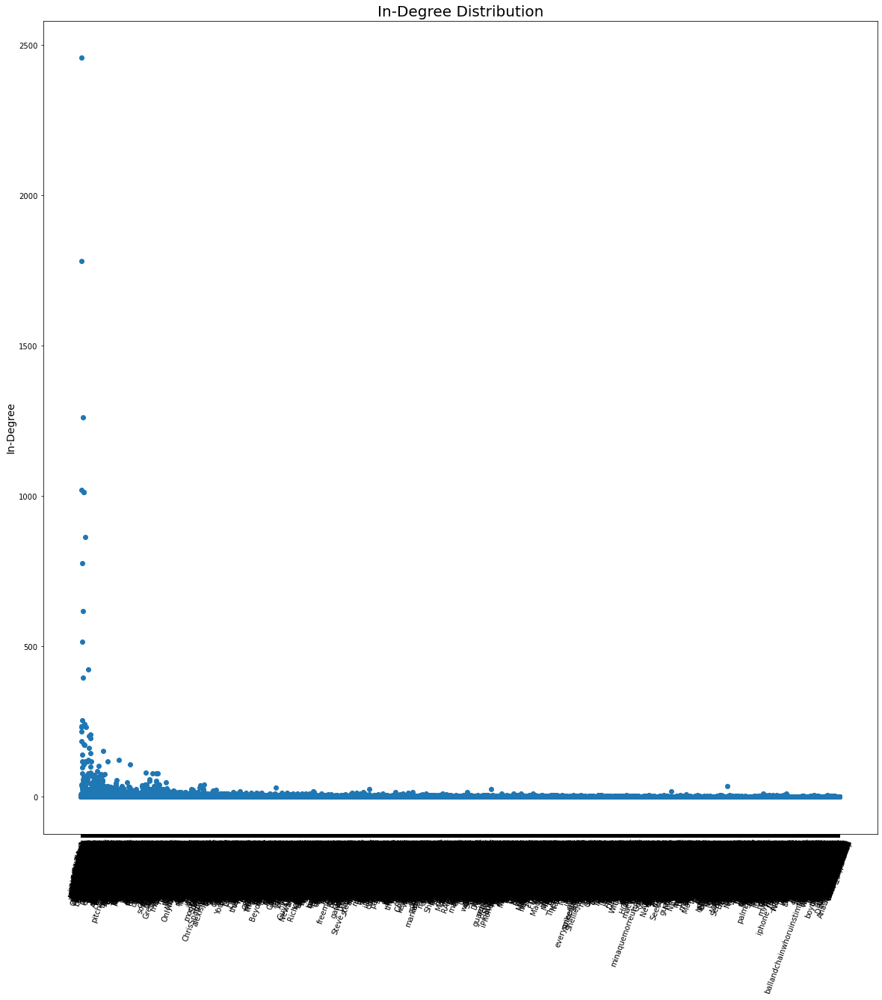

In [15]:
# 3 - Degree Distribution

import numpy as np

# save the aliases and their respective in-degrees separately
in_alias = list(zip(*in_degree))[0]
inDegree = list(zip(*in_degree))[1]

# Plotting degree distribution for in-degree using scatter plot
plt.figure(figsize=(20,20))
plt.scatter(in_alias, inDegree)
plt.xticks(rotation=70)
plt.ylabel('In-Degree', fontsize=14)
plt.title('In-Degree Distribution', fontsize=20)
plt.show()

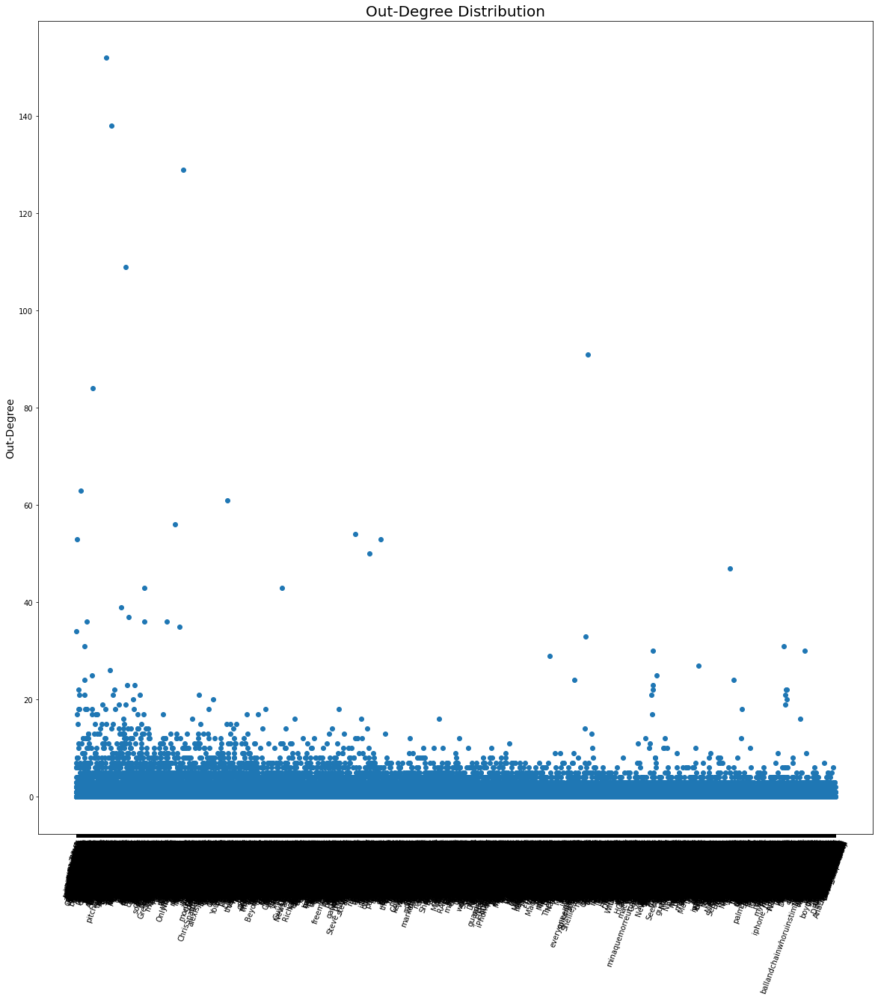

In [16]:
# 3 - cont...

# save the aliases and their respective out-degrees separately
out_alias = list(zip(*out_degree))[0]
outDegree = list(zip(*out_degree))[1]

#Plotting the out-degree distribution scatter plot
plt.figure(figsize=(20,20))
plt.scatter(out_alias, outDegree)
plt.xticks(rotation=70)
plt.ylabel('Out-Degree', fontsize=14)
plt.title('Out-Degree Distribution', fontsize=20)
plt.show()

In [17]:
# importing mean() 
from statistics import mean 

# Calculate the min, max, range and average degree (in-degree and out-degree respectively)

inDeg_min = min(inDegree)
inDeg_max = max(inDegree)
inDeg_range = inDeg_max - inDeg_min
inDeg_average = mean(inDegree)
print("In-Degree additional metrics:\n------------------------------\n")
print(f"Min: {inDeg_min}")
print(f"Max: {inDeg_max}")
print(f"Range: {inDeg_range}")
print(f"Average: {inDeg_average}\n\n")

outDeg_min = min(outDegree)
outDeg_max = max(outDegree)
outDeg_range = outDeg_max - outDeg_min
outDeg_average = mean(outDegree)
print("Out-Degree additional metrics:\n------------------------------\n")
print(f"Min: {outDeg_min}")
print(f"Max: {outDeg_max}")
print(f"Range: {outDeg_range}")
print(f"Average: {outDeg_average}\n")

In-Degree additional metrics:
------------------------------

Min: 0
Max: 2458
Range: 2458
Average: 1.047009067121037


Out-Degree additional metrics:
------------------------------

Min: 0
Max: 152
Range: 152
Average: 1.047009067121037



In [18]:
# 4 - Average Path Length

uG = G.to_undirected() # converting directed graph to undirected

# Looping through every connected component in undirected graph,
# and for each component, extract a copy of this component's subgraph and store it inside a list
components = [uG.subgraph(c).copy() for c in nx.connected_components(uG)]

# Outputting every component's subgraph average shortest path length
print("Component\tAverage Shortest Path Length")
print("---------------------------------------------")
for index,g in enumerate(components,start=1):
    print(f"{index}\t\t{nx.average_shortest_path_length(g)}")


Component	Average Shortest Path Length
---------------------------------------------
1		6.0529681977537955
2		1.0
3		2.1904761904761907
4		1.0
5		1.0
6		1.0
7		1.0
8		1.0
9		1.0
10		2.0
11		1.3333333333333333
12		1.6666666666666667
13		1.0
14		1.3333333333333333
15		1.3333333333333333
16		1.0
17		1.8666666666666667
18		1.0
19		1.0
20		1.0
21		1.0
22		1.0
23		1.0
24		1.0
25		1.0
26		1.0
27		1.0
28		1.8666666666666667
29		1.0
30		1.0
31		1.0
32		1.0
33		1.0
34		1.6
35		1.3333333333333333
36		1.0
37		1.9333333333333333
38		1.0
39		1.0
40		1.0
41		1.0
42		1.0
43		1.0
44		1.0
45		1.0
46		1.3333333333333333
47		1.3333333333333333
48		1.0
49		1.0
50		1.0
51		1.0
52		1.3333333333333333
53		1.0
54		1.0
55		1.0
56		1.3333333333333333
57		1.0
58		1.0
59		1.9333333333333333
60		1.0
61		1.0
62		1.0
63		1.6
64		2.3333333333333335
65		1.0
66		1.0
67		1.0
68		1.0
69		1.0
70		1.0
71		1.0
72		1.3333333333333333
73		1.0
74		2.0
75		1.3333333333333333
76		1.3333333333333333
77		1.0
78		1.0
79		1.333333333

1520		1.5
1521		0
1522		1.0
1523		1.0
1524		1.6666666666666667
1525		1.0
1526		1.0
1527		1.0
1528		1.0
1529		1.0
1530		1.5
1531		1.3333333333333333
1532		1.0
1533		1.0
1534		1.0
1535		1.0
1536		1.0
1537		1.0
1538		1.0
1539		1.0
1540		1.0
1541		1.0
1542		1.0
1543		1.0
1544		1.6666666666666667
1545		1.0
1546		1.3333333333333333
1547		1.0
1548		1.0
1549		1.0
1550		2.0
1551		1.0
1552		1.0
1553		1.0
1554		1.0
1555		1.0
1556		1.0
1557		1.0
1558		1.3333333333333333
1559		1.0
1560		1.9285714285714286
1561		1.0
1562		1.0
1563		1.0
1564		1.0
1565		1.3333333333333333
1566		1.0
1567		1.0
1568		1.3333333333333333
1569		1.0
1570		1.5
1571		1.0
1572		1.3333333333333333
1573		1.0
1574		1.0
1575		1.0
1576		1.0
1577		1.3333333333333333
1578		1.0
1579		1.5
1580		1.0
1581		1.0
1582		1.0
1583		1.6
1584		1.0
1585		1.0
1586		1.5
1587		1.6666666666666667
1588		1.0
1589		1.0
1590		1.0
1591		1.0
1592		1.0
1593		1.3333333333333333
1594		0
1595		1.0
1596		1.5
1597		1.0
1598		1.3333333333333333
1599		1.0
1600		1.0

3020		1.0
3021		1.0
3022		1.0
3023		1.8
3024		1.0
3025		1.6666666666666667
3026		1.0
3027		1.0
3028		1.0
3029		1.0
3030		1.0
3031		1.0
3032		1.3333333333333333
3033		1.3333333333333333
3034		1.0
3035		1.75
3036		1.0
3037		1.0
3038		1.0
3039		1.0
3040		1.0
3041		1.0
3042		1.0
3043		1.0
3044		1.0
3045		1.0
3046		1.0
3047		1.0
3048		1.0
3049		1.0
3050		1.0
3051		1.3333333333333333
3052		1.8
3053		1.0
3054		1.0
3055		1.0
3056		1.0
3057		1.0
3058		1.3333333333333333
3059		1.0
3060		1.3333333333333333
3061		1.0
3062		1.0
3063		1.0
3064		1.0
3065		1.0
3066		0
3067		1.0
3068		1.0
3069		1.0
3070		1.0
3071		1.0
3072		1.0
3073		1.3333333333333333
3074		1.0
3075		1.3333333333333333
3076		1.0
3077		1.6666666666666667
3078		1.0
3079		1.0
3080		1.0
3081		1.0
3082		1.0
3083		1.0
3084		1.0
3085		1.3333333333333333
3086		1.0
3087		1.3333333333333333
3088		1.6
3089		1.3333333333333333
3090		1.0
3091		1.0
3092		1.0
3093		1.0
3094		1.7333333333333334
3095		2.107142857142857
3096		1.0
3097		1.0
3098		1.0
30

4519		1.0
4520		1.3333333333333333
4521		1.0
4522		1.3333333333333333
4523		1.0
4524		1.0
4525		1.0
4526		1.0
4527		1.3333333333333333
4528		1.0
4529		1.0
4530		1.0
4531		1.3333333333333333
4532		1.0
4533		1.0
4534		1.0
4535		0
4536		1.0
4537		1.3333333333333333
4538		1.0
4539		1.3333333333333333
4540		1.0
4541		1.9047619047619047
4542		1.0
4543		1.0
4544		1.0
4545		1.0
4546		1.0
4547		1.0
4548		1.0
4549		1.0
4550		1.6666666666666667
4551		1.0
4552		1.6666666666666667
4553		1.0
4554		1.0
4555		1.0
4556		1.3333333333333333
4557		1.0
4558		1.0
4559		1.0
4560		1.0
4561		1.0
4562		1.3333333333333333
4563		1.0
4564		1.0
4565		1.0
4566		1.0
4567		1.3333333333333333
4568		1.0
4569		1.0
4570		1.0
4571		1.0
4572		1.0
4573		1.0
4574		1.0
4575		1.0
4576		1.3333333333333333
4577		2.0
4578		1.3333333333333333
4579		1.0
4580		1.0
4581		0
4582		1.3333333333333333
4583		1.0
4584		1.3333333333333333
4585		1.0
4586		1.0
4587		1.0
4588		1.0
4589		1.0
4590		1.0
4591		1.0
4592		1.0
4593		1.0
4594		1.0
4595

6019		1.0
6020		1.0
6021		1.0
6022		1.0
6023		1.0
6024		1.0
6025		1.0
6026		1.8
6027		1.0
6028		1.3333333333333333
6029		1.0
6030		1.0
6031		1.3333333333333333
6032		1.0
6033		1.0
6034		1.0
6035		1.3333333333333333
6036		1.0
6037		1.3333333333333333
6038		1.0
6039		1.3333333333333333
6040		1.0
6041		1.0
6042		1.0
6043		1.3333333333333333
6044		1.0
6045		1.6666666666666667
6046		1.0
6047		1.0
6048		1.0
6049		1.0
6050		1.0
6051		1.0
6052		1.0
6053		1.0
6054		1.0
6055		1.0
6056		1.0
6057		1.0
6058		1.0
6059		1.0
6060		1.0
6061		1.0
6062		1.0
6063		1.0
6064		1.0
6065		1.0
6066		2.4761904761904763
6067		1.0
6068		1.0
6069		1.3333333333333333
6070		1.0
6071		1.0
6072		1.6666666666666667
6073		1.3333333333333333
6074		1.0
6075		1.0
6076		1.0
6077		1.0
6078		1.3333333333333333
6079		1.3333333333333333
6080		1.0
6081		1.0
6082		1.0
6083		1.0
6084		1.0
6085		1.3333333333333333
6086		1.0
6087		1.0
6088		1.0
6089		1.0
6090		1.0
6091		1.0
6092		0
6093		1.3333333333333333
6094		1.0
6095		1.0
6096		1

7518		1.0
7519		1.0
7520		1.3333333333333333
7521		1.0
7522		1.0
7523		1.0
7524		1.0
7525		1.0
7526		1.8666666666666667
7527		1.0
7528		1.0
7529		1.0
7530		1.3333333333333333
7531		1.0
7532		1.7142857142857142
7533		1.0
7534		1.0
7535		1.0
7536		1.3333333333333333
7537		1.0
7538		1.3333333333333333
7539		1.0
7540		1.0
7541		1.3333333333333333
7542		1.0
7543		1.0
7544		1.0
7545		1.0
7546		1.0
7547		1.0
7548		1.6666666666666667
7549		1.0
7550		1.0
7551		1.0
7552		1.0
7553		1.0
7554		1.3333333333333333
7555		1.0
7556		1.0
7557		1.0
7558		1.0
7559		1.3333333333333333
7560		1.0
7561		1.0
7562		1.0
7563		1.0
7564		1.0
7565		1.0
7566		1.3333333333333333
7567		1.0
7568		1.0
7569		1.0
7570		1.0
7571		1.0
7572		1.0
7573		1.0
7574		1.0
7575		1.0
7576		1.0
7577		1.0
7578		1.0
7579		1.0
7580		1.0
7581		1.0
7582		1.0
7583		1.0
7584		1.0
7585		1.0
7586		1.0
7587		1.0
7588		1.0
7589		1.0
7590		1.0
7591		1.0
7592		1.3333333333333333
7593		1.0
7594		1.0
7595		1.0
7596		1.0
7597		1.0
7598		1.0
7599		1.0


9018		1.0
9019		1.0
9020		1.0
9021		1.0
9022		1.5
9023		1.8461538461538463
9024		1.0
9025		1.0
9026		1.0
9027		1.0
9028		1.0
9029		1.0
9030		1.0
9031		1.0
9032		1.0
9033		1.3333333333333333
9034		1.0
9035		1.0
9036		1.6
9037		1.0
9038		1.0
9039		1.0
9040		1.0
9041		1.0
9042		1.3333333333333333
9043		0
9044		1.0
9045		1.0
9046		1.0
9047		1.0
9048		1.0
9049		1.0
9050		1.0
9051		1.0
9052		1.0
9053		1.0
9054		1.0
9055		1.0
9056		1.0
9057		1.0
9058		1.0
9059		1.0
9060		1.0
9061		1.0
9062		1.0
9063		1.0
9064		1.0
9065		1.0
9066		1.0
9067		1.0
9068		1.0
9069		1.0
9070		1.0
9071		1.0
9072		1.0
9073		1.0
9074		1.0
9075		1.0
9076		1.0
9077		1.0
9078		1.0
9079		1.0
9080		1.0
9081		1.0
9082		1.0
9083		1.0
9084		1.0
9085		1.0
9086		1.0
9087		1.0
9088		1.0
9089		1.0
9090		1.3333333333333333
9091		1.0
9092		1.0
9093		1.0
9094		1.0
9095		1.0
9096		1.0
9097		1.0
9098		1.0
9099		1.0
9100		1.0
9101		1.0
9102		1.0
9103		1.3333333333333333
9104		1.0
9105		1.0
9106		2.066666666666667
9107		1.333333333333333

10517		1.0
10518		1.0
10519		1.0
10520		1.0
10521		1.0
10522		1.0
10523		1.0
10524		1.0
10525		1.0
10526		1.0
10527		1.0
10528		1.3333333333333333
10529		1.0
10530		1.0
10531		1.0
10532		1.0
10533		1.0
10534		1.0
10535		1.3333333333333333
10536		1.0
10537		1.5
10538		1.0
10539		1.0
10540		1.0
10541		1.0
10542		1.0
10543		1.0
10544		1.0
10545		1.0
10546		1.0
10547		1.0
10548		1.3333333333333333
10549		1.0
10550		1.0
10551		1.0
10552		1.0
10553		1.0
10554		1.0
10555		1.0
10556		1.5
10557		1.0
10558		1.0
10559		1.0
10560		1.0
10561		1.0
10562		1.0
10563		1.0
10564		1.0
10565		1.0
10566		1.0
10567		1.0
10568		1.0
10569		1.0
10570		1.0
10571		1.0
10572		1.0
10573		1.0
10574		1.0
10575		1.0
10576		1.0
10577		0
10578		1.0
10579		1.0
10580		1.0
10581		1.0
10582		1.0
10583		1.0
10584		1.0
10585		1.0
10586		1.0
10587		1.3333333333333333
10588		1.3333333333333333
10589		1.0
10590		1.0
10591		1.0
10592		1.0
10593		1.0
10594		1.0
10595		1.0
10596		1.0
10597		1.3333333333333333
10598		1.333333333333

In [19]:
# 5 - Global Clustering Coefficient

gcc = nx.average_clustering(G) # computing the global clustering coefficient
print(f"Global Clustering Coefficient: {gcc}")

#cc = nx.clustering(G) # calculating clustering coefficient for every node in graph
#print(cc)

Global Clustering Coefficient: 0.020238935350867363


## Challenges Encountered in this Section

The first challenge which I encountered was that when creating the scatter plots for both the in-degree and out-degree of nodes. First of all, I chose scatter plots over histograms (or bar charts) since they are more ideal  for larger graphs. Due to the large dataset and that jupyter notebook does provide large outputs, the names in the x-axis are cramped up and the plot values are also slightly cramped up (however, you could still tell the difference).

Moreover, another challenge encountered was that when computing the average spath length of the graph. Since the graph is disconnected, it is not possible to just calculate the path lengths because some paths to certain nodes simply does not exist. Hence, an error would be encountered. However, to solve this issue, I converted the graph into an undirected graph. As a result, I was able to extract a copy of the subgraphs of each connected component of the original graph. Therefore, after this process, I ended up with a list of components (a component is made up of the connected subgraph in original graph) and hence, I was able to compute the average path length for each of these components.

## Observations Outlined from Computed Metrics

### Size of Directed Graph

Knowing the size of the graph prior to working out analyses on it is crucial. Therefore, I computed the number of nodes and edges which are present in this graph. From the results obtained, I was able to tell that the graph which I am going to work on is quite large (contains many nodes than edges - more edges than nodes).

### In/Out Degree for each Node

Both the in and out degrees of each node gives us important information on the graph. The in-degree of each node contributes to the number of edges that are incident to this node whilst the out-degree contributes to the number of edges that leave this node. Hence, the in-degree shows us how many users have mentioned the particular node whilst the out-degree shows us how many a node mentions other users. Therefore, the greater the in-degree of a node, the more popular that node is likely to be whilst the greater the out-degree of a node means the more users that node is mentionning.

### Degree Distribution

To have a general idea on the distribution of the in-degree and out-degree of each node, a scatter diagrams were plotted to show this distribution. As previously mentionned, scatter plots were used because they are more ideal for larger sized graph. Two diagrams were plotted, one for each degree. Moreover, to better understand each plot, other statistics were computed. These include min, max, range and average degrees. From the scatter plot of the in-degree distribution, it can be noted that there is a large discrepency in values (the range) and the maximum value is quite significant when compared to the minimum value. However, it can be deduced from the diagram that the majority of nodes have their in-degree between 0 and 250, whilst there are a minority of other nodes with a much higher in-degree. As for the out-degree distribution diagram, the range of values is much less. Moreover, from the diagram it can be noted that the majority of nodes have an out-degree which is less than 40.

### Average Path Length

To calculate the average path length of the graph G, this graph must be connected. However, the graph created is a disconnected graph containing several components. Therefore, to calculate the path length of each component, it was vital to extract the connected components in the graph and then calculate the average path length of this sub-graph.

Hence, this average shortest path length of each component shows us how large/small that connected component is. Thus, the fact that there are many components (connected subgraphs) within the original graph G, this shows us that G is a very disconnected graph. 

### Global Clustering Coefficient

Local Clustering Coefficient shows the cohesiveness of the neighbourhood of a node and it can be computed for all individual nodes in the graph. Therefore, global clustering coefficient shows us an averaged out clusering coefficient and provides information about the cohesiveness within the whole graph. The fact that the latter computation is 0.0202 shows us that the graph is not cohesive. This value completely complements previous calculations which shows that the graph is highly disconnected.

## Giant Components

After computing and analysing the above statistics, it can be deduced that there are a few giant components in the graph. The largest giant component is component number 1 having its average path length of 6.053. This component is much denser than any other component and hence, it is likely to conitinue expand the more the network enlarges.

## Section 3

In this section, first calculate the centrality mentions and then determine the top 10 users based on these calculations.

### Centrality Measures

Calculate:

    1. Degree centrality
    2. Closeness centrality
    3. Betweeness centrality

The degree centrality of a node shows the importance of the node based on its degree. Hence, more nodes connected, the higher this measure. Therefore, those nodes that have a high degree centrality measure means that these nodes are strongly connected.

In [20]:
# 1 - Degree Centrality

deg_cen = nx.degree_centrality(G)

print("User\t\t\t Degree Centrality")
print("----------------------------------------------------")
for x,y in deg_cen.items():
    print(x+"\t\t",y)

#print(deg_cen)

User			Degree Centrality
----------------------------------------------------
cameron987		 4.564056533446928e-05
beatrizchavez		 1.5213521778156426e-05
jeremyscheller		 1.5213521778156426e-05
kshepherd		 0.00013692169600340782
blakespot		 0.00015213521778156426
arnoldkim		 0.00010649465244709498
dreadpiratepj		 0.00024341634845050282
bdudney		 7.606760889078213e-05
snappytouch		 7.606760889078213e-05
mobileorchard		 7.606760889078213e-05
GrouchoDuke		 1.5213521778156426e-05
phatemokid		 3.0427043556312852e-05
kerotab		 3.0427043556312852e-05
mstg0901		 1.5213521778156426e-05
iphonefan		 0.002829715050737095
tiffrocking		 1.5213521778156426e-05
silvermullet		 1.5213521778156426e-05
jetforme		 4.564056533446928e-05
flyingjenny		 7.606760889078213e-05
absolutspacegrl		 6.0854087112625704e-05
justex07		 7.606760889078213e-05
kaleb1983		 3.0427043556312852e-05
razorianfly		 0.0011258006115835756
kkob		 0.00010649465244709498
gaysexstories		 6.0854087112625704e-05
kruustyy		 1.52135217781564

grantinatorplus		 1.5213521778156426e-05
eblouissant		 1.5213521778156426e-05
JesseNewhart		 4.564056533446928e-05
wholesick		 1.5213521778156426e-05
the_grosse		 1.5213521778156426e-05
theultravisitor		 1.5213521778156426e-05
apinaud		 7.606760889078213e-05
mmbkaajn		 3.0427043556312852e-05
ckfio		 6.0854087112625704e-05
gruber		 0.0015517792213719554
ezjensen		 3.0427043556312852e-05
spsweetsunshine		 3.0427043556312852e-05
Michael		 1.5213521778156426e-05
Pickering		 3.0427043556312852e-05
oakvillerealtor		 1.5213521778156426e-05
BuzzBuzzHome		 1.5213521778156426e-05
i_david		 1.5213521778156426e-05
JanOelze		 1.5213521778156426e-05
itzabitza		 1.5213521778156426e-05
ICToys		 1.5213521778156426e-05
emwilli		 1.5213521778156426e-05
luke_mtl		 1.5213521778156426e-05
soph		 1.5213521778156426e-05
benku		 6.0854087112625704e-05
samus_michael		 1.5213521778156426e-05
jasonhiner		 0.0004107650880102235
bone433		 1.5213521778156426e-05
canislatrans		 1.5213521778156426e-05
jasonmancebo		 4

lesthermosh		 1.5213521778156426e-05
espyder		 1.5213521778156426e-05
shawnson5		 1.5213521778156426e-05
anarchistbrow		 1.5213521778156426e-05
trevorpressman		 9.128113066893856e-05
AllThingsiPhone		 0.00038033804445391063
barrygee		 3.0427043556312852e-05
scottbrac		 1.5213521778156426e-05
scottbrad		 1.5213521778156426e-05
brianpauley		 1.5213521778156426e-05
spencerjw		 7.606760889078213e-05
thesandman27		 3.0427043556312852e-05
bobcats9498		 4.564056533446928e-05
Enfermero11		 1.5213521778156426e-05
brianratzker		 1.5213521778156426e-05
MatchesMalone		 1.5213521778156426e-05
ghozali		 0.00012170817422525141
5Great		 7.606760889078213e-05
flyairnz		 9.128113066893856e-05
linuxluver		 6.0854087112625704e-05
SebastienPage		 0.0008063166542422906
db		 0.00038033804445391063
status247		 3.0427043556312852e-05
ffvip		 1.5213521778156426e-05
trendingtoday		 0.00010649465244709498
gardnerscot		 3.0427043556312852e-05
allen099		 0.0001673487395597207
maxwelljohn		 1.5213521778156426e-05
cp

moneymike7		 1.5213521778156426e-05
mrsclanahan		 1.5213521778156426e-05
sccfan48		 1.5213521778156426e-05
mannyfrizzle		 1.5213521778156426e-05
kristenmchugh22		 4.564056533446928e-05
Agent_M		 1.5213521778156426e-05
snyderguy		 1.5213521778156426e-05
jasonbrad		 1.5213521778156426e-05
gheer		 1.5213521778156426e-05
vajramati		 1.5213521778156426e-05
gregheffernan		 1.5213521778156426e-05
kemari		 3.0427043556312852e-05
ultimatelibrarn		 3.0427043556312852e-05
krafty		 4.564056533446928e-05
bighurt1130		 1.5213521778156426e-05
superstarluis		 4.564056533446928e-05
randy_roman		 1.5213521778156426e-05
meanmauri		 1.5213521778156426e-05
homiesradio		 1.5213521778156426e-05
yuryprimakov		 1.5213521778156426e-05
mabel3000		 1.5213521778156426e-05
luisinio		 1.5213521778156426e-05
timjennion		 6.0854087112625704e-05
carolzara		 3.0427043556312852e-05
somewhatj8ed		 1.5213521778156426e-05
kylehenson		 1.5213521778156426e-05
teresa_k		 1.5213521778156426e-05
rhdesign		 3.0427043556312852e-05

richardlai		 0.0004259786097883799
magicmarc		 1.5213521778156426e-05
8a22a		 0.00015213521778156426
PeterYanTV		 6.0854087112625704e-05
questlove		 0.0001673487395597207
joshuatopolsky		 0.00015213521778156426
donfubar		 4.564056533446928e-05
Battlestars		 1.5213521778156426e-05
iFixit		 1.5213521778156426e-05
midy		 1.5213521778156426e-05
rabbireport		 1.5213521778156426e-05
igncom		 0.00010649465244709498
iLevi		 0.001141014133361732
SloweIGN		 1.5213521778156426e-05
kahugary		 1.5213521778156426e-05
kaimai		 1.5213521778156426e-05
customright		 1.5213521778156426e-05
tarynp		 3.0427043556312852e-05
SeanDonahoe		 0.00019777578311603352
mrokcrealestate		 1.5213521778156426e-05
AddToAny		 0.0004716191751228492
chrishannon		 1.5213521778156426e-05
dillacom		 1.5213521778156426e-05
eejay		 6.0854087112625704e-05
whatspyi		 6.0854087112625704e-05
zimmer589		 1.5213521778156426e-05
Dj_Zerok		 1.5213521778156426e-05
ajlawrence		 1.5213521778156426e-05
rouvensiegler		 1.5213521778156426e-05

Jnash4		 1.5213521778156426e-05
villatour		 6.0854087112625704e-05
technogadgets		 1.5213521778156426e-05
mrs_gekko		 1.5213521778156426e-05
Technogadgets		 3.0427043556312852e-05
authentic_lisa		 1.5213521778156426e-05
c0diq		 6.0854087112625704e-05
etaygafni		 3.0427043556312852e-05
hiredog		 1.5213521778156426e-05
soff987		 1.5213521778156426e-05
earcos		 0.00013692169600340782
tipodgraphic		 3.0427043556312852e-05
mcontreras		 7.606760889078213e-05
lgladdy		 1.5213521778156426e-05
hugomaesta		 4.564056533446928e-05
info_plantao		 0.0002282028266723464
adnews_com_br		 3.0427043556312852e-05
pmsexgeek		 1.5213521778156426e-05
lackriver		 1.5213521778156426e-05
sliff101		 1.5213521778156426e-05
deoxys94		 1.5213521778156426e-05
lfabara		 1.5213521778156426e-05
gusfalconi		 1.5213521778156426e-05
stopmotionjosh		 3.0427043556312852e-05
hodapp		 7.606760889078213e-05
chellyelley		 3.0427043556312852e-05
CINDERELLA_JOE		 1.5213521778156426e-05
ChellyElley		 1.5213521778156426e-05
draccah

rww		 0.0006237543929044134
SweepsAdvantage		 1.5213521778156426e-05
squaretrackle		 0.0021298930489418995
dynoem		 1.5213521778156426e-05
missmillions		 3.0427043556312852e-05
iamDJExplicit		 3.0427043556312852e-05
JaiMonet		 1.5213521778156426e-05
playful_cyanide		 4.564056533446928e-05
trashpixels		 7.606760889078213e-05
lukekarrys		 1.5213521778156426e-05
kinchyuk		 3.0427043556312852e-05
oneals2focus		 1.5213521778156426e-05
erikamoen		 3.0427043556312852e-05
Plustenstrength		 4.564056533446928e-05
PlusTenStrength		 1.5213521778156426e-05
marshaward		 4.564056533446928e-05
ColleenLindsay		 4.564056533446928e-05
ihartdanada		 6.0854087112625704e-05
cosmic_crash777		 1.5213521778156426e-05
jakeoh3		 1.5213521778156426e-05
ndcooper		 1.5213521778156426e-05
PimpYourMac		 3.0427043556312852e-05
elevashan		 1.5213521778156426e-05
leaky_tiki		 7.606760889078213e-05
amirj		 1.5213521778156426e-05
jyri		 3.0427043556312852e-05
prox_		 3.0427043556312852e-05
MichaelSeidlitzRT		 1.5213521778

kingj2005		 6.0854087112625704e-05
SexyLiah		 6.0854087112625704e-05
kevinnorman		 7.606760889078213e-05
mlantz		 1.5213521778156426e-05
jbc95a		 4.564056533446928e-05
ltrainrc		 1.5213521778156426e-05
tashacdean		 9.128113066893856e-05
francescomugnai		 3.0427043556312852e-05
workforfood		 1.5213521778156426e-05
seth_weisfeld		 1.5213521778156426e-05
regalbear		 4.564056533446928e-05
jeremybell		 7.606760889078213e-05
gteehan		 0.00015213521778156426
mikeypage10		 1.5213521778156426e-05
haruszpapa		 1.5213521778156426e-05
aimeelc		 1.5213521778156426e-05
iamtone		 3.0427043556312852e-05
MB4728370		 1.5213521778156426e-05
sweetpeatreats		 3.0427043556312852e-05
iluvcuppycakes		 6.0854087112625704e-05
tokidokiii		 1.5213521778156426e-05
bruceshriver		 3.0427043556312852e-05
commonknow		 1.5213521778156426e-05
wmanos		 1.5213521778156426e-05
audreyrae		 3.0427043556312852e-05
ernestkoe		 7.606760889078213e-05
jfwalzer		 1.5213521778156426e-05
istewart		 1.5213521778156426e-05
sexyliah		 

applexpertWhat		 1.5213521778156426e-05
iPhonespaz		 3.0427043556312852e-05
jeff_lamarche		 6.0854087112625704e-05
sbostedor		 0.00010649465244709498
crackberrykevin		 1.5213521778156426e-05
palmsolo		 0.00010649465244709498
bcharb		 1.5213521778156426e-05
katie_lou		 1.5213521778156426e-05
CirqueLasVegas		 3.0427043556312852e-05
katyjoy		 1.5213521778156426e-05
kjoysanders		 1.5213521778156426e-05
cbucket29		 4.564056533446928e-05
BornKing15		 1.5213521778156426e-05
derusingram		 1.5213521778156426e-05
DonnyBangs		 1.5213521778156426e-05
jessicabogard		 1.5213521778156426e-05
piano88keys		 1.5213521778156426e-05
hatch2		 3.0427043556312852e-05
brandonpittman		 1.5213521778156426e-05
Knunez		 1.5213521778156426e-05
kennyb52		 1.5213521778156426e-05
jonathanbobbitt		 4.564056533446928e-05
Jordandlloyd		 1.5213521778156426e-05
PresLincoln		 1.5213521778156426e-05
jeffcoffee		 0.00010649465244709498
chuckiem		 1.5213521778156426e-05
Snubs		 3.0427043556312852e-05
robblatt		 4.564056533446

tabfurtado		 1.5213521778156426e-05
shinichiro_beck		 0.00025862987022865923
Tetsuya_Hara		 7.606760889078213e-05
BreakingNews		 0.00013692169600340782
yabush		 4.564056533446928e-05
touch_lab		 0.0004107650880102235
tsuruaki		 1.5213521778156426e-05
licca_kawanishi		 3.0427043556312852e-05
richiety		 7.606760889078213e-05
toucharcade		 0.00027384339200681564
racheljameson		 1.5213521778156426e-05
krea_frobro747		 9.128113066893856e-05
seanchoe		 7.606760889078213e-05
russeltarr		 4.564056533446928e-05
hyeryong		 0.00012170817422525141
llamachloe		 3.0427043556312852e-05
yusuke0927		 6.0854087112625704e-05
tlend		 1.5213521778156426e-05
stego_smahsh		 1.5213521778156426e-05
ierika		 1.5213521778156426e-05
pinkiepr0mis3		 1.5213521778156426e-05
dingmara		 1.5213521778156426e-05
cfairbank		 1.5213521778156426e-05
j_clayton		 1.5213521778156426e-05
brittdainard		 1.5213521778156426e-05
jakerains		 1.5213521778156426e-05
allisonmack		 1.5213521778156426e-05
emerywells		 1.5213521778156426e

keyvisuals		 4.564056533446928e-05
mohammedyassin		 1.5213521778156426e-05
taiiiiii		 1.5213521778156426e-05
prettied		 1.5213521778156426e-05
jsabia85		 1.5213521778156426e-05
saka		 7.606760889078213e-05
Woggieeee		 1.5213521778156426e-05
sunflat		 3.0427043556312852e-05
gsempe		 7.606760889078213e-05
OurielOhayon		 0.00012170817422525141
annafran		 1.5213521778156426e-05
theshorneagle		 1.5213521778156426e-05
rebatezoo		 1.5213521778156426e-05
topamazonsaving		 1.5213521778156426e-05
fotus4		 3.0427043556312852e-05
tayzar44		 4.564056533446928e-05
mkeroles		 1.5213521778156426e-05
ryankester		 4.564056533446928e-05
Mac42az		 1.5213521778156426e-05
CobraCommander		 0.00021298930489418996
virtualhostel		 4.564056533446928e-05
HIUSA		 1.5213521778156426e-05
TripIt		 1.5213521778156426e-05
superfro432		 3.0427043556312852e-05
iceburghNHL		 6.0854087112625704e-05
smokebot		 1.5213521778156426e-05
yiddle		 1.5213521778156426e-05
Crenn1e		 1.5213521778156426e-05
dalsr		 3.0427043556312852e

marymissie		 1.5213521778156426e-05
thomasmiesen		 1.5213521778156426e-05
hsenden		 0.00010649465244709498
iphone3gspeed		 4.564056533446928e-05
100vaders		 1.5213521778156426e-05
RoelJewel		 1.5213521778156426e-05
tom_beek		 7.606760889078213e-05
iamjmurda		 1.5213521778156426e-05
basv		 0.00010649465244709498
michielveenstra		 0.00027384339200681564
AlexanderNL		 0.0001673487395597207
nieuwstip		 1.5213521778156426e-05
istayfly1985		 1.5213521778156426e-05
SneakerQueen		 1.5213521778156426e-05
federicacau		 1.5213521778156426e-05
thelancelife		 6.0854087112625704e-05
antnas		 4.564056533446928e-05
shaunau		 9.128113066893856e-05
leeadkins		 1.5213521778156426e-05
smiffytech		 1.5213521778156426e-05
johndmitchell		 1.5213521778156426e-05
Fin4Founders		 3.0427043556312852e-05
medmacs		 0.0001673487395597207
MedDevicenews		 1.5213521778156426e-05
aycandigital		 4.564056533446928e-05
dyohanan		 4.564056533446928e-05
rickross10		 1.5213521778156426e-05
HGreenwood		 7.606760889078213e-05
m

promiseringer		 1.5213521778156426e-05
the_real_cyBer		 1.5213521778156426e-05
Tomal_Celebrate		 1.5213521778156426e-05
baquier		 1.5213521778156426e-05
madres		 1.5213521778156426e-05
tandylyons		 3.0427043556312852e-05
idragitdotcom		 1.5213521778156426e-05
Lawrence1977		 1.5213521778156426e-05
joaopaiva		 1.5213521778156426e-05
spendous		 1.5213521778156426e-05
triptych		 1.5213521778156426e-05
chooseareality		 1.5213521778156426e-05
idigdesign		 4.564056533446928e-05
alicefujimori		 1.5213521778156426e-05
egately		 4.564056533446928e-05
magicofpi		 0.00010649465244709498
Yoda808		 1.5213521778156426e-05
SocialNetworkTV		 1.5213521778156426e-05
northernsweetie		 1.5213521778156426e-05
hattonmike		 1.5213521778156426e-05
agdtinman		 3.0427043556312852e-05
VenusEnvy		 3.0427043556312852e-05
LonoSG		 1.5213521778156426e-05
kanahina		 1.5213521778156426e-05
champuru		 0.00019777578311603352
dravir		 1.5213521778156426e-05
raphaelrojas		 1.5213521778156426e-05
penguinsdofly		 1.521352177

juergenzahrl		 3.0427043556312852e-05
wdclub33		 1.5213521778156426e-05
megantweets2		 1.5213521778156426e-05
web2ireland		 4.564056533446928e-05
hansmampaey		 1.5213521778156426e-05
JoeyShenouda		 1.5213521778156426e-05
leumund		 0.00012170817422525141
evernote		 0.000608540871126257
rolik		 6.0854087112625704e-05
Silbendrechsler		 1.5213521778156426e-05
basilakis		 1.5213521778156426e-05
pimpmywordpress		 9.128113066893856e-05
cliveflint		 1.5213521778156426e-05
Hedgewytch		 9.128113066893856e-05
kanttila		 7.606760889078213e-05
VikingTeam		 1.5213521778156426e-05
jhaavisto		 3.0427043556312852e-05
animal_chin_au		 1.5213521778156426e-05
triplejdools		 1.5213521778156426e-05
ekerenefusjon		 1.5213521778156426e-05
GregoryCollinsreading		 1.5213521778156426e-05
computerwoche		 3.0427043556312852e-05
CDernbach		 3.0427043556312852e-05
paulnolan1980		 1.5213521778156426e-05
ewoutwolff		 1.5213521778156426e-05
Jruis		 1.5213521778156426e-05
vigants		 3.0427043556312852e-05
jamihinten		 1.

utzy		 1.5213521778156426e-05
charlesarthur		 9.128113066893856e-05
gabenowak		 3.0427043556312852e-05
medic_ray		 4.564056533446928e-05
zweifuss		 1.5213521778156426e-05
haywardart		 3.0427043556312852e-05
trx314		 3.0427043556312852e-05
papyggek		 1.5213521778156426e-05
bricologiste		 1.5213521778156426e-05
fmeichel		 1.5213521778156426e-05
pink_syd		 1.5213521778156426e-05
mrpaintyman		 1.5213521778156426e-05
wayohoo		 3.0427043556312852e-05
meowcat		 1.5213521778156426e-05
Naringer		 1.5213521778156426e-05
thewightwitch		 1.5213521778156426e-05
daffy_duc		 1.5213521778156426e-05
juris_tweets		 1.5213521778156426e-05
raduboncea		 9.128113066893856e-05
thore_siefke		 9.128113066893856e-05
blingafe		 4.564056533446928e-05
ruhanirabin		 6.0854087112625704e-05
designmeme		 1.5213521778156426e-05
newyorktd		 1.5213521778156426e-05
joedawson		 3.0427043556312852e-05
stechico		 1.5213521778156426e-05
asslleyy		 1.5213521778156426e-05
JayTaj		 1.5213521778156426e-05
smutchings		 3.042704355

nailax		 1.5213521778156426e-05
BuyATT		 1.5213521778156426e-05
roadamp		 4.564056533446928e-05
tutvid		 1.5213521778156426e-05
iPhoneBreaker		 6.0854087112625704e-05
woodleader		 1.5213521778156426e-05
darrylbearce		 4.564056533446928e-05
TheManChild		 3.0427043556312852e-05
NoMoTo		 1.5213521778156426e-05
handmark		 3.0427043556312852e-05
marciomatielo		 1.5213521778156426e-05
SussuaranaCom		 1.5213521778156426e-05
danbec		 4.564056533446928e-05
tripwolf		 1.5213521778156426e-05
rezgo		 1.5213521778156426e-05
mrsmarrero		 4.564056533446928e-05
neilster1		 1.5213521778156426e-05
rd4fun		 1.5213521778156426e-05
Best		 1.5213521778156426e-05
arleigh		 1.5213521778156426e-05
99andbarry		 1.5213521778156426e-05
luukdehaas		 6.0854087112625704e-05
onemorething		 9.128113066893856e-05
dereckbreuning		 4.564056533446928e-05
MartijnSnels		 0.00025862987022865923
Martinkollaard		 1.5213521778156426e-05
Niels_v_R		 1.5213521778156426e-05
bluesky_nl		 6.0854087112625704e-05
JoostBaerveldt		 1.52

lindseycholmes		 1.5213521778156426e-05
LinkedInQueen		 1.5213521778156426e-05
linkz		 1.5213521778156426e-05
militia1989		 4.564056533446928e-05
czarthp		 1.5213521778156426e-05
anoopan		 3.0427043556312852e-05
thej		 1.5213521778156426e-05
RemyaNair		 1.5213521778156426e-05
zawatch		 3.0427043556312852e-05
andayo		 1.5213521778156426e-05
rickdenatale		 1.5213521778156426e-05
benburdick		 1.5213521778156426e-05
whalertly		 1.5213521778156426e-05
blogcritics		 1.5213521778156426e-05
yuyuma		 1.5213521778156426e-05
donaldlhudson		 3.0427043556312852e-05
palpatim		 1.5213521778156426e-05
BaldMan		 3.0427043556312852e-05
zdanev		 1.5213521778156426e-05
pontusjeppsson		 3.0427043556312852e-05
M3Daniel		 6.0854087112625704e-05
3sweden		 0.0002890569137849721
nansepansje		 1.5213521778156426e-05
KeesRomkes		 3.0427043556312852e-05
balty		 0.00015213521778156426
joffrey		 6.0854087112625704e-05
RC_CarnetTechno		 0.00021298930489418996
Coldorak		 3.0427043556312852e-05
Pastagaz		 1.52135217781

bellamy		 0.00012170817422525141
kuswanto		 6.0854087112625704e-05
pinot		 0.00015213521778156426
rezaprabowo		 1.5213521778156426e-05
magpie3d		 1.5213521778156426e-05
alexanderhill		 1.5213521778156426e-05
rado0x54		 1.5213521778156426e-05
elphabapotter		 1.5213521778156426e-05
rubenbos		 1.5213521778156426e-05
a_tse		 3.0427043556312852e-05
dse7e		 6.0854087112625704e-05
mary_joane		 1.5213521778156426e-05
Dse7e		 3.0427043556312852e-05
danfrakesIf		 1.5213521778156426e-05
e_to_the_m		 1.5213521778156426e-05
j_merc_photo		 4.564056533446928e-05
Jasonogrady		 1.5213521778156426e-05
d_almighty		 1.5213521778156426e-05
justinthewhitt		 3.0427043556312852e-05
nocka		 1.5213521778156426e-05
dailyrt		 0.00012170817422525141
dragem		 1.5213521778156426e-05
mpack		 1.5213521778156426e-05
ladyvlad		 1.5213521778156426e-05
vlader		 6.0854087112625704e-05
bryanchaney		 1.5213521778156426e-05
sverde		 3.0427043556312852e-05
fossil12		 7.606760889078213e-05
davesblog_ch		 1.5213521778156426e-05


ChrisJohnRiley		 1.5213521778156426e-05
xme		 1.5213521778156426e-05
Belgiancowboys		 4.564056533446928e-05
uchidakiller		 1.5213521778156426e-05
socialmedialand		 1.5213521778156426e-05
diapaulic		 3.0427043556312852e-05
darceywestcott		 0.00010649465244709498
webconnoisseur		 1.5213521778156426e-05
fusion94		 7.606760889078213e-05
appcelerator		 1.5213521778156426e-05
heysanford		 1.5213521778156426e-05
judestone		 1.5213521778156426e-05
vodafoneuk		 4.564056533446928e-05
jarrodhiggins		 1.5213521778156426e-05
ObjColumnist		 1.5213521778156426e-05
peterc		 1.5213521778156426e-05
ewantoo		 1.5213521778156426e-05
kideternity		 1.5213521778156426e-05
raychl		 9.128113066893856e-05
YoungestMILF		 1.5213521778156426e-05
YoungestMilf		 1.5213521778156426e-05
denpoet		 3.0427043556312852e-05
OnlyValeria		 1.5213521778156426e-05
marsti		 3.0427043556312852e-05
markusmayr		 1.5213521778156426e-05
abpaperie		 1.5213521778156426e-05
jeyeych		 1.5213521778156426e-05
AndUlv		 1.5213521778156426e-

ericfain		 1.5213521778156426e-05
marketermikee		 4.564056533446928e-05
claytonbell		 1.5213521778156426e-05
rogue_veritas		 4.564056533446928e-05
mickogrady		 1.5213521778156426e-05
pblk200937248		 1.5213521778156426e-05
rorodejobaan		 3.0427043556312852e-05
sjefsjef		 1.5213521778156426e-05
wcoburn		 1.5213521778156426e-05
chap_py		 1.5213521778156426e-05
FSQUARE		 1.5213521778156426e-05
axls_iphone		 6.0854087112625704e-05
alexalbrecht		 9.128113066893856e-05
ingridmusic		 1.5213521778156426e-05
hunterzzz		 0.00015213521778156426
tinderflint		 1.5213521778156426e-05
BrandRepublic		 4.564056533446928e-05
melfi		 0.00012170817422525141
mikomercer		 1.5213521778156426e-05
foursquare		 9.128113066893856e-05
the1stdude		 4.564056533446928e-05
_VI		 1.5213521778156426e-05
iFollow_		 0.00010649465244709498
jschomay		 1.5213521778156426e-05
claireyeah		 1.5213521778156426e-05
cazejo		 1.5213521778156426e-05
zelrick		 1.5213521778156426e-05
dkirkward		 1.5213521778156426e-05
xgarriga		 1.521

adlermedrado		 1.5213521778156426e-05
marcelorodrigo		 1.5213521778156426e-05
_jiingo		 1.5213521778156426e-05
asselin		 6.0854087112625704e-05
jcharron		 1.5213521778156426e-05
raphaelhunold		 1.5213521778156426e-05
ManuSupra		 7.606760889078213e-05
taylorsatula		 1.5213521778156426e-05
davemessina79		 1.5213521778156426e-05
dukesantoro		 1.5213521778156426e-05
SirPopper		 3.0427043556312852e-05
mm73		 3.0427043556312852e-05
krisk5		 1.5213521778156426e-05
HairByChrystal		 1.5213521778156426e-05
theboss_edgar		 1.5213521778156426e-05
duarte101		 1.5213521778156426e-05
pscoble		 1.5213521778156426e-05
biphody		 6.0854087112625704e-05
johnperrybarlow		 0.00025862987022865923
tonyvincent		 3.0427043556312852e-05
TelegraphMG		 1.5213521778156426e-05
chanel9019		 1.5213521778156426e-05
puneetsarda		 1.5213521778156426e-05
megazal_rock		 1.5213521778156426e-05
tokiwa_k		 1.5213521778156426e-05
50thousand		 0.00024341634845050282
FiZ		 1.5213521778156426e-05
pcomstock		 1.5213521778156426e-0

MikeHandler		 1.5213521778156426e-05
Robalvey		 1.5213521778156426e-05
justaboutagirl		 4.564056533446928e-05
TakePart		 1.5213521778156426e-05
jkaz		 1.5213521778156426e-05
laurelangelica		 1.5213521778156426e-05
krateo		 1.5213521778156426e-05
nix		 1.5213521778156426e-05
celucine2009		 1.5213521778156426e-05
astoryteller		 1.5213521778156426e-05
ericwyman		 1.5213521778156426e-05
ckeck		 1.5213521778156426e-05
hunch		 3.0427043556312852e-05
mortenhalvorsen		 1.5213521778156426e-05
nettn		 4.564056533446928e-05
nbarron		 4.564056533446928e-05
themes4bbRT		 1.5213521778156426e-05
theiphonesource		 0.00013692169600340782
cmdotkom		 3.0427043556312852e-05
NerdBoyTV		 7.606760889078213e-05
chaatiecakes		 1.5213521778156426e-05
criznag		 1.5213521778156426e-05
blindtex52		 1.5213521778156426e-05
DarkPiano		 1.5213521778156426e-05
cleencell		 1.5213521778156426e-05
appletechbytes		 1.5213521778156426e-05
nikkuchanz		 1.5213521778156426e-05
angelcaido666x		 0.00015213521778156426
fayerwayer

erlingkrist		 6.0854087112625704e-05
gylliwilli		 3.0427043556312852e-05
katt_v		 0.00012170817422525141
FrayBaby		 3.0427043556312852e-05
trickyech		 6.0854087112625704e-05
Venture_Tweets		 1.5213521778156426e-05
mtthomps		 4.564056533446928e-05
jaretgetsbtches		 1.5213521778156426e-05
effwitaBOSS		 1.5213521778156426e-05
durhamgirlgeeks		 3.0427043556312852e-05
juliedonaldson		 1.5213521778156426e-05
lisamccormick		 3.0427043556312852e-05
tommyc225		 1.5213521778156426e-05
ymrl_bot		 1.5213521778156426e-05
pzC002		 1.5213521778156426e-05
hegreness		 1.5213521778156426e-05
carlrothottawa		 1.5213521778156426e-05
marsmi		 3.0427043556312852e-05
gschueler		 1.5213521778156426e-05
kavmac		 3.0427043556312852e-05
JoshuaOmilian		 3.0427043556312852e-05
misidebar		 1.5213521778156426e-05
MT10Having		 1.5213521778156426e-05
jgzee		 1.5213521778156426e-05
jlp2nd		 1.5213521778156426e-05
omgevan		 3.0427043556312852e-05
peter_lorent		 1.5213521778156426e-05
iphoneinaction		 1.5213521778156426e

niralishah15		 3.0427043556312852e-05
xz		 1.5213521778156426e-05
crogers		 1.5213521778156426e-05
angeleenie		 1.5213521778156426e-05
nefariousjives		 1.5213521778156426e-05
jonanovi		 1.5213521778156426e-05
tedmikulski		 1.5213521778156426e-05
Guy_Vincent		 3.0427043556312852e-05
laprice		 1.5213521778156426e-05
hal_pomeranz		 1.5213521778156426e-05
kalmichael		 3.0427043556312852e-05
greggrunberg		 0.0003346974791194414
bigheadted_		 1.5213521778156426e-05
ahipperson		 1.5213521778156426e-05
gregmcaweeney		 1.5213521778156426e-05
travelocity		 3.0427043556312852e-05
JEBworks		 3.0427043556312852e-05
adrianeden		 3.0427043556312852e-05
vanmacguy		 4.564056533446928e-05
insaneabz		 9.128113066893856e-05
StephenSawchuk		 1.5213521778156426e-05
me		 3.0427043556312852e-05
spaulds1		 1.5213521778156426e-05
deemota		 6.0854087112625704e-05
JNGold		 6.0854087112625704e-05
shopsavvy		 1.5213521778156426e-05
lokeuei		 1.5213521778156426e-05
kgwnick		 3.0427043556312852e-05
BMW		 1.5213521778

KarlRove		 1.5213521778156426e-05
normantowler		 3.0427043556312852e-05
dcwilhite		 1.5213521778156426e-05
clayco		 1.5213521778156426e-05
omega3062		 1.5213521778156426e-05
cailenwaddell		 1.5213521778156426e-05
tenaciousdanni		 1.5213521778156426e-05
AkuaMarjani		 1.5213521778156426e-05
hosea1		 1.5213521778156426e-05
bearsrock12345		 1.5213521778156426e-05
appy_ent		 1.5213521778156426e-05
iPhoneGOTD		 1.5213521778156426e-05
velasco581		 1.5213521778156426e-05
hxcpat		 4.564056533446928e-05
jessrocksurbox		 1.5213521778156426e-05
djshorte		 1.5213521778156426e-05
suehuskins		 0.0001673487395597207
alonis		 9.128113066893856e-05
coolcatplayer		 3.0427043556312852e-05
JSFW		 1.5213521778156426e-05
drkcherry		 1.5213521778156426e-05
nakagawakun		 1.5213521778156426e-05
tweet_junky		 4.564056533446928e-05
internetmemes		 1.5213521778156426e-05
contactabe		 6.0854087112625704e-05
SalesSushi		 1.5213521778156426e-05
swafflekeeling		 1.5213521778156426e-05
chumlord		 1.5213521778156426e-05

kamiokan_de		 0.00012170817422525141
heartlogic		 1.5213521778156426e-05
foryouinc		 9.128113066893856e-05
itmedia		 3.0427043556312852e-05
hashahar		 4.564056533446928e-05
mobilecell		 6.0854087112625704e-05
blonde20		 9.128113066893856e-05
worldmate		 0.0001673487395597207
zhal		 1.5213521778156426e-05
iftf		 4.564056533446928e-05
vdistler		 1.5213521778156426e-05
st		 3.0427043556312852e-05
michelangelo		 1.5213521778156426e-05
wouwiej		 4.564056533446928e-05
iphoneclubNL		 3.0427043556312852e-05
annejan88		 6.0854087112625704e-05
macalexxx		 1.5213521778156426e-05
mshk		 4.564056533446928e-05
noto		 1.5213521778156426e-05
twiitme		 1.5213521778156426e-05
vansunder		 1.5213521778156426e-05
tomreynolds		 4.564056533446928e-05
andrewfreels		 3.0427043556312852e-05
fraserm		 3.0427043556312852e-05
AshPaulJ		 1.5213521778156426e-05
tom_ra		 1.5213521778156426e-05
jfusco21		 1.5213521778156426e-05
andylaird25		 0.00012170817422525141
jeffjarvis		 6.0854087112625704e-05
Alistair1990		 7.6

berryvee		 0.0001673487395597207
massromanian		 1.5213521778156426e-05
nan_s		 1.5213521778156426e-05
redzukee		 3.0427043556312852e-05
journik		 3.0427043556312852e-05
laughingsquid		 0.0002890569137849721
whoisJason		 1.5213521778156426e-05
felixzhangtao		 9.128113066893856e-05
MediaPost		 6.0854087112625704e-05
potalakun123		 1.5213521778156426e-05
siowls		 9.128113066893856e-05
Natalie_1990		 3.0427043556312852e-05
Nick_Coombes		 1.5213521778156426e-05
addersop		 1.5213521778156426e-05
lindsaylovell		 1.5213521778156426e-05
deanoshoes		 1.5213521778156426e-05
xuanlingzi		 3.0427043556312852e-05
kDolphin		 4.564056533446928e-05
aamwilliams		 3.0427043556312852e-05
thesoupdragon		 1.5213521778156426e-05
spamitis		 1.5213521778156426e-05
tsuvik		 7.606760889078213e-05
Mani		 1.5213521778156426e-05
danishk		 6.0854087112625704e-05
benckenstein		 1.5213521778156426e-05
jamild		 6.0854087112625704e-05
fredericjacobs		 6.0854087112625704e-05
joehewitt		 6.0854087112625704e-05
rx71218		 4.

rafaeltaqueda		 1.5213521778156426e-05
wang_tai		 3.0427043556312852e-05
andrespucci		 1.5213521778156426e-05
TeufelAbgott		 4.564056533446928e-05
rickandchristie		 3.0427043556312852e-05
jerrymice		 3.0427043556312852e-05
a_coronado		 3.0427043556312852e-05
re1000		 3.0427043556312852e-05
longroper		 3.0427043556312852e-05
ironorr		 3.0427043556312852e-05
guy_routte		 1.5213521778156426e-05
RoyaleWatkins		 1.5213521778156426e-05
neonmarg		 1.5213521778156426e-05
jgadfly		 0.00013692169600340782
Elaz		 1.5213521778156426e-05
failwatcher		 0.00010649465244709498
ryanallanyoung		 1.5213521778156426e-05
AdamRutherford		 1.5213521778156426e-05
houseADDICT		 1.5213521778156426e-05
LarsLB		 3.0427043556312852e-05
FlashAbility		 1.5213521778156426e-05
dr0id		 3.0427043556312852e-05
leescharf		 1.5213521778156426e-05
yapp3r		 4.564056533446928e-05
rubymonster911		 1.5213521778156426e-05
sillyspike		 1.5213521778156426e-05
annaresa		 1.5213521778156426e-05
unkleEL		 4.564056533446928e-05
dshire

xbarbied0llx		 9.128113066893856e-05
didilaksana		 7.606760889078213e-05
cocoy		 0.00012170817422525141
kierankelly		 6.0854087112625704e-05
brdlpirtle		 1.5213521778156426e-05
wiewiek		 1.5213521778156426e-05
cyberace		 0.00010649465244709498
xmissmcflyx		 1.5213521778156426e-05
DitzyDo		 1.5213521778156426e-05
CyberAce		 1.5213521778156426e-05
applenws		 1.5213521778156426e-05
joshuaseo		 1.5213521778156426e-05
jbot6000		 1.5213521778156426e-05
inferno		 1.5213521778156426e-05
RoliK		 1.5213521778156426e-05
kionee		 1.5213521778156426e-05
kjellnygren		 1.5213521778156426e-05
cnygren		 1.5213521778156426e-05
picseshu		 3.0427043556312852e-05
grant_perry		 7.606760889078213e-05
pixum		 6.0854087112625704e-05
cipytweet		 1.5213521778156426e-05
mcaskey		 1.5213521778156426e-05
rochesterreguy		 1.5213521778156426e-05
Dan_Agnew		 1.5213521778156426e-05
qtpiemclaine		 1.5213521778156426e-05
danic27		 1.5213521778156426e-05
apokalipse		 1.5213521778156426e-05
aaronerickson		 1.52135217781564

scbreed		 1.5213521778156426e-05
scariturdle		 1.5213521778156426e-05
styminator		 1.5213521778156426e-05
chrisisbusy		 3.0427043556312852e-05
Chrisisbusy		 1.5213521778156426e-05
alexdrod		 1.5213521778156426e-05
rickfu		 1.5213521778156426e-05
Rocinante		 1.5213521778156426e-05
fitzage		 1.5213521778156426e-05
bici		 3.0427043556312852e-05
dallinc		 1.5213521778156426e-05
portsidetwd		 1.5213521778156426e-05
twitt_erlytix		 3.0427043556312852e-05
milenanaitoh		 3.0427043556312852e-05
carolinehonorio		 1.5213521778156426e-05
markusn		 7.606760889078213e-05
bayside747		 1.5213521778156426e-05
stang68		 1.5213521778156426e-05
blackmannx		 1.5213521778156426e-05
ERNurseJoy		 1.5213521778156426e-05
tmccphoto		 1.5213521778156426e-05
Rarin		 3.0427043556312852e-05
Maniacdev		 1.5213521778156426e-05
iphonerosDe		 1.5213521778156426e-05
papasmurfrock		 4.564056533446928e-05
b3tamale		 1.5213521778156426e-05
lizsonnanstine		 1.5213521778156426e-05
buffybaskey		 1.5213521778156426e-05
ipodhelp

penpen72		 6.0854087112625704e-05
ikristina		 1.5213521778156426e-05
samnuk		 1.5213521778156426e-05
alvilagi		 1.5213521778156426e-05
drivesavers		 4.564056533446928e-05
SpikeRadway		 1.5213521778156426e-05
davidgano		 6.0854087112625704e-05
4_9_1977		 1.5213521778156426e-05
ohsoferrety		 1.5213521778156426e-05
babadubaday		 4.564056533446928e-05
bdtrauma		 1.5213521778156426e-05
steveduvoisin		 1.5213521778156426e-05
jenrana		 1.5213521778156426e-05
robzone		 1.5213521778156426e-05
eduardodot		 1.5213521778156426e-05
_lintai		 1.5213521778156426e-05
kapzer		 1.5213521778156426e-05
shaunmcilroy		 1.5213521778156426e-05
fliprx		 6.0854087112625704e-05
ekl3ktic		 1.5213521778156426e-05
michellefatale		 1.5213521778156426e-05
DeLore		 3.0427043556312852e-05
suerk		 6.0854087112625704e-05
Paulb63		 1.5213521778156426e-05
theprocessninja		 1.5213521778156426e-05
procphil		 1.5213521778156426e-05
imayrinck		 1.5213521778156426e-05
mguntenaar		 6.0854087112625704e-05
mdebruin		 1.52135217781

baseballboy828		 1.5213521778156426e-05
pwcharles		 1.5213521778156426e-05
caritochaves		 3.0427043556312852e-05
211		 1.5213521778156426e-05
whitecoat		 1.5213521778156426e-05
yellowspikes90		 1.5213521778156426e-05
forts		 1.5213521778156426e-05
contestboy		 1.5213521778156426e-05
alecdet		 9.128113066893856e-05
jonathanlove		 1.5213521778156426e-05
jasondcurry		 1.5213521778156426e-05
rtcelebrity		 3.0427043556312852e-05
jmartz		 3.0427043556312852e-05
jodeska		 1.5213521778156426e-05
laurentbui		 1.5213521778156426e-05
mfleurant		 3.0427043556312852e-05
_thewileycoyote		 1.5213521778156426e-05
latimestech		 0.00010649465244709498
mitouch		 1.5213521778156426e-05
killermicrobe		 1.5213521778156426e-05
emailer		 6.0854087112625704e-05
dustingtaylor		 1.5213521778156426e-05
childrenofperu		 1.5213521778156426e-05
itsthetits		 1.5213521778156426e-05
das_twt		 1.5213521778156426e-05
meghannnm		 1.5213521778156426e-05
tiffanynance		 1.5213521778156426e-05
jptolife		 1.5213521778156426e-0

libyan		 4.564056533446928e-05
frodeste		 3.0427043556312852e-05
kawajun		 3.0427043556312852e-05
ktanikaw		 1.5213521778156426e-05
phillryu		 1.5213521778156426e-05
iPhoneFAIL		 1.5213521778156426e-05
MediaD00d		 3.0427043556312852e-05
eplen		 1.5213521778156426e-05
usedwigs		 9.128113066893856e-05
KoreenOlbrish		 4.564056533446928e-05
pfilbert		 3.0427043556312852e-05
brianmcintire		 3.0427043556312852e-05
toddmarrone		 3.0427043556312852e-05
carlwht		 1.5213521778156426e-05
joethan		 3.0427043556312852e-05
wakkaoaka1337		 0.0001673487395597207
luxrlovesgraff		 1.5213521778156426e-05
dOnbrezzy		 1.5213521778156426e-05
mrhappymac		 3.0427043556312852e-05
dvalle07		 7.606760889078213e-05
bugout		 0.00012170817422525141
jackieroot		 1.5213521778156426e-05
belenap		 1.5213521778156426e-05
alansee		 1.5213521778156426e-05
BerryNetwork		 1.5213521778156426e-05
acekillerpc		 6.0854087112625704e-05
MacBookair15		 3.0427043556312852e-05
freemoren		 1.5213521778156426e-05
harlemskid		 1.521352

honadv		 3.0427043556312852e-05
scottmorifuji		 1.5213521778156426e-05
johngarcia		 7.606760889078213e-05
retweet_it		 0.00019777578311603352
shiney1963		 1.5213521778156426e-05
bleon32		 1.5213521778156426e-05
noodlezxattack		 1.5213521778156426e-05
nizmow		 1.5213521778156426e-05
golden86		 4.564056533446928e-05
ladyleo214		 1.5213521778156426e-05
stefanlieser		 1.5213521778156426e-05
hyperfludd		 1.5213521778156426e-05
Nvader		 1.5213521778156426e-05
bokowski		 1.5213521778156426e-05
Nadav_WorldMate		 0.00010649465244709498
wordgames_fb		 1.5213521778156426e-05
Kathika_Answers		 1.5213521778156426e-05
WorldMate		 3.0427043556312852e-05
krissen		 4.564056533446928e-05
raynimmo		 1.5213521778156426e-05
pbandjtime		 1.5213521778156426e-05
COURTNEYFOSHIZZ		 1.5213521778156426e-05
juliancain		 1.5213521778156426e-05
CannabisApps		 6.0854087112625704e-05
navsparx		 1.5213521778156426e-05
hayashih		 3.0427043556312852e-05
turtlemonkey		 1.5213521778156426e-05
northirid		 6.0854087112625704

misshelen20		 1.5213521778156426e-05
t55		 1.5213521778156426e-05
jol1		 1.5213521778156426e-05
codingstube		 1.5213521778156426e-05
nintendo247		 1.5213521778156426e-05
websdotcom		 1.5213521778156426e-05
zwalaa		 1.5213521778156426e-05
sidesey		 1.5213521778156426e-05
bigdjim		 7.606760889078213e-05
blazouf		 1.5213521778156426e-05
Suchablog		 0.00012170817422525141
fabienthomas		 4.564056533446928e-05
Sidd4rtha		 3.0427043556312852e-05
omartineau		 3.0427043556312852e-05
wiibart		 1.5213521778156426e-05
gugusie		 1.5213521778156426e-05
giginet		 1.5213521778156426e-05
weconnect		 1.5213521778156426e-05
Rinkel		 1.5213521778156426e-05
themma		 1.5213521778156426e-05
elephanteum		 4.564056533446928e-05
barcoo		 1.5213521778156426e-05
maichelp		 1.5213521778156426e-05
halllo		 3.0427043556312852e-05
StefanLieser		 1.5213521778156426e-05
mohicansland		 1.5213521778156426e-05
iphone_bram		 1.5213521778156426e-05
jdlwilliams		 1.5213521778156426e-05
HotBoxPizza		 1.5213521778156426e-05
mx

status_symbols		 1.5213521778156426e-05
kylejh		 1.5213521778156426e-05
frin323		 1.5213521778156426e-05
AniiFran		 1.5213521778156426e-05
khouwen		 1.5213521778156426e-05
christinadrane		 6.0854087112625704e-05
xphaqtor		 1.5213521778156426e-05
strangius_dudus		 1.5213521778156426e-05
rcnitro		 3.0427043556312852e-05
Mattzors		 1.5213521778156426e-05
eeus		 3.0427043556312852e-05
socialcitizen		 6.0854087112625704e-05
fasn8nurmind		 1.5213521778156426e-05
artlinkgallery		 1.5213521778156426e-05
blahed		 3.0427043556312852e-05
jimmyjazz14		 1.5213521778156426e-05
jlongster		 1.5213521778156426e-05
sjkdesigns		 6.0854087112625704e-05
mikectza		 9.128113066893856e-05
tracyspelock		 1.5213521778156426e-05
kenx777		 1.5213521778156426e-05
solutionspath		 1.5213521778156426e-05
telesam62		 1.5213521778156426e-05
gvnlvngstn		 3.0427043556312852e-05
robbieaharris		 1.5213521778156426e-05
pauldecowski		 1.5213521778156426e-05
merc_hyn_di		 1.5213521778156426e-05
rsmiller_iphone		 3.04270435563

HotFlash2go		 3.0427043556312852e-05
dashchang		 1.5213521778156426e-05
mikewhitmore		 3.0427043556312852e-05
williger		 4.564056533446928e-05
jwillie		 1.5213521778156426e-05
pavig		 1.5213521778156426e-05
dizzybanjo		 3.0427043556312852e-05
dustyoverby		 1.5213521778156426e-05
mmartoccia		 6.0854087112625704e-05
chrisrossini		 1.5213521778156426e-05
jasonwendell		 6.0854087112625704e-05
david_nelles		 1.5213521778156426e-05
thestrategyweb		 6.0854087112625704e-05
mike_chavarria		 7.606760889078213e-05
SeanNieuwoudt		 1.5213521778156426e-05
stepanm		 3.0427043556312852e-05
aroslyakov		 4.564056533446928e-05
nminers		 6.0854087112625704e-05
instruct		 1.5213521778156426e-05
gbback		 1.5213521778156426e-05
NewsWorldNowSciTech		 1.5213521778156426e-05
franciscoaraujo		 1.5213521778156426e-05
jazboy2005		 1.5213521778156426e-05
ixtumea		 1.5213521778156426e-05
maft		 3.0427043556312852e-05
iamluq		 1.5213521778156426e-05
netcot		 1.5213521778156426e-05
chililockwood		 1.5213521778156426e-

tochkak		 3.0427043556312852e-05
MobiWallet		 6.0854087112625704e-05
thatcher		 3.0427043556312852e-05
branchero		 1.5213521778156426e-05
azerdof		 1.5213521778156426e-05
filiprib		 1.5213521778156426e-05
inimigo		 3.0427043556312852e-05
capitalfellow		 3.0427043556312852e-05
oohdonna		 1.5213521778156426e-05
briansalo		 1.5213521778156426e-05
toniodelaconcha		 7.606760889078213e-05
MartinSFP		 3.0427043556312852e-05
ladyh667		 3.0427043556312852e-05
stucampbell		 1.5213521778156426e-05
popmaah		 1.5213521778156426e-05
jaq518		 0.00012170817422525141
NYTimes		 4.564056533446928e-05
Jinjaninja		 1.5213521778156426e-05
sunshiiine		 1.5213521778156426e-05
DJFRAGG		 1.5213521778156426e-05
karlasanchez		 1.5213521778156426e-05
filouphil		 1.5213521778156426e-05
hervana		 1.5213521778156426e-05
lucpp		 1.5213521778156426e-05
ruckysolis		 1.5213521778156426e-05
milgeeks		 1.5213521778156426e-05
faithrx		 1.5213521778156426e-05
c2s		 4.564056533446928e-05
triciafields		 1.5213521778156426e-05


thybigfoot		 1.5213521778156426e-05
aquariuss		 1.5213521778156426e-05
marz34		 1.5213521778156426e-05
sugarsharrk		 6.0854087112625704e-05
funetech		 1.5213521778156426e-05
nextread		 4.564056533446928e-05
Hagelrat		 1.5213521778156426e-05
ianfogg42		 3.0427043556312852e-05
ameliacranfield		 1.5213521778156426e-05
Felish22		 1.5213521778156426e-05
bbau05		 1.5213521778156426e-05
erinleeduhh		 1.5213521778156426e-05
nicksantino		 1.5213521778156426e-05
mirekstrnad		 1.5213521778156426e-05
patrickavis		 1.5213521778156426e-05
ENDURdave		 1.5213521778156426e-05
tillg		 3.0427043556312852e-05
puur		 1.5213521778156426e-05
cjcarbonell		 6.0854087112625704e-05
asic69		 1.5213521778156426e-05
TLab3000		 1.5213521778156426e-05
becarneiro		 4.564056533446928e-05
jcabral		 1.5213521778156426e-05
rodneyt78		 1.5213521778156426e-05
tebailey		 1.5213521778156426e-05
wiggled		 1.5213521778156426e-05
krishnade		 1.5213521778156426e-05
takaramaru		 1.5213521778156426e-05
heathercapri		 1.521352177815

liveartlife		 1.5213521778156426e-05
100percentrad		 1.5213521778156426e-05
saltytheiphone		 1.5213521778156426e-05
adrianjoheni		 1.5213521778156426e-05
gmedina2		 1.5213521778156426e-05
felish22		 3.0427043556312852e-05
acel_mactree		 1.5213521778156426e-05
Rinkamusume		 1.5213521778156426e-05
sean_burgess		 3.0427043556312852e-05
Kwech		 1.5213521778156426e-05
ulfee		 1.5213521778156426e-05
ScalarEnergy		 1.5213521778156426e-05
iphonebanchofan		 1.5213521778156426e-05
gadgetmang		 4.564056533446928e-05
tgver1tas		 1.5213521778156426e-05
hllanos		 1.5213521778156426e-05
tetsuya0723		 3.0427043556312852e-05
papachote		 1.5213521778156426e-05
podcastbunker		 1.5213521778156426e-05
hamcam		 4.564056533446928e-05
citygirl912		 3.0427043556312852e-05
LJMadd		 3.0427043556312852e-05
sighmon		 3.0427043556312852e-05
Hellblazer		 1.5213521778156426e-05
jdpregnancy		 3.0427043556312852e-05
puretrance		 1.5213521778156426e-05
drewwolfert		 1.5213521778156426e-05
mmarkows		 7.606760889078213e-0

you_ren		 1.5213521778156426e-05
franckmesh		 1.5213521778156426e-05
wrinkledcowboy		 1.5213521778156426e-05
druescott		 3.0427043556312852e-05
sageco		 1.5213521778156426e-05
morena29		 1.5213521778156426e-05
catboy_dubai		 1.5213521778156426e-05
gerald_d		 4.564056533446928e-05
jenniferrdh		 6.0854087112625704e-05
HelloNorthGA		 3.0427043556312852e-05
berryaddict		 1.5213521778156426e-05
bootleggerbrown		 1.5213521778156426e-05
c4chaos		 6.0854087112625704e-05
ikacr4u		 1.5213521778156426e-05
tribekids		 1.5213521778156426e-05
rmasse10		 1.5213521778156426e-05
djackson84		 1.5213521778156426e-05
sinyc		 9.128113066893856e-05
rgriff		 1.5213521778156426e-05
ryanmaher		 3.0427043556312852e-05
nathanbeck		 3.0427043556312852e-05
fleetkitten		 1.5213521778156426e-05
elainehyndman		 1.5213521778156426e-05
texasgunguy		 1.5213521778156426e-05
joseliz		 1.5213521778156426e-05
appletechreview		 1.5213521778156426e-05
dunn4good		 1.5213521778156426e-05
EVcast		 1.5213521778156426e-05
b_huang	

britneyspears		 1.5213521778156426e-05
jelly_dude		 1.5213521778156426e-05
dusanhlavaty		 1.5213521778156426e-05
petrmara		 1.5213521778156426e-05
tinyfool		 1.5213521778156426e-05
madaerodog		 1.5213521778156426e-05
squareSTFUspace		 1.5213521778156426e-05
brugamers		 1.5213521778156426e-05
aluminium		 1.5213521778156426e-05
JAKCdesign		 1.5213521778156426e-05
gloomybb		 0.00013692169600340782
VinceKwok		 1.5213521778156426e-05
randy_Lowe		 1.5213521778156426e-05
scienceofsmut		 1.5213521778156426e-05
five15design		 0.00010649465244709498
itoad		 1.5213521778156426e-05
cwoffeegirl		 1.5213521778156426e-05
SirPercivalSV		 1.5213521778156426e-05
strokomin		 1.5213521778156426e-05
fescar		 1.5213521778156426e-05
Foojish		 1.5213521778156426e-05
melching5		 1.5213521778156426e-05
PHOTOluluTV		 6.0854087112625704e-05
jenniferrbaulch		 1.5213521778156426e-05
alexej_freund		 4.564056533446928e-05
COMPUTERWOCHE		 1.5213521778156426e-05
jucas		 1.5213521778156426e-05
mulderina		 1.521352177815

3sh00l		 3.0427043556312852e-05
arpule		 4.564056533446928e-05
Cranialstrain		 1.5213521778156426e-05
carlonicora		 6.0854087112625704e-05
thdiy		 1.5213521778156426e-05
Angkut		 1.5213521778156426e-05
antsimpson		 1.5213521778156426e-05
PaterzAttack		 1.5213521778156426e-05
_g_t_architects		 1.5213521778156426e-05
zourite		 4.564056533446928e-05
CJr974		 1.5213521778156426e-05
kenji_air		 9.128113066893856e-05
Spiky		 1.5213521778156426e-05
johng		 1.5213521778156426e-05
cjr974		 4.564056533446928e-05
withvision		 1.5213521778156426e-05
smilne360		 1.5213521778156426e-05
tothepc		 1.5213521778156426e-05
pcsbox		 1.5213521778156426e-05
carltn		 1.5213521778156426e-05
eonicweb		 1.5213521778156426e-05
hybirdd		 1.5213521778156426e-05
ralphgiordano		 1.5213521778156426e-05
m1k3e		 1.5213521778156426e-05
mcaleavy		 1.5213521778156426e-05
s_b_g		 1.5213521778156426e-05
dnlbest		 1.5213521778156426e-05
blackberryrocks		 1.5213521778156426e-05
digitalnights		 1.5213521778156426e-05
opusmarta

ypitko		 1.5213521778156426e-05
neubi		 4.564056533446928e-05
polo65th		 0.00015213521778156426
orschmann		 1.5213521778156426e-05
catchen		 3.0427043556312852e-05
junyu		 3.0427043556312852e-05
jeredoyle		 1.5213521778156426e-05
kimberlyrisley		 1.5213521778156426e-05
GimliGlider		 1.5213521778156426e-05
djgraffiti		 3.0427043556312852e-05
trilogybeats		 3.0427043556312852e-05
greezer		 9.128113066893856e-05
fernandomgalan		 1.5213521778156426e-05
DavidLinares		 1.5213521778156426e-05
beiting		 4.564056533446928e-05
JohnAtkinson		 1.5213521778156426e-05
jquerystories		 3.0427043556312852e-05
aaronturney		 4.564056533446928e-05
arthurbarbato		 1.5213521778156426e-05
jnicolette		 3.0427043556312852e-05
pixelens		 6.0854087112625704e-05
PhotogNews		 3.0427043556312852e-05
Sirthinks		 1.5213521778156426e-05
detonatormonkey		 1.5213521778156426e-05
Kiyoshi		 1.5213521778156426e-05
yveshache		 1.5213521778156426e-05
turismoenhd		 1.5213521778156426e-05
rsrose		 3.0427043556312852e-05
SuziCr

paulecoyote		 1.5213521778156426e-05
Snaptu		 3.0427043556312852e-05
DanielPlatt		 1.5213521778156426e-05
juzzyp		 4.564056533446928e-05
andylim		 3.0427043556312852e-05
wishu		 1.5213521778156426e-05
SHoJi83		 1.5213521778156426e-05
billyb83		 1.5213521778156426e-05
lukehayler		 1.5213521778156426e-05
maxicom		 1.5213521778156426e-05
blewisii		 1.5213521778156426e-05
KatieWagnerFan		 1.5213521778156426e-05
deepfour		 1.5213521778156426e-05
agent_dyson		 1.5213521778156426e-05
homofaber		 1.5213521778156426e-05
RustyG		 1.5213521778156426e-05
rono23		 1.5213521778156426e-05
hoge_systemz		 3.0427043556312852e-05
appstorerevs		 1.5213521778156426e-05
vidluther		 3.0427043556312852e-05
phoff		 1.5213521778156426e-05
futurelevel		 6.0854087112625704e-05
kloh		 3.0427043556312852e-05
garnercitizen		 3.0427043556312852e-05
NBC17		 4.564056533446928e-05
_miris_		 3.0427043556312852e-05
jarechiga		 1.5213521778156426e-05
El_Universal_Mx		 9.128113066893856e-05
kbecker81		 1.5213521778156426e-0

roboaaron		 1.5213521778156426e-05
stoneywayne		 3.0427043556312852e-05
b00y0h		 1.5213521778156426e-05
objectivegiant		 1.5213521778156426e-05
kariek		 1.5213521778156426e-05
brianphilip182		 1.5213521778156426e-05
haezj09		 1.5213521778156426e-05
KistnerGroupPdx		 1.5213521778156426e-05
hansfallada		 1.5213521778156426e-05
Joerg_Mische		 1.5213521778156426e-05
radna		 1.5213521778156426e-05
bobmayata		 1.5213521778156426e-05
colinyounger		 1.5213521778156426e-05
CatatonicCat		 1.5213521778156426e-05
raoupp		 1.5213521778156426e-05
voiceoverartist		 7.606760889078213e-05
IanMcKendrick		 1.5213521778156426e-05
balatro		 1.5213521778156426e-05
macboyx		 1.5213521778156426e-05
laurakim123		 4.564056533446928e-05
johnwinsthegold		 1.5213521778156426e-05
justinhartman		 1.5213521778156426e-05
8UNNI		 1.5213521778156426e-05
compulsivo		 3.0427043556312852e-05
bydepine		 3.0427043556312852e-05
mapquestteam		 1.5213521778156426e-05
shartlesville		 3.0427043556312852e-05
RunPee		 3.04270435563

tayfilms		 1.5213521778156426e-05
PhoenixHart		 1.5213521778156426e-05
youyoup		 1.5213521778156426e-05
alexfolk		 1.5213521778156426e-05
dannyeason		 1.5213521778156426e-05
blloyd		 1.5213521778156426e-05
joshgrenon		 1.5213521778156426e-05
judyaster		 6.0854087112625704e-05
funnyordie		 0.00019777578311603352
andyjaques		 3.0427043556312852e-05
SQUARESPACE		 3.0427043556312852e-05
michaelmflood		 3.0427043556312852e-05
Leksi		 1.5213521778156426e-05
Pre		 1.5213521778156426e-05
bryanhughes		 4.564056533446928e-05
kimbontrager		 1.5213521778156426e-05
leashal		 1.5213521778156426e-05
totallyheather		 1.5213521778156426e-05
tomlewek		 1.5213521778156426e-05
boomchikiboom		 1.5213521778156426e-05
scottshockey78		 3.0427043556312852e-05
simonvilleneuve		 3.0427043556312852e-05
Mr_Greenfield		 1.5213521778156426e-05
anotherholic		 1.5213521778156426e-05
Ekibyogami		 1.5213521778156426e-05
mikecarsonvideo		 4.564056533446928e-05
onawardtour		 7.606760889078213e-05
chrismanning		 7.60676088

njdave684		 1.5213521778156426e-05
smoothgurl		 1.5213521778156426e-05
freeiphone		 1.5213521778156426e-05
scruztaylor		 1.5213521778156426e-05
zerver		 3.0427043556312852e-05
flipsk8er3104		 1.5213521778156426e-05
seattlegaucho		 3.0427043556312852e-05
magnolia_fan		 1.5213521778156426e-05
otadirdam		 1.5213521778156426e-05
tracytesmer		 3.0427043556312852e-05
allrunews		 4.564056533446928e-05
iphone_mforum		 1.5213521778156426e-05
techhie		 0.00012170817422525141
rocxana		 1.5213521778156426e-05
philipdemand		 1.5213521778156426e-05
sidorenko		 1.5213521778156426e-05
ilagnev		 1.5213521778156426e-05
keithsthomas		 1.5213521778156426e-05
jarinudom		 1.5213521778156426e-05
lillilblurkin		 1.5213521778156426e-05
davhacq		 0.0001825622613378771
jjmarcus		 4.564056533446928e-05
deadlyfenix07		 1.5213521778156426e-05
tylerdca		 1.5213521778156426e-05
mizzum3		 1.5213521778156426e-05
Corvillus		 1.5213521778156426e-05
dbarradas		 1.5213521778156426e-05
vPieters		 1.5213521778156426e-05
dpbt

dTforum		 1.5213521778156426e-05
binworks_brasil		 1.5213521778156426e-05
mbarriault		 1.5213521778156426e-05
aurora7795		 1.5213521778156426e-05
loswhit		 1.5213521778156426e-05
chrisediger		 4.564056533446928e-05
xcoto		 4.564056533446928e-05
lucianobraz		 1.5213521778156426e-05
blackberrybr		 1.5213521778156426e-05
badexec		 3.0427043556312852e-05
blairherter		 1.5213521778156426e-05
andrewwahl		 1.5213521778156426e-05
bonnied16		 3.0427043556312852e-05
jenncastillo81		 1.5213521778156426e-05
helicious7		 1.5213521778156426e-05
trudesign		 1.5213521778156426e-05
ilovethisgame		 4.564056533446928e-05
nichevc		 3.0427043556312852e-05
jwikert		 0.00024341634845050282
steve1johnson		 1.5213521778156426e-05
Affil_EbayaAT		 1.5213521778156426e-05
scottsanz		 1.5213521778156426e-05
TechWraith		 1.5213521778156426e-05
karpul		 1.5213521778156426e-05
missvero619		 1.5213521778156426e-05
ITSCHRISJONES		 1.5213521778156426e-05
thibireis		 1.5213521778156426e-05
julianasardinha		 7.606760889078

slash5150		 1.5213521778156426e-05
adammshankman		 4.564056533446928e-05
jennybai		 7.606760889078213e-05
frankyu		 4.564056533446928e-05
weching		 3.0427043556312852e-05
obiwanmaui		 1.5213521778156426e-05
MrsAGR		 1.5213521778156426e-05
mrpeartree		 4.564056533446928e-05
mynameispassos		 1.5213521778156426e-05
queen_mimi		 1.5213521778156426e-05
princesz22		 1.5213521778156426e-05
hightechdad		 1.5213521778156426e-05
techwatch		 4.564056533446928e-05
sonic2756		 1.5213521778156426e-05
teresa_estn1989		 1.5213521778156426e-05
ipartybac		 1.5213521778156426e-05
Apple_Wire		 1.5213521778156426e-05
down2skate		 1.5213521778156426e-05
drewsali		 1.5213521778156426e-05
wharrjr167		 1.5213521778156426e-05
brentabousko		 1.5213521778156426e-05
amytuggle		 1.5213521778156426e-05
sassybunny		 1.5213521778156426e-05
stesch		 1.5213521778156426e-05
willpark		 3.0427043556312852e-05
deanna_j		 6.0854087112625704e-05
hlwilson3		 1.5213521778156426e-05
wesbiffar		 4.564056533446928e-05
bennis		 1.5

HossanLeong		 1.5213521778156426e-05
SUSUH		 1.5213521778156426e-05
daryld		 6.0854087112625704e-05
playedinheaven		 3.0427043556312852e-05
wannadevelop		 3.0427043556312852e-05
hvirring		 4.564056533446928e-05
rgale		 1.5213521778156426e-05
iphonedevguy		 1.5213521778156426e-05
smilega1		 1.5213521778156426e-05
christalkington		 1.5213521778156426e-05
nathanawilliams		 1.5213521778156426e-05
cgbj		 1.5213521778156426e-05
mywaynow		 6.0854087112625704e-05
sherryonline4u		 1.5213521778156426e-05
silta		 7.606760889078213e-05
ArrozconNori		 7.606760889078213e-05
rbarbera		 7.606760889078213e-05
mschluepmann		 1.5213521778156426e-05
bgouban		 1.5213521778156426e-05
jberrebi		 1.5213521778156426e-05
avantime		 1.5213521778156426e-05
mario670		 1.5213521778156426e-05
dohspc		 1.5213521778156426e-05
jrb		 3.0427043556312852e-05
_tox		 1.5213521778156426e-05
KraetziChriZ		 1.5213521778156426e-05
marcusgz		 4.564056533446928e-05
nomorebeatbox		 1.5213521778156426e-05
roriejt		 1.52135217781564

joshjanssen		 1.5213521778156426e-05
agent5912		 1.5213521778156426e-05
kylepace		 1.5213521778156426e-05
iskw226		 3.0427043556312852e-05
racarter		 6.0854087112625704e-05
crntaylor		 1.5213521778156426e-05
RACarter		 1.5213521778156426e-05
jmdelariva		 1.5213521778156426e-05
Peru21pe		 1.5213521778156426e-05
wallyfr05		 1.5213521778156426e-05
msgnet		 4.564056533446928e-05
thelostgamer		 1.5213521778156426e-05
dre7413		 3.0427043556312852e-05
mkindness		 4.564056533446928e-05
markrabinsky		 1.5213521778156426e-05
benlamothe		 1.5213521778156426e-05
bash		 7.606760889078213e-05
jerryflores		 1.5213521778156426e-05
damonabnormal		 1.5213521778156426e-05
attila		 0.00015213521778156426
PhilippeBonneau		 1.5213521778156426e-05
v_x		 1.5213521778156426e-05
habrahabr		 1.5213521778156426e-05
bloodysweeney		 1.5213521778156426e-05
sagiscor		 1.5213521778156426e-05
michelleyeah		 3.0427043556312852e-05
agt2690		 1.5213521778156426e-05
djrocco72		 1.5213521778156426e-05
kevfmoore		 1.52135217

jdub71		 1.5213521778156426e-05
judd6149		 1.5213521778156426e-05
a4agarwal		 6.0854087112625704e-05
zoomdigital		 1.5213521778156426e-05
mausaldanha		 0.00010649465244709498
michetravi		 3.0427043556312852e-05
leepradhantesch		 1.5213521778156426e-05
2itterist		 1.5213521778156426e-05
ericsoon		 1.5213521778156426e-05
jerretsykes		 1.5213521778156426e-05
filou_muc		 3.0427043556312852e-05
chuck_yoder		 1.5213521778156426e-05
schobi		 1.5213521778156426e-05
RADIOde		 1.5213521778156426e-05
armin_asot		 1.5213521778156426e-05
diamondemory		 1.5213521778156426e-05
iamstesha		 7.606760889078213e-05
thegeeksvent		 1.5213521778156426e-05
detorn		 1.5213521778156426e-05
jellyd		 1.5213521778156426e-05
the__director		 1.5213521778156426e-05
morpheus0811		 3.0427043556312852e-05
xtraxtrawebsite		 3.0427043556312852e-05
gilag		 1.5213521778156426e-05
benedw4rds		 3.0427043556312852e-05
BenEdw4rds		 1.5213521778156426e-05
skbksothebys348		 1.5213521778156426e-05
makestory		 1.5213521778156426e-0

AlexisRae		 1.5213521778156426e-05
hmxkatattack		 1.5213521778156426e-05
ngdeadbypirates		 1.5213521778156426e-05
hawkrod		 1.5213521778156426e-05
dyanlover		 3.0427043556312852e-05
l10john		 1.5213521778156426e-05
j_don		 1.5213521778156426e-05
abadchris		 1.5213521778156426e-05
mauriac		 3.0427043556312852e-05
godfoca		 3.0427043556312852e-05
MaxMz		 1.5213521778156426e-05
mwjcomputing		 3.0427043556312852e-05
justfeelngtired		 1.5213521778156426e-05
zachchisenhall		 0.00010649465244709498
LEiPhone		 4.564056533446928e-05
mikebode		 1.5213521778156426e-05
dannyfoo		 1.5213521778156426e-05
tamiam1		 3.0427043556312852e-05
postolowski		 3.0427043556312852e-05
Postolowski		 1.5213521778156426e-05
stahler		 3.0427043556312852e-05
samthompson		 1.5213521778156426e-05
davidjtucker		 6.0854087112625704e-05
bottlerocketfan		 1.5213521778156426e-05
nagorsky		 3.0427043556312852e-05
venuswf		 1.5213521778156426e-05
gregferrell		 1.5213521778156426e-05
orangegiraffe		 1.5213521778156426e-05
rdl

mathnlaw		 1.5213521778156426e-05
itzfinal		 1.5213521778156426e-05
skavoovee		 1.5213521778156426e-05
kareloosterhuis		 1.5213521778156426e-05
sidewaysview		 1.5213521778156426e-05
benjamincoy		 3.0427043556312852e-05
g_mediadesign		 3.0427043556312852e-05
isabesa		 1.5213521778156426e-05
bubba18		 3.0427043556312852e-05
geminibros		 3.0427043556312852e-05
yanntessier		 3.0427043556312852e-05
Vikenas		 1.5213521778156426e-05
JohnEi		 1.5213521778156426e-05
gregqualls		 4.564056533446928e-05
louise_cochrane		 1.5213521778156426e-05
alistardean		 1.5213521778156426e-05
mitchjus01		 3.0427043556312852e-05
stoppableforce		 1.5213521778156426e-05
swisscow86		 3.0427043556312852e-05
inferno1013		 4.564056533446928e-05
phoebeqq		 1.5213521778156426e-05
taranwalker		 1.5213521778156426e-05
andyphifer		 3.0427043556312852e-05
robertcortez		 1.5213521778156426e-05
barduke		 6.0854087112625704e-05
writerwriting		 1.5213521778156426e-05
chiocci		 1.5213521778156426e-05
myclaude		 1.52135217781564

mariaasr		 0.00013692169600340782
lynnmora		 1.5213521778156426e-05
ilmaistro		 6.0854087112625704e-05
ikimm		 1.5213521778156426e-05
TylerIngram		 1.5213521778156426e-05
cprowe		 1.5213521778156426e-05
matthew_nl		 1.5213521778156426e-05
bastoneking		 1.5213521778156426e-05
xtian85		 3.0427043556312852e-05
MMIUXX		 3.0427043556312852e-05
dingledow		 3.0427043556312852e-05
clocksarestupid		 3.0427043556312852e-05
tipsbytony		 1.5213521778156426e-05
faiznurdavid		 1.5213521778156426e-05
vivinyvil		 1.5213521778156426e-05
altuslogic		 1.5213521778156426e-05
penny__d		 1.5213521778156426e-05
tomholcomb		 1.5213521778156426e-05
rg_		 1.5213521778156426e-05
awsmberry		 1.5213521778156426e-05
tyler_lewis		 1.5213521778156426e-05
dangerpenguin		 1.5213521778156426e-05
angelabelford		 4.564056533446928e-05
robpat_myheroin		 4.564056533446928e-05
thebraysmommy		 1.5213521778156426e-05
sensei_sancho		 1.5213521778156426e-05
cnganesh		 1.5213521778156426e-05
crashproof		 1.5213521778156426e-05
gh

kevinroserumor		 1.5213521778156426e-05
deadpoetinabox		 1.5213521778156426e-05
tbeseda		 3.0427043556312852e-05
Gomeler		 1.5213521778156426e-05
thesixtyone		 1.5213521778156426e-05
tursiops		 1.5213521778156426e-05
caswhitaker		 6.0854087112625704e-05
KarenFarris		 1.5213521778156426e-05
vetsathome		 1.5213521778156426e-05
joshwellington		 1.5213521778156426e-05
r06ch		 1.5213521778156426e-05
seanoliver		 1.5213521778156426e-05
mynameisraj		 1.5213521778156426e-05
kelseyk		 1.5213521778156426e-05
changeiseternal		 1.5213521778156426e-05
superdrool		 1.5213521778156426e-05
simonsteele		 1.5213521778156426e-05
alistair2		 3.0427043556312852e-05
jstokes29		 1.5213521778156426e-05
da_vinci		 3.0427043556312852e-05
transitionaltee		 1.5213521778156426e-05
jack_beitz		 3.0427043556312852e-05
revjohnnyc		 1.5213521778156426e-05
matschaffer		 1.5213521778156426e-05
jdeverter		 3.0427043556312852e-05
sharepointac		 1.5213521778156426e-05
kemalispirli		 3.0427043556312852e-05
hillreflects		 3.

welense		 4.564056533446928e-05
wheremypaycheck		 1.5213521778156426e-05
bannieta		 1.5213521778156426e-05
chadhill24		 1.5213521778156426e-05
toddsingletary		 3.0427043556312852e-05
MattAbercrombie		 1.5213521778156426e-05
vic_toria		 1.5213521778156426e-05
marklise		 1.5213521778156426e-05
LynneKaren		 1.5213521778156426e-05
izziedoesit		 1.5213521778156426e-05
kimdeberhard		 4.564056533446928e-05
rcy600		 1.5213521778156426e-05
lucky33		 3.0427043556312852e-05
KevinSwitzer		 1.5213521778156426e-05
sherrypg		 1.5213521778156426e-05
renard_noir		 4.564056533446928e-05
gootecks		 4.564056533446928e-05
pimpsc00by		 4.564056533446928e-05
dcrebekah		 7.606760889078213e-05
ChristianGAdams		 1.5213521778156426e-05
kellitrontell		 1.5213521778156426e-05
jamesmilner17		 1.5213521778156426e-05
utterben		 1.5213521778156426e-05
jasonskim		 1.5213521778156426e-05
acabelt		 1.5213521778156426e-05
brianforde		 1.5213521778156426e-05
bsabatinelli		 3.0427043556312852e-05
lyleses07		 6.0854087112625

kevinbasil		 1.5213521778156426e-05
avluvs16		 1.5213521778156426e-05
roaring_tulips		 1.5213521778156426e-05
contentdg		 3.0427043556312852e-05
benco		 1.5213521778156426e-05
tdreyno		 1.5213521778156426e-05
brianleo		 4.564056533446928e-05
pollner		 3.0427043556312852e-05
kapcy		 3.0427043556312852e-05
kelly_333_333		 1.5213521778156426e-05
racinbran		 1.5213521778156426e-05
gegendentunnel		 4.564056533446928e-05
revloki		 1.5213521778156426e-05
rodel30		 1.5213521778156426e-05
okentv		 1.5213521778156426e-05
popplers		 1.5213521778156426e-05
michpapa		 3.0427043556312852e-05
nicktrobiano		 1.5213521778156426e-05
colleenlamb		 1.5213521778156426e-05
renitayc		 1.5213521778156426e-05
savorycade		 3.0427043556312852e-05
auwebmanager		 1.5213521778156426e-05
samuk		 1.5213521778156426e-05
glucic		 1.5213521778156426e-05
Variety		 1.5213521778156426e-05
k__am		 1.5213521778156426e-05
scoot_dignity_d		 1.5213521778156426e-05
levimateo		 1.5213521778156426e-05
thadeej		 3.0427043556312852e

korthphoto		 1.5213521778156426e-05
chris_johnston		 6.0854087112625704e-05
richard_beck		 4.564056533446928e-05
austinhill		 4.564056533446928e-05
mgetman		 1.5213521778156426e-05
chrismartintx		 1.5213521778156426e-05
socialjulie		 6.0854087112625704e-05
ATISocialMktg		 1.5213521778156426e-05
insomniadude		 4.564056533446928e-05
amuseconsulting		 4.564056533446928e-05
valentinaaa		 1.5213521778156426e-05
hiabowman		 6.0854087112625704e-05
justin_a		 0.00015213521778156426
Vinnie110		 3.0427043556312852e-05
the_anke		 1.5213521778156426e-05
geekachu		 1.5213521778156426e-05
Artytypes		 1.5213521778156426e-05
paulmonkey		 3.0427043556312852e-05
nclstu		 1.5213521778156426e-05
christinean		 6.0854087112625704e-05
mnliable		 1.5213521778156426e-05
moesive		 1.5213521778156426e-05
tylahevans		 1.5213521778156426e-05
cat_scratch		 1.5213521778156426e-05
djstangl		 6.0854087112625704e-05
thattalldude		 3.0427043556312852e-05
secretdiary		 1.5213521778156426e-05
cynnergies		 3.04270435563128

chrisboutet		 1.5213521778156426e-05
henghwm		 6.0854087112625704e-05
1800dentist		 1.5213521778156426e-05
claireisis		 1.5213521778156426e-05
josephball		 3.0427043556312852e-05
lejonprime		 3.0427043556312852e-05
leecyjane		 3.0427043556312852e-05
lenkendall		 3.0427043556312852e-05
rlstrickland		 3.0427043556312852e-05
itsjose		 1.5213521778156426e-05
kysban		 1.5213521778156426e-05
stagueve		 3.0427043556312852e-05
rbsadie		 1.5213521778156426e-05
zackrisson		 1.5213521778156426e-05
davidbmoyer		 1.5213521778156426e-05
trulia		 4.564056533446928e-05
vidmak		 1.5213521778156426e-05
family2009		 1.5213521778156426e-05
cwardell		 3.0427043556312852e-05
aldrin16		 3.0427043556312852e-05
scancafe		 7.606760889078213e-05
at_aka		 3.0427043556312852e-05
phanoflife		 3.0427043556312852e-05
rhymo		 1.5213521778156426e-05
u16hoshi		 6.0854087112625704e-05
adamharvey		 4.564056533446928e-05
GLADWORKS		 1.5213521778156426e-05
ingramosteopath		 1.5213521778156426e-05
the_fitch		 1.5213521778156

theredowl		 0.00015213521778156426
marknoble		 3.0427043556312852e-05
seanlashley		 7.606760889078213e-05
samsokwoo		 3.0427043556312852e-05
ptackbar		 3.0427043556312852e-05
kerrymackey		 3.0427043556312852e-05
xprize		 1.5213521778156426e-05
glxp		 1.5213521778156426e-05
ragnaparadise		 1.5213521778156426e-05
msner11		 1.5213521778156426e-05
rosetta__stoned		 1.5213521778156426e-05
rickonthego		 3.0427043556312852e-05
skipangel		 1.5213521778156426e-05
andrewbutters		 4.564056533446928e-05
tcoleman		 1.5213521778156426e-05
gmaniphone		 6.0854087112625704e-05
straythenomad		 1.5213521778156426e-05
sportshotchris		 1.5213521778156426e-05
openvideo		 1.5213521778156426e-05
OnanRulz		 1.5213521778156426e-05
alexpenn		 3.0427043556312852e-05
kitp		 1.5213521778156426e-05
josh_reed		 3.0427043556312852e-05
photodana		 3.0427043556312852e-05
jhennager		 1.5213521778156426e-05
dwayneremmy		 1.5213521778156426e-05
gezd		 3.0427043556312852e-05
denemat		 3.0427043556312852e-05
tiffanyvita		 3.

debssweet		 1.5213521778156426e-05
PetMD		 7.606760889078213e-05
heymess		 3.0427043556312852e-05
twitterapivia		 1.5213521778156426e-05
mattwilhoite		 3.0427043556312852e-05
seiti		 1.5213521778156426e-05
Yassu		 1.5213521778156426e-05
djscoottrain		 3.0427043556312852e-05
dima110		 1.5213521778156426e-05
Aqua_Gypsy		 1.5213521778156426e-05
esotervik		 3.0427043556312852e-05
80elements		 1.5213521778156426e-05
steve_mckenzie		 1.5213521778156426e-05
TCEurope		 6.0854087112625704e-05
anouilhuk		 1.5213521778156426e-05
rokville		 4.564056533446928e-05
adtrevors		 1.5213521778156426e-05
billgillam		 4.564056533446928e-05
jermtech		 1.5213521778156426e-05
newerdeal		 3.0427043556312852e-05
rayarub		 1.5213521778156426e-05
palmnut		 4.564056533446928e-05
xXHAZELXx		 1.5213521778156426e-05
jscotttaylor		 1.5213521778156426e-05
simplyaubs		 7.606760889078213e-05
atxryan		 1.5213521778156426e-05
troyadventures		 1.5213521778156426e-05
edbo_316		 1.5213521778156426e-05
almaujudy		 7.6067608890

pureadrenalin		 1.5213521778156426e-05
garypaulson		 4.564056533446928e-05
crjohn		 3.0427043556312852e-05
sigepjedi		 1.5213521778156426e-05
derekfred		 3.0427043556312852e-05
ialexanderwho		 1.5213521778156426e-05
bpritzl		 1.5213521778156426e-05
nitinchitkara		 1.5213521778156426e-05
ojohnson		 1.5213521778156426e-05
matt27272		 1.5213521778156426e-05
dazednfazed		 1.5213521778156426e-05
duaneutterback		 1.5213521778156426e-05
Bo_Matthews		 1.5213521778156426e-05
fidus		 1.5213521778156426e-05
Grizado		 1.5213521778156426e-05
joemarteusz		 1.5213521778156426e-05
csog40		 1.5213521778156426e-05
grizado		 7.606760889078213e-05
Fonzman1984		 1.5213521778156426e-05
inperfectionz		 1.5213521778156426e-05
gregr1077		 1.5213521778156426e-05
icaroferre		 1.5213521778156426e-05
nickmccabe		 1.5213521778156426e-05
grazen		 1.5213521778156426e-05
CNW_Telecom		 1.5213521778156426e-05
wongster41		 3.0427043556312852e-05
admanic		 6.0854087112625704e-05
tweetDeck		 1.5213521778156426e-05
simonmai

jasmaxfield		 1.5213521778156426e-05
vardenrhode		 0.00015213521778156426
jennygirl7		 1.5213521778156426e-05
Markdavidson		 1.5213521778156426e-05
treyeley		 9.128113066893856e-05
TreyEley		 4.564056533446928e-05
saeedk786		 0.00012170817422525141
jefferybrown		 1.5213521778156426e-05
cao2828		 1.5213521778156426e-05
peasnpickles		 1.5213521778156426e-05
tjcalifornia		 1.5213521778156426e-05
uhhwhatname		 1.5213521778156426e-05
bigtspoker		 3.0427043556312852e-05
itsmedave		 3.0427043556312852e-05
tparish		 6.0854087112625704e-05
jackiehuba		 4.564056533446928e-05
lquessenberry		 3.0427043556312852e-05
ricknohl		 1.5213521778156426e-05
saklitzk		 3.0427043556312852e-05
gpittmanrr		 3.0427043556312852e-05
maugc		 3.0427043556312852e-05
alenasa		 1.5213521778156426e-05
ebarrera		 1.5213521778156426e-05
hcarp		 3.0427043556312852e-05
sheldonjandrus		 1.5213521778156426e-05
Shadiq		 1.5213521778156426e-05
earriagada		 3.0427043556312852e-05
danielcorro		 1.5213521778156426e-05
toddw		 1.5

thomaswolff		 6.0854087112625704e-05
oldmanuk		 4.564056533446928e-05
refused9150		 1.5213521778156426e-05
michaelfortney		 1.5213521778156426e-05
robnasty88		 1.5213521778156426e-05
SongzGirl		 1.5213521778156426e-05
carrel		 3.0427043556312852e-05
ymgeek		 1.5213521778156426e-05
jhenrytn		 1.5213521778156426e-05
fabviid		 6.0854087112625704e-05
DCdebbie		 1.5213521778156426e-05
JoeAugustin		 3.0427043556312852e-05
tashar		 1.5213521778156426e-05
td_qb		 7.606760889078213e-05
des		 1.5213521778156426e-05
hass		 1.5213521778156426e-05
rh4m1ll3		 1.5213521778156426e-05
inthekillzone		 3.0427043556312852e-05
DLB23		 1.5213521778156426e-05
tecepe		 1.5213521778156426e-05
HII_Z		 1.5213521778156426e-05
kozmania		 3.0427043556312852e-05
pabloacevedo		 1.5213521778156426e-05
kellythomas1		 1.5213521778156426e-05
DAK04		 1.5213521778156426e-05
jamisloan		 1.5213521778156426e-05
markredding		 1.5213521778156426e-05
ilovemytroops		 1.5213521778156426e-05
chrismessina		 6.0854087112625704e-05
ry

milabarreto		 1.5213521778156426e-05
dsabelson		 1.5213521778156426e-05
stiucsib86		 1.5213521778156426e-05
gothamtim		 4.564056533446928e-05
TalKamal		 3.0427043556312852e-05
zisforzephyr		 1.5213521778156426e-05
fallenplanet		 1.5213521778156426e-05
pattipiek		 1.5213521778156426e-05
styleonthego		 3.0427043556312852e-05
dshack		 1.5213521778156426e-05
frankybabe		 1.5213521778156426e-05
abokevin		 4.564056533446928e-05
adacosta		 4.564056533446928e-05
ArnsteinLarsen		 3.0427043556312852e-05
lyndsy922		 1.5213521778156426e-05
nontrivialmatt		 4.564056533446928e-05
merrpatt		 1.5213521778156426e-05
ryanbrenizer		 1.5213521778156426e-05
gallagher1025		 3.0427043556312852e-05
utech		 1.5213521778156426e-05
persepolian		 3.0427043556312852e-05
randy_swanston		 1.5213521778156426e-05
jerrybguitar		 3.0427043556312852e-05
unnamed_gaming		 3.0427043556312852e-05
gangachanga		 1.5213521778156426e-05
fabiomb		 1.5213521778156426e-05
thetorchtheatre		 3.0427043556312852e-05
jodyg		 1.521352177

praval		 3.0427043556312852e-05
shankybaba		 4.564056533446928e-05
jazjaz		 1.5213521778156426e-05
lucasmacedo		 3.0427043556312852e-05
tatiny		 1.5213521778156426e-05
fanclublady		 1.5213521778156426e-05
lancerevo18s		 1.5213521778156426e-05
jeffallen1		 1.5213521778156426e-05
MatzeLoCal		 1.5213521778156426e-05
avsfan987		 1.5213521778156426e-05
howardlindzon		 3.0427043556312852e-05
hardyz55		 1.5213521778156426e-05
ZangBang		 1.5213521778156426e-05
b1ng0bang0		 4.564056533446928e-05
l_u_h		 1.5213521778156426e-05
davidsbucket		 1.5213521778156426e-05
andrewconard		 1.5213521778156426e-05
earth2kim		 3.0427043556312852e-05
gracemonzel		 1.5213521778156426e-05
jerrylore		 1.5213521778156426e-05
burtonposey		 1.5213521778156426e-05
marcweezy		 1.5213521778156426e-05
kloesch		 1.5213521778156426e-05
theguest79		 1.5213521778156426e-05
iMEviliPhone		 1.5213521778156426e-05
jerrykidd		 4.564056533446928e-05
StarStruk		 1.5213521778156426e-05
jpflowz		 3.0427043556312852e-05
caalston		 1.

swearingwatcher		 1.5213521778156426e-05
ricknasty1985		 1.5213521778156426e-05
doodle_bug88		 1.5213521778156426e-05
gloriousweavile		 1.5213521778156426e-05
_mr_blonde		 1.5213521778156426e-05
fanclerks		 1.5213521778156426e-05
agent659		 3.0427043556312852e-05
ddsd		 9.128113066893856e-05
kimberleighs		 1.5213521778156426e-05
jenfamous		 3.0427043556312852e-05
18days		 3.0427043556312852e-05
fairspot		 1.5213521778156426e-05
fab_co		 1.5213521778156426e-05
balkanbeat		 3.0427043556312852e-05
eBeth		 1.5213521778156426e-05
thecolinkennedy		 1.5213521778156426e-05
alltomiphone		 3.0427043556312852e-05
deandonaldson		 1.5213521778156426e-05
marko_santana		 4.564056533446928e-05
carotdo		 1.5213521778156426e-05
letunglam		 1.5213521778156426e-05
conniereece		 4.564056533446928e-05
Liturgy		 1.5213521778156426e-05
thejavateacher		 6.0854087112625704e-05
AdrianMaritz		 4.564056533446928e-05
sauditech		 1.5213521778156426e-05
mbaldi		 1.5213521778156426e-05
acrosstic		 1.5213521778156426e-

nilsth		 1.5213521778156426e-05
Jeessee		 1.5213521778156426e-05
erik2k		 1.5213521778156426e-05
MrGoldone		 1.5213521778156426e-05
raaz85		 3.0427043556312852e-05
pleasecopyme		 1.5213521778156426e-05
edei		 6.0854087112625704e-05
wranner		 3.0427043556312852e-05
timvansas		 3.0427043556312852e-05
BeZaX		 3.0427043556312852e-05
slick_one		 1.5213521778156426e-05
jamesnicholson1		 3.0427043556312852e-05
maywoodgroup		 1.5213521778156426e-05
easygreenstore		 1.5213521778156426e-05
iyahdread		 1.5213521778156426e-05
DaRealSuperWman		 3.0427043556312852e-05
rapiere		 1.5213521778156426e-05
sannsannsann		 1.5213521778156426e-05
bluefrog		 1.5213521778156426e-05
Midnight_Apps		 1.5213521778156426e-05
markbowley		 3.0427043556312852e-05
rje7		 3.0427043556312852e-05
marcambinder		 7.606760889078213e-05
alexbentzien		 1.5213521778156426e-05
Sebamueller		 3.0427043556312852e-05
globalicon		 3.0427043556312852e-05
andrea_pang		 1.5213521778156426e-05
keithpr		 3.0427043556312852e-05
fpizarro		 

nebbie		 1.5213521778156426e-05
markdrew		 4.564056533446928e-05
stalkingu		 1.5213521778156426e-05
patsch06		 3.0427043556312852e-05
p7x		 0.00010649465244709498
pixellated		 1.5213521778156426e-05
ultgames		 4.564056533446928e-05
facelikefizz		 3.0427043556312852e-05
rockdoli		 1.5213521778156426e-05
blackplastic		 3.0427043556312852e-05
rotone		 6.0854087112625704e-05
misternoe		 1.5213521778156426e-05
earthcrew		 1.5213521778156426e-05
herrt		 1.5213521778156426e-05
tyamdm		 1.5213521778156426e-05
blythejuice		 0.00013692169600340782
sidxx		 3.0427043556312852e-05
kno_xx		 3.0427043556312852e-05
LocaMap		 3.0427043556312852e-05
mohd_athar		 1.5213521778156426e-05
mrskaterich		 3.0427043556312852e-05
physicist13		 3.0427043556312852e-05
crustydolphin		 1.5213521778156426e-05
anison		 4.564056533446928e-05
limex67		 3.0427043556312852e-05
zivtzi		 3.0427043556312852e-05
juless		 1.5213521778156426e-05
christophbauer		 1.5213521778156426e-05
daviddarkins		 3.0427043556312852e-05
tomdu

rawsul		 3.0427043556312852e-05
THEAndyRoberts		 1.5213521778156426e-05
kovacsgabriel		 1.5213521778156426e-05
a1topnotch		 6.0854087112625704e-05
thierry_medina		 1.5213521778156426e-05
expressija		 1.5213521778156426e-05
dannyburch		 1.5213521778156426e-05
stinibobs		 1.5213521778156426e-05
ucfnet002		 3.0427043556312852e-05
akempkens		 1.5213521778156426e-05
monkeymin		 1.5213521778156426e-05
MichelleDewbs		 3.0427043556312852e-05
jiffyjur		 1.5213521778156426e-05
tompetty100		 1.5213521778156426e-05
itaintrite		 9.128113066893856e-05
ssethi		 7.606760889078213e-05
hallin		 3.0427043556312852e-05
davidgreaves		 6.0854087112625704e-05
quangdx		 3.0427043556312852e-05
sidhartha256		 1.5213521778156426e-05
gerysblog		 1.5213521778156426e-05
ToM04		 1.5213521778156426e-05
hasold		 1.5213521778156426e-05
twistaj		 3.0427043556312852e-05
mlowerr		 4.564056533446928e-05
vanhemmen		 1.5213521778156426e-05
grant_clark		 1.5213521778156426e-05
xinleng		 1.5213521778156426e-05
MASTERZULU		 1.5

lvpioneer09		 3.0427043556312852e-05
bezax		 3.0427043556312852e-05
tbjorkgren		 1.5213521778156426e-05
leijon		 3.0427043556312852e-05
newtonmota		 1.5213521778156426e-05
rebeccapoulton		 1.5213521778156426e-05
luicson		 1.5213521778156426e-05
csogorb		 1.5213521778156426e-05
newmediaguy		 1.5213521778156426e-05
mockaccino		 1.5213521778156426e-05
stevenbullen		 1.5213521778156426e-05
pulpnet		 3.0427043556312852e-05
dreadedkillaa		 3.0427043556312852e-05
hyprnova		 1.5213521778156426e-05
helenleigh		 1.5213521778156426e-05
cindylou_		 1.5213521778156426e-05
ifoundmysoul		 1.5213521778156426e-05
timnij		 1.5213521778156426e-05
iPhonecluNL		 1.5213521778156426e-05
snapsb		 1.5213521778156426e-05
terra4gary		 3.0427043556312852e-05
m0JUiCE		 1.5213521778156426e-05
sivpiv		 1.5213521778156426e-05
sydlawrence		 1.5213521778156426e-05
marm_on_toast		 3.0427043556312852e-05
braintickle		 1.5213521778156426e-05
fierceboi		 3.0427043556312852e-05
azu_re		 1.5213521778156426e-05
cxx		 4.564056

andylazybird		 3.0427043556312852e-05
mrming		 3.0427043556312852e-05
benadderson		 1.5213521778156426e-05
peter_peart		 1.5213521778156426e-05
fumpT		 1.5213521778156426e-05
soyabean		 1.5213521778156426e-05
Sadsack99		 1.5213521778156426e-05
ozbargain		 1.5213521778156426e-05
cappuccinoetc		 1.5213521778156426e-05
thoddy		 3.0427043556312852e-05
A_of_D		 1.5213521778156426e-05
quacksplat		 1.5213521778156426e-05
theotherelliott		 1.5213521778156426e-05
bigstunz		 3.0427043556312852e-05
BRIANMBENDIS		 4.564056533446928e-05
mutantotter		 1.5213521778156426e-05
Lowey5		 1.5213521778156426e-05
angineer82		 3.0427043556312852e-05
debrareid		 1.5213521778156426e-05
thomasmackay		 1.5213521778156426e-05
leonhanewacker		 3.0427043556312852e-05
reknat91		 1.5213521778156426e-05
olivermahn		 1.5213521778156426e-05
ryanmesi		 1.5213521778156426e-05
davefreeman		 4.564056533446928e-05
robweatherhead		 3.0427043556312852e-05
johnnutzman		 3.0427043556312852e-05
techpractical		 1.5213521778156426e

tockaos		 1.5213521778156426e-05
hoshisato		 1.5213521778156426e-05
thoughtsenroute		 1.5213521778156426e-05
EverywhereTrip		 0.00010649465244709498
heathcastor		 1.5213521778156426e-05
Becknyc		 1.5213521778156426e-05
tj_pinkgurl		 3.0427043556312852e-05
Tj_pinkgurl		 1.5213521778156426e-05
666armagedon		 1.5213521778156426e-05
4theloveofmike		 1.5213521778156426e-05
destari		 1.5213521778156426e-05
zorgabor		 1.5213521778156426e-05
cipollaccia		 1.5213521778156426e-05
CV31		 1.5213521778156426e-05
thestalwart		 1.5213521778156426e-05
rickkelm		 1.5213521778156426e-05
DiddyGotGrillz		 1.5213521778156426e-05
ssoper		 1.5213521778156426e-05
shayansarkar		 1.5213521778156426e-05
diedanii		 1.5213521778156426e-05
King_Fisher		 1.5213521778156426e-05
jameserrington		 1.5213521778156426e-05
osofrio		 6.0854087112625704e-05
TMOBryan		 1.5213521778156426e-05
franklinmcmahon		 3.0427043556312852e-05
jumpcurve		 1.5213521778156426e-05
ithinkblog		 1.5213521778156426e-05
bennywallace		 3.0427043

gmeta		 3.0427043556312852e-05
jasford		 1.5213521778156426e-05
Curvezilla		 1.5213521778156426e-05
dakid212		 1.5213521778156426e-05
pdaromania		 1.5213521778156426e-05
tudormoldovan		 4.564056533446928e-05
mackee		 3.0427043556312852e-05
rickyleestaines		 1.5213521778156426e-05
Radik782		 1.5213521778156426e-05
jettadrew		 1.5213521778156426e-05
ruhi		 3.0427043556312852e-05
MrRadio		 1.5213521778156426e-05
oleksi		 7.606760889078213e-05
bradheintz		 1.5213521778156426e-05
dravium		 3.0427043556312852e-05
lukephillips		 1.5213521778156426e-05
Terminalvision		 1.5213521778156426e-05
mythicgriffon		 1.5213521778156426e-05
xenohead		 1.5213521778156426e-05
philippeguitard		 1.5213521778156426e-05
aaronvegh		 1.5213521778156426e-05
rakan1		 1.5213521778156426e-05
fobregona		 1.5213521778156426e-05
printin48		 1.5213521778156426e-05
fitzgers		 3.0427043556312852e-05
mhawkins1970		 4.564056533446928e-05
flyerist		 1.5213521778156426e-05
tonherbosa		 3.0427043556312852e-05
zombipuppy		 1.52

ignitus		 1.5213521778156426e-05
MplsWebGuy		 1.5213521778156426e-05
larkers		 1.5213521778156426e-05
tlyle		 3.0427043556312852e-05
vinyljunk		 1.5213521778156426e-05
DJDNS		 1.5213521778156426e-05
tonypdelacouer		 6.0854087112625704e-05
PortiasWorld		 3.0427043556312852e-05
TonyPdeLaCouer		 3.0427043556312852e-05
ccbandit		 3.0427043556312852e-05
siaz		 1.5213521778156426e-05
mageuzi		 1.5213521778156426e-05
FlatFootFox		 1.5213521778156426e-05
robgoodman		 1.5213521778156426e-05
martin_j001		 3.0427043556312852e-05
harrisja		 1.5213521778156426e-05
s_constantine		 4.564056533446928e-05
jackimagex		 3.0427043556312852e-05
superchou		 1.5213521778156426e-05
2joeacosta		 3.0427043556312852e-05
numb3r_5ev3n		 1.5213521778156426e-05
dci		 1.5213521778156426e-05
chrisricc		 1.5213521778156426e-05
jt2k		 1.5213521778156426e-05
RavenAlison		 1.5213521778156426e-05
fbgamer		 1.5213521778156426e-05
mrozzell54		 3.0427043556312852e-05
designisms		 1.5213521778156426e-05
anneonymity		 1.5213521

navfund		 1.5213521778156426e-05
jeremyswright		 4.564056533446928e-05
hamids		 1.5213521778156426e-05
vitality4all6		 3.0427043556312852e-05
SubZeroLA		 1.5213521778156426e-05
danthetechguru		 1.5213521778156426e-05
clumpdiesel		 1.5213521778156426e-05
makimesser		 3.0427043556312852e-05
cnetfrance		 3.0427043556312852e-05
davidlopresti		 1.5213521778156426e-05
knoxjohnny		 3.0427043556312852e-05
acmejla		 3.0427043556312852e-05
ShamelessShamus		 3.0427043556312852e-05
utna		 3.0427043556312852e-05
neo_tha_one		 1.5213521778156426e-05
askandiwilltell		 1.5213521778156426e-05
joereedy		 1.5213521778156426e-05
ctrent		 1.5213521778156426e-05
citobus		 1.5213521778156426e-05
3nzz0		 1.5213521778156426e-05
ict33		 1.5213521778156426e-05
blmk313		 1.5213521778156426e-05
MUTRON		 1.5213521778156426e-05
adammc123		 3.0427043556312852e-05
dshilling		 1.5213521778156426e-05
brandedbyhuys		 1.5213521778156426e-05
llevo3		 3.0427043556312852e-05
gigasurf		 1.5213521778156426e-05
gdoliveira		 1.5

marcfernandezzz		 1.5213521778156426e-05
habbo_sannarina		 1.5213521778156426e-05
Schwammo		 1.5213521778156426e-05
heber		 1.5213521778156426e-05
kevonil		 1.5213521778156426e-05
jeanmarcthomas		 1.5213521778156426e-05
samrobsays		 3.0427043556312852e-05
rstrohmeyer		 7.606760889078213e-05
josh_moczygemba		 1.5213521778156426e-05
bluewizard93		 1.5213521778156426e-05
brittvicious		 1.5213521778156426e-05
jashworth57		 1.5213521778156426e-05
ingridkerr		 1.5213521778156426e-05
PWerkman		 1.5213521778156426e-05
pierre_ristic		 7.606760889078213e-05
numerimatch		 1.5213521778156426e-05
jm9900		 3.0427043556312852e-05
mayhemchaosI		 1.5213521778156426e-05
shaznyc		 4.564056533446928e-05
photosip		 1.5213521778156426e-05
vidco		 1.5213521778156426e-05
MartinBailey		 1.5213521778156426e-05
sgengler		 1.5213521778156426e-05
awicher		 4.564056533446928e-05
grumbledook		 4.564056533446928e-05
kion		 1.5213521778156426e-05
str8bone		 1.5213521778156426e-05
knardizzi		 3.0427043556312852e-05
jos

lalluriga		 1.5213521778156426e-05
nickcosentino		 1.5213521778156426e-05
NickCosentino		 1.5213521778156426e-05
johnbatdorff		 1.5213521778156426e-05
pdnonline		 0.00010649465244709498
ashminyc		 1.5213521778156426e-05
workingcfilms		 1.5213521778156426e-05
elannu		 1.5213521778156426e-05
Audiofeeline		 1.5213521778156426e-05
myfancyprincess		 3.0427043556312852e-05
danschrad		 1.5213521778156426e-05
methodphoto		 3.0427043556312852e-05
southernly		 1.5213521778156426e-05
_dirtytalk_		 1.5213521778156426e-05
bmenoza		 4.564056533446928e-05
jashburn		 1.5213521778156426e-05
Roberto_Pastor		 3.0427043556312852e-05
rafaqs		 3.0427043556312852e-05
acarlos1000		 1.5213521778156426e-05
timbrews		 1.5213521778156426e-05
bilvox		 1.5213521778156426e-05
evee26		 3.0427043556312852e-05
michelle_cc		 4.564056533446928e-05
FrankSnyder		 1.5213521778156426e-05
theokk		 1.5213521778156426e-05
capthecity		 1.5213521778156426e-05
PS3Nation		 1.5213521778156426e-05
rickhannon		 1.5213521778156426e-05


sawickipedia		 1.5213521778156426e-05
pakman		 1.5213521778156426e-05
franksnyder		 1.5213521778156426e-05
bcass22		 1.5213521778156426e-05
Orclos		 1.5213521778156426e-05
bygirl		 1.5213521778156426e-05
jclayville		 1.5213521778156426e-05
mrezrider		 1.5213521778156426e-05
zipce		 1.5213521778156426e-05
jahz		 1.5213521778156426e-05
thekid416		 1.5213521778156426e-05
gf3		 3.0427043556312852e-05
kq4q		 3.0427043556312852e-05
wubitt		 7.606760889078213e-05
cyoux		 1.5213521778156426e-05
renee3		 1.5213521778156426e-05
hvorforikke		 1.5213521778156426e-05
bodiltv		 1.5213521778156426e-05
_adam89		 1.5213521778156426e-05
nolanus		 1.5213521778156426e-05
tobinov1994		 1.5213521778156426e-05
retardedkenny		 1.5213521778156426e-05
am_iveleven		 1.5213521778156426e-05
meModel_NOT		 1.5213521778156426e-05
rickfromgermany		 1.5213521778156426e-05
jeffdonthemic		 3.0427043556312852e-05
GuzenMediaJapan		 1.5213521778156426e-05
Durf		 3.0427043556312852e-05
damonism		 1.5213521778156426e-05
darin

summersumz		 1.5213521778156426e-05
kennethnTweet		 1.5213521778156426e-05
mikethomashendi		 3.0427043556312852e-05
technodelight		 1.5213521778156426e-05
markboulton		 1.5213521778156426e-05
girlofwinter		 3.0427043556312852e-05
essodubble		 1.5213521778156426e-05
matand		 1.5213521778156426e-05
matthewdeets		 3.0427043556312852e-05
fotospecial		 1.5213521778156426e-05
mpix		 1.5213521778156426e-05
marieholmes		 1.5213521778156426e-05
blacklodges		 1.5213521778156426e-05
darkwalk		 3.0427043556312852e-05
Kyleleboeuf		 1.5213521778156426e-05
efranklin88		 3.0427043556312852e-05
praha		 1.5213521778156426e-05
andrewtdavila		 1.5213521778156426e-05
pedro_ra		 1.5213521778156426e-05
abigvictory		 1.5213521778156426e-05
timothyleung		 3.0427043556312852e-05
runmad		 1.5213521778156426e-05
trealuv2		 1.5213521778156426e-05
baldywilson		 3.0427043556312852e-05
paul_steele		 1.5213521778156426e-05
ruleoflaw_1st		 1.5213521778156426e-05
tracksmarts		 1.5213521778156426e-05
bklein34		 3.0427043

Jgbdegroot		 1.5213521778156426e-05
rommil		 1.5213521778156426e-05
hetavs		 1.5213521778156426e-05
AOL_Advertising		 1.5213521778156426e-05
simplyrik		 1.5213521778156426e-05
dnagolfer		 1.5213521778156426e-05
badtux99		 1.5213521778156426e-05
adampilarski		 1.5213521778156426e-05
casecrown		 1.5213521778156426e-05
ccrum237		 3.0427043556312852e-05
kkindsfater		 1.5213521778156426e-05
daroldhiga		 1.5213521778156426e-05
misty_fw		 0.00013692169600340782
gazlo		 4.564056533446928e-05
Breisacher		 1.5213521778156426e-05
andrewpfister		 1.5213521778156426e-05
gregzuff		 1.5213521778156426e-05
chrisreeder		 1.5213521778156426e-05
TarliFries		 1.5213521778156426e-05
kaceekillah		 1.5213521778156426e-05
ArabianGstatus		 1.5213521778156426e-05
samroutledge		 1.5213521778156426e-05
mommy_doctor		 3.0427043556312852e-05
mysdevious		 1.5213521778156426e-05
Storkdoc		 1.5213521778156426e-05
sjefsengel		 3.0427043556312852e-05
trinegrung		 1.5213521778156426e-05
mz_jonez87		 1.5213521778156426e-0

thegadgeteer		 1.5213521778156426e-05
tcroy		 3.0427043556312852e-05
chadwright		 1.5213521778156426e-05
kylerobbins		 1.5213521778156426e-05
Jim_Berry		 1.5213521778156426e-05
allpod		 1.5213521778156426e-05
tinang		 1.5213521778156426e-05
klasinski		 1.5213521778156426e-05
ringleader898		 1.5213521778156426e-05
TheFernMC		 1.5213521778156426e-05
d3siluv		 1.5213521778156426e-05
litalea		 1.5213521778156426e-05
br0nx_r0yaltii		 1.5213521778156426e-05
pfthurley		 1.5213521778156426e-05
deanlusk		 1.5213521778156426e-05
lbeard		 1.5213521778156426e-05
cdevroe		 1.5213521778156426e-05
freshyill		 1.5213521778156426e-05
moutmat		 1.5213521778156426e-05
aaronhughling		 1.5213521778156426e-05
pastortimsmith		 1.5213521778156426e-05
rjcantrell		 1.5213521778156426e-05
_SoundAndFury_		 1.5213521778156426e-05
darthbeta		 3.0427043556312852e-05
diskopo		 3.0427043556312852e-05
uvermusic		 1.5213521778156426e-05
maclatino		 1.5213521778156426e-05
svntytimessarah		 1.5213521778156426e-05
level13	

parkstar		 1.5213521778156426e-05
pletalk		 1.5213521778156426e-05
kencooperusa		 1.5213521778156426e-05
raguilera		 1.5213521778156426e-05
iaingame		 1.5213521778156426e-05
Sophcornwell		 1.5213521778156426e-05
diogorod		 1.5213521778156426e-05
miacucina		 4.564056533446928e-05
Kristina_Erfe		 1.5213521778156426e-05
TheBeanCast		 1.5213521778156426e-05
piraino		 1.5213521778156426e-05
hustlegirl		 1.5213521778156426e-05
BangBiggity		 1.5213521778156426e-05
lindacirocco		 1.5213521778156426e-05
auckland2011		 3.0427043556312852e-05
strike_neword06		 1.5213521778156426e-05
amb519		 1.5213521778156426e-05
amvandenhurk		 1.5213521778156426e-05
solessence		 3.0427043556312852e-05
meanttolive		 1.5213521778156426e-05
yaas		 7.606760889078213e-05
80s20		 1.5213521778156426e-05
liverpoolu		 1.5213521778156426e-05
marciaramirez		 1.5213521778156426e-05
eqgal		 3.0427043556312852e-05
pokr		 6.0854087112625704e-05
smackdown		 1.5213521778156426e-05
sexygir11		 1.5213521778156426e-05
casigu1		 1.

jazzid		 3.0427043556312852e-05
runningonair		 1.5213521778156426e-05
Monica_86		 1.5213521778156426e-05
jgibat		 1.5213521778156426e-05
lilitree		 3.0427043556312852e-05
EVFlagg		 1.5213521778156426e-05
viraj86		 4.564056533446928e-05
holborne		 1.5213521778156426e-05
pixelbug		 1.5213521778156426e-05
anya_bizcoach		 1.5213521778156426e-05
Anya_BizCoach		 1.5213521778156426e-05
iphwin		 1.5213521778156426e-05
lipskin		 1.5213521778156426e-05
raychat		 3.0427043556312852e-05
tweetmeetjapan		 4.564056533446928e-05
kenbrady		 1.5213521778156426e-05
bdbdbdbd		 1.5213521778156426e-05
ktyladie		 6.0854087112625704e-05
KirkPepper		 1.5213521778156426e-05
GOPMichael		 1.5213521778156426e-05
chandavid		 3.0427043556312852e-05
mommaviv		 3.0427043556312852e-05
tenpercentdown		 1.5213521778156426e-05
OutreachNuMedia		 1.5213521778156426e-05
arfritz		 1.5213521778156426e-05
johnlaw		 4.564056533446928e-05
macfeeds		 1.5213521778156426e-05
mcclintockb		 1.5213521778156426e-05
dawnsing		 1.52135217

BrandDNA		 1.5213521778156426e-05
RippingYan		 1.5213521778156426e-05
downesy		 1.5213521778156426e-05
elcri		 4.564056533446928e-05
SoDeadSerious		 1.5213521778156426e-05
ycfounders		 1.5213521778156426e-05
tlrobinson		 1.5213521778156426e-05
petercote		 1.5213521778156426e-05
fryspen		 1.5213521778156426e-05
ifbridges		 1.5213521778156426e-05
bafflewall		 1.5213521778156426e-05
trunten		 1.5213521778156426e-05
nataliaaa_yo		 1.5213521778156426e-05
thtay		 1.5213521778156426e-05
tauwillow		 1.5213521778156426e-05
KimberScott		 1.5213521778156426e-05
s3rgant		 3.0427043556312852e-05
armmer		 1.5213521778156426e-05
iwarshak		 3.0427043556312852e-05
Gabfran		 1.5213521778156426e-05
R_Chirgwin		 1.5213521778156426e-05
brendons2		 3.0427043556312852e-05
sninja13		 4.564056533446928e-05
tokenblackchick		 6.0854087112625704e-05
keera0825		 1.5213521778156426e-05
305divatweeter		 1.5213521778156426e-05
Lorinstar		 1.5213521778156426e-05
dfoz3		 1.5213521778156426e-05
yoon575		 1.5213521778156

StephenFleming		 1.5213521778156426e-05
jamasenu		 4.564056533446928e-05
FindFutsaLMsia		 1.5213521778156426e-05
delano		 4.564056533446928e-05
rvandieen		 1.5213521778156426e-05
farragher		 1.5213521778156426e-05
forbze		 3.0427043556312852e-05
amirk		 4.564056533446928e-05
mrosenow		 1.5213521778156426e-05
blakemelton		 1.5213521778156426e-05
seanquish		 1.5213521778156426e-05
andrescontilde		 1.5213521778156426e-05
jhnmn		 4.564056533446928e-05
alexsetter		 1.5213521778156426e-05
vianaweb		 1.5213521778156426e-05
jasonboehle		 1.5213521778156426e-05
ljaes4		 1.5213521778156426e-05
cmptrprog		 7.606760889078213e-05
ashiemikael		 1.5213521778156426e-05
littlebitofmoni		 3.0427043556312852e-05
vinolover68		 1.5213521778156426e-05
jojo10040		 1.5213521778156426e-05
bizzybender		 1.5213521778156426e-05
spknstr		 1.5213521778156426e-05
theiphonemaniac		 1.5213521778156426e-05
pilgerowski		 3.0427043556312852e-05
danielmee		 3.0427043556312852e-05
mjcrites		 1.5213521778156426e-05
ginger_s

DevinKing		 1.5213521778156426e-05
cathnoth		 1.5213521778156426e-05
idkidm		 1.5213521778156426e-05
creldredge		 3.0427043556312852e-05
rares		 1.5213521778156426e-05
sares		 1.5213521778156426e-05
tokada		 1.5213521778156426e-05
fabmota		 1.5213521778156426e-05
hugomello		 1.5213521778156426e-05
jadp		 3.0427043556312852e-05
lancewalter		 1.5213521778156426e-05
TechPolicyGirl		 1.5213521778156426e-05
pixelfreund		 1.5213521778156426e-05
themchops		 3.0427043556312852e-05
ladyjennie		 1.5213521778156426e-05
xskrattx		 1.5213521778156426e-05
giotech		 3.0427043556312852e-05
palmRT		 1.5213521778156426e-05
mrcorbano		 1.5213521778156426e-05
SlappyP		 1.5213521778156426e-05
ed_madrigal		 1.5213521778156426e-05
catpaint1		 3.0427043556312852e-05
danlewisnet		 3.0427043556312852e-05
markprivett		 1.5213521778156426e-05
d0peboifresh		 1.5213521778156426e-05
MizzVette318		 1.5213521778156426e-05
fankeow		 3.0427043556312852e-05
sanfrandan		 3.0427043556312852e-05
joshuaw		 1.5213521778156426

chassit		 3.0427043556312852e-05
Chabuduo		 1.5213521778156426e-05
mitchelopez		 1.5213521778156426e-05
austintweets		 4.564056533446928e-05
MrTissues		 1.5213521778156426e-05
flunkadelic		 1.5213521778156426e-05
notforeveryone		 3.0427043556312852e-05
lkoutzas		 1.5213521778156426e-05
ohlauren		 1.5213521778156426e-05
kathleen_craig		 1.5213521778156426e-05
mikes511		 1.5213521778156426e-05
wildpixels		 3.0427043556312852e-05
chens		 1.5213521778156426e-05
rogerhyam		 1.5213521778156426e-05
creativebond		 1.5213521778156426e-05
247moms		 1.5213521778156426e-05
sakuragi623		 1.5213521778156426e-05
kuninomo		 1.5213521778156426e-05
ishmoo21		 1.5213521778156426e-05
benfearnley		 1.5213521778156426e-05
druidesme		 1.5213521778156426e-05
qb8young		 4.564056533446928e-05
craigbalding		 1.5213521778156426e-05
webstandard		 1.5213521778156426e-05
buchkauf		 1.5213521778156426e-05
zmalltalker		 3.0427043556312852e-05
Shortcutting		 3.0427043556312852e-05
ragnar		 3.0427043556312852e-05
dogjus

nicolasmetzke		 3.0427043556312852e-05
Bao_		 4.564056533446928e-05
hayasasura		 1.5213521778156426e-05
nanocoro		 1.5213521778156426e-05
tellsteve		 1.5213521778156426e-05
wez		 4.564056533446928e-05
goffik		 1.5213521778156426e-05
sazp		 3.0427043556312852e-05
allmarkedup		 3.0427043556312852e-05
biggercc		 1.5213521778156426e-05
stefan04		 4.564056533446928e-05
saewer		 1.5213521778156426e-05
reposte		 1.5213521778156426e-05
iPhoneclub		 3.0427043556312852e-05
shanenickerson		 6.0854087112625704e-05
docslumpy		 1.5213521778156426e-05
tyronevh		 3.0427043556312852e-05
danielplatt		 1.5213521778156426e-05
danieljmorse		 1.5213521778156426e-05
McLaren_eShop		 1.5213521778156426e-05
adrienlarouzee		 1.5213521778156426e-05
chris_jb		 1.5213521778156426e-05
itp_ab		 1.5213521778156426e-05
samforce		 1.5213521778156426e-05
swannny		 0.00010649465244709498
JohnHays		 1.5213521778156426e-05
nickbelluk		 4.564056533446928e-05
jeroenholthuis		 1.5213521778156426e-05
Brightsite		 3.042704355631

jaysbryant		 1.5213521778156426e-05
sorax		 1.5213521778156426e-05
skyponderer		 1.5213521778156426e-05
lbevanger		 1.5213521778156426e-05
ayyallaa		 1.5213521778156426e-05
atozcomm		 1.5213521778156426e-05
FrankParsons		 1.5213521778156426e-05
plynoi		 4.564056533446928e-05
jonathantien		 1.5213521778156426e-05
eyeficard		 1.5213521778156426e-05
knitster		 3.0427043556312852e-05
sunrisesister		 1.5213521778156426e-05
bitterswede		 1.5213521778156426e-05
my4brats		 6.0854087112625704e-05
gambit32		 1.5213521778156426e-05
ajadoniz		 1.5213521778156426e-05
azbats		 1.5213521778156426e-05
GMMR		 1.5213521778156426e-05
aahhb		 1.5213521778156426e-05
theimp67		 3.0427043556312852e-05
brisbanegirl		 3.0427043556312852e-05
brismark		 1.5213521778156426e-05
zachsalar		 1.5213521778156426e-05
popstat		 1.5213521778156426e-05
TheJames		 1.5213521778156426e-05
tina617		 3.0427043556312852e-05
lauralsweet		 1.5213521778156426e-05
michael_dekker		 1.5213521778156426e-05
marwilms		 1.521352177815642

MaxLund		 1.5213521778156426e-05
geoffnaga		 1.5213521778156426e-05
sampy911		 1.5213521778156426e-05
pspell		 1.5213521778156426e-05
Johnmont		 1.5213521778156426e-05
hockeyskates		 1.5213521778156426e-05
formspring		 1.5213521778156426e-05
candice_		 3.0427043556312852e-05
kelsadilla		 1.5213521778156426e-05
carabet		 1.5213521778156426e-05
Gentle_Flora		 1.5213521778156426e-05
jimtay		 1.5213521778156426e-05
dctchang		 1.5213521778156426e-05
ronreddog		 3.0427043556312852e-05
marfdrat		 3.0427043556312852e-05
JimEJr		 1.5213521778156426e-05
__realestate		 1.5213521778156426e-05
AlexanderLaw		 9.128113066893856e-05
_orangesoda		 1.5213521778156426e-05
_efujson		 1.5213521778156426e-05
tweet4work		 1.5213521778156426e-05
mercatopartners		 1.5213521778156426e-05
wloutensock		 1.5213521778156426e-05
the_jersey_guy		 3.0427043556312852e-05
benofsky		 1.5213521778156426e-05
maggiedeininger		 1.5213521778156426e-05
bill_ingram		 1.5213521778156426e-05
ashl1123		 1.5213521778156426e-05
jimm

marvymarv955		 1.5213521778156426e-05
iamswaggs		 1.5213521778156426e-05
Iamswaggs		 3.0427043556312852e-05
timbenzinger		 3.0427043556312852e-05
klausthuesen		 1.5213521778156426e-05
danelauren		 1.5213521778156426e-05
leonovelli		 3.0427043556312852e-05
Donor		 1.5213521778156426e-05
mattkestner		 1.5213521778156426e-05
s_d_i		 3.0427043556312852e-05
patpreezy		 1.5213521778156426e-05
denzyl		 1.5213521778156426e-05
sinkercat		 1.5213521778156426e-05
ashley_marie		 3.0427043556312852e-05
cyrilljan		 1.5213521778156426e-05
trujap		 4.564056533446928e-05
SPFsocial		 4.564056533446928e-05
kangrejo		 1.5213521778156426e-05
friedrla		 3.0427043556312852e-05
computerworldbr		 1.5213521778156426e-05
macworld_brasilApple		 1.5213521778156426e-05
rahkee		 1.5213521778156426e-05
dzpinoy		 1.5213521778156426e-05
curious2119		 1.5213521778156426e-05
david_dalby		 1.5213521778156426e-05
worldcommute		 1.5213521778156426e-05
jondthompson		 1.5213521778156426e-05
daveyjam		 1.5213521778156426e-05
s

billso		 1.5213521778156426e-05
jayradford		 1.5213521778156426e-05
BenGeldreich		 1.5213521778156426e-05
gustavopetro		 1.5213521778156426e-05
FabioSantana79		 1.5213521778156426e-05
jwolson		 1.5213521778156426e-05
twittazzz		 1.5213521778156426e-05
dionrodrigues		 1.5213521778156426e-05
vitormorg		 1.5213521778156426e-05
anapropegua		 1.5213521778156426e-05
vyctorsoft		 1.5213521778156426e-05
Dorothy4Ever		 1.5213521778156426e-05
bizmark		 3.0427043556312852e-05
bethgsanders		 3.0427043556312852e-05
heatherjstrout		 3.0427043556312852e-05
mwallcomm		 1.5213521778156426e-05
izjay		 1.5213521778156426e-05
thevirus		 1.5213521778156426e-05
lori_199		 1.5213521778156426e-05
catapult_mktg		 4.564056533446928e-05
acebmg		 1.5213521778156426e-05
darrinfrie		 1.5213521778156426e-05
pfterry		 4.564056533446928e-05
bchnyc		 1.5213521778156426e-05
_kristtian		 1.5213521778156426e-05
twitteriffic		 1.5213521778156426e-05
shanelnelson		 1.5213521778156426e-05
Kodak_Kid_3		 1.5213521778156426e-05

nastynick		 1.5213521778156426e-05
amunson14		 1.5213521778156426e-05
speku82		 1.5213521778156426e-05
edulacerda		 1.5213521778156426e-05
alexpuig		 1.5213521778156426e-05
markbyrne		 1.5213521778156426e-05
lollingtons		 1.5213521778156426e-05
HotGadgets		 1.5213521778156426e-05
Hicksdesign		 1.5213521778156426e-05
vadi972		 1.5213521778156426e-05
simonstanford		 4.564056533446928e-05
gdsr		 1.5213521778156426e-05
aaronxbates		 1.5213521778156426e-05
timjparker		 1.5213521778156426e-05
tkei		 1.5213521778156426e-05
jeffatherton		 1.5213521778156426e-05
jamiebellal		 1.5213521778156426e-05
acume		 1.5213521778156426e-05
calmche		 1.5213521778156426e-05
reverendborg		 1.5213521778156426e-05
Fatum11		 1.5213521778156426e-05
sarperdag		 3.0427043556312852e-05
ilya		 3.0427043556312852e-05
chsiao		 1.5213521778156426e-05
shreyas_s		 0.00038033804445391063
rshgator		 3.0427043556312852e-05
webomatica		 1.5213521778156426e-05
gemma554		 1.5213521778156426e-05
KimsBarken		 1.5213521778156426e

rvanews		 1.5213521778156426e-05
rvatweets		 1.5213521778156426e-05
natslavin		 1.5213521778156426e-05
bigscreenent		 1.5213521778156426e-05
itunes		 1.5213521778156426e-05
clementinenyc		 1.5213521778156426e-05
spiderlabs		 3.0427043556312852e-05
heatherbreen		 1.5213521778156426e-05
twotoonies		 9.128113066893856e-05
chris_palin		 1.5213521778156426e-05
nateysixx		 1.5213521778156426e-05
mattygibbler		 1.5213521778156426e-05
janelee		 1.5213521778156426e-05
mcunclebuck		 1.5213521778156426e-05
vipdtox		 1.5213521778156426e-05
ofirb		 3.0427043556312852e-05
OfirB		 1.5213521778156426e-05
spid3rfly		 3.0427043556312852e-05
sMoRTy71		 1.5213521778156426e-05
foxnewsradio		 1.5213521778156426e-05
foxnewstalk		 1.5213521778156426e-05
exiva		 1.5213521778156426e-05
lnorthrup		 1.5213521778156426e-05
funnybiz		 1.5213521778156426e-05
DMZinOK		 1.5213521778156426e-05
johndarcymusic		 4.564056533446928e-05
mwhiteside		 1.5213521778156426e-05
kara_schwab		 6.0854087112625704e-05
emmyowens		 1.5

kramester		 1.5213521778156426e-05
saheard		 1.5213521778156426e-05
francine069		 1.5213521778156426e-05
tinnintweet		 1.5213521778156426e-05
jeancrous		 1.5213521778156426e-05
markwu		 1.5213521778156426e-05
stenluide		 1.5213521778156426e-05
TimNikolaev		 1.5213521778156426e-05
vvvracer		 3.0427043556312852e-05
ajbenson		 3.0427043556312852e-05
nightafternight		 1.5213521778156426e-05
nyphil		 6.0854087112625704e-05
frankperkins		 4.564056533446928e-05
scottleamon		 1.5213521778156426e-05
hmbise		 4.564056533446928e-05
PalmGoon		 1.5213521778156426e-05
johnsteinkamp		 1.5213521778156426e-05
reeseyann		 1.5213521778156426e-05
tslusk		 1.5213521778156426e-05
omgcraig		 3.0427043556312852e-05
mikecurrie		 6.0854087112625704e-05
thomasmize		 9.128113066893856e-05
BritInCanada		 1.5213521778156426e-05
cherbzz		 1.5213521778156426e-05
tgozz		 1.5213521778156426e-05
blogbabygabby		 1.5213521778156426e-05
hdougherty		 1.5213521778156426e-05
s0l_uk		 4.564056533446928e-05
kcmyk		 1.5213521778

diana91576		 1.5213521778156426e-05
bellereve		 1.5213521778156426e-05
nicholas610		 1.5213521778156426e-05
iambuttenz		 1.5213521778156426e-05
KattyLenoir88		 1.5213521778156426e-05
tmarkiewicz		 1.5213521778156426e-05
ericries		 1.5213521778156426e-05
javelinstrategy		 3.0427043556312852e-05
bmcgee		 1.5213521778156426e-05
dgaliher		 1.5213521778156426e-05
tiny_winchester		 1.5213521778156426e-05
daamoth		 1.5213521778156426e-05
jordancdarwin		 1.5213521778156426e-05
hoosay		 1.5213521778156426e-05
baldarmo		 1.5213521778156426e-05
40_thieves		 1.5213521778156426e-05
148apps		 1.5213521778156426e-05
sherrivokey		 1.5213521778156426e-05
mgroves		 1.5213521778156426e-05
JimDayTV		 1.5213521778156426e-05
jasonlandals		 1.5213521778156426e-05
zenkitteh		 3.0427043556312852e-05
jillmdc		 1.5213521778156426e-05
Lfeik12		 1.5213521778156426e-05
rachelcouture		 1.5213521778156426e-05
Raadius		 1.5213521778156426e-05
jblaze23		 1.5213521778156426e-05
ZTodd		 1.5213521778156426e-05
gavlong		 1

fizatweets		 3.0427043556312852e-05
ipodtouch15		 1.5213521778156426e-05
hama		 3.0427043556312852e-05
talentchris		 4.564056533446928e-05
lpalomo		 1.5213521778156426e-05
reverseurworld		 1.5213521778156426e-05
brad_newman		 1.5213521778156426e-05
AmandaMilano		 1.5213521778156426e-05
hanaeric		 4.564056533446928e-05
jragyn		 3.0427043556312852e-05
usefultools		 3.0427043556312852e-05
Tripwolf		 1.5213521778156426e-05
wajiii		 1.5213521778156426e-05
spinnerin		 1.5213521778156426e-05
6sandi6		 1.5213521778156426e-05
squiresirjohn		 1.5213521778156426e-05
ennn		 1.5213521778156426e-05
carljohnson88		 1.5213521778156426e-05
ethanhiser		 1.5213521778156426e-05
jacobhornung		 1.5213521778156426e-05
carus925		 1.5213521778156426e-05
terranaomi		 1.5213521778156426e-05
politicalrn		 3.0427043556312852e-05
clairpick		 1.5213521778156426e-05
JackAllTimeLow		 1.5213521778156426e-05
btrvacationrent		 1.5213521778156426e-05
mattlewisdesign		 3.0427043556312852e-05
0netym3		 1.5213521778156426e-0

bradenmikael		 1.5213521778156426e-05
dazipgopop		 1.5213521778156426e-05
lickylickynight		 1.5213521778156426e-05
comedypace		 1.5213521778156426e-05
nunovargas		 1.5213521778156426e-05
trimmtrab		 1.5213521778156426e-05
vengod		 1.5213521778156426e-05
levelten_colin		 1.5213521778156426e-05
lancedacy		 1.5213521778156426e-05
iangregory		 1.5213521778156426e-05
mattsmit		 1.5213521778156426e-05
pezodame		 1.5213521778156426e-05
digitalzack		 1.5213521778156426e-05
plus45		 1.5213521778156426e-05
hrkkmg		 1.5213521778156426e-05
jmmccann		 1.5213521778156426e-05
oddblogs		 1.5213521778156426e-05
matijarijavec		 1.5213521778156426e-05
deisharocks		 1.5213521778156426e-05
Aceduece		 1.5213521778156426e-05
chowmeyow		 1.5213521778156426e-05
jacknealy		 1.5213521778156426e-05
mietzmietz		 1.5213521778156426e-05
el_gonzote		 1.5213521778156426e-05
goldnblack21		 1.5213521778156426e-05
dabassman		 4.564056533446928e-05
petrov82		 1.5213521778156426e-05
ianford100		 3.0427043556312852e-05
goog

zoo101		 1.5213521778156426e-05
crabhammer		 1.5213521778156426e-05
aceHyphenOne		 1.5213521778156426e-05
landyrane		 3.0427043556312852e-05
craftswoman		 1.5213521778156426e-05
brian_peters		 4.564056533446928e-05
jeremypeters		 1.5213521778156426e-05
lcchoppers		 3.0427043556312852e-05
nzwidgets		 3.0427043556312852e-05
cosrealtor		 1.5213521778156426e-05
jeffadkins1		 1.5213521778156426e-05
mcgrathcomm		 1.5213521778156426e-05
SebastienPageiPhone		 1.5213521778156426e-05
aukcje		 1.5213521778156426e-05
usemyideas		 0.0005324732622354749
biznesnet		 1.5213521778156426e-05
chippl		 1.5213521778156426e-05
clickersworld		 1.5213521778156426e-05
cokupic		 1.5213521778156426e-05
ekstramalnie		 1.5213521778156426e-05
funduszeeu		 1.5213521778156426e-05
gazetapl		 1.5213521778156426e-05
gieldawig		 1.5213521778156426e-05
grandlottery		 1.5213521778156426e-05
greatholidays		 1.5213521778156426e-05
healthadvices		 1.5213521778156426e-05
hotguyspl		 1.5213521778156426e-05
motowiadomosci		 1.52

joseeeee		 1.5213521778156426e-05
Art_By_IDEITY		 1.5213521778156426e-05
estouki		 1.5213521778156426e-05
Sanji		 1.5213521778156426e-05
quamar		 3.0427043556312852e-05
brandonshreve		 1.5213521778156426e-05
Media_Molecule		 1.5213521778156426e-05
caseysousa		 1.5213521778156426e-05
mikegoldsworthy		 1.5213521778156426e-05
linkinjunior		 3.0427043556312852e-05
knuckleduster13		 1.5213521778156426e-05
tanyalees		 1.5213521778156426e-05
mokuzou		 1.5213521778156426e-05
cruyf		 1.5213521778156426e-05
imonu		 1.5213521778156426e-05
ichirotetsuo		 1.5213521778156426e-05
vincefe		 1.5213521778156426e-05
syracuseparty		 1.5213521778156426e-05
nanciewel		 1.5213521778156426e-05
ita3jp		 1.5213521778156426e-05
sinnerghost		 3.0427043556312852e-05
gelaragnar		 3.0427043556312852e-05
secfun		 3.0427043556312852e-05
davysunshine		 1.5213521778156426e-05
zafarali		 3.0427043556312852e-05
loylee		 3.0427043556312852e-05
harrymay		 1.5213521778156426e-05
ijithu		 1.5213521778156426e-05
missy_gi		 1.5

nicole_1208		 1.5213521778156426e-05
yuensnet		 1.5213521778156426e-05
twinners		 1.5213521778156426e-05
jamesproud		 1.5213521778156426e-05
johnsmth		 1.5213521778156426e-05
feedserotonin		 1.5213521778156426e-05
uwbradley		 1.5213521778156426e-05
jeffhasen		 1.5213521778156426e-05
marrie1		 1.5213521778156426e-05
blindperspectiv		 1.5213521778156426e-05
jgvanides		 4.564056533446928e-05
passitalong		 4.564056533446928e-05
bgfrancey		 1.5213521778156426e-05
irish_ciara		 1.5213521778156426e-05
danielmcclure		 1.5213521778156426e-05
PhilipTeeter		 1.5213521778156426e-05
lunkwill42		 1.5213521778156426e-05
einjen		 1.5213521778156426e-05
noswald		 1.5213521778156426e-05
thenewschick		 1.5213521778156426e-05
coolsosa		 1.5213521778156426e-05
fndannyboy		 1.5213521778156426e-05
stgpms		 1.5213521778156426e-05
smaret		 1.5213521778156426e-05
arizonamentor		 3.0427043556312852e-05
mikedeeble		 1.5213521778156426e-05
melissad1		 1.5213521778156426e-05
CharityIdeas		 1.5213521778156426e-05
te

joejoe		 1.5213521778156426e-05
roulla		 1.5213521778156426e-05
kjphotography		 3.0427043556312852e-05
wimverhagen		 1.5213521778156426e-05
AnsVerhagen		 1.5213521778156426e-05
oscarsalazar		 1.5213521778156426e-05
StephenOsters		 1.5213521778156426e-05
clovisdied		 3.0427043556312852e-05
alexanderniI		 1.5213521778156426e-05
alexanderni		 1.5213521778156426e-05
px		 1.5213521778156426e-05
christophertal		 1.5213521778156426e-05
EnmanuelMC		 1.5213521778156426e-05
az0madman		 1.5213521778156426e-05
JackCastillo		 1.5213521778156426e-05
yuyawatanabe		 1.5213521778156426e-05
novotempo		 1.5213521778156426e-05
fandangochica		 3.0427043556312852e-05
rdqlus_creative		 1.5213521778156426e-05
shartley		 1.5213521778156426e-05
synack		 1.5213521778156426e-05
moti		 1.5213521778156426e-05
alexsantxo		 1.5213521778156426e-05
SteveMoitozo2		 4.564056533446928e-05
mikeybathurst2		 7.606760889078213e-05
pepper778		 1.5213521778156426e-05
travistodd		 1.5213521778156426e-05
notthatyouasked		 1.52135

timvl		 1.5213521778156426e-05
2shar		 1.5213521778156426e-05
director_d		 1.5213521778156426e-05
agencypja		 1.5213521778156426e-05
cmschroed		 1.5213521778156426e-05
larrycotter		 1.5213521778156426e-05
racinghippo		 1.5213521778156426e-05
Drarok		 1.5213521778156426e-05
bheemreddys		 1.5213521778156426e-05
vvrabbit		 4.564056533446928e-05
lawchagn		 1.5213521778156426e-05
stevenchang		 1.5213521778156426e-05
marioaragao		 1.5213521778156426e-05
emersonanomia		 1.5213521778156426e-05
ainav		 1.5213521778156426e-05
aaronstreet		 1.5213521778156426e-05
niektenhoopen		 1.5213521778156426e-05
timanrebel		 1.5213521778156426e-05
ladespistada		 1.5213521778156426e-05
emersonanomia1		 1.5213521778156426e-05
mikeypwebguy		 3.0427043556312852e-05
stanleyhart		 1.5213521778156426e-05
dannyordinary		 1.5213521778156426e-05
supermaz		 3.0427043556312852e-05
alyssaferrer		 1.5213521778156426e-05
friendjustin		 1.5213521778156426e-05
rupl		 1.5213521778156426e-05
sberlin		 1.5213521778156426e-05
h

KeyondraRenee		 1.5213521778156426e-05
prestonscott		 3.0427043556312852e-05
littleradio		 1.5213521778156426e-05
robotanists		 1.5213521778156426e-05
angellz		 1.5213521778156426e-05
tyeshia87		 1.5213521778156426e-05
netposer		 1.5213521778156426e-05
cierhianna		 1.5213521778156426e-05
rgreenfield17		 1.5213521778156426e-05
ericcmurphy3131		 1.5213521778156426e-05
videoblogging		 1.5213521778156426e-05
kottkedotorg		 4.564056533446928e-05
jjuunniiee		 1.5213521778156426e-05
gcorzine		 3.0427043556312852e-05
clcmusic		 1.5213521778156426e-05
justintravis		 1.5213521778156426e-05
itechiie		 3.0427043556312852e-05
pauljbaker		 1.5213521778156426e-05
ddevjani		 1.5213521778156426e-05
Klitzy		 1.5213521778156426e-05
sarahanngreen		 1.5213521778156426e-05
lori_paulson		 1.5213521778156426e-05
jordinsilver		 1.5213521778156426e-05
kristi_d		 1.5213521778156426e-05
SBKLIVE		 1.5213521778156426e-05
ampersandrea		 1.5213521778156426e-05
bossdame		 1.5213521778156426e-05
choenes		 1.52135217781

metagamers		 3.0427043556312852e-05
norrinorrish		 1.5213521778156426e-05
jmorris28		 1.5213521778156426e-05
chkraft		 1.5213521778156426e-05
joshua132		 1.5213521778156426e-05
senator32		 1.5213521778156426e-05
simonswanepoel		 1.5213521778156426e-05
alanvalek		 1.5213521778156426e-05
steinman17		 3.0427043556312852e-05
hiphopofficial		 1.5213521778156426e-05
DrewTek		 1.5213521778156426e-05
jp_o		 1.5213521778156426e-05
miquonranger03		 1.5213521778156426e-05
ljespersen		 3.0427043556312852e-05
thesachambers		 6.0854087112625704e-05
Schnik		 1.5213521778156426e-05
phantasyso		 1.5213521778156426e-05
skylarec		 1.5213521778156426e-05
iskirmish		 4.564056533446928e-05
creole76		 1.5213521778156426e-05
jatinshah99		 1.5213521778156426e-05
kurt_o		 1.5213521778156426e-05
thisistheend21		 3.0427043556312852e-05
msshtkd		 1.5213521778156426e-05
hiroumi		 1.5213521778156426e-05
niharg		 1.5213521778156426e-05
DerrickSwistak		 1.5213521778156426e-05
irklak		 1.5213521778156426e-05
rowast		 3

thedillonsix		 1.5213521778156426e-05
igor		 1.5213521778156426e-05
sicwidit		 1.5213521778156426e-05
workxpress		 1.5213521778156426e-05
KenRobbins		 1.5213521778156426e-05
world_cloud		 3.0427043556312852e-05
rolirolex		 1.5213521778156426e-05
monologue10		 1.5213521778156426e-05
elqqA		 1.5213521778156426e-05
joepostma		 1.5213521778156426e-05
dolphin_d		 1.5213521778156426e-05
robsandbach		 1.5213521778156426e-05
redrumnz		 1.5213521778156426e-05
borrigan		 1.5213521778156426e-05
kdria82		 4.564056533446928e-05
jtrubey		 1.5213521778156426e-05
iatraveler		 1.5213521778156426e-05
Katadhin		 1.5213521778156426e-05
blunk		 1.5213521778156426e-05
gertiegamer		 1.5213521778156426e-05
TheH1tman		 1.5213521778156426e-05
ls6788		 6.0854087112625704e-05
infam		 1.5213521778156426e-05
Ferreira		 1.5213521778156426e-05
andrewmcgee		 1.5213521778156426e-05
stuartcfoster		 1.5213521778156426e-05
paulartsims		 1.5213521778156426e-05
wsfa12weather		 3.0427043556312852e-05
vegarmikalsen		 1.521352

xubbeh		 1.5213521778156426e-05
stryderxx		 1.5213521778156426e-05
faintdeception		 4.564056533446928e-05
igtony		 1.5213521778156426e-05
myworldmusic		 1.5213521778156426e-05
pachamassive		 1.5213521778156426e-05
relaxman4		 1.5213521778156426e-05
thurnobulax		 1.5213521778156426e-05
jrlira		 3.0427043556312852e-05
ejhodges		 1.5213521778156426e-05
Facemelt		 1.5213521778156426e-05
dangergranger		 1.5213521778156426e-05
webshark		 1.5213521778156426e-05
sgoodger		 1.5213521778156426e-05
angelalouclarke		 1.5213521778156426e-05
drrrop		 1.5213521778156426e-05
steevill		 1.5213521778156426e-05
harlems		 1.5213521778156426e-05
gboyprince		 1.5213521778156426e-05
MsMinnieKiss		 1.5213521778156426e-05
clothbot		 1.5213521778156426e-05
DrTread		 1.5213521778156426e-05
staleytd		 1.5213521778156426e-05
basicdrummer		 1.5213521778156426e-05
alexanderperl		 9.128113066893856e-05
webrob		 3.0427043556312852e-05
dcfilmcomposer		 1.5213521778156426e-05
amazonthunder		 1.5213521778156426e-05
Frees

antonioriveras		 1.5213521778156426e-05
iphone69		 1.5213521778156426e-05
nando23k		 1.5213521778156426e-05
clinovations		 3.0427043556312852e-05
EMRDailyNews		 4.564056533446928e-05
cfiretwall		 1.5213521778156426e-05
gabikiss		 1.5213521778156426e-05
darvillej		 1.5213521778156426e-05
rene_sanchez		 1.5213521778156426e-05
johnsotherland		 1.5213521778156426e-05
DRBeattie		 1.5213521778156426e-05
davidmurray		 1.5213521778156426e-05
miltonline		 1.5213521778156426e-05
microbrewmedia		 3.0427043556312852e-05
bridgettpiernik		 1.5213521778156426e-05
mcleod		 1.5213521778156426e-05
seattlecm		 1.5213521778156426e-05
erika_ribeiro		 1.5213521778156426e-05
tweakers		 1.5213521778156426e-05
RandalPeelen		 1.5213521778156426e-05
omartauseef		 1.5213521778156426e-05
OmarTauseef		 1.5213521778156426e-05
cdhenry		 1.5213521778156426e-05
1photodiva		 1.5213521778156426e-05
michaelfuzz		 1.5213521778156426e-05
ricialg		 1.5213521778156426e-05
mosslover		 1.5213521778156426e-05
dalgrev		 1.5213521

The closeness centrality of a node shows how close that node is to other nodes. Hence, the higher this measure is means that this node is very close to other nodes.

In [21]:
# 2 - Closeness Centrality

clos_cen = nx.closeness_centrality(G)

print("User\t\t\t Closeness Centrality")
print("----------------------------------------------------")
for x,y in clos_cen.items():
    print(x+"\t\t",y)

#print(clos_cen)

User			 Closeness Centrality
----------------------------------------------------
cameron987		 1.5213521778156426e-05
beatrizchavez		 2.0284695704208568e-05
jeremyscheller		 2.0284695704208568e-05
kshepherd		 3.0427043556312852e-05
blakespot		 0.0002118868757798308
arnoldkim		 0.0016290171011687498
dreadpiratepj		 0.00867738924496083
bdudney		 0.008684131552475572
snappytouch		 4.0569391408417136e-05
mobileorchard		 0.008653328231648555
GrouchoDuke		 2.7384339200681565e-05
phatemokid		 1.5213521778156426e-05
kerotab		 4.0569391408417136e-05
mstg0901		 0.0
iphonefan		 0.002480725283857206
tiffrocking		 0.0
silvermullet		 1.5213521778156426e-05
jetforme		 1.5213521778156426e-05
flyingjenny		 1.5213521778156426e-05
absolutspacegrl		 6.338967407565178e-05
justex07		 1.5213521778156426e-05
kaleb1983		 3.4230424000851955e-05
razorianfly		 0.01340285341441569
kkob		 2.0284695704208568e-05
gaysexstories		 2.0284695704208568e-05
kruustyy		 0.0
squarespace		 0.016221350799574003
chadeddy		 0.0
d

joecavazos		 0.0
tethernandez		 0.0
zsazsabinks		 1.5213521778156426e-05
aigabirmingham		 0.0
aigaportland		 3.0427043556312852e-05
NeenahPaper		 7.606760889078213e-05
neenahpaper		 3.0427043556312852e-05
pocopina		 0.0
leisa		 1.5213521778156426e-05
rdriskell		 0.0
fogfish		 0.0
serpah		 3.0427043556312852e-05
matute05		 0.0
EdgarMontano		 1.5213521778156426e-05
missydawnrox		 0.0
blogjoeblog		 0.0
thegiancarlo		 0.0
memery26		 0.0
flytip		 6.846084800170391e-05
sophie_o		 0.0
hectorlima		 1.5213521778156426e-05
mdewyer		 0.0
tobywankenoby		 0.0
muriL		 1.5213521778156426e-05
scoobydrew831		 0.0
aaronbazinet		 0.0
am_t57		 0.0
big_nick		 0.0
claena		 0.0
komick		 0.0
1984Jobs		 1.5213521778156426e-05
iphonefunaddict		 0.012030794927921442
shuttler		 3.0427043556312852e-05
hotapple		 3.0427043556312852e-05
kcdstudios		 1.5213521778156426e-05
katharnavas		 0.009526952818478825
oliksi		 0.0002848022848131148
KRAPPS		 0.004404059567176553
petergorman		 0.0
jasontucker		 4.564056533446928e

evilschultz		 0.0
danrubottom		 3.0427043556312852e-05
rev_dl		 0.0
techradar		 0.0003184225488451345
j_roge		 0.0
iRockIsh		 0.0001146865487891792
LisaWeser		 1.5213521778156426e-05
blogdoiphone		 0.0007467172905752861
varejao		 0.0004463847707363262
gideljr		 0.0004463847707363262
riedtmann		 0.0004463847707363262
operninha		 0.00046730049797292096
thommy		 0.0
Heinrichheute		 3.0427043556312852e-05
texpundit		 1.5213521778156426e-05
spellingwitch2		 1.5213521778156426e-05
kdlawton		 2.0284695704208568e-05
iphoneappsnl		 3.0427043556312852e-05
tmobile_iphone		 0.0009809718878138888
bmarriner1990		 3.0427043556312852e-05
phelippa		 2.0284695704208568e-05
SharonHayes		 0.013168326700063892
clayalouise		 2.7384339200681565e-05
tweetdeck		 0.008494360850077858
iaindodsworth		 0.012806914238737647
H270		 2.7384339200681565e-05
tuaw		 0.00041950477073384525
samfromatx		 0.0
michaelmanna		 0.0
reneritchie		 0.020837262208596344
Joseph_Yi		 0.019035358982237936
WrightWayPhoto		 1.52135217781

lunajade		 3.477376406435754e-05
iphonefresh		 0.00010866801270111734
leonho		 4.754225555673883e-05
dudeman718		 0.00017115212000425977
fredonline		 6.0854087112625704e-05
ghentBaroli		 3.477376406435754e-05
trbecker		 0.0
juchem		 1.5213521778156426e-05
feezal		 0.0
kekonagirl		 0.0
Koae		 3.0427043556312852e-05
85alex		 0.0
besweeet		 8.367436977986034e-05
ieugene72		 9.98631173130268e-05
dannyrodri		 0.00010226867417538486
murdamw		 0.000459811665683086
lightmastertech		 6.443373929572133e-05
bitmapped		 0.0
greg4cr		 1.5213521778156426e-05
jthrasher		 1.5213521778156426e-05
iPhoneOS		 1.5213521778156426e-05
epicjbrown		 0.0
jeffkossack		 1.5213521778156426e-05
RemyLitchfield		 1.5213521778156426e-05
minniemillie		 0.0
timmersthomas		 0.0
stijnworks		 1.5213521778156426e-05
MassimoMertens		 4.0569391408417136e-05
nickibrower		 0.0
matisyahu		 1.5213521778156426e-05
darkmelodie106		 0.0
ilanshemes		 0.0
jamesbrobinson		 4.564056533446928e-05
hatsune_		 0.0
TakamiChie		 1.52135217781

quecojones		 1.5213521778156426e-05
conradobermudez		 1.5213521778156426e-05
maccast		 0.000286716371972948
michaeljohnston		 0.00020754446552095503
jordandcarter		 0.0
johnclegg		 1.5213521778156426e-05
game6_86		 2.0284695704208568e-05
CurtisLeeR		 2.282028266723464e-05
stocksmd		 0.0
atlanta1		 0.0
edganigan		 0.00013799981959398584
chickenkatsu		 0.0001600545852825224
hawaii		 0.00029255673804379684
rsuenaga		 0.00013799981959398584
danyocummings		 0.00014324574819354346
iluvniley4ever		 0.0
jennsbookshelf		 0.0
toofondofbooks		 1.5213521778156426e-05
doddyod		 0.0
xkurtisbondx		 0.0
Thelegend0fdan		 1.5213521778156426e-05
sangkims		 0.0
iptib		 0.00012322952640306703
limwebdesign		 0.0
ross_mcmanus		 0.0
Ross_McManus		 1.5213521778156426e-05
dharmansible		 0.0
astroboy		 6.161476320153352e-05
levimcconnell		 5.071173926052142e-05
benlucier		 5.071173926052142e-05
sauby02		 0.0
_anjo_		 0.0
Wild_Bill		 1.5213521778156426e-05
jgarland79		 0.0
luvstef		 0.0
meisanthony		 0.0
stevenag

eresty		 3.0427043556312852e-05
imerda		 0.0
prowl_delta_31		 0.0
Th0r4z1n3		 1.5213521778156426e-05
grtgrndldr		 0.0
gluebyte		 8.851503580018285e-05
ccaraujo		 0.0
smlmtgb		 7.606760889078213e-05
brandynwhite		 4.9789707637602846e-05
derhess		 9.128113066893856e-05
jktrvr		 7.824096914480447e-05
alicam		 7.824096914480447e-05
VizWorld		 7.824096914480447e-05
wmasterson		 7.824096914480447e-05
appsafari		 9.128113066893856e-05
jkl4n		 4.754225555673883e-05
pdx4		 7.606760889078213e-05
4dogz		 7.606760889078213e-05
avmeyer		 9.128113066893856e-05
daibouken		 9.128113066893856e-05
vanallen78		 7.606760889078213e-05
iphoniacsfr		 0.0005206827828574036
alba		 0.00013692169600340782
b4ur576		 7.606760889078213e-05
mikeettlemyer		 0.0
iphonecto		 0.0
DevilsRefugee		 3.0427043556312852e-05
apperianCorp		 4.868326969010057e-05
FoneFrenzy		 6.0854087112625704e-05
apperia		 1.5213521778156426e-05
macworldnews		 1.5213521778156426e-05
colinq		 1.5213521778156426e-05
mdurwin		 0.00028437583016092

robpattznews		 0.0
heypopsugar		 3.0427043556312852e-05
licious247		 0.0
driis		 1.5213521778156426e-05
mytutorialfeed		 0.0
swteacher		 0.0
amlibertad		 0.0
sharkiefire		 1.5213521778156426e-05
jojorara		 1.5213521778156426e-05
honeywithsole		 0.0
fbousono		 0.0
MaMiiQueLiNDa		 1.5213521778156426e-05
uminana		 0.0
tperlmutter		 0.0
twaysive		 1.5213521778156426e-05
robotech_master		 1.5213521778156426e-05
MagicMeets		 1.5213521778156426e-05
thatoneguyry		 4.9789707637602846e-05
terri5me2000		 4.9789707637602846e-05
atomicpoet		 0.00010142347852104284
Musc		 2.0284695704208568e-05
omgwtfftl		 0.0
vsing7		 0.0
photolede		 0.0
gotdibbs		 1.5213521778156426e-05
clementdk		 0.0
flourishingjudy		 0.0
RobinJP		 1.5213521778156426e-05
sarahlu707		 0.0
andreacooley		 1.5213521778156426e-05
danielooi		 6.0854087112625704e-05
GeekyGadgets		 4.2259782717101185e-05
Playfish		 4.2259782717101185e-05
louispang		 4.2259782717101185e-05
aam06e		 0.0
myrobpattinson		 1.5213521778156426e-05
cyberguyipho

iamophicial		 0.0
OGOchoCinco		 3.0427043556312852e-05
crimsin		 0.0
satoshiofficial		 0.0
manatan		 0.0
kozaru0506		 1.5213521778156426e-05
lokgotz		 0.0
keeekeee		 1.5213521778156426e-05
ronaldmannak		 0.0
Monodomo		 1.5213521778156426e-05
iPhoneAps		 3.4230424000851955e-05
DarrenNash		 1.5213521778156426e-05
tuawRSS		 3.0427043556312852e-05
marymissie		 0.0
thomasmiesen		 1.5213521778156426e-05
hsenden		 5.433400635055867e-05
iphone3gspeed		 6.0854087112625704e-05
100vaders		 4.212975261643318e-05
RoelJewel		 4.212975261643318e-05
tom_beek		 5.324732622354749e-05
iamjmurda		 0.0
basv		 1.5213521778156426e-05
michielveenstra		 0.00026152768390068907
AlexanderNL		 0.0001714056787005624
nieuwstip		 2.0284695704208568e-05
istayfly1985		 0.0
SneakerQueen		 1.5213521778156426e-05
federicacau		 0.0
thelancelife		 3.0427043556312852e-05
antnas		 1.5213521778156426e-05
shaunau		 6.817911611692323e-05
leeadkins		 5.6173003488577576e-05
smiffytech		 5.6173003488577576e-05
johndmitchell		 0.0
F

ianbetteridge		 2.7384339200681565e-05
rosyna		 2.7384339200681565e-05
simonjgray		 1.5213521778156426e-05
ChrisUnitt		 3.0427043556312852e-05
alexmaslow		 1.5213521778156426e-05
vincente		 6.846084800170391e-05
erwblo		 0.00016227756563366854
eacute		 0.0
aysoon		 0.00018016012632027345
WebmarketingCOM		 4.564056533446928e-05
seoadsenseman		 7.606760889078213e-05
mathemagie		 0.0
haibeo		 0.0
campphotoshop		 1.5213521778156426e-05
juergenzahrl		 0.0
wdclub33		 0.0
megantweets2		 0.0
web2ireland		 4.564056533446928e-05
hansmampaey		 0.0
JoeyShenouda		 1.5213521778156426e-05
leumund		 9.128113066893856e-05
evernote		 0.0008050767857273306
rolik		 7.846974390838578e-05
Silbendrechsler		 6.948878866239016e-05
basilakis		 0.0
pimpmywordpress		 6.338967407565178e-05
cliveflint		 0.0
Hedgewytch		 9.128113066893856e-05
kanttila		 0.0
VikingTeam		 1.5213521778156426e-05
jhaavisto		 1.5213521778156426e-05
animal_chin_au		 0.0
triplejdools		 1.5213521778156426e-05
ekerenefusjon		 0.0
GregoryColl

jkgtw		 0.00030712589657379784
zodier		 0.0
alluria		 3.0427043556312852e-05
Jandrop		 1.5213521778156426e-05
keyzito		 1.5213521778156426e-05
silverph		 1.5213521778156426e-05
paul_carey		 0.0
connaugp		 1.5213521778156426e-05
generationagile		 0.0
remyrou90		 4.868326969010057e-05
gungadinn		 0.0
stevexlr		 0.0
joe_cool14		 1.5213521778156426e-05
nailax		 0.0
BuyATT		 1.5213521778156426e-05
roadamp		 0.0
tutvid		 1.5213521778156426e-05
iPhoneBreaker		 6.338967407565178e-05
woodleader		 0.0
darrylbearce		 2.0284695704208568e-05
TheManChild		 4.0569391408417136e-05
NoMoTo		 2.0284695704208568e-05
handmark		 0.0
marciomatielo		 0.0
SussuaranaCom		 1.5213521778156426e-05
danbec		 0.0
tripwolf		 1.5213521778156426e-05
rezgo		 1.5213521778156426e-05
mrsmarrero		 0.0
neilster1		 0.0
rd4fun		 0.0
Best		 1.5213521778156426e-05
arleigh		 0.0
99andbarry		 1.5213521778156426e-05
luukdehaas		 9.499174573678158e-05
onemorething		 0.00014585137182971704
dereckbreuning		 0.00010468351890207635
Marti

phormality		 3.0427043556312852e-05
Dripps		 3.0427043556312852e-05
dcagle		 0.0001825622613378771
kittymadcow		 0.0
bramwillemse		 0.0
stacie1984		 0.0
LinuxMagazine		 1.5213521778156426e-05
dpatrick16		 1.5213521778156426e-05
danielthelion		 2.0284695704208568e-05
zconrad		 4.754225555673883e-05
walkerwde		 0.0
wyrdyr		 0.0
afairweather		 1.5213521778156426e-05
bellamy		 0.00011202684218460641
kuswanto		 8.717589463356301e-05
pinot		 0.00012322952640306703
rezaprabowo		 8.717589463356301e-05
magpie3d		 0.0
alexanderhill		 1.5213521778156426e-05
rado0x54		 0.0
elphabapotter		 0.0
rubenbos		 0.0
a_tse		 0.0
dse7e		 0.0
mary_joane		 1.5213521778156426e-05
Dse7e		 3.0427043556312852e-05
danfrakesIf		 1.5213521778156426e-05
e_to_the_m		 1.5213521778156426e-05
j_merc_photo		 0.0
Jasonogrady		 1.5213521778156426e-05
d_almighty		 0.0
justinthewhitt		 0.0
nocka		 0.0
dailyrt		 4.564056533446928e-05
dragem		 0.0
mpack		 0.0
ladyvlad		 0.0
vlader		 1.5213521778156426e-05
bryanchaney		 0.0
sverd

ssmadan		 0.0
gsig12		 0.0
mineola		 0.0
oksoccer24		 0.0
mermaidspearl		 0.0
prin2sw33t		 0.0
thirtytwopaths		 1.5213521778156426e-05
vicariouspedro		 3.0427043556312852e-05
wolframalp		 0.0
MikevHoenselaar		 0.00012886747859144267
madbello		 0.0
2525		 0.00022820282667234638
ericfain		 0.0
marketermikee		 0.0
claytonbell		 1.5213521778156426e-05
rogue_veritas		 0.0
mickogrady		 0.0
pblk200937248		 0.0
rorodejobaan		 0.0
sjefsjef		 0.0
wcoburn		 0.0
chap_py		 0.0
FSQUARE		 1.5213521778156426e-05
axls_iphone		 3.0427043556312852e-05
alexalbrecht		 9.68861123766804e-05
ingridmusic		 2.7384339200681565e-05
hunterzzz		 3.0427043556312852e-05
tinderflint		 0.0
BrandRepublic		 0.0037474384185925045
melfi		 7.824096914480447e-05
mikomercer		 5.324732622354749e-05
foursquare		 0.00011530248084497502
the1stdude		 0.0
_VI		 1.5213521778156426e-05
iFollow_		 0.00010649465244709498
jschomay		 0.0
claireyeah		 1.5213521778156426e-05
cazejo		 0.0
zelrick		 0.0
dkirkward		 0.0
xgarriga		 0.0
merryha

baywatchboy		 1.5213521778156426e-05
chickad007		 0.0
gidget		 0.0
benspark		 0.0
candiRSX		 1.5213521778156426e-05
smbriones		 0.0
miamiznupe		 0.0
Brandon_Carter		 1.5213521778156426e-05
bboytambi		 0.0
bhaddad		 3.4230424000851955e-05
ReidAdair		 3.0427043556312852e-05
cotygonzales		 0.0
twofivethreetwoRT		 1.5213521778156426e-05
eddiemurphyhalf		 0.0
johnbarta		 0.0
TyeTye_		 1.5213521778156426e-05
peaceelovve21		 0.0
irant		 0.0
sween		 0.00015213521778156426
LanceUlanoff		 7.824096914480447e-05
myus_shopaholic		 0.0
klaatu		 1.5213521778156426e-05
RSS_TechCrunch		 2.0284695704208568e-05
gamerhotline		 0.0
rich_p_nifong		 0.0
ashgaston		 1.5213521778156426e-05
chuckazooloo		 3.0427043556312852e-05
moviepastor		 6.776932428451499e-05
GodsMac		 0.0001557864630083218
shawnjroberts		 0.0
WhitneyFleming		 3.0427043556312852e-05
moeedm		 0.0
kajirahill		 0.0
miguelazuaga		 0.0
pedro10		 3.4230424000851955e-05
russbroomell		 0.0
dacyj		 1.5213521778156426e-05
dwfaust		 3.4230424000851955

smartyboots		 0.0
yarnagogo		 1.5213521778156426e-05
MaiaSpins		 1.5213521778156426e-05
compc		 0.0
d_stew		 0.0
RainHerself		 1.5213521778156426e-05
theirongiant		 0.0
yetshi		 0.0
welshstew		 0.000241928590800273
DesignNewz		 0.000241928590800273
SujataChadha		 0.00023740846086932002
roelofeilers		 0.0
kina107		 0.0
moreychang		 0.0
mmiller7571		 1.5213521778156426e-05
vvrotny		 2.0284695704208568e-05
crafty184		 2.0284695704208568e-05
akula		 0.0
infestacool		 0.0
yotwits		 0.0
susanwaala		 1.5213521778156426e-05
5		 1.5213521778156426e-05
gpgoyne		 0.0
aurea1698		 0.0
l_h2o_l		 1.5213521778156426e-05
helgethomas		 1.5213521778156426e-05
pixeldeveloper		 0.0
amyvdh		 0.0
roessler		 1.5213521778156426e-05
intoyoureyess		 0.0
pattyransom		 0.0
Twilightish		 1.5213521778156426e-05
leonardocamiza		 1.5213521778156426e-05
gfunchal		 3.0427043556312852e-05
eddycornelisse		 0.0
zimmsta		 0.0
dimacus		 0.0
miswaiting		 0.0
dustinhinton		 0.0
toosweet4rnr		 1.5213521778156426e-05
jakks		 2.0

Dekuwa		 3.0427043556312852e-05
pixeles		 1.5213521778156426e-05
waynejgilbert		 0.0
TheRopolitans		 1.5213521778156426e-05
xanderprod		 1.5213521778156426e-05
justbecos		 2.0284695704208568e-05
rogueuniversity		 0.0
chrisbress		 0.0
mynamesnotrick		 0.0
soctechnologist		 1.5213521778156426e-05
HowardCosell		 2.0284695704208568e-05
minatoon		 0.0
katekin		 1.5213521778156426e-05
chriddycent		 1.5213521778156426e-05
HeriCabral		 2.0284695704208568e-05
lawmanjapan		 0.0
pcmike		 9.736653938020114e-05
usarchos		 0.0
JavoEdge		 1.5213521778156426e-05
jennleelo		 0.0
EpiphoneIrek		 1.5213521778156426e-05
Marvel		 1.5213521778156426e-05
dragoonImmortal		 1.5213521778156426e-05
renoweb		 0.0
runningal33		 1.5213521778156426e-05
pesina8503		 0.0
quelamadre		 1.5213521778156426e-05
filly87		 0.0
Lightbring3r		 3.0427043556312852e-05
thoughtcatcher		 6.0854087112625704e-05
tigertoy		 0.0
andrewnicolle		 0.0
buzz		 1.5213521778156426e-05
shooting28		 0.0
hericabral		 0.0
sims3master1		 0.0
iamsam

Raaphorst		 2.0284695704208568e-05
juliegrevengoed		 0.0
KoriCov		 7.244534180074488e-05
richardaucock		 1.5213521778156426e-05
CarDealerEd		 3.0427043556312852e-05
Tristan_Young		 2.0284695704208568e-05
gothamtomato		 0.0
E20Launderette		 1.5213521778156426e-05
manikarthik		 0.0
arunmvishnu		 6.0854087112625704e-05
iJithu		 3.0427043556312852e-05
berryvee		 0.0
massromanian		 1.5213521778156426e-05
nan_s		 1.5213521778156426e-05
redzukee		 1.5213521778156426e-05
journik		 3.0427043556312852e-05
laughingsquid		 0.0002641236419818824
whoisJason		 1.5213521778156426e-05
felixzhangtao		 0.0
MediaPost		 6.0854087112625704e-05
potalakun123		 0.0
siowls		 1.5213521778156426e-05
Natalie_1990		 3.4230424000851955e-05
Nick_Coombes		 2.0284695704208568e-05
addersop		 2.0284695704208568e-05
lindsaylovell		 2.0284695704208568e-05
deanoshoes		 2.0284695704208568e-05
xuanlingzi		 1.5213521778156426e-05
kDolphin		 0.0003272762489837553
aamwilliams		 1.5213521778156426e-05
thesoupdragon		 2.0284695704

abusedgrymatter		 0.0
jsayreallen		 0.0
petergeez		 1.5213521778156426e-05
drdonallen		 1.5213521778156426e-05
mattbw		 0.0
vinniecrumbs		 2.282028266723464e-05
pressmaam		 3.4230424000851955e-05
gloubibou		 1.5213521778156426e-05
smartonlinetwit		 0.0
Foxxcc		 1.5213521778156426e-05
peterfaci		 1.5213521778156426e-05
xbarbied0llx		 1.5213521778156426e-05
didilaksana		 0.0001724199134857728
cocoy		 3.0427043556312852e-05
kierankelly		 3.0427043556312852e-05
brdlpirtle		 0.0
wiewiek		 0.0
cyberace		 0.0
xmissmcflyx		 1.5213521778156426e-05
DitzyDo		 1.5213521778156426e-05
CyberAce		 1.5213521778156426e-05
applenws		 1.5213521778156426e-05
joshuaseo		 0.0
jbot6000		 0.0
inferno		 0.0
RoliK		 1.5213521778156426e-05
kionee		 0.0
kjellnygren		 0.0
cnygren		 1.5213521778156426e-05
picseshu		 0.0
grant_perry		 1.5213521778156426e-05
pixum		 4.564056533446928e-05
cipytweet		 0.0
mcaskey		 0.0
rochesterreguy		 0.0
Dan_Agnew		 1.5213521778156426e-05
qtpiemclaine		 0.0
danic27		 1.521352177815642

inhale_me_xxxx		 0.0
coffee4cr		 0.0
calico		 1.5213521778156426e-05
uk51		 0.0
topazandice		 0.0
jaymattingly		 0.0
kjoneskc		 1.5213521778156426e-05
jhaddix		 0.0
libernet		 0.0
JimD816		 1.5213521778156426e-05
alisonnewman		 0.0
Sophs1812		 1.5213521778156426e-05
emilyewallace		 0.0
flow828		 0.0
ynoelani		 1.5213521778156426e-05
fuzzymonk		 0.0
kmsexton		 1.5213521778156426e-05
jorgesd		 1.5213521778156426e-05
danielbalsa		 0.0
brianbernas		 0.0
nikki57		 3.457618585944642e-05
esanchez1987		 0.0
shawtysay99		 0.0
npacemo		 0.0
fabianv		 4.564056533446928e-05
stuarthenry		 0.0
tanemi358		 1.5213521778156426e-05
AppleVive		 2.0284695704208568e-05
coreanomac		 6.338967407565178e-05
yosoyapple		 7.454625671296648e-05
kacascade		 0.0
ichigo23		 1.5213521778156426e-05
joeyvesh13		 2.7384339200681565e-05
trevorjames		 2.7046260938944756e-05
LouTreize		 2.7046260938944756e-05
twtfelipe		 2.7046260938944756e-05
benmcmath		 4.9789707637602846e-05
fran6co		 2.7046260938944756e-05
shermancheng

spxds		 0.0
luxuryluke		 1.5213521778156426e-05
simon4321		 0.0
thrlride		 0.0
aaronmcdonald		 0.0
teflonfong		 0.0
jayholler		 1.5213521778156426e-05
jessicaro		 0.0
blackmetalkitty		 1.5213521778156426e-05
barrywhitlow		 0.0
secondshadow		 0.0
sushul		 0.0
noodleheadpig		 0.0
shareross		 0.0
dannoakes		 0.0
howlingwolves		 0.0
glagana		 1.5213521778156426e-05
halfpress		 4.564056533446928e-05
jazboon		 1.5213521778156426e-05
jimmunroe		 2.0284695704208568e-05
tylernathaniel		 0.0
kimalba		 0.0
oceanUP		 9.128113066893856e-05
nonstopmuzik		 0.0
iphone_hk		 0.00029713909722961767
fallenangel9792		 0.0
techjaws		 0.0
rlbriones		 0.0
uchimanelaflare		 0.0
SlimScotch		 1.5213521778156426e-05
TastefulCupcake		 1.5213521778156426e-05
evandusen		 0.0
johnpegan		 1.5213521778156426e-05
0lli		 4.564056533446928e-05
AudioJungle		 3.477376406435754e-05
DwayneRemmy		 6.776932428451499e-05
JimMacMillan		 0.00027048456252332657
richstyles		 7.454625671296648e-05
timothyt		 3.477376406435754e-05
Cal

tama_nara		 0.0
techman33		 1.5213521778156426e-05
tekaworld		 0.0
joshieman		 0.0
joenasfan		 0.0
vinnnnn		 0.0
jasonklak		 0.0
mangolango		 0.0
jonnymaja		 0.0
naughtymeg		 0.0
showmesecrets		 1.5213521778156426e-05
hannah_story		 0.0
shakaz		 0.0
rangox		 1.5213521778156426e-05
Nivarox		 3.4230424000851955e-05
expectativa67		 2.0284695704208568e-05
schechnner		 1.5213521778156426e-05
reashamoriba		 0.0
a2c3		 0.0
f_artwork		 0.0
tekkie2706		 0.0
geniusboywonder		 2.0284695704208568e-05
shawnjooste		 3.0427043556312852e-05
febiandi		 0.0
hennyparamita		 1.5213521778156426e-05
polymira		 0.0
michelleakerz		 0.0
bobbymathesonz		 0.0
joeygueez		 0.0
smartster1		 0.0
serioussamp		 1.5213521778156426e-05
maplpro		 0.0
voidspace		 1.5213521778156426e-05
javitweets		 0.0
LunchBoxTreats		 1.5213521778156426e-05
pd1001		 0.0
Butterflyshoes		 1.5213521778156426e-05
hijnnu		 1.5213521778156426e-05
mylifecoach		 2.0284695704208568e-05
garyjason		 0.0
paulvalach		 1.5213521778156426e-05
ali991		 

jakrapong		 2.0284695704208568e-05
orthoedgept		 0.0
manjushyam		 0.0
LinkedInRT		 1.5213521778156426e-05
LinkedIn		 1.5213521778156426e-05
BenShaw		 3.0427043556312852e-05
djalizay		 0.0
best_on_MARS21		 1.5213521778156426e-05
ReekDude		 1.5213521778156426e-05
afleet77		 0.0
imcherry		 0.0
puerhan		 1.5213521778156426e-05
zeebe		 0.0
ricardoborga		 0.0
Joviano		 1.5213521778156426e-05
ccannon		 0.0
cazgirl2000		 0.0
NancyLovesPets		 4.9789707637602846e-05
HotFlash2go		 4.9789707637602846e-05
dashchang		 3.8033804445391065e-05
mikewhitmore		 0.0
williger		 3.0427043556312852e-05
jwillie		 1.5213521778156426e-05
pavig		 0.0
dizzybanjo		 3.0427043556312852e-05
dustyoverby		 0.0
mmartoccia		 1.5213521778156426e-05
chrisrossini		 0.0
jasonwendell		 0.0
david_nelles		 0.0
thestrategyweb		 6.0854087112625704e-05
mike_chavarria		 1.5213521778156426e-05
SeanNieuwoudt		 2.0284695704208568e-05
stepanm		 1.5213521778156426e-05
aroslyakov		 3.0427043556312852e-05
nminers		 3.0427043556312852e-05
i

krahe		 0.0
plntprpgnda		 0.0
webdesigniinc		 0.0
valharris		 1.5213521778156426e-05
surprisinger		 0.0
DaveHolmes		 1.5213521778156426e-05
alebagarollo		 0.0
walterlongo		 1.5213521778156426e-05
daddybird		 0.0
jasoncorlett		 0.0
aprilglover82		 0.0
anzeodavid		 1.5213521778156426e-05
gerbick		 1.5213521778156426e-05
oo00_Mr_K_00oo		 3.4230424000851955e-05
mesh		 4.868326969010057e-05
mdreamer		 0.0
pedroteich		 0.0
sickophant		 0.0
arkapain		 1.5213521778156426e-05
fire9520		 2.0284695704208568e-05
kaireky		 1.5213521778156426e-05
beersy		 0.0
bluedevilish		 0.0
coldcoffee		 0.0
DigGirl		 1.5213521778156426e-05
redbandana64		 0.0
kabbenbock		 1.5213521778156426e-05
pascalw		 0.0
tokerud		 1.5213521778156426e-05
nicnacbeauty		 0.0
ienginerd		 0.0
msoranso		 0.0
uhu1337		 0.0
keeev		 1.5213521778156426e-05
butwait		 0.0
haikutime		 1.5213521778156426e-05
boxdog		 3.0427043556312852e-05
alainrussell		 2.7384339200681565e-05
assibiker		 0.0
gsmorgan		 0.0
thiagoalvite		 0.0
headkrack		 0

ExplicitBeauty		 1.5213521778156426e-05
zacislost		 3.0427043556312852e-05
ZacGRT		 2.7384339200681565e-05
Tarale10		 3.4230424000851955e-05
chirpiegrl		 0.0
Wastntime		 1.5213521778156426e-05
ChirpieGrl		 1.5213521778156426e-05
fsasnick_s		 0.0
buddhasgirl		 0.0
ijuan_electric		 0.0
luiserpa		 1.5213521778156426e-05
papaaa		 0.0
luxitheofficial		 0.0
Muzik_Lab		 1.5213521778156426e-05
faseidl		 3.0427043556312852e-05
Mickeleh		 4.0569391408417136e-05
cavsjunkie23		 0.0
rmphotography		 3.4230424000851955e-05
jeffcrossphoto		 3.0427043556312852e-05
kluchnica		 0.0
goldgrad		 1.5213521778156426e-05
middlinp		 0.0
Tmalinak		 1.5213521778156426e-05
tmcgarrigle		 0.0
WubsNet		 1.5213521778156426e-05
cbran		 1.5213521778156426e-05
theblanchard		 3.0427043556312852e-05
eltern		 0.0
JDakaHunter		 1.5213521778156426e-05
phillyjobfest		 0.0
teelook		 1.5213521778156426e-05
tornin24u		 0.0
razkevin		 0.0
941		 0.00018563053463767338
anthonyjta		 0.0
jeanniefeed		 0.0
AngelaGunn		 1.52135217781564

jrgoodtime		 0.0
Guillaume_Rio		 1.5213521778156426e-05
carla24		 0.0
Embraceware		 1.5213521778156426e-05
kristofferekman		 0.0
faresende		 1.5213521778156426e-05
itreadmill		 0.0
loyning		 0.0
SGHaga		 1.5213521778156426e-05
willrolls		 0.0
DrSamuelJohnson		 8.282917412551831e-05
mariawinther		 2.7384339200681565e-05
erkybaby		 0.0
NathanBowers		 3.477376406435754e-05
anowik		 0.0
_smirk		 3.0427043556312852e-05
transmitdisrupt		 0.0
janicelbrown		 0.0
anthonybrothers		 0.0
pinkmaptweet		 0.0
iTonka		 1.5213521778156426e-05
PinkMapTweet		 1.5213521778156426e-05
peterbarlows		 0.0
sourmash25		 1.5213521778156426e-05
highemerly		 0.0002834458430150817
mariatelmimode		 0.0
enndruw		 1.5213521778156426e-05
sandeman		 0.0
giordanobc		 1.5213521778156426e-05
sweisbrot		 2.0284695704208568e-05
GIBiz		 2.0284695704208568e-05
jerrychia31		 0.0
blaubierhund		 0.0
cnet_de		 1.5213521778156426e-05
Mac_LifeAIM		 1.5213521778156426e-05
koztoujours		 0.0
Maitre_Eolas		 1.5213521778156426e-05
roryis

sbksha		 0.0
ferhan_siddiqi		 1.5213521778156426e-05
sarahannmartin		 0.0
TopSEOBlogs		 1.5213521778156426e-05
mattylynch		 0.0
guerrametal		 0.0
thegigglegroup		 1.5213521778156426e-05
code2klabs		 0.0
twonjosh		 0.0
paulecoyote		 1.5213521778156426e-05
Snaptu		 0.00012322952640306703
DanielPlatt		 0.00012022392819811419
juzzyp		 0.00014152113282005978
andylim		 1.5213521778156426e-05
wishu		 0.0
SHoJi83		 1.5213521778156426e-05
billyb83		 0.0
lukehayler		 0.0
maxicom		 0.0
blewisii		 0.0
KatieWagnerFan		 1.5213521778156426e-05
deepfour		 0.0
agent_dyson		 0.0
homofaber		 0.0
RustyG		 1.5213521778156426e-05
rono23		 0.0
hoge_systemz		 3.0427043556312852e-05
appstorerevs		 0.0
vidluther		 1.5213521778156426e-05
phoff		 0.0
futurelevel		 3.4230424000851955e-05
kloh		 2.282028266723464e-05
garnercitizen		 0.0
NBC17		 4.868326969010057e-05
_miris_		 0.0
jarechiga		 1.5213521778156426e-05
El_Universal_Mx		 9.128113066893856e-05
kbecker81		 0.0
sarkatbur		 1.5213521778156426e-05
tobiasrocks

mediaguy777		 4.0569391408417136e-05
mesa9		 0.0
HLukmito		 1.5213521778156426e-05
cokeman		 4.564056533446928e-05
maurahernandez		 0.0
pblackshaw		 1.5213521778156426e-05
homesandlandman		 0.0
realtormarney		 0.0
executiveeditor		 0.0
ZackKitzmiller		 1.5213521778156426e-05
scottemmick		 0.0
secondfret		 4.868326969010057e-05
mousart		 0.0
Moshizzle99		 1.5213521778156426e-05
thebasketmonkey		 0.0
lauradark		 0.0
ocejae		 1.5213521778156426e-05
JF10		 1.5213521778156426e-05
gabymenta		 1.5213521778156426e-05
davidmendoza		 4.564056533446928e-05
casiestewart		 0.0
maxknee		 0.0
sean_powers		 1.5213521778156426e-05
swirlysnail		 0.0
jceyam		 0.0
pjmavi		 0.0
sabrinamff		 0.0
StKhandi		 1.5213521778156426e-05
Aidaa_		 3.0427043556312852e-05
kimballoffice		 0.0
CHEECHEE2020		 1.5213521778156426e-05
alexgzz		 0.0
janpersiel		 1.5213521778156426e-05
toblip		 0.0
Hard2Def		 1.5213521778156426e-05
phil_franks		 0.0
rardnek		 0.0
damnthings		 0.0
zeusnjeff		 0.0
republicofdave		 1.521352177815

ebaby2		 0.0
ma_writer		 0.0
pyrocitrania		 1.5213521778156426e-05
mario_sjmn		 1.5213521778156426e-05
mediaprince		 2.0284695704208568e-05
gqware		 2.7384339200681565e-05
jasonvilla		 0.0
mikey_reject		 1.5213521778156426e-05
josephdpuckett		 0.0
kimclark35244		 1.5213521778156426e-05
adamwohl		 0.0
ringslinger		 1.5213521778156426e-05
daveknox		 3.0427043556312852e-05
El_Meisel		 4.564056533446928e-05
ryancross		 0.0
wfmtclassical		 0.0
WFMTweetie		 1.5213521778156426e-05
fircreekpeds		 0.0
mikimm		 1.5213521778156426e-05
t_mesiab		 1.5213521778156426e-05
leemoro		 0.0
jefflemmonds		 1.5213521778156426e-05
skellymusic		 1.5213521778156426e-05
vain_fame		 0.0
RickeyJACKets		 1.5213521778156426e-05
ayooitskeo		 0.0
amandamxx		 0.0
Raugusto		 1.5213521778156426e-05
dlq		 0.0
thedweller511		 0.0
tampabo		 0.0
klept0		 3.4230424000851955e-05
bchildress		 0.0
lwmedium		 1.5213521778156426e-05
skunkie		 0.0
tdl1965		 0.0
david_woods		 0.0
the_matt_peters		 1.5213521778156426e-05
nateshelton

nathanawilliams		 0.0
cgbj		 0.0
mywaynow		 1.5213521778156426e-05
sherryonline4u		 0.0
silta		 2.7384339200681565e-05
ArrozconNori		 8.851503580018285e-05
rbarbera		 4.564056533446928e-05
mschluepmann		 0.0
bgouban		 0.0
jberrebi		 1.5213521778156426e-05
avantime		 0.0
mario670		 0.0
dohspc		 0.0
jrb		 0.0
_tox		 0.0
KraetziChriZ		 1.5213521778156426e-05
marcusgz		 0.0
nomorebeatbox		 0.0
roriejt		 1.5213521778156426e-05
question22		 0.0
c0wb0yz		 0.0
akaim		 1.5213521778156426e-05
bentoscano		 0.0
donpepone		 1.5213521778156426e-05
yurukov		 2.0284695704208568e-05
daelen972		 0.0
sfgiants314		 0.0
datenratte		 0.0
badsoup		 1.5213521778156426e-05
axiixr		 0.0
mwiltz		 1.5213521778156426e-05
andrewnim		 0.0
creativetechs		 1.5213521778156426e-05
geoinweb		 0.0
akartmann		 3.0427043556312852e-05
b3tester		 0.0
njlaconf		 0.0
ecorrado		 1.5213521778156426e-05
ncosta24		 0.0
chrice		 0.0
austingee		 0.0
nosuchuser		 0.00016035274049385314
nobutake8		 0.0
kazumaru		 3.0427043556312852e-05

catshop		 0.0
nagas		 1.5213521778156426e-05
krtrice		 0.0
_mischa		 0.0
auntiep		 3.4230424000851955e-05
joannamarie27		 0.0
blakehealy		 1.5213521778156426e-05
bobflayhart		 0.0
lucapedrotti		 0.0
widenpremedia		 0.0
art_		 0.0
tyropearl		 1.5213521778156426e-05
capecodjewel		 1.5213521778156426e-05
stellarkeller		 0.0
kellerdavis		 1.5213521778156426e-05
gayak		 0.0
abelpharmboy		 1.5213521778156426e-05
jesspalmer		 2.0284695704208568e-05
imperez		 0.0
josephschmitt		 1.5213521778156426e-05
stien808		 0.0
thewaywegetby		 1.5213521778156426e-05
roknrole		 0.0
shawnmbrown		 1.5213521778156426e-05
neildeadman		 0.0
vdubb722		 0.0
mandymag		 0.0
agent2933		 1.5213521778156426e-05
myapplestuff		 0.0
Pahleeze		 1.5213521778156426e-05
delaneycampbell		 1.5213521778156426e-05
guesshimself		 0.0
H_Banana		 1.5213521778156426e-05
JoshuaDavis		 0.00011454886985906015
adonisdemon		 0.0
richardmonreal		 0.0
RossStevens		 1.5213521778156426e-05
truskowski		 1.5213521778156426e-05
marloooon		 0.0


bryanno		 0.0
maria_ashnessa		 0.0
cxi		 1.5213521778156426e-05
alicejean23		 0.0
vikas_manocha		 0.0
javarisisonmars		 0.0
MySwagMagazine		 1.5213521778156426e-05
devin_the_dude		 0.0
bennagel		 0.0
sarahrusso		 2.0284695704208568e-05
raychuuul		 0.0
marcomnetwork		 0.0
nonprofitorgs		 3.0427043556312852e-05
cjmmm47		 0.0
wattihary		 0.0
iarsprint		 0.0
Popsci		 1.5213521778156426e-05
ljneal		 0.0
japsertolsma		 0.0
davehamilton		 2.0284695704208568e-05
rasfincher		 2.282028266723464e-05
lifesonata		 0.0
yvonnexcursive		 0.0
hollyrn76		 0.0
pixelf95		 0.0
itzmeelo		 0.0
keithlargo		 0.0
WebOSAppReview		 3.0427043556312852e-05
elizabethn		 0.0
PhilipOlson		 1.5213521778156426e-05
candykid		 0.0
davidrules04		 1.5213521778156426e-05
lickinrainbows		 0.0
ryangreives		 0.0
scopique		 0.0
josephfinn		 0.0
TheFemGeek		 1.5213521778156426e-05
skylenewman		 0.0
abstractrandom		 1.5213521778156426e-05
damon_lewis		 0.0
strumbringer		 0.0
fabstar110		 0.0
schellack		 0.0
lolscott		 0.0
PixelF95

david_fwumpy		 0.0
tawcan		 0.0
GusF		 1.5213521778156426e-05
greg_graham		 0.0
CatholiciPod		 1.5213521778156426e-05
leehvincent		 0.0
rixta		 0.0
chrishalloran		 0.0
Ryansmithaz		 1.5213521778156426e-05
dealerhd		 0.0
bluenabi		 0.0
kevling		 0.0
nando_studio		 0.0
rfsbsb		 1.5213521778156426e-05
saintrik		 0.0
bigdesus		 1.5213521778156426e-05
gowriteasong		 0.0
phantom_enigma		 1.5213521778156426e-05
kaseyrobin		 0.0
ConsumerismComm		 1.5213521778156426e-05
jrh3		 0.0
GeorgeSibble		 1.5213521778156426e-05
asimplenation		 0.0
hoshnasi		 0.0
huihuihui		 1.5213521778156426e-05
mass1094		 0.0
sarah11918		 1.5213521778156426e-05
wordtree		 1.5213521778156426e-05
westontastic		 0.0
landon		 0.0
sdean666		 0.0
nerdious_dorkus		 0.0
taturo		 0.0
TAKOBUE		 1.5213521778156426e-05
rissasmom043		 0.0
alexhendershott		 0.0
jesspk212		 0.0
WHEREitsAT		 1.5213521778156426e-05
ian_live		 0.0
KehlaC		 1.5213521778156426e-05
deathcab4lu		 0.0
conorjames		 0.0
djhsecondnature		 0.0
kenleslie		 0.0
ji

maryamshari		 0.0
philiphodgen		 0.0
TaxMan45		 1.5213521778156426e-05
armstrong25		 0.0
ckornell		 0.0
davidaprice		 0.0
mrrichter		 0.0
skadamo		 1.5213521778156426e-05
drsuzi		 0.0
thomdinsdale		 0.0
darthtauri		 0.0
lthughes		 3.0427043556312852e-05
dklevan		 0.0
sp2peepee		 1.5213521778156426e-05
tipsquirrel		 0.0
leonardoz		 0.0
annstark		 1.5213521778156426e-05
tietyt		 0.0
yukihoang		 0.0
itnews2		 1.5213521778156426e-05
ecelebrating		 0.0
momfluential		 1.5213521778156426e-05
cmchree		 0.0
actionscripter		 1.5213521778156426e-05
yatpundit		 0.0
addieking		 1.5213521778156426e-05
HeatherShorter		 1.5213521778156426e-05
betalabs		 0.0
lyllaff		 0.0
gabimaltos		 1.5213521778156426e-05
janecreid		 0.0
mindpunch		 0.0
chrisriney		 0.0
ryanportugal		 0.0
comicbookdotcom		 0.0
atharvey		 0.0
str_		 0.0
dancemaniac		 0.0
JoeLauzon		 6.338967407565178e-05
kshiffler		 0.0
tweetmywedding		 0.0
jakedoran		 0.0
jgyap57		 0.0
haildgamer		 0.0
magazin24		 1.5213521778156426e-05
animuz		 0.0


shuether		 0.0
SimonCarpentier		 1.5213521778156426e-05
rlotun		 0.0
tresg		 0.0
cking0310		 0.0
greenbroker		 0.0
laidgp		 0.0
tapdraw		 1.5213521778156426e-05
joostf1		 0.0
wifone		 1.5213521778156426e-05
rich156		 1.5213521778156426e-05
onaissi		 0.0
alancostello		 0.0
mongey91		 1.5213521778156426e-05
eddy192		 0.0
craikpyke		 0.0
emieljanson		 0.0
sneakymonk3y		 0.0
inspiredvision		 0.0
chadrmorgan		 0.0
martythornley		 1.5213521778156426e-05
gustav_m		 0.0
jamesmoran		 1.5213521778156426e-05
andrewmerica		 0.0
jleviesquire		 0.0
chrishahn		 0.0
deb4te		 0.0
matrixsystems		 0.0
mooreclick		 0.0
davidperlow		 0.0
wiz256		 0.0
davebaby		 0.0
clmtz		 0.0
timmitity		 0.0
reign4aday		 0.0
groundlessnfree		 0.0
brianrubin		 0.0
AnthonyHansen		 3.0427043556312852e-05
rossnelson		 0.0
andyzib		 0.0
christophergurr		 0.0
antonyw		 1.5213521778156426e-05
fiasco_73		 0.0
philwade		 0.0
colleenchamplin		 0.0
nohorse		 0.0
rdlewis		 0.0
fat2slim		 0.0
willofiron		 1.5213521778156426e-05
joeric

pumpsandgloss		 0.0
blindsquirrel		 0.0
angiebecker		 0.0
johnnyflash71		 0.0
jeremyfranklin		 2.0284695704208568e-05
dasmna		 2.282028266723464e-05
applesfanatic		 0.0
sman591		 0.0
markgoodrich		 0.0
elainedai		 0.0
naodi		 0.0
okanyway		 1.5213521778156426e-05
h_ung		 1.5213521778156426e-05
justinlee_		 0.0
jennimurr		 0.0
eachnotesecure		 1.5213521778156426e-05
brandon		 1.5213521778156426e-05
lifeisgood00015		 0.0
jsw_edtech		 0.0
kathyshrock		 1.5213521778156426e-05
megwheel		 0.0
bconrey		 0.0
smith_paul		 0.0
ppuga		 0.0
boo263		 0.0
randalrobbins		 0.0
cod_legend		 0.0
darington		 0.0
mailmixer		 0.0
nadiahabib		 0.0
joshglid		 1.5213521778156426e-05
engochick		 1.5213521778156426e-05
mariussescu		 0.0
shaken_blake		 0.0
seotips2go		 1.5213521778156426e-05
vinomike		 0.0
zanesavage		 0.0
freebietrader		 0.0
trojanmayhem		 0.0
bondapher		 0.0
cheronis		 0.0
klipless		 0.0
alextanpr		 0.0
bf2loser		 0.0
camera_blab		 0.0
gmorris33		 0.0
nzewok		 0.0
abslechta		 0.0
sachind		 0.0

perivision		 0.0
peiwenl		 3.477376406435754e-05
getjmb		 0.0
myragolden		 0.0
0Frank		 1.5213521778156426e-05
jediwright		 0.0
dillonp		 1.5213521778156426e-05
tomdal79		 0.0
_miko		 1.5213521778156426e-05
ajhoover		 0.0
hhoover		 1.5213521778156426e-05
sunmshin		 0.0
reneejross		 0.0
BrentLeary		 1.5213521778156426e-05
baba_booey		 0.0001227224090104618
drewlawrence		 0.0
rickydiaz		 0.0
mzdadvertising		 0.0
aawhitaker		 1.5213521778156426e-05
sndchsrx		 0.0
gaminrey		 0.0
lostjello		 0.0
imjustshane		 1.5213521778156426e-05
carriejs		 0.0
AHizz		 1.5213521778156426e-05
ryantomorrow		 1.5213521778156426e-05
daxter146		 0.0
k_seas		 0.0
mattfagioli		 0.0
softrealty		 3.0427043556312852e-05
nwatsonsr		 1.5213521778156426e-05
pattythecakes		 0.0
pixel_pro		 0.0
mblz		 0.0
aumnia		 3.0427043556312852e-05
wilazn		 0.0
homemfantasma		 0.0
Pedraumpt		 1.5213521778156426e-05
timmagaw		 0.0
ardelld		 0.0
phrozen755		 1.5213521778156426e-05
corruptedhearts		 0.0
u_mad		 0.0
pam_s		 0.0
mcmilla

outdoorinterior		 0.0
generalcounsel		 1.5213521778156426e-05
rze51		 0.0
georgegibbs		 0.0
bobbyburdette		 0.0
ryanmcintyre		 1.5213521778156426e-05
twackle		 1.5213521778156426e-05
josezerr		 0.0
yarlyitsanthony		 0.0
stealthyslyth		 1.5213521778156426e-05
bdeev		 0.0
MattRedacted		 1.5213521778156426e-05
bubba8193		 0.0
derdrache		 2.7384339200681565e-05
emda		 0.0
mickelhenry		 0.0
kellisaz		 0.0
knoxphotog		 0.0
bsginc		 1.5213521778156426e-05
tamayers		 1.5213521778156426e-05
amplifyit		 1.5213521778156426e-05
neiled		 2.0284695704208568e-05
ryenyc		 3.4230424000851955e-05
cinnabarsweets		 0.0
guynjoyfoto		 0.0
anaarm		 0.0
LaTati		 1.5213521778156426e-05
bocahmiring		 1.5213521778156426e-05
stuartclark		 0.0
MattSuess		 6.0854087112625704e-05
sfoskett		 0.0
jimmyblake		 1.5213521778156426e-05
jyoseph		 0.0
unilaur		 0.0
meagan383		 1.5213521778156426e-05
chocolatesoop		 0.0
Atomos		 3.0427043556312852e-05
ramkarthik		 0.0
bmbufalo		 1.5213521778156426e-05
jt_ray		 0.0
SeanTBrown

mediasocial		 1.5213521778156426e-05
fuzzone		 6.338967407565178e-05
anthonycadena		 0.0
kuugrr		 0.0
eddietang68		 1.5213521778156426e-05
AsaAkira		 2.0284695704208568e-05
preciouslili		 1.5213521778156426e-05
laukkanenesa		 2.0284695704208568e-05
digitalambiance		 0.0
wandarful		 0.0
bornfit		 0.0
jarodvhale		 0.0
kristoffermarc		 0.0
hoaxone		 1.5213521778156426e-05
justinrouch		 0.0
eimajuno		 0.0
rockyhynes		 0.0
dagdagdag123		 0.0
noskirefiel		 0.0
wolfgang_		 0.0
BoltClock		 3.0427043556312852e-05
thimerosa		 1.5213521778156426e-05
ncjensen		 1.5213521778156426e-05
fxjfxj		 2.0284695704208568e-05
josgovaart		 0.0
somemandy		 0.0
pakde		 1.5213521778156426e-05
brandonjermaine		 0.0
smellslikepeas		 0.0
toffi		 0.0
DerPloss		 1.5213521778156426e-05
defre		 0.0
kent_giard		 0.0
561benzino		 0.0
bass_rock		 0.0
aimaozaki		 0.0
klessblog		 1.5213521778156426e-05
mikema		 0.0
hholen		 0.0
esthervargasc		 0.0
JuanKaram		 1.5213521778156426e-05
Dx		 1.5213521778156426e-05
konacrouch		 0

starfireduluth		 1.5213521778156426e-05
miss_articulate		 0.0
lunasigma4life		 0.0
ericmdale		 3.0427043556312852e-05
lanicew88		 0.0
r0ydiaz		 0.0
russenreaktor		 0.0
robert_t		 0.0
wuestenigel		 6.0854087112625704e-05
keleko		 0.0
teamtraveller		 0.0
avl94		 1.5213521778156426e-05
uommedia		 0.0
joshgans		 9.182447073244413e-05
llamasonic		 0.0
gbozward		 0.0
steve_spence		 0.0
funkydorystokie		 0.0
philmayers		 0.0
mikegrace		 0.0
bluedoggiant		 1.5213521778156426e-05
tatsuaki		 0.0
elenko		 0.0
borislavka		 1.5213521778156426e-05
bao_		 0.0
mgjosefsen		 0.0
whosduhboss		 0.0
Pennyfoamposite		 4.564056533446928e-05
stillmaticshay		 1.5213521778156426e-05
heropa		 0.0
sideshowsito		 1.5213521778156426e-05
fredrickaren		 0.0
mikevdesign		 0.0
fandy_d		 0.0
GenkiGenki		 1.5213521778156426e-05
bnwainwright		 1.5213521778156426e-05
dianeofor		 2.0284695704208568e-05
hobbbes		 0.0
chrisjames1994		 0.0
joem95		 0.00039609490629557265
joikem		 0.0
ctm666		 0.0
takeki_njs		 0.0
PTFLive		 1.5

Ivsen		 1.5213521778156426e-05
markbriggeman		 2.0284695704208568e-05
jamilshg		 0.0
apple_stuff		 0.0
5400rpm		 1.5213521778156426e-05
larsvoll		 3.0427043556312852e-05
jackstratton		 3.0427043556312852e-05
jowanvankorven		 0.0
Derroedy		 1.5213521778156426e-05
almstudio		 0.0
Sebat		 1.5213521778156426e-05
rockbottom888		 0.0
imgroupmktg		 1.5213521778156426e-05
rmwb		 1.5213521778156426e-05
lisa_mcgauley		 0.0
rogiertje		 0.0
corcoran		 1.5213521778156426e-05
jordylishious		 0.0
klura		 0.0
onelag		 0.0
paul_clarke		 1.5213521778156426e-05
thirstforwine		 1.5213521778156426e-05
dergal		 3.0427043556312852e-05
marcbubb		 0.0
adrobbins		 1.5213521778156426e-05
mmo12		 0.0
macindostv		 0.0
jamesfok		 0.0
bostonwriter		 0.0
geiroman		 0.0
michelkuiknl		 0.0
wgallagher		 0.0
scottm		 1.5213521778156426e-05
bgammon		 0.0
nichenriksson		 0.0
lfberge		 0.0
blacksheepwales		 0.0
Andrew_Hoffi		 1.5213521778156426e-05
designbyjack		 1.5213521778156426e-05
thejheg		 0.0
mrs_stumpy		 0.0
bluesix

bearclau		 0.0
pyrogrl		 4.0569391408417136e-05
vjeko		 0.0
sriks		 0.0
spencer_rose		 0.0
stacyspear		 0.0
adamhann		 0.0
WarwickFuller		 1.5213521778156426e-05
imymulla		 0.0
macke2387		 0.0
ultimatewines		 0.0
LondonEater		 1.5213521778156426e-05
rauguste21		 0.0
dannysullivan		 7.824096914480447e-05
thomasoffinga		 0.0
stwebdesign		 0.0
niky		 0.0
cronkgarrow		 0.0
wds001		 0.0
mikethekingdodo		 0.0
jameslaws		 0.0
kemmeyer		 3.0427043556312852e-05
1raymo		 4.868326969010057e-05
zatech		 4.9789707637602846e-05
rdawson83		 3.8033804445391065e-05
Eagle1891		 3.8033804445391065e-05
zippymon		 3.8033804445391065e-05
leeandre		 3.8033804445391065e-05
ittybittybag		 3.8033804445391065e-05
freshcuts		 3.8033804445391065e-05
cmoneyster		 3.8033804445391065e-05
johnnyteater		 0.0
seventhstr1ng		 1.5213521778156426e-05
xactothefuture		 1.5213521778156426e-05
rudycrespin		 0.0
divemasterza		 2.0284695704208568e-05
rickd7353		 0.0
vdegeorge		 1.5213521778156426e-05
cymr0		 0.0
carlosedp		 0.0


seni0re		 0.0
dave_child		 0.0
jdmyers		 1.5213521778156426e-05
delonm		 1.5213521778156426e-05
PS3iTrophies		 2.0284695704208568e-05
CuriousOnion		 2.0284695704208568e-05
rogermugs		 0.0
Moshiah		 1.5213521778156426e-05
TUWA		 2.0284695704208568e-05
faughnfamily		 0.0
sarahthequeen1		 0.0
JustTuesday		 1.5213521778156426e-05
jamesshiner		 0.0
jamesrhayes		 0.0
24hourflex		 1.5213521778156426e-05
ykz1991		 0.0
nemesizofsxm		 0.0
erinbiba		 0.0
coworkyyc		 0.0
I_Q		 3.0427043556312852e-05
noahculver		 0.0
danmusaraca		 0.0
richlamphear		 1.5213521778156426e-05
undeadlivecoder		 0.0
hinducows		 0.0
shueytexas		 1.5213521778156426e-05
jjustice		 0.0
waynehelsby		 1.5213521778156426e-05
ein_tobi		 0.0
alex_ander_		 1.5213521778156426e-05
timotheeinsf		 0.0
savewjfk		 0.0
joshsroka		 1.5213521778156426e-05
SaveWJFK		 1.5213521778156426e-05
johnstonnorth		 0.0
mattstocker		 1.5213521778156426e-05
fouadm		 0.0
brooksfolk		 0.0
dsap24		 1.5213521778156426e-05
vmspotlight		 0.0
rj4dcu		 1.52135

Chet6		 3.6512452267575426e-05
NFNiTM		 3.6512452267575426e-05
imcguy		 2.7046260938944756e-05
derekbruff		 0.0
achitnis		 1.5213521778156426e-05
piyush_ranjan		 2.0284695704208568e-05
drchrystal		 0.0
SBJSBD		 1.5213521778156426e-05
jimeh		 0.0
oddthomasmusic		 0.0
rocdomz		 1.5213521778156426e-05
dizzydj		 0.0
qrimaging		 0.0
amykarp		 0.0
BLUSHmua		 1.5213521778156426e-05
roadrnr21		 0.0
chiaki91		 0.0
MarkusSchott		 1.5213521778156426e-05
jillchongva		 0.0
meowtaro		 0.0
brevity_		 0.0
annastaloch		 0.0
djanarchy		 0.0
DaBlock103		 3.0427043556312852e-05
kimramage		 0.0
1938media		 1.5213521778156426e-05
nunodelisboa		 0.0
truckeralex		 0.0
anthful		 0.0
trippcrosby		 1.5213521778156426e-05
dirott		 0.0
mikerosenwald		 0.0
GirlsSentAway		 1.5213521778156426e-05
susanorlean		 1.5213521778156426e-05
chefpatrick		 0.0
elbirth		 0.0
Mosedogg		 1.5213521778156426e-05
cosmicjase		 0.0
KaneYeah		 3.0427043556312852e-05
marcfernandezzz		 0.0
habbo_sannarina		 0.0
Schwammo		 1.5213521778156

brooksethomas		 0.0
bsmithtvnews4		 1.5213521778156426e-05
afat		 0.0
JDMThwin		 1.5213521778156426e-05
girishku		 0.0
geochi1		 0.0
Geochi1		 1.5213521778156426e-05
peakradar		 0.0
denisechambers		 1.5213521778156426e-05
youngfreshnew		 0.0
RealFrequency		 1.5213521778156426e-05
stclark81		 0.0
cmmacias		 0.0
Dunzo12		 1.5213521778156426e-05
jbschrep		 1.5213521778156426e-05
MoOoNT		 4.868326969010057e-05
byteorder		 0.0
smekosh		 0.0
carze		 1.5213521778156426e-05
tjtalks		 0.0
andreasduess		 1.5213521778156426e-05
troyano		 0.0
piojita		 1.5213521778156426e-05
tetsumo		 1.5213521778156426e-05
javitopanda		 0.0
zmx80		 1.5213521778156426e-05
shanevans		 0.0
mlsrumors		 1.5213521778156426e-05
allanpeters		 0.0
TENEBRINI		 1.5213521778156426e-05
nevs71		 0.0
Vanessa001		 1.5213521778156426e-05
solarceller		 0.0
batterystuff		 1.5213521778156426e-05
jchinique		 0.0
norcalbarney		 0.0
irie1ooh		 1.5213521778156426e-05
coffeebuzzz		 0.0
iconjohn		 4.868326969010057e-05
danklass		 3.803380

jeffneasejr		 0.0
penmachine		 0.0
buzzbishop		 4.564056533446928e-05
roger		 0.0
breebop		 1.5213521778156426e-05
apgwireless		 0.0
ChazAndSam		 1.5213521778156426e-05
apgWireless		 1.5213521778156426e-05
DJJoeG		 1.5213521778156426e-05
super_s		 0.0
gasolinehabit		 0.0
lynchland		 1.5213521778156426e-05
stefanc		 0.0
TableTen		 1.5213521778156426e-05
scottsipling		 1.5213521778156426e-05
childjc		 0.0
strange_charm		 0.0
bremmel		 0.0
lily_lin		 1.5213521778156426e-05
volumelive		 0.0
jlendino		 0.00013712454296044993
kenclarke		 0.0
kennethed		 0.0
Styles		 1.5213521778156426e-05
bradatslice		 0.0
nicholeaudrey		 0.0
mile		 0.0
cieraholzenthal		 0.0
thatguysy		 0.0
JackPierce		 1.5213521778156426e-05
ifurkz		 0.0
vfunksoulbruver		 1.5213521778156426e-05
kevinmassey		 2.7384339200681565e-05
JohnCAlexander		 2.7046260938944756e-05
mdanderson		 1.5213521778156426e-05
amadeus93		 0.0
mjmcport		 1.5213521778156426e-05
matty_gibbon		 0.0
soahmz		 0.0
markjjames		 0.0
davisre		 0.0
instapa

geberus		 2.7384339200681565e-05
zobi1kenobi		 2.7384339200681565e-05
jazzieman		 2.7384339200681565e-05
reliv4all		 2.7384339200681565e-05
joel_macdonald		 2.7384339200681565e-05
MandaG73		 2.7384339200681565e-05
behofer		 2.7384339200681565e-05
tokre		 2.7384339200681565e-05
jonathanwbaker		 2.7384339200681565e-05
akropapy		 2.7384339200681565e-05
subflux		 2.7384339200681565e-05
wooisit		 2.7384339200681565e-05
isgaso		 2.7384339200681565e-05
mdutoit		 2.7384339200681565e-05
Nosfe99		 2.7384339200681565e-05
thescw		 2.7384339200681565e-05
laurakbarr		 2.7384339200681565e-05
carlos28355		 2.7384339200681565e-05
ewester		 2.7384339200681565e-05
planningforever		 4.0569391408417136e-05
boop2801		 2.7384339200681565e-05
dangkhoa		 2.7384339200681565e-05
sass_a_licious		 2.7384339200681565e-05
davidelon		 2.7384339200681565e-05
rachaelcecelia		 2.7384339200681565e-05
jdogkrazy		 2.7384339200681565e-05
jae		 2.7384339200681565e-05
RustBeltThreads		 2.7384339200681565e-05
tajdaroc		 2.7384

gditeambuilder		 0.0
hannapageau		 0.0
stephenpontes		 0.0
isaacwexman		 3.0427043556312852e-05
kennyeicher		 0.0
peekabooplay		 1.5213521778156426e-05
vinyl_g		 0.0
ishbuu		 0.0
pixelrockstar		 0.0
lodaddis		 0.0
truckingspace		 0.0
TerenceSmelser		 1.5213521778156426e-05
kyleackerman		 0.0
virtchewus1		 0.0
UpliftingYouth		 1.5213521778156426e-05
rlminihan		 0.0
StartupGuruNews		 1.5213521778156426e-05
johnbergin		 1.5213521778156426e-05
mikeynewman		 2.0284695704208568e-05
skunkhair		 0.0
icywings11		 0.0
alienviking		 1.5213521778156426e-05
rjstewart		 0.0
Wayne_Edward		 1.5213521778156426e-05
angiecanon		 0.0
studentforcenow		 0.0
preetsredmond		 0.0
mikebrendan		 0.0
Keppler		 1.5213521778156426e-05
lyndseylouwho		 0.0
ThinSlicer		 1.5213521778156426e-05
bryanjones104		 0.0
mosoundguy		 1.5213521778156426e-05
jzy		 0.0
matthewbeckham1		 0.0
a19sean		 0.0
iamwhite		 0.0
JessicaYahn		 1.5213521778156426e-05
xeyr		 0.0
froosh		 1.5213521778156426e-05
mariak		 0.0
luchauer		 0.0
pier

Kia_Gregory		 4.564056533446928e-05
cariann		 1.5213521778156426e-05
jacobwilliams		 1.5213521778156426e-05
grelca		 1.5213521778156426e-05
Webtrix		 1.5213521778156426e-05
JasonJDP		 1.5213521778156426e-05
ksastro		 1.5213521778156426e-05
dahallam		 1.5213521778156426e-05
cdip		 1.5213521778156426e-05
n0s0ap		 1.5213521778156426e-05
sanjeevpriyam		 1.5213521778156426e-05
jallenhayslett		 1.5213521778156426e-05
4wesome		 1.5213521778156426e-05
ThriftyMamaB		 1.5213521778156426e-05
bellemarematt		 1.5213521778156426e-05
agheorghiu		 1.5213521778156426e-05
andrewappel		 1.5213521778156426e-05
SanDiegoFriend		 1.5213521778156426e-05
emeliminator		 1.5213521778156426e-05
pederson		 1.5213521778156426e-05
shannonel		 1.5213521778156426e-05
iamnewman		 1.5213521778156426e-05
Krystak19		 1.5213521778156426e-05
sharonoo		 1.5213521778156426e-05
Dawn_Snow		 1.5213521778156426e-05
Dallingray		 1.5213521778156426e-05
timothycaptain		 1.5213521778156426e-05
dballard		 1.5213521778156426e-05
Philip

tonyvink		 0.0
javi2840		 0.0
tecnologiafacil		 1.5213521778156426e-05
motherpusss		 0.0
missAnnabell		 1.5213521778156426e-05
adelarks		 0.0
benjonesdj		 1.5213521778156426e-05
naddooya		 0.0
latsyproehoeman		 0.0
sofiaaziz		 1.5213521778156426e-05
LatsyProehoeman		 1.5213521778156426e-05
stefanronge		 0.0
JohanHedberg		 1.5213521778156426e-05
pelles		 1.5213521778156426e-05
kara_jake		 0.0
chrisburns		 1.5213521778156426e-05
henrikblunck		 0.0
UffeStenstrop		 1.5213521778156426e-05
aquagen		 0.0
nachoexr		 0.0
midsol		 0.0
Emarky		 1.5213521778156426e-05
loveberlinxo		 0.0
wlvs		 1.5213521778156426e-05
helawyer		 0.0
thebookwright		 0.0
RodSloane		 1.5213521778156426e-05
beeso		 0.0
havock21		 1.5213521778156426e-05
nl72		 0.0
gaukepieter		 0.0
whkruis		 0.0
stevenbron		 0.0
blackmoose		 0.0
_comedycentral		 0.0
oliver70		 0.0
szmagazin		 1.5213521778156426e-05
neio		 0.0
Official		 1.5213521778156426e-05
snieto		 0.0
morrielin		 0.0
traxmaxx		 0.0
buge		 0.0
neighbour_nl		 0.0
sopog

mauricedb		 2.0284695704208568e-05
pepperbox		 2.0284695704208568e-05
dedryzing		 0.0
dsankey		 1.5213521778156426e-05
camathome		 4.564056533446928e-05
RVW		 4.0569391408417136e-05
stevekeller		 0.0
leannesnavely		 1.5213521778156426e-05
geojenkins		 1.5213521778156426e-05
kestrachern		 0.0
topsurf		 1.5213521778156426e-05
nbelloni		 0.0
distimo		 1.5213521778156426e-05
maxua		 0.0
thejackle		 0.0
oskareskeide		 0.0
kanokwalee		 0.0
svandyke		 0.0
patrickbeeson		 3.0427043556312852e-05
kerrydye		 0.0
ismepete		 1.5213521778156426e-05
alpitt		 0.0
brianholt		 0.0
dexterpjm		 0.0
DiggsSince82		 1.5213521778156426e-05
krishnat		 0.0
wikio_it		 0.0
melablog		 1.5213521778156426e-05
openworldblog		 1.5213521778156426e-05
krisreng		 0.0
schroeschoe		 0.0
4010_Shop		 3.0427043556312852e-05
chreid		 0.0
ADDandy		 1.5213521778156426e-05
daveeverts		 0.0
FunHealthTips		 1.5213521778156426e-05
PediatricSafety		 1.5213521778156426e-05
robihot		 0.0
mlsteeves		 3.0427043556312852e-05
macbaxxter		 

sufian		 0.0
vichoff		 0.0
Pasqualena		 1.5213521778156426e-05
mikebladen		 0.0
tommcfly		 6.0854087112625704e-05
lateedge		 0.0
sffatcat		 3.477376406435754e-05
stevenstiefel		 0.0
martynm		 0.0
oddangles3		 0.0
twollet		 0.0
prefabproject		 1.5213521778156426e-05
sjrozas		 1.5213521778156426e-05
cmalyak		 0.0
geekstoolbox		 0.0
wazoo		 0.0
lexlockdown		 0.0
gorgeousdude		 1.5213521778156426e-05
ravensu		 0.0
OckhamRazorWire		 1.5213521778156426e-05
doppledot		 4.564056533446928e-05
oldtrailrunner		 0.0
endurancewire		 1.5213521778156426e-05
3dizzle		 0.0
vraswant		 1.5213521778156426e-05
tedatsonicwall		 0.0
aceblogsetc		 0.0
iowaradioguy		 1.5213521778156426e-05
rgrilo		 3.0427043556312852e-05
creativealgthms		 0.0
yniguez		 0.0
dayabay		 1.5213521778156426e-05
jerrybiyn		 0.0
txa1265		 0.0
gramatr		 1.5213521778156426e-05
changetoolbox		 0.0
jps444		 0.0
yagit		 1.5213521778156426e-05
dubosecole		 0.0
joshtrefethen		 0.0
dakkid		 1.5213521778156426e-05
twittorah		 0.0
drnelk		 1.52

joselopezjr		 0.0
projectfreeze		 0.0
nielsstam		 0.0
Stevv		 1.5213521778156426e-05
ikbenechtben		 1.5213521778156426e-05
leahvantooren		 1.5213521778156426e-05
regularzach		 0.0
michaeldeol		 0.0
bretterson		 0.0
limey59		 0.0
dummydelux		 0.0
rboswell		 0.0
redisant		 0.0
tylerpruitt		 0.0
zglass		 1.5213521778156426e-05
e_ip		 0.0
mikeyb1176		 0.0
MaDeMaN_AJ		 1.5213521778156426e-05
comcast		 1.5213521778156426e-05
alex434		 0.0
23race		 1.5213521778156426e-05
matty_hype		 0.0
karasilverman		 0.0
PogueThese		 1.5213521778156426e-05
clmartell		 0.0
ACrispix		 1.5213521778156426e-05
antcarretero		 2.0284695704208568e-05
jamesworkman119		 2.282028266723464e-05
nathalienourian		 0.0
jessicalweimer		 0.0
walk_in_the_sun		 0.0
riversideboy		 1.5213521778156426e-05
mike_wilhelm		 0.0
ecnmagazine		 1.5213521778156426e-05
techmonkey4u		 0.0
andypeters		 1.5213521778156426e-05
macdonst		 0.0
coderdennis		 0.0
georgina_anne		 0.0
patmaine		 1.5213521778156426e-05
vessellken		 0.0
PeteCarroll	

ridhav		 0.0
Spitphyre		 1.5213521778156426e-05
kcprocter		 0.0
cubfnatic		 0.0
intheOZ		 1.5213521778156426e-05
cretin05		 0.0
bsicomics		 1.5213521778156426e-05
fresco101		 1.5213521778156426e-05
moriz		 2.0284695704208568e-05
kariecouture		 0.0
AboveCommon		 1.5213521778156426e-05
jasonsuggs		 0.0
douggeiger		 0.0
hawadjie		 0.0
lilsandia		 1.5213521778156426e-05
motomaka		 0.0
irajiv		 0.0
angeliamiller		 0.0
jen_mcfadden		 0.0
Extraordinaries		 1.5213521778156426e-05
mileslasater		 1.5213521778156426e-05
joerey101		 0.0
warrenguy		 0.0
jennifersage		 0.0
NBAtipoff		 1.5213521778156426e-05
thedonutproject		 0.0
danielcollins		 1.5213521778156426e-05
theplace2save		 0.0
resultsfunmit		 0.0
blogsolute		 1.5213521778156426e-05
maximemottin		 0.0
vivve		 0.0
hipikat		 0.0
dchenry		 0.0
ISISMASOUD		 1.5213521778156426e-05
thefishlipper		 0.0
topheradams		 1.5213521778156426e-05
kellushvnbnd		 0.0
ChristinaFaith		 1.5213521778156426e-05
dasouth		 1.5213521778156426e-05
keysoffaith		 0.0


markhameetman		 1.5213521778156426e-05
carst_tankink		 0.0
islandsvinur		 1.5213521778156426e-05
aainslie		 0.0
unionroom		 0.0
GeraldFoord		 1.5213521778156426e-05
neilinglis		 0.0
sweetd_cali		 0.0
demarczynski		 0.0
netsky		 0.0
demarcq		 3.0427043556312852e-05
gakatan		 1.5213521778156426e-05
alanb		 0.0
chrija		 0.0
killingmichael		 1.5213521778156426e-05
swetla_a		 2.0284695704208568e-05
mareikemueller		 0.0
deafknee		 1.5213521778156426e-05
jokkedk		 0.0
fredemann		 1.5213521778156426e-05
dabobabo		 0.0
feedburnerit		 1.5213521778156426e-05
kayels		 0.0
emmetkelly		 0.0
derekshowerman		 0.0
jimstorer		 1.5213521778156426e-05
davidwalkertv		 0.0
Gullick		 1.5213521778156426e-05
k_ob		 0.0
thewaterboy		 0.0
acano		 0.0
pandeblog		 1.5213521778156426e-05
michaelcherfan		 0.0
gargladdy		 1.5213521778156426e-05
aslan_chan		 0.0
letsmurderlee		 0.0
myfoxny		 0.0
brettlarson		 1.5213521778156426e-05
falconger		 0.0
edsh0t		 0.0
mitch625		 3.0427043556312852e-05
scratchdiskcr		 0.0
tsee

greenwichlad		 0.0
exhibitsnw		 0.0
drbott		 3.0427043556312852e-05
david_lutz		 0.0
The_Feed		 1.5213521778156426e-05
jilla52		 1.5213521778156426e-05
bob_margolis		 2.0284695704208568e-05
komadose		 0.0
slashflim		 1.5213521778156426e-05
dermnursing		 0.0
georgmahr		 0.0
tumiza		 0.0
nicholasdr		 1.5213521778156426e-05
darciec		 0.0
daverossi		 0.0
ezraklein		 1.5213521778156426e-05
judaocombr		 0.0
PortalMTV		 1.5213521778156426e-05
wisequeen		 0.0
tonemcd		 0.0
tapsonic		 0.0
franchisepick		 0.0
justindickinson		 1.5213521778156426e-05
owen		 1.5213521778156426e-05
kirktaylor		 0.0
sebastiansaint		 0.0
jasonftw		 0.0
advicoach		 0.0
swade2569		 0.0
RobMcNairHuff		 1.5213521778156426e-05
mischaka		 0.0
trekei		 1.5213521778156426e-05
hermjst		 0.0
richbowen		 0.0
ladybug_3777		 0.0
boxednoise		 0.0
jayfleischman		 0.0
maestrobilly		 0.0
xenologue		 0.0
mbhide		 0.0
libbygi		 0.0
brambo		 0.0
carpy		 1.5213521778156426e-05
acce		 0.0
cotono		 0.0
s4x		 0.0
Turkish_Tornado		 1.5213521

creativeseen		 0.0
wnes		 0.0
lkmy		 1.5213521778156426e-05
arthurmonnet		 0.0
profsparkles		 0.0
la_la_laurie		 0.0
ubertwiter		 3.0427043556312852e-05
catman1975		 0.0
realjenn		 4.564056533446928e-05
Retromaccast		 3.477376406435754e-05
dirkwatkins		 0.0
cwiggins		 0.0
thomasjojo		 0.0
oddedodd		 1.5213521778156426e-05
dschwartz024		 0.0
rothbury		 1.5213521778156426e-05
zbowling		 0.0
LunaticSX		 1.5213521778156426e-05
brutella		 0.0
somaya_reece		 0.0
Yveeeee		 1.5213521778156426e-05
thatdoodsoul		 1.5213521778156426e-05
Keyzfromthe334		 1.5213521778156426e-05
MachoNacho		 1.5213521778156426e-05
genegalin		 0.0
Electronicsboy		 3.0427043556312852e-05
jaythornton000		 0.0
MurDog		 1.5213521778156426e-05
pdykhuis		 1.5213521778156426e-05
cheriepie		 0.0
Antof9		 1.5213521778156426e-05
colchester		 1.5213521778156426e-05
votron		 0.0
mcharters		 1.5213521778156426e-05
ijbro		 0.0
thestacyface		 0.0
beelux		 1.5213521778156426e-05
sonia1234321		 0.0
ben_meredith		 1.5213521778156426e-

ladiff		 0.0
aaronsdotson		 1.5213521778156426e-05
timmelko		 0.0
tehcheapone		 0.0
sumelrath		 0.0
hozay09		 0.0
mousebudden		 1.5213521778156426e-05
kamahe53		 0.0
Antyyyy		 1.5213521778156426e-05
mlinnen		 0.0
jmrgn		 1.5213521778156426e-05
dingbatkaren		 0.0
yiee		 2.7384339200681565e-05
miranda_jane		 2.7384339200681565e-05
lindsaaay		 0.0
valentinnaaa		 1.5213521778156426e-05
gbrockhaus		 0.0
jameellionaire		 0.0
xinco		 0.0
kejon1		 0.0
id217		 1.5213521778156426e-05
realestatehq		 0.0
subburama		 0.0
MilesAbernathy		 1.5213521778156426e-05
jerry148		 0.0
dearjewls		 0.0
katrinagloriani		 1.5213521778156426e-05
jpsykes		 0.0
jbarraud		 1.5213521778156426e-05
bretteball		 0.0
sneakypeteza		 1.5213521778156426e-05
lmwalsh2112		 0.0
djdaveet		 1.5213521778156426e-05
luccks		 0.0
aaronmclay		 0.0
jdwusami		 1.5213521778156426e-05
robertstainsby		 0.0
jennycarnie		 0.0
mergyeugnau		 0.0
hencehemmo		 1.5213521778156426e-05
hex1ner		 0.0
fueler77		 1.5213521778156426e-05
_istone_		 0.0

TechCrunchFlip		 1.5213521778156426e-05
ishiyamania		 0.0
contentwiz		 0.0
refinch		 0.0
bronwynparry		 0.0
macalba		 1.5213521778156426e-05
flowrktty		 0.0
imde		 0.0
ave_brunei		 1.5213521778156426e-05
kelahbee		 0.0
aishadl		 1.5213521778156426e-05
lil_j_		 0.0
risa6chan		 0.0
contrabandkarma		 1.5213521778156426e-05
jetboat		 3.4230424000851955e-05
petercaugello		 0.0
sandiegopchelp		 1.5213521778156426e-05
4von		 0.0
icetrace		 0.0
Sunysong		 1.5213521778156426e-05
fally1985		 0.0
strahlemann		 1.5213521778156426e-05
thesickchick		 0.0
miss_elle_bat		 1.5213521778156426e-05
ncmarques		 0.0
susiechengApple		 1.5213521778156426e-05
relientkjon		 0.0
paulraeburn		 0.0
cbhagen		 0.0
pooh020277		 1.5213521778156426e-05
ulihegge		 2.0284695704208568e-05
saphimedia		 0.0
richardrooney		 0.0
skap5		 1.5213521778156426e-05
errolraines		 0.0
gordon007		 1.5213521778156426e-05
perwalden		 0.0
marple_		 0.0
monikalohmann		 0.0
mcmisfit		 0.0
DEAFPERCEPTION		 1.5213521778156426e-05
sandiipporw

matiaslaporte		 0.0
rofc		 1.5213521778156426e-05
SGN_tweets		 1.5213521778156426e-05
sweetweet357		 0.0
Boomstone		 1.5213521778156426e-05
cathyfletcher		 0.0
RonDavies		 1.5213521778156426e-05
kevinswancom		 3.4230424000851955e-05
danlarsen		 0.0
CathiLarsen		 1.5213521778156426e-05
dawkblitz		 0.0
Clintus		 1.5213521778156426e-05
kaneun		 0.0
phonedoktor		 1.5213521778156426e-05
dotmotion		 3.0427043556312852e-05
danysaadia		 2.7384339200681565e-05
ediesedgwick83		 0.0
woollyholic		 1.5213521778156426e-05
agrabo		 0.0
torrenegra		 1.5213521778156426e-05
mjoypekas		 0.0
DarnellSettles		 1.5213521778156426e-05
poppolone		 0.0
nicwebb		 0.0
seanmv		 1.5213521778156426e-05
clutch_22		 0.0
pop17		 3.0427043556312852e-05
mjb015		 0.0
mskas		 0.0
clarpet		 0.0
kyleupton		 0.0
blakecr		 1.5213521778156426e-05
iamtimmo		 0.0
dougemery		 1.5213521778156426e-05
bebalicious69		 0.0
oxsamxo		 0.0
sunkast		 1.5213521778156426e-05
icr8tive		 0.0
itsanthony		 0.0
benandskin		 0.0
ckeeton414		 1.521

djramosf		 0.0
lucatoledo		 0.0
jasonfalls		 0.0
SuzeMuse		 1.5213521778156426e-05
rdrobh		 0.0
marcosmac		 0.0
darkpunker182		 1.5213521778156426e-05
tradinggoddess		 0.0
theWild1		 1.5213521778156426e-05
nigelnguyen		 0.0
GolferNZ		 4.564056533446928e-05
vanillagorilla		 1.5213521778156426e-05
rjstreet		 0.0
MissMarista		 2.0284695704208568e-05
lufee		 0.0
ivernaloo		 1.5213521778156426e-05
Lufee		 1.5213521778156426e-05
snsundar		 0.0
ExtendLogic		 1.5213521778156426e-05
westphd		 0.0
mingpd		 0.0
eelsnehm		 1.5213521778156426e-05
scribler		 0.0
johnnyheavens		 0.0
queenmarypat		 3.0427043556312852e-05
krberger		 0.0
eluciapacheco		 0.0
bgeri		 0.0
beszeljukmac		 1.5213521778156426e-05
ohjoey		 0.0
JustJon		 1.5213521778156426e-05
Reeph		 1.5213521778156426e-05
supdisjason		 0.0
mmnadbde		 0.0
stalkstatus		 0.0
mmcgrath18		 0.0
chrisbristol		 0.0
jordan_butcher		 1.5213521778156426e-05
oneswater		 0.0
easedaman		 0.0
kcomer		 1.5213521778156426e-05
imperiald		 0.0
kawslife		 1.52135

Unima		 1.5213521778156426e-05
aslex		 0.0
tuxBlogger		 1.5213521778156426e-05
wuerdemann		 0.0
mrthill		 0.0
stv29		 0.0
marasoek		 1.5213521778156426e-05
macosdad		 0.0
judykrings		 0.0
schmutte		 0.0
Jellytwitts		 1.5213521778156426e-05
jonvat		 0.0
bitsteller		 0.0
jokru		 1.5213521778156426e-05
socialmediamstr		 0.0
nibaq		 0.0
pendolino		 1.5213521778156426e-05
imjustjen		 0.0
jessicanicole		 1.5213521778156426e-05
jhnwssr		 0.0
tamipom		 1.5213521778156426e-05
damianedwards		 0.0
karenvg83		 0.0
ytka		 0.0
funkeemunkee		 0.0
dhinckley		 0.0
aaronbarlow		 1.5213521778156426e-05
fratel		 6.18200250033023e-05
sylvainpaley		 0.0
rk_mac		 0.0
sukesan		 0.0
bloggliv		 6.223713454700355e-05
iambluecube		 6.223713454700355e-05
mchanson714		 0.0
KathleenLambert		 1.5213521778156426e-05
AlphaWomen		 1.5213521778156426e-05
soniaeden		 1.5213521778156426e-05
bfokke		 0.0
shawndpaul		 0.0
wally44		 0.0
patrickvdveen		 0.0
fujirockrss		 0.0
EveKaz		 1.5213521778156426e-05
tanzi		 1.5213521778

yveshanoulle		 0.0
mainerealtors		 0.0
SCREALTORS		 3.0427043556312852e-05
mshawyer		 0.0
jenbishopsydney		 1.5213521778156426e-05
cindybutts		 0.0
coldnosephoto		 3.0427043556312852e-05
timeril		 6.0854087112625704e-05
jhar		 0.0
keink1		 0.0
UlfLundh		 3.0427043556312852e-05
katrick3000		 0.0
lauritzebill		 1.5213521778156426e-05
tuxedosun		 0.0
palm_webos_blogApple		 1.5213521778156426e-05
plecebo		 0.0
jjeff		 1.5213521778156426e-05
thegreenforce08		 0.0
gorog		 0.0
jayroh		 0.0
writetokal		 0.0
psound74		 1.5213521778156426e-05
digichris		 0.0
ibobr		 0.0
dancinmodel		 0.0
bunchieb		 1.5213521778156426e-05
dmagician		 0.0
C64Takeaway		 3.0427043556312852e-05
bonnyface		 0.0
oabnormal		 3.0427043556312852e-05
lechacal		 0.0
toshw		 0.0
umdinga		 0.0
structured		 0.0
beasignpost		 0.0
carriesch		 1.5213521778156426e-05
zinnaglism		 0.0
bulpadok		 1.5213521778156426e-05
bitfunk		 0.0
BoyKings		 1.5213521778156426e-05
BangersAndTrash		 1.5213521778156426e-05
jennwebber		 0.0
gero76		 

Edztra		 1.5213521778156426e-05
yashin19		 0.0
davidbcohen		 0.0
aussieheather		 0.0
bgirlshorty		 0.0
w4s6		 0.0
pulsar84		 1.5213521778156426e-05
bryanss3		 0.0
XChadballX		 1.5213521778156426e-05
epek		 1.5213521778156426e-05
aclark4life		 0.0
limi		 7.606760889078213e-05
nongja		 0.0
lowks		 0.0
allentian		 0.0
Fenng		 1.5213521778156426e-05
danielnmorris		 0.0
mizshelbyfaye		 0.0
MoisheHouse		 1.5213521778156426e-05
mhphilly		 1.5213521778156426e-05
simon_ashaan		 0.0
witsch		 0.0
tangowang		 0.0
anthodev		 0.0
markmapstone		 0.0
julieellam		 0.0
BruceFairbairn		 1.5213521778156426e-05
okolenui		 0.0
jplanas		 0.0
marett		 1.5213521778156426e-05
gerboy		 1.5213521778156426e-05
Unamito		 1.5213521778156426e-05
Iko_Nal		 2.0284695704208568e-05
tekkedup		 0.0
jfunk13		 0.0
techxaviPhone		 1.5213521778156426e-05
ivanji		 0.0
rsstohere		 1.5213521778156426e-05
bradseatonsmith		 0.0
RandomGoodStuff		 3.0427043556312852e-05
classicfun		 0.0
goddessmitsukai		 0.0
misstierra		 1.5213521778

djahop		 1.5213521778156426e-05
pbdoetmee		 2.0284695704208568e-05
zurichstudios		 0.0
melschroeder		 0.0
pbur		 0.0
brand_advocate		 0.0
Brand_Advocate		 1.5213521778156426e-05
estebanbeso		 0.0
eamonspotlight		 0.0
adamparnesRT		 1.5213521778156426e-05
paulboutin		 0.0
idotouch		 0.0
benz145		 1.5213521778156426e-05
Weik		 1.5213521778156426e-05
Stormchild		 1.5213521778156426e-05
bagawire		 1.5213521778156426e-05
scenestealreric		 0.0
alan_stoddard		 0.0
jake_rasmussen		 1.5213521778156426e-05
ecographics		 0.0
boosplace		 0.0
keisha212		 1.5213521778156426e-05
omegaphi		 0.0
april23		 0.0
brassnuckles		 0.0
lfxs1212		 0.0
felixggenest		 0.0
falconbrad		 0.0
robert_j		 0.0
mizzxbutta		 0.0
romaineami		 1.5213521778156426e-05
moy562		 0.0
matthixson		 0.0
bestnet31		 0.0
vande95		 0.0
kpwan		 0.0
roy_lau		 1.5213521778156426e-05
evanw		 0.0
felhberg		 0.0
huckluciano		 1.5213521778156426e-05
ar3k		 0.0
Anjuscha_Mara		 1.5213521778156426e-05
jennifer		 0.0
theGentleman		 1.52135217781

albertcheung		 0.0
gracecheung		 1.5213521778156426e-05
ianstraz		 0.0
c_9		 1.5213521778156426e-05
amazondani		 0.0
jcrew4u1230		 0.0
therealmagnus		 0.0
TheRealEdwin		 1.5213521778156426e-05
diabetesmine		 0.0
corbinfox		 0.0
bikefitness		 0.0
onlinechristian		 0.0
nosscaj		 0.0
sketch678		 0.0
anotorias		 1.5213521778156426e-05
nicolix3		 0.0
chkurdziel		 0.0
joshlarson		 0.0
bwyman		 1.5213521778156426e-05
djhenryhall		 0.0
micahn		 1.5213521778156426e-05
redirectny		 0.0
JohnAmussen		 2.0284695704208568e-05
wx6y		 0.0
kd0bik		 1.5213521778156426e-05
rene_wood		 0.0
djeaton		 0.0
thedatadoc		 0.0
drtp2b		 0.0
profdarrenj		 1.5213521778156426e-05
jasonpharvey		 0.0
ingresosred		 0.0
mercadeoglobal		 1.5213521778156426e-05
dland		 0.0
tofurious		 0.0
nicaldo		 1.5213521778156426e-05
theBlisschick		 3.0427043556312852e-05
tweetlilshawty7		 0.0
ingbo		 1.5213521778156426e-05
InsideRedbox		 1.5213521778156426e-05
ipodtouch_games		 1.5213521778156426e-05
iPwnBlog		 1.5213521778156426e-05

Alyalz		 1.5213521778156426e-05
christomercado		 0.0
chrizmol		 1.5213521778156426e-05
mrdan		 0.0
gfrog101		 0.0
JohnBurkhard		 1.5213521778156426e-05
devtemptation		 0.0
menhoo		 1.5213521778156426e-05
netgarden		 1.5213521778156426e-05
jgruber		 3.0427043556312852e-05
MortenLi		 2.7384339200681565e-05
michelderijk		 0.0
benjaminvg		 1.5213521778156426e-05
scottgfx		 0.0
bennallack		 0.0
TracyErickson		 1.5213521778156426e-05
koshnarek		 0.0
jayfarmington		 0.0
blustrawberry		 0.0
pegolon		 0.0
kc_schmierwurst		 0.0
aplusplus		 1.5213521778156426e-05
shaspid		 0.0
hama90		 0.0
marniebristow		 0.0
Rule17		 1.5213521778156426e-05
bevtrca		 0.0
piprograms		 0.0
rorywallace		 0.0
FacundoV		 1.5213521778156426e-05
keegan3d		 0.0
bewildergeist		 1.5213521778156426e-05
ciosweb		 0.0
justtomo		 0.0
ee_nez		 1.5213521778156426e-05
kcgunner		 0.0
biker_m		 0.0
kimberlysarahx		 2.0284695704208568e-05
muuksi		 0.0
icaramba		 0.0
pixum_fr		 0.0
jayaugust		 0.0
RyanRoberts		 1.5213521778156426e-05

JudyBecker		 1.5213521778156426e-05
s_gali		 0.0
pateast		 2.0284695704208568e-05
katsuyuki		 0.0
tokuriki		 1.5213521778156426e-05
kinsantana		 0.0
jaset		 0.0
Jumile		 1.5213521778156426e-05
maclover009		 0.0
alucchesi		 0.0
andretoledo		 0.0
Obamis		 1.5213521778156426e-05
gisellebenatar		 0.0
robinmcg		 0.0
christinetonkin		 0.0
lirontocker		 0.0
powerfm		 0.0
dsned		 1.5213521778156426e-05
alanlaw		 0.0
jamesythompson		 1.5213521778156426e-05
gotardi		 0.0
marcvs		 1.5213521778156426e-05
roberto_pacman		 0.0
patricinha_web		 1.5213521778156426e-05
bdicas		 1.5213521778156426e-05
andymacht		 0.0
samanthafraser		 0.0
nympsam		 1.5213521778156426e-05
fastapp		 1.5213521778156426e-05
ryuworks		 0.0
arsyan		 1.5213521778156426e-05
jalenn		 0.0
DinoIgnacio		 1.5213521778156426e-05
googoobuybuy		 4.564056533446928e-05
karen1titan		 0.0
boboleechron		 1.5213521778156426e-05
sacpaws		 0.0
bandrik		 0.0
benzado		 0.0
trcjr		 1.5213521778156426e-05
bethanyactually		 0.0
zebrabelly		 1.521352

tibook		 0.0
msnyse		 0.0
polluxmusic		 0.0
jamaalism		 0.0
cameraman2k		 0.0
kesslercrane		 0.0
thehatch		 0.0
djwhelan		 0.0
thailandjohn		 0.0
insidemobilecon		 0.0
leif_erickson		 0.0
h0zae		 0.0
gcrisp		 3.0427043556312852e-05
nie_nie		 0.0
paulcanetti		 1.5213521778156426e-05
iamnotrobot		 1.5213521778156426e-05
cstampar		 0.0
ivanmakarov		 1.5213521778156426e-05
santric		 0.0
behindthecut		 0.0
orangegirlnz		 0.0
storminwalker		 1.5213521778156426e-05
rjl8		 0.0
mikehindman		 0.0
pcgoons		 0.0
RyanMeray		 1.5213521778156426e-05
drpoulette		 0.0
jks724		 0.0
jerryzurek		 1.5213521778156426e-05
trstudios		 0.0
chrismartintv		 0.0
vhoward1122		 0.0
crashandannie		 0.0
wkuchris		 0.0
cadgraphics		 0.0
thworld		 0.0
theawesomegoof		 0.0
indigojournal		 0.0
wyethwire		 1.5213521778156426e-05
flignats		 0.0
runmonkeyboy		 0.0
savvyauntie		 0.0
lisaredshoespr		 0.0
manoduv		 0.0
jayneduVall		 1.5213521778156426e-05
saiweng		 0.0
nickpollice		 0.0
kevinkelso		 1.5213521778156426e-05
mike

MattNoonan		 1.5213521778156426e-05
nray7882		 0.0
likehow22		 1.5213521778156426e-05
budzy22		 0.0
londontaxi		 0.0
meldavid		 0.0
jerryta		 1.5213521778156426e-05
rpark31		 1.5213521778156426e-05
piratejuice		 0.0
luiscifer		 0.0
demowayne		 0.0
paulespnpr		 0.0
fanzter		 1.5213521778156426e-05
jpfersich		 0.0
jaggedgirl		 0.0
justin_chi		 0.0
EddieMatias		 1.5213521778156426e-05
rjh		 0.0
jimmychung		 0.0
rnst360		 0.0
luke255		 0.0
lukine		 0.0
corinecot		 1.5213521778156426e-05
massam82		 0.0
guin		 0.0
keripeacock		 1.5213521778156426e-05
warp		 0.0
marckboucher		 1.5213521778156426e-05
beerluver		 0.0
robniep		 1.5213521778156426e-05
dustless		 0.0
spwang		 0.0
stevepet		 0.0
pabloesteban		 0.0
ktixx		 0.0
paulien_h		 0.0
DishHost		 1.5213521778156426e-05
cmorlanpgmp		 0.0
gselmer		 0.0
PSFK		 3.0427043556312852e-05
abartelby		 1.5213521778156426e-05
filipposalamone		 0.0
ifiredmyboss604		 0.0
KarenWaller_Ins		 1.5213521778156426e-05
chickens_pets		 1.5213521778156426e-05
iphone

The betweenness of a node shows the importance of that node whose removal significantly increases the distance between other vertices (essentially cut vertices). This measure is perhaps the most important measure which outlines the importance of that node. Hence, the higher the centrality measure, the more that node is important.

In [7]:
# 3 - Betweeness Centrality

bet_cen = nx.betweenness_centrality(G)

print("User\t\t\tBetweenness Centrality")
print("----------------------------------------------------")
for x,y in bet_cen.items():
    print(x+"\t\t",y)

#print(bet_cen)

User			Betweenness Centrality
----------------------------------------------------
cameron987		 4.6290953227313025e-10
beatrizchavez		 0.0
jeremyscheller		 0.0
kshepherd		 2.1513720512393728e-07
blakespot		 2.6694449694417176e-08
arnoldkim		 0.0
dreadpiratepj		 0.00019388931041045137
bdudney		 0.0
snappytouch		 1.240597546491989e-07
mobileorchard		 0.0
GrouchoDuke		 0.0
phatemokid		 2.3145476613656513e-10
kerotab		 0.0
mstg0901		 0.0
iphonefan		 0.0
tiffrocking		 0.0
silvermullet		 0.0
jetforme		 2.3145476613656513e-10
flyingjenny		 2.3145476613656513e-10
absolutspacegrl		 0.0
justex07		 1.4581650266603602e-08
kaleb1983		 0.0
razorianfly		 4.199459341880019e-05
kkob		 6.9436429840969535e-09
gaysexstories		 4.6290953227313025e-10
kruustyy		 0.0
squarespace		 1.6473252918649037e-06
chadeddy		 0.0
danlouie		 0.0
jobox		 0.0
addsflavor		 0.0
unixjanitor		 0.0
ryanbarr		 0.0
skydivertak		 0.0
MacsimumNews		 0.0
theiphoneblog		 0.0004260249426238991
impodcast		 0.0
TUAW		 0.0
harrymccracken	

emwilli		 0.0
luke_mtl		 0.0
soph		 0.0
benku		 2.3145476613656513e-10
samus_michael		 0.0
jasonhiner		 2.939475529934377e-08
bone433		 0.0
canislatrans		 0.0
jasonmancebo		 0.0
tinyartjune		 0.0
mbelinsky		 0.0
AriMelber		 0.0
joerybicki		 2.3145476613656513e-10
leggox5		 0.0
myohmy2boys		 4.6290953227313025e-10
jessicalg717		 0.0
peterfacinelli		 0.0
danny7305		 0.0
gazzeruk		 0.0
O2		 0.0
MarkCorrigan		 0.0
tim_weber		 0.0
guardiantech		 0.0
videoguyman7		 0.0
AK2G		 0.0
ahu125		 0.0
freeiphoneapps		 6.795365345751001e-06
Cavsjunkie23		 0.0
tysiphonehelp		 1.783798737137893e-05
IGNcom		 0.0
BuyMeAniPhone		 0.0
eamobile		 4.629095322731302e-09
EAmobile		 0.0
joecavazos		 0.0
tethernandez		 0.0
zsazsabinks		 0.0
aigabirmingham		 0.0
aigaportland		 0.0
NeenahPaper		 0.0
neenahpaper		 1.3887285968193909e-09
pocopina		 0.0
leisa		 0.0
rdriskell		 0.0
fogfish		 0.0
serpah		 0.0
matute05		 0.0
EdgarMontano		 0.0
missydawnrox		 0.0
blogjoeblog		 0.0
thegiancarlo		 0.0
memery26		 0.0
flytip	

MorganWebb		 0.0
LifeZero		 0.0
taradeguzman		 0.0
parkerdigital		 0.0
tenkabuto		 0.0
pikachuchik		 0.0
hey_brad		 0.0
1tazmaniadevil		 0.0
jbyrdman		 1.1572738306828256e-09
boygenius		 0.0
nanpalmero		 2.7774571936387817e-09
alanadawes		 0.0
jshmrtn		 0.0
knoqueturnal		 0.0
KoreanDancing		 0.0
docgigzdtf99ban		 0.0
TheFeed		 0.0
trammisms		 6.943642984096954e-10
beautyfilldlife		 0.0
fullhdready		 0.0
mar1e		 3.7403090207668926e-07
Maatjeb		 0.0
unclebert		 0.0
nattylux		 8.332371580916345e-09
firemint		 4.3976405565947374e-09
jennfredaz		 0.0
scbennett		 0.0
getiphoneapps		 4.6290953227313025e-10
justinewms		 0.0
SultrySarah		 0.0
wendync10		 0.0
kevinquillen		 0.0
forkyoublog		 0.0
marc_mccombs		 0.0
atrl		 0.0
seanob		 0.0
madysondesigns		 0.0
fontfont		 0.0
behoff		 0.0
sonatacreative		 0.0
mistygirlph		 0.0
andysowards		 4.555589146585765e-06
swichi293		 3.476952072697837e-06
santoscreative		 9.937124626129864e-08
ruumis		 0.0
ShotgunPodcast		 0.0
espressom4n		 0.0
ram0na		 0.0


2009wwdc		 0.0
antonioespinal		 0.0
naturebrain		 0.0
drikin		 0.0
davidberens		 0.0
llightner		 6.943642984096954e-10
BDUBweitl		 0.0
unmarketing		 0.0
theapppodcast		 0.0
dv84m4		 0.0
bill_hunt		 0.0
pitchengineTweetPhoto		 0.0
martianluther		 0.0
davemorin		 0.0
insanojournal		 2.3145476613656513e-10
dargisbarreto		 0.0
frankstohl		 0.0
Phate85		 0.0
sauerstoff		 0.0
dpmey		 0.0
bzogleman		 0.0
shaneadams		 1.2313393558465266e-07
mollymayplay		 0.0
adawk		 2.3145476613656513e-10
joshua_w		 2.5460024275022164e-09
Borat		 0.0
markdavidson		 0.0
AppleGeeek		 0.0
jtjdt		 1.7822016992515515e-08
cindylake		 0.0
guyatcarphone		 0.0
GFRoSTY		 0.0
roblawton		 1.3887285968193909e-09
NeemaPatel		 0.0
Cuddy2977		 0.0
roseclark		 0.0
Burnsie_SEO		 0.0
MarkClayson		 0.0
kristynms		 2.3145476613656513e-10
punkscan		 0.0
michaelmina		 0.0
iheartwordpress		 0.0
steveyurk		 0.0
indrayam		 1.3887285968193909e-09
rudocute		 0.0
artissexy		 0.0
essteesee		 0.0
bossmojoman		 0.0
d_engelbarts		 0.0
bartel

PimpYourMac		 0.0
elevashan		 0.0
leaky_tiki		 3.6801307815713855e-07
amirj		 0.0
jyri		 0.0
prox_		 0.0
MichaelSeidlitzRT		 0.0
djzeeti		 0.0
jonraff		 0.0
DjZeeti		 0.0
emmadventures		 0.0
unitonehifi		 6.943642984096954e-10
02		 0.0
Jamsen		 0.0
thesahandn		 0.0
tjompa		 0.0
alexfsn00		 0.0
noevalleysf		 0.0
burritojustice		 0.0
decided1		 0.0
lemichelcaron		 2.619957736110614e-08
columalmighty		 0.0
mattynudin		 0.0
tweetmedjs		 0.0
Ravelong		 0.0
Doubledown_inSL		 0.0
Dizzy		 0.0
DizzyBanjo		 0.0
applenewscentrl		 0.0
bendodson		 4.6290953227313025e-10
sstarznrocketzz		 0.0
HToshiko		 0.0
chrono_x		 0.0
RomeoMarquez		 0.0
skarlet13		 0.0
infamy_TV		 0.0
colinokeefe		 0.0
BrentDPayne		 0.0
abeoc		 0.0
wongjp		 0.0
simonashley		 0.0
gaksdesigns		 3.703276258185042e-09
phaoloo		 0.0
fuelyourapps		 9.413265338774104e-07
bitrebels		 0.0
imjustcreative		 0.0
lmockford		 0.0
BryanAlexander		 0.0
dswiese		 0.0
salimane		 0.0
steverubel		 0.0
brivonboo		 0.0
davidletterman		 0.0
kimonoster

jonathanbobbitt		 0.0
Jordandlloyd		 0.0
PresLincoln		 0.0
jeffcoffee		 0.0
chuckiem		 0.0
Snubs		 0.0
robblatt		 2.3145476613656513e-10
jeremiahjw		 0.0
podcast411		 0.0
CGIguy		 0.0
jennahmonet		 0.0
FlyVince		 0.0
lawryagars		 0.0
jkells		 0.0
dsturnbull		 0.0
drevilll		 0.0
mr1der		 0.0
thetravlers		 1.2243957128624296e-07
z_ik		 0.0
rtmeme		 1.1656370628992268e-06
robertojxx		 0.0
laohudashu		 0.0
neso		 2.7774571936387817e-09
robbytaylor		 0.0
rands		 0.0
vbender		 1.1572738306828256e-10
CoolBBThemes		 0.0
phyrokarma		 0.0
fausto23		 2.3145476613656513e-10
Chocolatito		 0.0
burstingenergy		 0.0
DanaBrunetti		 0.0
localfruit		 9.258190645462605e-10
eresty		 2.5460024275022164e-09
imerda		 0.0
prowl_delta_31		 0.0
Th0r4z1n3		 0.0
grtgrndldr		 0.0
gluebyte		 0.0
ccaraujo		 0.0
smlmtgb		 2.935617950498767e-09
brandynwhite		 0.0
derhess		 0.0
jktrvr		 0.0
alicam		 0.0
VizWorld		 0.0
wmasterson		 0.0
appsafari		 0.0
jkl4n		 7.715158871218837e-11
pdx4		 1.388728596819391e-10
4dogz		 5.0

WG_koro		 0.0
MOVEMENT		 0.0
hwtnv		 0.0
Nakanosyun		 0.0
nytimesTwitter		 0.0
h_i		 0.0
briansuda		 0.0
bodom		 0.0
xjonx		 0.0
iegg		 0.0
chase817		 0.0
scottjks		 0.0
reecewiley		 0.0
leftspin		 0.0
instantvoodoo		 0.0
hkato193		 2.8584663617865794e-07
haoyayoi		 0.0
mswar777		 1.743625904895457e-08
dreamgirlbritt		 0.0
Rawsum		 0.0
davecharest		 0.0
Sam_Witteveen		 0.0
enycballer		 0.0
shankargan		 0.0
pluggdin		 0.0
dasbootdisk		 0.0
lonelysandwich		 0.0
misskris1989		 0.0
veronicadlcruz		 0.0
UkuleleJammin		 0.0
publicismex		 0.0
netintelligenz		 0.0
thedonofthesouf		 0.0
LovGloria		 0.0
khawchiahui		 0.0
bestbodydetox		 0.0
realandrews		 2.3145476613656513e-10
Real_Ron_Artest		 0.0
cooliphoneapps1		 1.389654415883937e-06
sunnynicole		 0.0
stagemanagerav		 0.0
jjnextgentv		 0.0
VeronicaDLCruz		 0.0
Vicki_Kunkel		 0.0
Agentopolis5		 0.0
zackdman		 2.314547661365651e-09
jonathanhu		 0.0
unicorn193		 1.7204804282818006e-08
savesaturn		 0.0
norio_nomura		 6.89735203086964e-08
eyesrob

FreeFilmPoetry		 0.0
ciego10		 0.0
kenseto		 1.959380322729092e-06
jcfromadiki		 0.0
Joolio12		 0.0
YapplerHlthFit		 0.0
neilwarner		 1.4196663838929782e-06
garryseto		 1.666474316183269e-08
jonlim		 5.8210873683346127e-08
Twitter		 0.0
zunaid		 2.2219657549110254e-08
daveshen		 1.168846568989654e-08
angsev		 0.0
networkworld		 0.0
0ptimist		 0.0
csathya		 0.0
mohanbn		 0.0
kennethlove		 0.0
videogametweets		 0.0
Gaminggeek		 0.0
studiofizzy		 0.0
jezlyn		 0.0
timcourtney		 0.0
drunkula		 0.0
joshlam		 0.0
naluboi21		 0.0
jackspencer		 0.0
wac6		 0.0
staceystorey		 0.0
alaskaqueen		 0.0
ispunk		 0.0
juwalbose		 0.0
indiagames		 0.0
guoqingkong		 0.0
robbinfan		 0.0
wproof		 0.0
ApplisIphone		 0.0
appbank		 9.245036299587179e-07
micek_flicek		 0.0
ibuypink		 0.0
Fontblog		 0.0
kazumichi		 0.0
popfreaks		 0.0
jackiedonut		 0.0
b1kini		 0.0
trcbiphonelover		 0.0
giallorosso		 2.3145476613656513e-10
PCWorldAu		 0.0
art_s		 0.0
oriwall		 3.0089119597753466e-09
daepunt		 1.180419307296482e-0

james__buckley		 0.0
hannahnicklin		 0.0
toodamnninja		 1.1191995216533607e-05
utku		 0.0
tehrock		 4.6290953227313025e-10
philmalkowski		 0.0
swandives		 0.0
justicle		 0.0
kevin_k		 0.0
aulia		 3.802223170708424e-06
MacworldID		 0.0
fulltimecasual		 0.0
Kuma		 0.0
solafide18		 0.0
mauricegijzen		 0.0
rrradiogirrrl		 0.0
KoenvanH		 0.0
amunarchy		 0.0
mickmull		 0.0
madd0		 0.0
winrickark1952		 0.0
aheritier		 1.3887285968193909e-09
julienviet		 0.0
Vidberg		 0.0
eigentor		 0.0
basicthinking		 0.0
ben_hawkes		 0.0
vipvirtualsols		 0.0
mardhiahs		 0.0
dahnkim		 0.0
rude		 0.0
ganyet		 9.258190645462605e-10
egoboss		 6.943642984096954e-10
aleksk		 0.0
gambituk		 0.0
LDN_interesting		 0.0
thebishopoftwit		 0.0
KyeLani		 0.0
AnthxnyJE		 0.0
LesleyChang		 0.0
therealcabbie		 0.0
CaesarsPalace		 0.0
KulpreetSingh		 0.0
tyleringram		 0.0
SpaghettiForge		 0.0
dgavey		 0.0
jaelk		 9.31373978933538e-07
IcemanYVR		 0.0
theprovince		 0.0
iAligator		 0.0
DixonTam		 0.0
BudColby		 0.0
gillianshaw		

slonkak		 0.0
camtran		 0.0
ryanlantzy		 0.0
mein_macbook		 0.0
houstonmacbro		 0.0
ericinfo		 0.0
oli2be		 0.0
sebasruiz		 0.0
ingridk		 0.0
dafyddbach		 4.655944075603144e-06
playgamesatwill		 0.0
rezeptewiki		 0.0
jonberrydesign		 0.0
dr3do		 0.0
readitlater		 0.0
rarararah		 0.0
ohsojelly		 0.0
sroehle		 0.0
tomute		 0.0
akihito		 0.0
nickfromupnorth		 0.0
MacworldUK		 0.0
chrisdingdong		 0.0
pourme		 0.0
StarWarsFanGirl		 0.0
RJ_Lebeau		 0.0
LisaMKnight		 0.0
WoodRN		 0.0
tanmany2k		 0.0
LindaPTaylor		 0.0
elbjr01		 0.0
dawnluvsmusic08		 0.0
WestCoastGal88		 0.0
AllieMorgan		 0.0
davidevertsen		 2.3145476613656513e-10
lilkcceleb		 0.0
BrittnayVelez		 0.0
LoniLove		 0.0
PriPrincess		 0.0
BoomKack		 0.0
LilKCCeleb		 0.0
JesusOmar		 0.0
B_Nerd		 0.0
atmasphere		 6.712188217960389e-09
marceloeduardo		 0.0
Flyinace2000		 0.0
jmoney		 1.1572738306828256e-09
MWEB1		 0.0
zzamboni		 0.0
iggyiphone		 4.6290953227313025e-10
MomsCoffee		 0.0
tlmettier		 0.0
chancegarcia		 0.0
dragonmantank		 

ki2594		 0.0
BrianPPADV		 0.0
filmgeek		 0.0
micktenthof		 0.0
zepoldesign		 0.0
MM73		 0.0
dolphingrrl23		 0.0
acedanger		 0.0
nathanbyrne		 0.0
MizzouNews		 0.0
kelseyproud		 0.0
tbrowner17		 0.0
cmallory5		 0.0
kitode		 0.0
shaspi		 0.0
tonisant		 4.6290953227313025e-10
scootaluv		 0.0
BlacBeauty7		 0.0
sbray		 0.0
iliketoshake		 0.0
steoank		 0.0
oliviamunn		 0.0
nerdistiPhone		 0.0
dkayford		 0.0
marikurisato		 0.0
rtapple		 0.0
Bingg337		 0.0
Ellars		 0.0
V2Tech		 0.0
Bingg354		 0.0
leo08		 0.0
NEWESTPRODUCTS		 0.0
Bingg368		 0.0
pressemeldungen		 2.3145476613656513e-10
apperiancorp		 0.0
WeGame		 0.0
iphonic		 0.0
Bingg395		 0.0
FourMinuteMinor		 0.0
fosking		 0.0
andreashermann		 0.0
davekresta_rss		 0.0
net_news		 0.0
ianlhayes		 8.779850795447037e-08
themanchild		 0.0
jonathangrimes		 0.0
eamon3		 0.0
honshi		 0.0
macnewsspot		 0.0
aeromikke		 0.0
DigitalTechNews		 0.0
dustytrice		 1.3887285968193909e-09
HALIXGUILLEN		 0.0
azleeshy		 2.3145476613656513e-10
AnDi86		 0.0
angsum

mwiththeat		 0.0
KarrieLyne		 0.0
maxlagos		 0.0
Katz84		 0.0
eric09		 0.0
NotoriACE		 0.0
cntombela		 4.6290953227313025e-10
itsbrainsurgery		 0.0
msipes		 0.0
lemming64		 0.0
MissCaseyRenae		 0.0
SeePierre		 0.0
lcorneliussen		 0.0
olivers		 8.795281113189475e-09
lucasweatherby		 0.0
franktab		 0.0
miss_colleen		 0.0
kinderism		 0.0
HollywoodWho		 0.0
kpahel		 0.0
LinKlem		 0.0
JakobFirestien		 0.0
jmayr		 4.6290953227313025e-10
CatBickmore		 0.0
stephen90		 0.0
vincentkelly		 2.3145476613656513e-10
jamiekennedy		 0.0
whiskeymb		 4.6290953227313025e-10
brykins		 4.224049481992313e-09
Jah_Rasta		 0.0
davebaumgartner		 0.0
rogbi200		 2.3145476613656513e-10
curriebowl		 0.0
klii		 0.0
ErinHere		 0.0
JennWebb		 0.0
Atlys		 0.0
coltmonday		 0.0
DannyCald		 0.0
WizzKid		 0.0
groovegenerator		 0.0
RobArtisan		 0.0
montraydavis		 0.0
xjujubeanx		 0.0
madisonCannon		 0.0
chrimble		 0.0
SneakerKing		 0.0
cgreen7135		 0.0
adamjackson		 9.566025484424237e-07
nitesh_dhanjani		 0.0
newmediadevotee

dylwthpn		 0.0
wiggz		 0.0
vpcornejo		 0.0
toerk		 0.0
Wick0r		 0.0
leumund_rss		 1.3424376435920777e-08
mattsimonato		 0.0
frz		 0.0
cheeseyp46461		 0.0
kuroronin		 0.0
RogersHelp		 0.0
puff1n		 0.0
Jas		 0.0
cntrysigns		 0.0
pedroaugusto		 0.0
01001100		 0.0
markusiscalico		 0.0
hkbutcher		 0.0
scarin		 0.0
sammyrichards		 0.0
CottonEyeJoe09		 0.0
greenerstimulus		 0.0
jlbooth		 0.0
dmpicone		 0.0
apple4ever		 0.0
ScottBourne		 0.0
missxu		 0.0
imsoapee		 2.3145476613656513e-10
slegard		 0.0
walkercaine		 0.0
SLegard		 0.0
shaolintiger		 0.0
chrisred		 0.0
pommehappy		 0.0
mon_iphoneJailbreaker		 0.0
ragnar808		 2.3145476613656513e-10
dzawistowski		 0.0
dalnefre		 0.0
RonJeffries		 0.0
jpobando		 0.0
paulie1214		 0.0
alessiosbrana		 0.0
robert_terpstra		 0.0
nsane8		 0.0
MedC2		 0.0
nunopolonia		 0.0
nifeup		 0.0
thriftychicmom		 0.0
angusnb		 0.0
danielbru		 3.0216419719128575e-07
jchristopher		 0.0
garrettmurray		 0.0
gilw2pod		 0.0
Digodk		 0.0
masaotani		 0.0
nategilbert		 0.0
Ni

powersm66		 0.0
matthewbarnes		 0.0
coolxbeat		 0.0
mathiaz		 0.0
Ficher88		 0.0
popjudaica		 0.0
jenwillis		 0.0
brfaedo		 2.3145476613656513e-10
frankparker		 0.0
just_iphone		 0.0
gunny_234		 0.0
flowgi		 0.0
docslainte		 0.0
greenyoghurt		 0.0
wookieechew		 0.0
jeremymlucas		 0.0
jrpotter		 0.0
davestei		 0.0
mvmassage		 0.0
nathanielrios		 0.0
brianbrister		 0.0
djacks		 0.0
vescara		 0.0
rorodastar		 0.0
JessicaWorld		 0.0
jadoremagazine		 0.0
KattPackAllDay		 0.0
f1bred		 0.0
akshaymal		 0.0
biofa		 0.0
iBlogBR		 0.0
curiousjohn		 0.0
Carl		 0.0
andishehnouraee		 0.0
icaitlin		 0.0
mrtoadsc		 0.0
yacitus		 4.1661857904581726e-09
buffygoodman		 0.0
ealliaume		 4.6290953227313025e-10
fdrouet		 0.0
trackingNewTech		 0.0
sallid		 0.0
netqoslive		 0.0
fitnewbie		 0.0
nicfranc		 0.0
zebd		 0.0
mrgould		 0.0
ichack		 0.0
betamatt		 0.0
dkmashino		 0.0
mzarra		 0.0
ihnatko		 3.0089119597753466e-09
august		 0.0
alancfrancis		 0.0
missiphone		 0.0
wanderer68		 0.0
Caroltuin		 0.0
GentleWo

dannymaas		 0.0
ar_hoi		 0.0
chronious		 0.0
peeten		 0.0
lhovo		 0.0
ross667		 0.0
yukimineko		 0.0
Suematsu		 0.0
sw1storm		 0.0
RuddockMH		 0.0
tateone		 0.0
wildcatbuck		 0.0
timncox		 0.0
albert5888		 0.0
jenewein		 0.0
ipodboy61		 0.0
iphone_es		 0.0
lucashingis		 0.0
tigoss		 0.0
legalmaven		 0.0
LawyerKM		 0.0
ryanbutterworth		 0.0
LeniseLigon		 0.0
teddyrcacher		 0.0
lessadventurous		 0.0
stevestreza		 0.0
SteveStreza		 0.0
sergito		 0.0
littlescottie		 0.0
backtimer		 0.0
BigToddie		 0.0
fourtwenty2009		 3.703276258185042e-09
theiphonecanada		 0.0
adriancrook		 0.0
military_mom		 0.0
mrbmp		 0.0
mikejolley		 0.0
wesley83		 0.0
pcrampton		 3.4718214920484767e-09
sfmobilejobs		 0.0
CoachDeb		 0.0
bostonmarketer		 9.258190645462605e-10
renl2010		 0.0
tialin		 0.0
newsero		 0.0
cheapchris		 0.0
sandrafathi		 0.0
jasonpaul		 0.0
wheeldawg		 0.0
amoa123		 0.0
jacobmullins		 0.0
AdamLevine86		 0.0
wbcook		 0.0
robertengmann		 0.0
jaredroy		 0.0
L1bra		 0.0
lipehff		 0.0
isjoin		 0.0

RyanKubo		 0.0
alexbates		 0.0
skypen		 2.314547661365651e-09
marklbryant		 0.0
nickloyd		 0.0
nguyen		 0.0
victorsoria_16		 0.0
rockstar791		 0.0
luiszapata		 0.0
juliechiou		 0.0
thestevejohn		 0.0
codigomorse		 0.0
stock_tweetz		 0.0
beanieville		 0.0
catricya		 0.0
VenomNemesis		 0.0
iambicincCurious		 0.0
iambicinc		 4.6290953227313025e-10
chariBOMB		 0.0
greenhousedaisy		 0.0
windinrite		 0.0
jaybarcelo		 1.5970378863422993e-08
WebJones		 0.0
daveyt		 2.7774571936387817e-09
jinglethecat		 0.0
tylerladue		 0.0
mollyannah		 0.0
ikollin		 0.0
charlesbroccoli		 0.0
caitcaitylin		 0.0
computergeeks		 0.0
iphoneroundup		 0.0
tole_cover		 0.0
adamaltman		 0.0
BlondeBlogger		 0.0
fearboy		 0.0
jmacmullin		 0.0
CouncilGripe		 0.0
ronswanson		 4.51336793966302e-09
scotsboyuk		 0.0
flipbooks		 0.0
stympy		 0.0
ukmac		 0.0
Carqui		 0.0
Longhawl		 0.0
JeremiahDaws		 0.0
_Au_		 0.0
CreativeProse		 0.0
kunchdiesel		 0.0
joshua_scott		 0.0
brittnayvelez		 0.0
tangute		 0.0
VinZ		 0.0
jonasluthi	

charleiphone		 0.0
davidquesada16		 2.3145476613656513e-10
bedsgooner		 0.0
annelienaes		 0.0
rs85		 0.0
WithoutMotive		 0.0
royz83		 4.6290953227313025e-10
andys_iphone		 0.0
miriametucker		 0.0
medmacsRT		 0.0
falwood		 0.0
Apple191		 0.0
herbieIIDX		 0.0
scottymoon		 0.0
mknockwood		 0.0
honeybunnie734		 0.0
xander1707		 0.0
philjeffs		 0.0
craigahlawson		 0.0
silvase		 0.0
agoeldi		 0.0
foremire		 0.0
nikilaus2005		 3.703276258185042e-09
c99yan		 0.0
dupola		 0.0
TM_1000		 0.0
geg5150		 0.0
resub		 0.0
blogconcours		 0.0
xcessiv		 7.290825133301801e-09
nikolittlestar		 1.3424376435920777e-08
klakinoumi		 1.3887285968193909e-09
peterarceo		 0.0
berniebay		 0.0
cooper5389		 0.0
flapjack23		 0.0
whitneypannell		 6.943642984096954e-10
tfln		 0.0
chadwicknorris		 0.0
olled		 0.0
jannaq		 0.0
Cascio		 0.0
AndyMorse		 0.0
capminiatures		 0.0
johnhudson		 0.0
sammysyrett		 0.0
Spudski		 0.0
taz1981m		 0.0
chihidafone		 2.3145476613656513e-10
snowoman		 0.0
corryzahn		 0.0
KateFromage		 0.0

loritodd		 0.0
ogmaciel		 0.0
kevindoylejones		 0.0
drottematic		 0.0
EpicKid		 0.0
RealEstateZebra		 0.0
jburslem		 0.0
arktist		 0.0
ADDTimes3		 0.0
beachu86		 0.0
gizmologia		 0.0
el_pais		 0.0
kazeemmusic		 0.0
LolaAM		 0.0
dellservergeek		 0.0
babnkr		 0.0
HedgeyeTech		 0.0
deheldin		 0.0
j3551c4		 0.0
changebumpin		 0.0
trinefalbe		 0.0
hugorand		 2.3145476613656513e-10
scifi451		 0.0
film_girl		 0.0
ramgarden		 0.0
jonbergan		 0.0
piksels		 0.0
marnieb		 2.314547661365651e-09
kyegrace		 0.0
radiorealestate		 0.0
markic		 0.0
transnets		 0.0
audiokat		 0.0
mammajenna		 0.0
withduerespect		 0.0
mainely		 0.0
nashworld		 0.0
jeffdc5		 0.0
nerdcoregirl		 0.0
electric_man		 0.0
Jspazzin		 0.0
amort29		 0.0
DJSMOKKE		 0.0
Electric_Man		 0.0
kathrynixd		 0.0
quantumphonic		 0.0
TwitsNtwats		 0.0
DemoWell		 0.0
QuantumPhonic		 0.0
aliciabankhofer		 2.7774571936387817e-09
jhollington		 9.02673587932604e-09
kurtac		 0.0
JustTweets		 0.0
zztype		 0.0
mediapeople		 5.5549143872775634e-09
he

chaplainelaine		 0.0
starbuck_42		 0.0
fotomaf		 0.0
radarnet		 0.0
samthastarr		 0.0
littlehanuman		 0.0
star_johnson		 0.0
cathy_pham		 0.0
johndubois		 0.0
WolfStar76		 0.0
tiboll		 0.0
PofMagicfingers		 0.0
Madrileno		 0.0
marrriones		 0.0
Greg_J		 0.0
Korben		 0.0
iNathinou		 0.0
mrshlee		 0.0
jachism		 0.0
jhardin73		 0.0
curtjb		 0.0
duffytn		 0.0
brandonbucket		 0.0
nkzn		 0.0
satomilogy		 0.0
brooksduncan		 0.0
andyburns		 0.0
nickyhawkins		 0.0
5meoamt		 0.0
krosenicholson		 0.0
iRemz		 0.0
dbrine1		 2.3145476613656513e-10
lakesbutta		 3.471821492048477e-10
palmprenews		 0.0
seungjin		 2.3145476613656513e-10
Thorndy		 0.0
caspohn		 0.0
midwestmetalhed		 0.0
deadtinkerbell		 0.0
svhennig		 1.1572738306828256e-09
iphil_24_7		 0.0
JenaySermon		 0.0
ChesterBaker		 0.0
russellbuckley		 2.3145476613656513e-10
bo_mackison		 0.0
BeyondMegapixelshttp		 0.0
macmagical		 0.0
gabilondo		 0.0
doctorjones		 0.0
PerezHilton		 0.0
pameladanderson		 0.0
wieselgren		 0.0
snahdesai		 0.0
bloaty

drewcommins		 0.0
KarenCommins		 0.0
ShareATT		 0.0
tom_gall		 0.0
fauxlahipster		 0.0
smurfychi		 0.0
ellexohxveexee		 0.0
fitodotnet		 0.0
FitoDotNET		 0.0
cconover		 0.0
kphung		 0.0
stephenphung		 1.2243957128624296e-07
ccdesign		 0.0
matthix		 0.0
pinklaura		 0.0
ebgarcia		 0.0
GDdominicana		 0.0
inkdink		 0.0
BigOrangeBanker		 0.0
atropos		 4.629095322731302e-09
graf808		 0.0
dealjennifer		 0.0
bblangger		 2.3145476613656513e-10
donmarkweb		 0.0
thetechblast		 0.0
maxweels		 0.0
kasaih		 0.0
haiyamanakadesu		 0.0
ta96		 0.0
macintoshtipz		 0.0
Macintoshtipz		 0.0
chanel5		 0.0
clneeley		 0.0
marianaledo		 0.0
mrvanz		 0.0
mmctaw		 0.0
zimshadow		 0.0
WebWorkerDaily		 0.0
f4nt		 0.0
rockstarima		 0.0
neilvaidya		 0.0
webappiphone		 0.0
kengdotcom		 0.0
boernemd		 0.0
txroadshow		 0.0
norcalbear84		 0.0
saporito		 0.0
shudyjaw		 0.0
cauchon		 0.0
derek_matias		 0.0
kamasho		 0.0
rain23		 0.0
blendediphone		 0.0
feliciaday		 0.0
pengzhuang		 0.0
AfrimKacaj		 0.0
chrisferrill		 0.0
c

JohnONolan		 0.0
jonbischke		 0.0
feelan_coolio		 0.0
AndrewTubbs		 0.0
eagle_valley		 0.0
shigotano		 6.943642984096954e-10
tdtds		 0.0
grumpytart		 0.0
Greedybeagle		 0.0
glibb		 0.0
andre1s		 0.0
oriste		 0.0
ronakbhagdev		 0.0
ritathakkar		 0.0
dragonlady76		 0.0
audiobookreview		 0.0
s1xth		 0.0
Hyper9		 0.0
edcunning		 0.0
mtm_stevetrotto		 0.0
macaumelody		 0.0
sullivj		 0.0
Smartphones4MDs		 0.0
ert		 2.0830928952290863e-09
macus		 0.0
ikediggety		 0.0
serenacloos		 0.0
marcofrissen		 0.0
RickAlmighty		 0.0
jbh177		 0.0
lillerik		 3.425530538821164e-08
antonsten		 1.5044559798876734e-08
ZekkRagnos		 0.0
trillianastra		 0.0
veejay8		 0.0
youngdegree		 0.0
JamaicanChula		 0.0
djvoltron		 0.0
ammadz		 0.0
ozzy1808		 0.0
dongrone		 0.0
thomasshaped		 2.3145476613656513e-10
limesmoothie		 0.0
bigslim3k		 4.6290953227313025e-10
KnightRid		 0.0
gpk3		 0.0
waltw		 0.0
gmtama		 0.0
GeorgeOnline		 0.0
gaugler		 0.0
seblastien		 0.0
cakay83		 0.0
andreasthell		 0.0
tymac94		 0.0
Ryunosuke

gnudeep		 0.0
nandanamihindu		 0.0
skiphunt		 0.0
whrrlmusic		 0.0
lin982		 0.0
mitdatagroup		 0.0
BustAGrooove		 0.0
ryanosaurusrex		 0.0
sherineazzouna		 0.0
luluJBfrance		 0.0
deblackwidow		 0.0
sassydiamondz		 0.0
shogo36		 0.0
Cforster		 0.0
tgraw		 4.6290953227313025e-10
ColinHarrington		 0.0
gsmumtslte		 0.0
driver1503		 0.0
hanskainz		 0.0
tekfeed		 2.3145476613656513e-10
twitaddicted		 0.0
mdrowland		 0.0
sicox		 0.0
iamsmug		 0.0
donp25		 0.0
millionairemaxx		 0.0
jocampo		 0.0
jorgesalgado		 0.0
SteveSchuitt		 0.0
steelhoof		 0.0
rachellechong		 0.0
triggahapppy		 0.0
iamcookii		 0.0
shaneguiter		 2.481195092983978e-07
amprather		 3.717163544153236e-07
seanlampkin		 0.0
imatweeet		 0.0
flc		 0.0
nansiepants		 0.0
artsime		 2.3145476613656513e-10
Turone		 0.0
abcddesigns		 0.0
ejpevents		 0.0
ivanka		 0.0
stuscuba		 0.0
kcinwpb		 0.0
MichaelWaisJr		 0.0
IMPatch		 0.0
harini123		 0.0
gz7comp		 0.0
amsvans		 0.0
Healthagen		 0.0
melikeiphone		 0.0
thunderwing		 0.0
suhd		 0.0
7

iPhonebanchofan		 0.0
nextjamie		 0.0
monk7		 0.0
vickieleedotcom		 0.0
pansapiens		 0.0
OpenAustralia		 0.0
jayditto		 0.0
nemesis210		 0.0
grantgilligan		 0.0
honeybear360		 0.0
requiemofrain		 0.0
raidersfan618		 0.0
nghthawkfly331		 0.0
nordynz		 0.0
mmckeon82		 0.0
Q4MSU		 0.0
lavondacamelia		 0.0
mtaddicts		 0.0
Alli_Flowers		 0.0
torrealbaruben		 0.0
shanhutch1		 0.0
frecklesncurls		 0.0
jfrnk		 0.0
kgoreee		 0.0
exdream		 0.0
macosworld		 0.0
mcgilliland		 0.0
BonnieBrown		 0.0
gilsonphone		 0.0
nayira		 0.0
Shieldz		 0.0
bosteve		 0.0
fritzg		 6.943642984096954e-10
CarolHoward		 0.0
jahumk2		 0.0
amarcos1121		 0.0
rlonghitano		 0.0
MacFanboys		 0.0
xxxg		 0.0
iPhone_dev		 0.0
swirlyspace		 0.0
gwendadejong		 0.0
Struikrover		 0.0
jeroenhofs		 4.6290953227313025e-10
chicmom		 2.0830928952290863e-09
mochadad		 0.0
lovebabz		 0.0
Shutterfly_Guru		 0.0
sueannesjewelry		 0.0
ShellyRouse		 0.0
ChicMom		 0.0
starwarsfanjc		 0.0
cheyannebrae		 0.0
PaulHassing		 0.0
meowzee		 0.0
dhrub

stevie_d		 0.0
nicnatdan		 0.0
cs_marshall		 0.0
zacwest		 0.0
bananashoesmvmt		 0.0
ArnetteLuanne		 0.0
gohsuket		 0.0
gcluley		 0.0
kwerb		 2.3145476613656513e-10
zirconiumks		 0.0
vagrancy		 0.0
ringernationiPhone		 0.0
joehhzeh		 0.0
kirstykay		 0.0
davidkirlew		 0.0
linjackson		 0.0
jeroxie		 0.0
stephenconroy		 1.0184009710008866e-08
nfg2u		 0.0
chriscallan		 0.0
mirak727		 0.0
KeshLondon		 0.0
dylanconnor		 0.0
interact		 0.0
paidprincess		 0.0
ELrow		 0.0
bun		 0.0
osatatsu		 0.0
crema		 0.0
nieuwbourg		 0.0
iphonepro		 0.0
sagarwal1981		 0.0
darkbytemx		 0.0
keyboardmania		 0.0
shaunchucklee		 0.0
jiciimin		 0.0
krissyb		 0.0
sorocksteady		 0.0
designnerdnikki		 0.0
dragonglaedr		 0.0
cgiridhar		 0.0
kogster		 0.0
thenethernet		 0.0
mmastrac		 0.0
davidaustin		 0.0
alshehab		 0.0
mllarmstrong		 0.0
apinkphoenix		 0.0
PocketPinUp		 0.0
yteppei		 0.0
crystalsparkles		 0.0
zeni_s		 0.0
pastor_ben		 0.0
PhilHarris		 0.0
msya3		 0.0
grazitti		 0.0
spbloom		 0.0
grandeforesta		 1.15

Wimbledon		 0.0
J_Charles		 0.0
foxhunter101		 0.0
sambert		 0.0
Brajeshwar		 0.0
spdnds		 0.0
vorwaerts_de		 0.0
milagro88		 3.467963912612867e-08
julianhh		 0.0
srinivasagoud		 0.0
irobotx1		 0.0
duramate		 0.0
juniormarco		 0.0
talkony		 0.0
bluecoke		 0.0
brother488		 0.0
Duramate		 0.0
Isdiam		 0.0
KPNewman		 0.0
prenex		 0.0
sanjayguptaCNN		 0.0
tiga		 0.0
insol_it		 0.0
gmtomko		 8.332371580916345e-09
ScottieWithers		 0.0
AnueSystems		 0.0
benhunsaker		 0.0
isdiam		 0.0
digitalmechanic		 0.0
patrickostertag		 0.0
devaudp		 0.0
alexavery		 0.0
joshlee86		 9.258190645462605e-10
mikeyq6		 0.0
rnewham		 0.0
dozzy		 0.0
ricebyte		 0.0
hschot		 0.0
ashdonaldson		 0.0
vargomedstart		 0.0
foxandfriends		 0.0
digitalinfant		 0.0
annaobrien		 0.0
Digitalinfant		 0.0
pcdidit		 0.0
mattbrowne		 0.0
jonoble		 0.0
kalalea		 1.2498557371374516e-08
shizuqingnian		 0.0
h8rift		 0.0
anthonymyers		 0.0
IMNSHO		 0.0
cruisinchristie		 0.0
matthewhooper		 0.0
twfarley		 0.0
this_ability		 0.0
andytlr

WoWDawgs		 0.0
Defolutely		 0.0
bryterside		 0.0
CaseyContrarian		 0.0
windycitizen		 0.0
vjwyatt		 0.0
muskrat_john		 0.0
kboyette		 0.0
Via_Colori		 0.0
darbydarnit		 0.0
egoistetx		 0.0
benahall		 0.0
GajIt		 0.0
beckiscott		 0.0
motley1981		 0.0
markching		 0.0
danseto		 0.0
alicia_anderson		 0.0
jloukas		 0.0
zuzumarie		 0.0
modlandUSA		 0.0
beverlymacy		 0.0
Rumford		 0.0
rubdottocom		 0.0
thaismusic		 0.0
islanddesign		 0.0
oliebollen		 0.0
phoxware		 0.0
overg		 0.0
ptemps		 0.0
iAPPetite		 0.0
Orli		 0.0
mrskutcher		 0.0
macnewsfeed		 0.0
royantebi		 0.0
minicorrect		 0.0
jthiewes		 0.0
tanyaxx		 0.0
johnbaichtal		 0.0
macronfactor		 2.3145476613656513e-10
alessandrini		 0.0
nfinn		 0.0
bwess		 0.0
gabrielarolim		 0.0
gabrielpevide		 0.0
espetersen		 0.0
jeffpodraza		 2.3145476613656513e-10
dubhow		 0.0
falguni23		 0.0
kmakt		 6.943642984096954e-10
jfmjr		 0.0
pyrroman		 0.0
pabloherreros		 0.0
angeljimenez		 0.0
kbellamartin		 0.0
atomicmufin		 0.0
Remy_Foster		 0.0
lloydglea

basketballjane		 0.0
andrewdonohue		 0.0
voiceofsandiego		 0.0
n8uir		 0.0
enayce		 0.0
brookeburke		 0.0
doug404		 0.0
u2fan87		 0.0
triztech		 0.0
owen_lally		 6.943642984096954e-10
dwatney		 0.0
BadAstronomer		 0.0
hamiltonian04		 0.0
tombricker		 0.0
agentshawnee		 0.0
sorinkili		 0.0
adrianciubotaru		 0.0
npann		 0.0
artb013		 0.0
techreviewer07		 0.0
ksbwApple		 0.0
junderstated		 0.0
PussyPrevails		 0.0
eljacso		 0.0
ferrimankenobi		 0.0
xxiolla1		 0.0
gmcaleese		 0.0
lukecraig		 0.0
isamarch		 0.0
JonathanCee		 0.0
darimk		 4.6290953227313025e-10
navidrastegar		 0.0
AshaV		 0.0
andrea_bargs		 0.0
markgstephens		 0.0
kushhmann		 0.0
mindofmikedre		 0.0
ChadBeatz		 0.0
timstarockz		 0.0
macbuddydev		 0.0
marwen		 0.0
alkalineprodigy		 0.0
chauman619		 0.0
tynanhooper		 0.0
BrianConn		 0.0
makoworks		 2.0830928952290863e-09
tewinger		 0.0
ladymandona		 3.240366725911912e-09
ibsoccer		 0.0
darinr		 0.0
mariaxangelina		 0.0
vj_jurado		 0.0
atduskgreg		 0.0
robbyrussell		 0.0
shirley

ApplingFM		 0.0
amcafee		 0.0
syclonefx		 0.0
MacMajorNews		 0.0
ddauplaise		 0.0
NickDidelot		 0.0
tjbesse		 0.0
IamATwitt		 0.0
walt_basil		 0.0
tanoorg		 0.0
razim		 0.0
jartavius		 0.0
Journey2Mecca		 0.0
marcelojaime		 0.0
raysadler		 0.0
digitalprynce		 0.0
HelloKiKi		 0.0
spotcoolstuff		 0.0
milagro885		 0.0
mrejr8234		 0.0
tjunkie		 0.0
Gretchen_W		 0.0
chrisaffair		 0.0
ln1202		 0.0
igotwish		 0.0
hcdawes		 0.0
SidneyOnline		 0.0
mayccc		 0.0
grantprivileges		 0.0
supermonkeyboy		 1.3493812865761746e-07
djterry		 0.0
xingmie		 0.0
tlangridge		 0.0
adrienneyvonne		 0.0
sortagay		 0.0
nicolejensen		 0.0
qtvr_master		 0.0
yn_		 0.0
lo_rida		 0.0
kisschasyband		 0.0
greatfranchise		 0.0
c0z		 0.0
joeypez67		 0.0
caleglendening		 0.0
jeffthebean		 0.0
garywang		 0.0
caterpillar		 0.0
rickybrigante		 0.0
mosologist		 0.0
HaterJoe		 0.0
tamelarich		 0.0
EASTeam		 0.0
Ciordia9		 0.0
andilinks		 0.0
swu		 0.0
robertdoyal		 0.0
tunaranch		 0.0
iankath		 0.0
SaschaV		 0.0
josephnasto		 0

katzchu		 0.0
andilloyd		 0.0
wubanger5		 1.2521702847988172e-07
omar_g		 2.476565997661247e-07
jackschofield		 0.0
albanrampon		 0.0
powderdj		 0.0
traveller2008		 0.0
sunilsk		 2.3145476613656513e-10
ThemeForest		 0.0
vilbi		 0.0
lauraroth		 0.0
JackMarshall		 0.0
Maxicom		 0.0
parrottheparrot		 0.0
dobrych		 0.0
alexmak		 0.0
edd33		 0.0
kumam		 0.0
stpnbrown		 0.0
paberze		 0.0
kopuru		 0.0
nstefan		 0.0
applefan12345		 0.0
finbarrbrady		 3.703276258185042e-09
boyced		 3.4718214920484767e-09
edtech4me		 0.0
motareloaded		 0.0
gruenler		 4.860550088867868e-09
tg147		 0.0
ojk7		 0.0
kazcita		 0.0
belfastbiker		 0.0
notbovvered		 0.0
danielbedford		 0.0
sarah9nt		 0.0
kopf1		 0.0
nart1s		 0.0
aliraja		 0.0
iphonehungama		 0.0
cyrusrayne		 0.0
neg2led		 1.3887285968193909e-09
webs		 0.0
mcohen		 0.0
junkfoodfm		 0.0
chuey38		 0.0
sebrock		 0.0
VNDL42		 0.0
misterbigman		 0.0
charliebrand		 0.0
catarino		 0.0
adegga		 0.0
andrerib		 0.0
dirkstanley		 9.258190645462605e-10
OpenClinica		 

VCCS		 0.0
sadiereede		 0.0
yournutrition		 0.0
celyrkie		 0.0
arkadije		 0.0
ggauthereau		 0.0
fishrevolution		 0.0
SeaChoice		 0.0
sleeptech81		 0.0
eaners		 0.0
joseph_macri		 0.0
khinrichs		 0.0
ultrahaus		 0.0
doctorobert		 0.0
younglibrarian		 0.0
itsanno		 0.0
wouter_vda		 0.0
stapperw		 0.0
cym0n		 0.0
roniuj		 0.0
ubimidia		 4.6290953227313025e-10
qbcall11		 0.0
lynxtdc		 0.0
h0nda		 0.0
alwayswyser		 0.0
euqaz		 0.0
aissenoid		 0.0
bactisme		 0.0
cmakoy		 0.0
Halo914		 0.0
JonnyCosmo		 0.0
cbadiola		 0.0
divaba		 0.0
mikasten		 0.0
killadv		 0.0
innerfitness4u		 0.0
seekodin		 0.0
airotciv83		 0.0
arunmohancr		 0.0
loredo		 0.0
igoops		 0.0
romant		 0.0
feketedavid		 0.0
stirrell		 0.0
dashrantic		 0.0
celestekcc		 0.0
xxdesmus		 1.2243957128624296e-07
devinstoker		 0.0
smahend		 0.0
tziflos		 0.0
tdhurst		 1.2313393558465266e-07
briantroy		 0.0
agent2609		 0.0
Agt2690		 0.0
jenipurr		 0.0
fossilwaffle		 0.0
Cmakoy		 0.0
SNewmanPhoto		 0.0
luckyducky926		 0.0
alexandrevique		

dubzoned		 0.0
therealjspace		 0.0
fourtrackiphone		 6.943642984096954e-10
averybrooks		 0.0
myblusource		 0.0
Nonprofitorgs		 0.0
Frontsteps		 0.0
lcestella		 0.0
southpaw32		 0.0
panfrieda		 0.0
envetscuba		 0.0
sanderakkerman		 1.2243957128624296e-07
LauraVL		 0.0
lone_star		 0.0
bloodylip		 0.0
valke		 0.0
galvestonduck		 0.0
schpok		 0.0
angiemacbram		 0.0
christrent		 0.0
jordanvalente		 0.0
dancepartyy		 0.0
itsaslashything		 0.0
chiyinng		 1.2243957128624296e-07
yellabuggy		 0.0
TeeshaLuvsTink		 0.0
karenfarris		 0.0
JoshuahBriggs		 0.0
CandaceWilliams		 0.0
dswitzer2		 0.0
dscammell		 0.0
georgekhalil		 0.0
cvas		 0.0
HOutcalt4		 0.0
dankerins		 0.0
mophielovesyou		 0.0
tweakinitagain		 0.0
jasonpolete		 0.0
jpolete		 0.0
anthonykwest		 0.0
benrenicus		 0.0
getsweetie		 0.0
Lori520		 0.0
jpmullowney		 0.0
extramittel		 0.0
robmj		 0.0
ChrisMJ		 0.0
icechai		 0.0
valorielyng		 0.0
sciteach3		 0.0
younglust009		 0.0
anatomic		 0.0
istelleinad		 0.0
ayla_f		 0.0
cscochannelnews		

guillaumelemay		 0.0
DominicArpin		 0.0
bluelazer		 0.0
kcsosa		 0.0
curley		 0.0
pushkarpatel		 0.0
kudokid		 0.0
jared_m		 0.0
btruppert		 0.0
PlayMikePlay		 0.0
aubreysanchez		 0.0
kcburchell		 0.0
damog		 0.0
ginaruiz		 0.0
wontondj		 0.0
pollardjt		 0.0
anhnguyen		 0.0
earthpilot		 0.0
derrickswistak		 0.0
ihassard		 0.0
cwgabriel		 0.0
datamage		 2.3145476613656513e-10
joshdean		 0.0
kevgibbo		 4.6290953227313025e-10
wilmullins		 0.0
luerush		 0.0
LarKin_Dot_NET		 0.0
dmcphearson		 0.0
darkfox8963		 0.0
karmacakedotca		 0.0
robby1051		 2.0830928952290863e-09
cinemablend		 0.0
nicktherat		 0.0
joystiq		 0.0
shephe73		 0.0
adnanonline		 0.0
auyeungwaifung		 0.0
gkalmbach		 0.0
keklar		 0.0
steve888		 0.0
grahamhancock		 6.943642984096954e-10
raee		 0.0
rappa_ruler		 0.0
brehyan		 0.0
mvboronowski		 0.0
skamama		 0.0
rentedmule		 0.0
MikeWesten		 0.0
danalar		 0.0
cloclo_		 0.0
pereztony		 0.0
resiegel		 0.0
calvintychan		 0.0
WillPark		 0.0
dunno		 0.0
projblogsphere		 4.6290953227

swddym		 0.0
jarhead		 0.0
elaineschoch		 4.6290953227313025e-10
helpnetsecurity		 0.0
momnoir		 0.0
curiouslt		 0.0
mimojito		 6.943642984096954e-10
derekbishop		 0.0
jeremiahjamison		 0.0
supaffiliatestv		 0.0
MikeBrenner		 0.0
el_jabon		 0.0
beccinancy		 0.0
1indienation		 2.9220006950910664e-06
goodseo		 0.0
filiber		 2.0830928952290863e-09
terpmeister		 0.0
oncertification		 0.0
twburton		 0.0
johnraser		 0.0
paulomoreira		 0.0
reaysolutions		 0.0
tomfarnell92		 0.0
ar_mele		 0.0
drshosh		 0.0
northwestforest		 0.0
titojong		 0.0
beautifulcheese		 0.0
FanboyQ		 0.0
beatcar		 0.0
schindi		 0.0
tripcase		 0.0
MedicNerd		 0.0
TripCase		 0.0
lesley3fold		 0.0
johnnie_O		 0.0
patsirois		 0.0
babecca		 0.0
stephaneharlot		 0.0
superscotty		 0.0
arnesonryan		 0.0
rvikander		 0.0
cari2702		 0.0
ccarmichael		 0.0
pittockhq		 0.0
flashcanon		 0.0
josht323		 0.0
jmillar31		 0.0
viters		 0.0
kaizenhawaii		 0.0
ericervin		 2.3145476613656513e-10
roybarak		 0.0
mariqueen		 0.0
dino101		 0.0
Lui

B_i_B		 0.0
jdvarlaro		 0.0
michela		 0.0
napkingames		 0.0
jennyandrews		 0.0
glennfrasier		 0.0
shantyminister		 0.0
tweetmicapp		 0.0
feiticeira		 9.258190645462605e-10
TweetMic		 0.0
jtcarter		 0.0
denicphotos		 0.0
substr		 0.0
crimsonredmk		 0.0
gloriahansen		 0.0
ifusion_it		 0.0
yulimar		 0.0
mastabootwrecka		 0.0
egyptiandan		 0.0
EddieCarr		 0.0
fsosa		 0.0
bobbywan		 0.0
EgyptianDan		 0.0
minwoolee		 0.0
ericare		 1.20819387923287e-07
importpunch		 0.0
jack_benoff		 0.0
debbieeff		 0.0
mitchm		 2.3145476613656513e-10
humanzz		 0.0
cadco		 0.0
Laidgp		 0.0
smolek5228		 0.0
jpeeezy		 0.0
alisteralarva		 0.0
tinkleton		 0.0
dr3wster		 0.0
xkairyux		 0.0
christophermlee		 0.0
mariushss		 0.0
poptrashmusic		 0.0
jamesrmatheson		 0.0
Patteiken		 0.0
chicken_bizzle		 0.0
stevewl		 0.0
chrishunte		 0.0
smozer		 0.0
johnblackk		 0.0
chrisspivey		 0.0
simonorr		 0.0
moveinspace		 0.0
BuildsBlog		 0.0
omgrobertowtf		 0.0
kyle_king		 0.0
missmeggiepoo		 0.0
toddlarlee		 0.0
scooterg		 0

taigebu		 0.0
stnmoon		 0.0
ga13e		 0.0
jonmcintosh		 0.0
nonprofitadvice		 0.0
katsumic		 0.0
mitcha		 0.0
laura_dolcepics		 0.0
brianhancock		 0.0
tybronmephitis		 0.0
rmorton2u		 0.0
zebs		 0.0
mikemookie		 0.0
jmurzzy911		 0.0
ogwilson		 0.0
ChadMikael		 0.0
pinktribble		 0.0
Schofe		 0.0
bremic9188		 2.754311717025125e-07
schrodingercat		 0.0
dieri		 1.2521702847988172e-07
erif		 3.696332615200945e-07
plugola		 0.0
gamerblogtv		 0.0
supremewilson		 0.0
mbmatt		 0.0
scottcorgan		 8.10091681477978e-10
christinawick		 0.0
lordshaper		 0.0
lumpy_d		 0.0
tspragg1025		 0.0
domeister		 0.0
pcdunham		 0.0
hedgieguy		 0.0
ikitty		 0.0
sexyyycakess		 0.0
EFranz13		 0.0
dcaster01		 0.0
kristin_alise		 4.6290953227313025e-10
c_diaz		 0.0
johnnycanuck		 0.0
oushadow		 0.0
prdreamer		 0.0
michellerosee		 0.0
jerryst1		 0.0
fxstsrider		 0.0
ksriverrat		 0.0
emilystrawberry		 0.0
brunocbreis		 0.0
jknov1205		 0.0
markgreenan		 0.0
iancapstick		 0.0
tintinnabulous		 0.0
balladofgale		 0.0
itscyrio

cj69collins		 0.0
hazedragon45		 0.0
barryg		 0.0
aauspitz		 0.0
jimbrennan		 0.0
judnowell		 0.0
buddyla		 0.0
mlbarnes2009		 0.0
randomshelly		 0.0
skiutah12		 0.0
phofland		 0.0
haricot_ando		 0.0
wickdawg		 0.0
danocamera		 0.0
steph1en		 0.0
glutealcleft		 0.0
servo3000		 0.0
MeadowsLing		 0.0
ajamaica		 0.0
Adamsito_		 0.0
jessSM		 0.0
trace11x		 0.0
manutdfan_539		 0.0
AppSniped		 0.0
oliverlopez84		 0.0
jamielclark		 0.0
xxjustinxx		 0.0
diego_e		 0.0
delaliluv		 0.0
nmhull		 0.0
nicolove		 0.0
yellowmello		 0.0
trunks1022		 0.0
joeaugustin		 0.0
willyfoo		 4.6290953227313025e-10
padddy		 0.0
baobab68		 0.0
LIV2		 0.0
jdhartley		 0.0
emilrodriguez		 0.0
aquelajames		 0.0
rwilliams268		 0.0
jesskarshner04		 0.0
omnileaf		 0.0
vesperworks		 0.0
otoyasumi		 0.0
zombiecaptnhook		 0.0
imhighonlife		 0.0
cwills		 0.0
LiveYourBrand		 0.0
joshsieg		 0.0
phoenixfire425		 0.0
spdy		 0.0
Gu1llaume		 0.0
sherylcat		 0.0
rawuncuttennis		 0.0
brookspettit		 0.0
zimpirate		 0.0
bornwitswag		 

meagan383		 0.0
chocolatesoop		 0.0
Atomos		 0.0
ramkarthik		 0.0
bmbufalo		 2.3145476613656513e-10
jt_ray		 0.0
SeanTBrown		 0.0
ballance		 0.0
pcaprara		 0.0
jan_geronimo		 0.0
andysmailes		 0.0
wbko		 0.0
Surrender1224		 0.0
ghidotti		 0.0
jpwilliamson		 0.0
lastcut		 0.0
kiadelis		 0.0
flyguyworldwide		 0.0
angcummings		 0.0
cundend		 0.0
erikbates		 0.0
weseman3hd		 0.0
rachaellarae		 0.0
jaredwj		 2.3145476613656513e-10
ajmorris		 0.0
cellmedic		 0.0
claytonmorris		 0.0
flappingbrain		 0.0
bombproductions		 0.0
a_tetris		 0.0
Bombproductions		 0.0
chrissinicole		 0.0
SINCERE831		 0.0
sashaball		 0.0
cheezylyfe		 0.0
77cutlass		 0.0
eladiogomes		 0.0
sbanawan		 0.0
darulermm		 0.0
djmoonbaby		 0.0
newradiohits		 0.0
redion1992		 0.0
superdave42		 0.0
soundboy98		 0.0
PacelineConsult		 0.0
antoniopsmx		 0.0
onlyangel		 0.0
mikeboyd		 0.0
lgrimson		 0.0
iainfunnell		 0.0
pepe_corrs		 0.0
macfusiongirl		 0.0
akira71		 0.0
Owl311		 0.0
meganwolfe		 0.0
stalyn		 0.0
crazely23		 0.0
jan

aimaozaki		 0.0
klessblog		 0.0
mikema		 0.0
hholen		 0.0
esthervargasc		 0.0
JuanKaram		 0.0
Dx		 0.0
konacrouch		 0.0
chesterbaker		 0.0
jodrell		 0.0
velvet1116		 0.0
nirahey		 0.0
pinklimboo		 0.0
rossbissett		 0.0
danf		 0.0
a_saliga		 0.0
orangecorner		 0.0
kellyanelson		 0.0
mashableBTW		 0.0
zeveisenberg		 0.0
joetracker		 0.0
pokhiel		 0.0
theitjuggler		 0.0
shoppr		 0.0
ClubSEAT_SL		 0.0
tellmeeverythng		 0.0
carr2n		 0.0
_wendy_r_		 0.0
ZevEisenberg		 0.0
billforman		 0.0
joshuatimbrook		 0.0
rocketjaz		 0.0
girlwithacurl		 0.0
robmiller09		 0.0
mdcardinal		 0.0
shabooty		 2.3145476613656513e-10
sevinnyne6126		 0.0
acforster		 0.0
anitahart		 0.0
madlion		 0.0
taku_iphone		 0.0
JNez		 0.0
wfabianbl		 0.0
jasonclark		 0.0
jennselke		 0.0
michaelbechler		 0.0
clement		 0.0
mohakprince		 0.0
gabe_t		 0.0
kondomeriet		 0.0
_misterg		 0.0
sadbuttrue		 4.6290953227313025e-10
baldpom		 0.0
dannynic		 0.0
daibarnes		 0.0
podycust		 0.0
gregorvucajnk		 0.0
vivi874		 0.0
xtinasf		 0.0

bnwainwright		 2.3145476613656513e-10
dianeofor		 0.0
hobbbes		 0.0
chrisjames1994		 0.0
joem95		 0.0
joikem		 0.0
ctm666		 0.0
takeki_njs		 0.0
PTFLive		 0.0
trigg3rsnappy		 0.0
mmpedro		 0.0
jurgenphoto		 0.0
TLWH		 0.0
deburca		 0.0
thixtythix		 0.0
patwoe		 0.0
krizemcee		 0.0
we_julius		 0.0
harvjh		 0.0
tattooed_mummy		 0.0
dave_turner		 0.0
egareva		 0.0
DaintyDoll		 0.0
phillipingham		 0.0
tingy		 0.0
gillw72		 0.0
kelp		 0.0
chris_at_shure		 0.0
masterafa		 0.0
besimo		 0.0
vudacgiao		 0.0
pfwilson54		 0.0
bertrandsoulier		 0.0
jflegat		 0.0
justinevil		 0.0
JetwingX		 0.0
pongtastic		 0.0
calebwhang		 2.3145476613656513e-10
knozaki		 0.0
iphone_devNew		 0.0
xtrawaves		 0.0
wishpoosh		 0.0
gilesperry		 0.0
steveapple		 0.0
scottiD		 0.0
fletcher		 0.0
littlezeekers		 0.0
ThisisCraigP		 0.0
fotie		 0.0
Ole_Zimmer		 0.0
sallystitches		 0.0
classicwayne		 0.0
vancebode		 0.0
davidvnm		 0.0
posty		 1.3887285968193909e-09
philipbolt		 0.0
MarissaTree		 0.0
bugjemm		 0.0
gezyka		 0.

vishwaskasat		 0.0
cqnsfx		 0.0
geirbakken		 0.0
anjali28		 0.0
caladoluis		 0.0
grintoul		 0.0
rougefrog		 0.0
rosscify		 3.240366725911912e-09
madsvestergaard		 0.0
ibpotter		 0.0
djprovost		 0.0
derrenlitten		 0.0
jakecanuso		 0.0
tomabonciu		 0.0
dragosroua		 0.0
schaarsen		 0.0
alicat13		 0.0
pmg71		 0.0
kirika_k2		 0.0
roukon		 0.0
mikeorren		 0.0
ajkeen		 0.0
mobileweblog		 0.0
mtrend		 2.3145476613656513e-10
quin66		 0.0
sea_blue		 0.0
wchung921		 0.0
heatherocity		 0.0
dandexteruk		 0.0
hussainx		 0.0
roastspud		 0.0
dailymobile		 0.0
alainlewis		 0.0
aBitGone		 0.0
jesseengle		 0.0
alexblackburn		 0.0
helical		 0.0
johnmcfarlane		 0.0
digidickinson		 0.0
paulcarvill		 0.0
rogeraberg		 0.0
jansturestig		 0.0
jobucks		 0.0
hubschoonbroodt		 0.0
Levi89		 0.0
aaron786		 0.0
superflykevguy		 1.9442200355471472e-08
niteenp		 0.0
mrmoins		 0.0
wregmemphis		 0.0
gazgaz		 0.0
barneystephens		 0.0
emmahaslett		 0.0
iannufc		 0.0
petrarch74		 0.0
ricanlestat		 0.0
Arsenic447		 0.0
flea	

rudycrespin		 0.0
divemasterza		 0.0
rickd7353		 0.0
vdegeorge		 0.0
cymr0		 0.0
carlosedp		 0.0
englandgreen		 0.0
chaffro		 0.0
faceurfears		 0.0
bitfiddler		 0.0
lucidnitram		 2.3145476613656513e-10
cotterhue		 0.0
carl_robinson		 0.0
CotterHUE		 0.0
globalcast		 0.0
bookwoman		 0.0
sokeri		 0.0
mikemorrow		 0.0
davidpryke		 0.0
dedalus1961		 0.0
blackcaktus		 0.0
dgtlpapercuts		 0.0
pops28		 0.0
bitchmobile		 6.943642984096954e-10
neoluk		 0.0
kingauto		 0.0
superflausch		 1.3887285968193909e-09
scrub_of_joy		 0.0
leekraus		 0.0
rpheath		 0.0
broncbuzzsaw		 0.0
dhjr		 2.3145476613656513e-10
simonegordon		 0.0
deankw		 0.0
gordonbonnar		 0.0
growlybear		 0.0
ctham		 0.0
FuzzyDicePHL		 0.0
Robocub		 0.0
akean81		 0.0
russturley		 0.0
audimoonkat		 0.0
storyboardlife		 0.0
30lines		 0.0
cc_chapman		 0.0
markaodonnell		 0.0
jamz4life		 0.0
RavenMatt		 0.0
garynielson		 2.3145476613656513e-10
truetechie		 0.0
dirtyoldtown		 0.0
dietsch		 0.0
danieltaketa		 0.0
MultipleParadox		 0.0
jerm

mattstocker		 0.0
fouadm		 0.0
brooksfolk		 0.0
dsap24		 0.0
vmspotlight		 0.0
rj4dcu		 0.0
brucers		 0.0
kaau		 0.0
shucky45		 0.0
llerman		 0.0
moultonj		 0.0
HalifaxRockfest		 0.0
ciberviviendo		 0.0
chrisxwhaley		 0.0
Jherry		 0.0
philipjcaputo		 0.0
alexander_leis		 0.0
torschtl		 4.6290953227313025e-10
kteller		 0.0
jdcrowder		 0.0
GeraldineAngila		 0.0
patrafficcams		 0.0
WPXITraffic		 0.0
marvin_speakman		 0.0
melyssatweeting		 0.0
foundbypat		 1.3887285968193909e-09
andregalhardo		 0.0
Ricardo_Amorim		 0.0
carfan_5801		 0.0
dausbury		 0.0
obviouspop		 0.0
jclaytor		 7.556998114358851e-08
chrisbennett		 0.0
freshwaterbones		 0.0
marcelfahle		 0.0
flashforum		 2.3145476613656513e-10
marcthiele		 0.0
tweetinsteve		 0.0
vatchea		 0.0
bmfelix		 0.0
kajihata		 0.0
junebrid		 0.0
burtonrunyan		 0.0
AlexSchaeffer		 0.0
melonze		 0.0
naughtynursenat		 0.0
MondoJay		 0.0
plisvb		 0.0
reeldistraction		 0.0
brandongadoci		 0.0
semod		 0.0
adrianbita		 0.0
Lennar		 0.0
paulsmerdon		 0.0
ma

Schwammo		 0.0
heber		 0.0
kevonil		 0.0
jeanmarcthomas		 0.0
samrobsays		 0.0
rstrohmeyer		 1.0646919242281995e-08
josh_moczygemba		 0.0
bluewizard93		 0.0
brittvicious		 0.0
jashworth57		 0.0
ingridkerr		 0.0
PWerkman		 0.0
pierre_ristic		 1.3887285968193909e-09
numerimatch		 0.0
jm9900		 0.0
mayhemchaosI		 0.0
shaznyc		 0.0
photosip		 0.0
vidco		 0.0
MartinBailey		 0.0
sgengler		 0.0
awicher		 0.0
grumbledook		 4.6290953227313025e-10
kion		 0.0
str8bone		 0.0
knardizzi		 0.0
joshcmagic		 0.0
frauschaaf		 0.0
Andrea_Baer		 0.0
kirstenerwin		 0.0
DanaDane_09		 0.0
markhuetsch		 2.3145476613656513e-10
C_Dubbs		 0.0
davidsess		 0.0
joncarden		 0.0
2blessd4words		 0.0
oneNamelian		 0.0
rafael415		 0.0
jayyclayton		 0.0
fitzroy		 0.0
onetransmission		 0.0
horrorflixchic		 0.0
hendrikbeskow		 0.0
lfvb		 0.0
punit12		 0.0
suntimes		 0.0
pastornar		 2.3145476613656513e-10
emergentvillage		 0.0
reformnota		 0.0
ada1276		 0.0
andybak		 0.0
tpassios		 0.0
rqc		 0.0
j_etheridge		 0.0
angielaa		 

radsatdaily		 0.0
gaberealist		 0.0
bethcardwell		 0.0
eavic		 0.0
thileh		 0.0
commanderspike		 0.0
erikluyten		 0.0
mvhoute		 0.0
love_christine		 0.0
DCav3		 0.0
jessnola		 0.0
ChapelWireless		 0.0
_muddy		 0.0
adisin		 0.0
msh1985		 0.0
AtlzFinez		 0.0
jasononey		 0.0
Miche77eR		 0.0
beninato		 0.0
delfairen		 0.0
mia322		 0.0
idatewhite		 0.0
gstech		 0.0
demonidi		 0.0
andreyshpigunov		 0.0
arvinsingla		 0.0
gor0n		 0.0
jlori		 0.0
jamesmaine		 0.0
voortrekkers		 0.0
littletechgirl		 0.0
kandmkev		 0.0
donricklin		 0.0
khit		 0.0
neotech2020		 0.0
newjorg		 2.3145476613656513e-10
shamsha		 6.943642984096954e-10
jrbusser		 0.0
carloslaso		 0.0
BVlad		 0.0
NeilMallon		 0.0
vamc		 0.0
vazz		 0.0
mt1111		 0.0
therichbrooks		 0.0
onyxbox		 0.0
itsro		 0.0
richmaggiani		 0.0
PogueMy		 0.0
ibrahimali		 0.0
hakimosman		 0.0
shantk		 0.0
Haigarabian		 0.0
reggiegonzalez		 0.0
DjChino102Jamz		 0.0
pb1300		 0.0
muzik4machines		 0.0
RobJ_		 0.0
clickflickca		 0.0
Da187SUSPECT		 0.0
MirandaMa

medlmobile		 0.0
timtfj		 0.0
tickvg		 0.0
cristyyv		 0.0
hdlifechurchtv		 0.0
icc4321		 0.0
glenniphone		 0.0
bentsolheim		 0.0
jerdintaet		 0.0
noguts_noglory		 0.0
brandnumusic84		 0.0
BRANDNuMusic84		 0.0
Orlanded		 0.0
NUMB3RS_GURU		 0.0
YoungAC		 0.0
swanksalot		 0.0
hulahoney		 0.0
lindseylu		 0.0
Random_Tangent		 0.0
medic642		 0.0
rickmcmillin		 0.0
michaelwilder		 0.0
JacobKarsemeyer		 0.0
acesix		 4.6290953227313025e-10
mikeysmiffy		 0.0
alfsanpol		 0.0
zua98		 0.0
iekc		 0.0
todos		 0.0
mrgq		 0.0
YaBoy18		 0.0
bigpapacherry		 0.0
BigPapaCherry		 0.0
andythehill		 0.0
beautylishus		 0.0
ClumpsOfMascara		 0.0
iconogeorge		 0.0
Iconoculture		 0.0
riphulq		 0.0
alittlehut		 0.0
artistikem		 0.0
bilalchebaro		 0.0
faustdamnation		 0.0
boscovega		 0.0
JacksonForIndy		 0.0
_santi		 0.0
fenster303		 2.3145476613656513e-10
atlien		 0.0
JDub82		 0.0
blairmw07		 0.0
joost1991		 0.0
binduwavell		 0.0
plibin		 0.0
paulcastelli		 0.0
therobmiller		 0.0
mbird4		 0.0
lique		 0.0
matt8u		 

proclaim		 0.0
creativeye		 0.0
dillpickle24		 0.0
nishiku		 0.0
ekusnah		 0.0
amomspeaks		 0.0
JuliannaM		 0.0
hbixler03		 0.0
rhapvee		 0.0
funkykingston		 0.0
impallia		 0.0
zozke		 0.0
tati42		 0.0
_Nuta		 0.0
yoyoman62002		 0.0
timchambers		 0.0
zillz		 0.0
MissKanika		 0.0
sweirich		 0.0
tavarest		 0.0
lessthanfive		 0.0
fahdj		 0.0
annie_lane		 0.0
wordsforthings		 0.0
pfoong		 0.0
flyconq		 0.0
dan_dewitt		 0.0
jarrodjob		 0.0
johnatilano		 0.0
BodyGuardz		 0.0
atebits_support		 0.0
popculturepost		 0.0
marcustroy		 0.0
darbuck		 0.0
directorsector		 0.0
kmosher		 0.0
davewaugh		 0.0
gincial		 0.0
amberfoster		 0.0
JLaineMusic		 0.0
fraggle312		 0.0
chrisprotools		 0.0
jamopo		 0.0
WORDSforthings		 0.0
mattsaunders		 0.0
Adrianos		 0.0
alicatcuz		 0.0
sadasshit		 0.0
bipedzed		 0.0
monty17		 0.0
LevNaginsky		 0.0
tfontenette		 0.0
MarvelousMenace		 0.0
gwardwell		 0.0
johnshadle		 0.0
ivy_gong		 0.0
badz85		 0.0
timburch		 0.0
emot		 0.0
nluz		 0.0
tori_love		 0.0
pilotjo		 0.0

gertuine		 0.0
lljessr		 0.0
samsaunders		 0.0
myname11		 0.0
divod_		 0.0
jesuscarlos		 0.0
binaurally		 0.0
banthis		 0.0
thepocketmonkey		 0.0
krystal1109		 0.0
dexter_and_me		 0.0
baseballfan714		 0.0
rickmears		 0.0
alessandrobruno		 0.0
ku_grizzy		 0.0
altoidyoda		 0.0
mikeyruh		 0.0
dougkyle		 0.0
kylefox		 0.0
socialtis		 0.0
RichardTreadway		 0.0
maryelarsen		 0.0
notjustsnark		 0.0
mrmcclain		 0.0
itsbrittanyrae		 0.0
appsniped		 0.0
tramway		 0.0
delicast		 0.0
markuznyc		 0.0
wilsonlam		 0.0
_inside		 6.943642984096954e-10
dick_m		 0.0
mrsfunkspieler		 0.0
stewart21		 0.0
jaasiel		 0.0
KayP811		 0.0
slighter		 0.0
LAPunk198116		 0.0
itzjrock		 0.0
mradamhansen		 0.0
mightymouseusf		 0.0
colectivoplasma		 0.0
jbreitfelder		 0.0
gasty		 0.0
scotteo		 0.0
kaaslaw		 0.0
dude4real		 2.3145476613656513e-10
johnrust		 0.0
sirboozalot		 0.0
isaacniles		 0.0
uchbutch		 0.0
adim86		 0.0
MattVandrick		 0.0
wedekind		 0.0
yzhrain		 0.0
nettap		 0.0
jeffhum		 0.0
Brandonberger		 0.0
ann

giotech		 0.0
palmRT		 0.0
mrcorbano		 0.0
SlappyP		 0.0
ed_madrigal		 0.0
catpaint1		 0.0
danlewisnet		 0.0
markprivett		 0.0
d0peboifresh		 0.0
MizzVette318		 0.0
fankeow		 0.0
sanfrandan		 0.0
joshuaw		 0.0
kazitoshi		 0.0
rollo11		 0.0
jilevin		 0.0
zepfhyr		 2.3145476613656513e-10
loungeflyz		 0.0
maxwellvisual		 0.0
Filmbot		 0.0
rodshields		 4.6290953227313025e-10
mrdaveyd		 0.0
rkdo		 0.0
bornfamous		 0.0
star_rockers		 0.0
Bodhipaksa		 0.0
bowlcut		 0.0
jenhen		 0.0
BumbleWard		 0.0
dianilu		 0.0
ricrice		 2.3145476613656513e-10
Konstanze		 0.0
deutschetweeds		 0.0
graeme_ncl		 0.0
joshsherfield		 0.0
craigkirk		 0.0
superpac		 0.0
blueginx197		 0.0
digitaldevin		 0.0
mikechile		 0.0
psnarmedps3		 0.0
nathanhein		 0.0
rtvenge		 0.0
kingofsnake		 0.0
46plus		 0.0
ruby_83		 0.0
mb3media		 0.0
djdavidj		 0.0
mdbrown		 0.0
candycaneps		 0.0
agarcia92		 0.0
gpkuijpers		 0.0
stealx		 0.0
nycgrl88		 0.0
consumerchris		 0.0
cerebus19		 0.0
fablivingnyc		 0.0
chinmay		 0.0
arey_abhishe

the_only_chad		 0.0
iwanturpizza		 0.0
RUBASWORLD		 0.0
kimhuat		 0.0
fiaxhs		 0.0
tobiascai		 0.0
melonsan		 0.0
dsolving		 0.0
leisegang		 0.0
evensr		 0.0
youtux		 0.0
jaydrummer92		 0.0
sinjy		 0.0
bestiesghost		 0.0
cateland		 0.0
y0n3l		 0.0
anjuli_nz		 0.0
simplicitybliss		 0.0
scottwgraves		 0.0
ventoradiante		 0.0
masable		 0.0
ramsden		 0.0
FHOKE		 0.0
brettatFHOKE		 0.0
bigb3n		 0.0
aldemark		 0.0
zimupa		 0.0
martinlucas		 0.0
tedoe		 0.0
hyperbrendan		 0.0
SheMarketing		 0.0
icomsoftware		 0.0
exactlyiphone		 0.0
KarenChristenze		 0.0
haiwang		 0.0
micahmj11		 2.3145476613656513e-10
jvillenews		 0.0
tvlia		 0.0
jimmy1966		 0.0
OneLoneKnight		 0.0
wayne_whp		 0.0
rickenflow		 0.0
kbronciyo		 0.0
infoll		 0.0
AllisL		 0.0
idurian		 0.0
gschwendti		 0.0
rotten_rita		 0.0
steinhau		 0.0
vailnet		 0.0
timremmerswaal		 0.0
PROCAPSLOCK		 0.0
johnnigelcook		 0.0
trundstrom		 0.0
skaroline		 0.0
onemws		 0.0
fzelders		 0.0
tamaruk		 0.0
englishteach8		 0.0
flynt90		 0.0
fheusel		 0

HyperMac		 0.0
smash		 0.0
signorponza		 0.0
littlenose		 0.0
BigglesZX		 0.0
smallfarmdesign		 0.0
philnorton		 0.0
saz		 0.0
nox_trucs		 0.0
Julien_FsP		 0.0
luzifer		 0.0
derkobi		 0.0
dannycallaghan		 0.0
snowboarder61		 0.0
awsimoftw		 0.0
chrisherbert		 0.0
jpranke		 0.0
mauricedb		 0.0
pepperbox		 0.0
dedryzing		 0.0
dsankey		 0.0
camathome		 4.6290953227313025e-10
RVW		 0.0
stevekeller		 0.0
leannesnavely		 0.0
geojenkins		 0.0
kestrachern		 0.0
topsurf		 0.0
nbelloni		 0.0
distimo		 0.0
maxua		 0.0
thejackle		 0.0
oskareskeide		 0.0
kanokwalee		 0.0
svandyke		 0.0
patrickbeeson		 0.0
kerrydye		 0.0
ismepete		 0.0
alpitt		 0.0
brianholt		 0.0
dexterpjm		 0.0
DiggsSince82		 0.0
krishnat		 0.0
wikio_it		 0.0
melablog		 0.0
openworldblog		 0.0
krisreng		 0.0
schroeschoe		 0.0
4010_Shop		 0.0
chreid		 0.0
ADDandy		 0.0
daveeverts		 0.0
FunHealthTips		 0.0
PediatricSafety		 0.0
robihot		 0.0
mlsteeves		 0.0
macbaxxter		 0.0
joshwajones		 0.0
echotrain		 0.0
longershanks		 0.0
mun_dm

ackbarr		 0.0
kyool		 0.0
thebitnix		 0.0
transplex		 0.0
jjdeluxe		 0.0
rgallaty		 0.0
lexeaus		 0.0
acwj		 0.0
grammasheri		 0.0
takokato		 0.0
thymalus		 0.0
sal9000		 0.0
issya		 0.0
juiceblue		 0.0
mikedemler		 0.0
susancline		 0.0
fortydeucetwits		 0.0
lexid98		 0.0
FortyDeuceTwits		 0.0
kathysena		 0.0
alyssagregory		 0.0
chttrbx99		 0.0
nwjerseyliz		 0.0
frittenfett		 0.0
firstjuice		 2.3145476613656513e-10
wfmvenice		 0.0
digitalcaffeine		 0.0
spu		 0.0
judahgabriel		 0.0
plarson1953		 0.0
craigkeller		 0.0
myfoxmemphis		 0.0
valonfox		 0.0
steckdose_de		 0.0
DSL_Butler		 0.0
dbostrom		 0.0
robertcupisz		 0.0
Kotaku		 0.0
dpk001		 0.0
rahilsondhi		 0.0
coreyh95		 0.0
bndo		 0.0
davewilhelm		 0.0
RealTimMorgan		 0.0
invisiblepilot		 0.0
eatpixel		 0.0
benjacob		 2.3145476613656513e-10
keithdemello		 0.0
p_dub		 0.0
jessharter		 0.0
WholeFoodsChrAZRT		 0.0
thetravelingal		 0.0
ojacob		 0.0
willhmoneybags		 0.0
MRFREEKY		 0.0
antno38		 0.0
MrGermain		 0.0
glamourlife		 0.0
jeanac

oconlan		 0.0
natea		 0.0
der_no		 0.0
jenerator025		 0.0
jrhop		 0.0
da187suspect		 0.0
brettaron		 0.0
disklabs		 0.0
RyanHurst		 0.0
randallkane		 0.0
wesh		 0.0
stentebjerg		 0.0
skybrud		 0.0
kkyylle		 0.0
TravTurn		 0.0
ilovegirlsaloud		 0.0
allyturner_		 0.0
annaferreira		 0.0
savysingh		 0.0
fangirldakb		 0.0
reramos		 0.0
webmotivaMesmo		 0.0
senseslost		 0.0
rothsothy		 0.0
torturedfanbase		 0.0
jpowell007		 0.0
clashcity		 0.0
meredith0715		 0.0
makinitmatter		 0.0
djules		 0.0
brandonhacks		 0.0
cbowley603		 0.0
surfstarchris		 0.0
TSRUCF		 0.0
bsnyderman		 0.0
stephenriley		 0.0
austinburbridge		 0.0
bibi_org		 0.0
stevenhealey		 2.3145476613656513e-10
joelcomm		 0.0
clearlyjamie		 0.0
gregoryng		 0.0
yuhi		 0.0
izmrk		 0.0
adriaanz		 0.0
funkymunky1515		 0.0
joetekcor		 0.0
xdanmorgan		 0.0
greenjustin		 0.0
oliverbudworth		 0.0
marisahn		 0.0
fanny_ingabout		 0.0
misty_moons		 0.0
JudyObscure		 0.0
kappaos		 0.0
shannonmcphee		 0.0
Freeverse		 0.0
judyobscure		 0.0
Fanny

spagsy		 0.0
aiyume		 0.0
BrianDunning		 0.0
sandraniehaus		 0.0
askmanny		 2.3145476613656513e-10
davidweddle		 0.0
garylapointe		 0.0
heyDarren		 0.0
McConnellsGroup		 0.0
winning_mark		 0.0
mary_anne		 0.0
aupajo		 0.0
liubinskas		 0.0
ecthelion		 0.0
louiseross		 0.0
1sweetwhirl		 0.0
westham999		 0.0
shadowz		 0.0
bryantech		 0.0
skrinsky007		 0.0
fuzzz		 0.0
rogershelp		 0.0
himpster		 0.0
melcal520		 0.0
myiphone3G		 0.0
cooldude7		 0.0
rafeed		 0.0
aprilmc		 0.0
darosavidian		 0.0
ised8u		 0.0
j0hnnypnguyen		 0.0
cyman83		 0.0
matt_perez		 0.0
nearsoft		 0.0
Rex		 0.0
dstocking		 0.0
rbotti		 0.0
madmath		 0.0
wjgrun		 0.0
joelgunz		 0.0
andreasneo		 0.0
mjeppsen		 0.0
ianlafo		 0.0
bourgtai		 0.0
wberesford		 0.0
billh556		 0.0
themacgirl		 0.0
Bluegrassboy68		 0.0
jvallesteros		 0.0
morgank		 0.0
mannycalavera		 0.0
dancinns		 0.0
dmc_21		 0.0
justinflitter		 0.0
SEOnewz		 0.0
chiblackhawks		 0.0
ViewFromMySeats		 0.0
pantone801		 0.0
jbrick2070		 0.0
Recover500		 0.0
Cynthia

rocketmaso		 0.0
jim_robinson		 0.0
thinkerckd		 0.0
andrees		 0.0
AnthonyFloyd		 0.0
jillijay		 0.0
vj_anomolee		 0.0
GymFu		 0.0
jasonmedeiros		 0.0
errcw		 0.0
michaelmonday		 0.0
sdrotar		 0.0
ashokraju		 0.0
fox29wflx		 0.0
EsplinGroup		 0.0
thabmac		 0.0
nickjenkins		 0.0
chrisfavero		 0.0
calebklinge		 0.0
noj		 4.6290953227313025e-10
prethinking		 0.0
ruben4scuba		 0.0
Palekarjhm		 0.0
maxiphone		 0.0
pkaleda		 2.3145476613656513e-10
CraftyPhoenix		 0.0
casanova99		 0.0
glago08		 0.0
bkptech		 0.0
grcombs		 0.0
baldass		 0.0
SimplyLetii		 0.0
mostfelicious		 0.0
snadworld		 0.0
pkim8728		 0.0
brianwjung		 0.0
artsnick		 0.0
jonesy087		 0.0
BridgetteO		 0.0
adri_alvarez		 0.0
andyroddick		 0.0
Recipesguy		 0.0
todd0060		 0.0
charlomen		 0.0
karma_musings		 0.0
minorjive		 0.0
akashagrrl		 0.0
karukuippai		 0.0
westwater1		 0.0
Fifty9Fifty		 0.0
matthewwanderer		 0.0
dailycamera		 0.0
therealdrz		 0.0
mzlilipie		 0.0
andrewmundy		 0.0
ryanlm		 0.0
C20182		 0.0
sayala05		 0.0
rick

khorshid		 0.0
widydee		 0.0
ay_23		 0.0
deandrejordan		 0.0
atouchstone		 0.0
wklj		 0.0
mike45678		 0.0
ObamaNews		 0.0
redassyellabone		 0.0
darrennakao		 0.0
nydiateter		 0.0
wvlittlejohn		 0.0
UchiManeLaFlare		 0.0
gimletsthlm		 0.0
swiffstockholm		 0.0
hagboe		 0.0
jaimebatiz		 0.0
jamielhull		 0.0
jrmynvro		 0.0
vbm510		 0.0
JIMMYFALLON		 0.0
gregorgross		 0.0
arunsays		 0.0
GuyKawasak		 0.0
rehanf		 0.0
annestuessy		 0.0
carbon658		 0.0
lionr		 0.0
_mike_m		 0.0
nikx19		 0.0
jbeezybaby		 0.0
franalations		 0.0
josou		 0.0
KidDeem		 0.0
wangout		 0.0
justinallenruiz		 0.0
tomzazueta		 0.0
whiskerdisker		 0.0
alexmalkin		 0.0
wiredgenius		 0.0
PeterMcAllister		 0.0
jonathanrfield		 0.0
jkrio		 0.0
ixmb		 0.0
shishi4tw		 0.0
LastPass		 0.0
neogia		 0.0
mystinguette		 0.0
dolce4		 0.0
kwerfeldein		 0.0
nathanderson		 0.0
tespinosadenver		 0.0
miffyspiffy		 0.0
Peter_lzh		 0.0
connectedwest		 0.0
otnerak		 0.0
dpcafe		 0.0
avijitsen		 0.0
gold375		 0.0
ijacobt		 0.0
kainaussie		 0.0

timothypost		 0.0
mikegchambers		 0.0
wouterdaan		 0.0
christmaslove_		 0.0
willwoosh		 0.0
fatmike182		 0.0
johnmadden78		 0.0
lunardj		 0.0
_seanbeeson		 0.0
tortaruga		 0.0
wittyusername13		 0.0
Monica_Mills		 0.0
nickjkinghorn		 0.0
onkeltoto		 0.0
rightthought		 0.0
pnchdrnk		 0.0
yandle		 0.0
ynq25335		 0.0
mikeduda		 0.0
andrewparker		 0.0
jewtubedotcom		 0.0
jewlicious		 0.0
freakyweb		 0.0
britishbulldog		 1.3887285968193909e-09
vkoser		 0.0
andyo22		 0.0
hellenbach		 0.0
HellenBach		 0.0
judyObscure		 0.0
rodet		 0.0
freakyfays		 0.0
kolis55		 0.0
eksodos		 0.0
kuusanmaki		 0.0
jakarinho		 0.0
clatko		 0.0
bentsinister		 0.0
niftywench		 0.0
benny_n		 0.0
frigitte		 0.0
stormgrass		 4.6290953227313025e-10
colincogle		 0.0
MisterSeagull		 0.0
serenamom		 0.0
tm_washington		 0.0
PlasticLess		 0.0
rsprim		 0.0
camerarec		 0.0
Zyk0tiK		 0.0
ashtom		 0.0
truliar		 0.0
Masha_godmother		 0.0
joaotfernandes		 0.0
jenniferclement		 0.0
okjedi		 0.0
rogerscareers		 0.0
redvelvetevents	

matheus_tux		 0.0
nvedbiev1		 0.0
rahulusfbcm		 0.0
steve519		 0.0
Esko		 0.0
charlesjbarry		 0.0
dottyteakettle		 0.0
ramesstudios		 0.0
powlsy		 0.0
mlinchik		 0.0
TimKarr		 0.0
cjward		 0.0
arronlorenz		 0.0
etervotion		 0.0
tinkdles		 0.0
BobbyGrimaldi		 0.0
i_wanna_be		 0.0
rbohlender		 0.0
techjohnson		 0.0
cwjohnston		 0.0
dilan86		 0.0
thejahames		 0.0
vicnoho		 0.0
DHSmostwanted		 0.0
cameronpbrooks		 0.0
jangelowarner		 0.0
cnnireport		 0.0
boomkat		 0.0
Glinner		 0.0
tochilin		 0.0
__o_0__		 0.0
mmirwin		 0.0
sarahayars		 0.0
Twittazzz		 0.0
mikeoz		 0.0
craigkohlruss		 0.0
wiihotties		 0.0
igalway		 0.0
Nabisco0reo		 0.0
jcmeloni		 0.0
dh09		 0.0
liviusouca		 0.0
na9d		 0.0
andyfrahm		 0.0
triveragirl		 0.0
thatwoman_soho		 0.0
raysadad		 0.0
fredalan		 0.0
theinquisitr		 0.0
pukao		 0.0
tedbeme		 0.0
aitortxv		 0.0
jishiha		 2.3145476613656513e-10
kujirahand		 0.0
crispinheath		 0.0
namniart		 0.0
dkirker		 0.0
jizlee		 0.0
bgreenstore		 0.0
robhaworth		 0.0
crshnburn		 0.

evilducky77		 0.0
myskinnygarden		 0.0
dmwilsonh		 0.0
booberry63		 0.0
insidebayarea		 0.0
expression		 0.0
omakad		 0.0
schmittsimon		 0.0
enypsilon		 2.3145476613656513e-10
metatronscube		 0.0
jayysenn		 0.0
sorlak15		 0.0
evmworks		 0.0
lowroller36		 0.0
ahleesan		 0.0
fanhouse		 0.0
MLBFanHouse		 0.0
detox		 0.0
berniceyoung		 0.0
kevsyd60		 0.0
Shontelle_Layne		 0.0
martinemde		 0.0
naughtyamerica		 0.0
medeyle		 0.0
simozstudios		 0.0
WA007		 0.0
alexitam		 0.0
giobenitezcbs4		 0.0
eldoradooo		 0.0
higebouya		 0.0
jnez		 1.3887285968193909e-09
humorforiphone		 0.0
datzagik		 0.0
shenry1		 0.0
ifbyphone		 0.0
flossyourmind		 0.0
acasalena		 0.0
kurtbrindley		 0.0
xx6		 0.0
smiling		 0.0
amber_benson		 0.0
lavendano		 0.0
lacy_lynn		 0.0
rich_kev		 0.0
foscarini		 0.0
atslady		 0.0
revegas		 2.3145476613656513e-10
VegasWholesale		 0.0
michaelkwan		 0.0
mrfresh_kc		 0.0
SuperDunner		 0.0
ace15ace		 0.0
stuntspeaker		 0.0
texwilson		 0.0
catchmedia		 0.0
marketingwizdom		 0.0
soccer

supapimp		 0.0
renato_gosling		 0.0
mobileadsbrasil		 0.0
flamewhale		 0.0
polgapema		 0.0
theslush		 0.0
cfriele		 0.0
rickfriele		 0.0
corky1961		 0.0
writersblanc		 0.0
chenxu431x		 0.0
robdobiscool		 0.0
pizzitola		 0.0
elshaka		 0.0
NavyCS		 0.0
kahonoii		 0.0
crayonbeam		 0.0
jong		 0.0
gusthefishcom		 0.0
washpark		 0.0
jirayu		 0.0
mdelamerced		 0.0
g0nz		 0.0
thesournurse		 0.0
kweenie		 0.0
doublesided		 0.0
spanishmanners		 0.0
maupuia		 0.0
brucehoult		 6.943642984096954e-10
googleatwork		 0.0
prismsinc		 0.0
michaels_feed		 0.0
etonbio		 4.6290953227313025e-10
iGenomics		 0.0
palshife		 0.0
David_Lynch		 0.0
ijoel07		 0.0
demipoppins		 0.0
TheShaun316		 0.0
DemiPoppins		 0.0
freedom_cc		 0.0
randylivingston		 0.0
pmich		 0.0
sloan_19		 0.0
elliotbenn		 0.0
heartlandmobile		 0.0
chetiboy		 0.0
xaireel		 0.0
bill_thomson		 0.0
yelenaaa		 0.0
denljmar		 0.0
azahar		 0.0
mikejmacco		 0.0
NurseForHealth		 0.0
too147		 2.3145476613656513e-10
danupong9		 0.0
toddnewsom		 0.0
Todd

whisk_food_blog		 0.0
johnkinson		 0.0
dudegalea		 0.0
intrstngtweeple		 0.0
jamespew		 0.0
awlaw		 0.0
nunnzdaname		 0.0
AmourAmber		 0.0
cyclefreak		 0.0
jor1ge		 0.0
ajgalli		 0.0
marissapaige		 0.0
gwendibbley		 0.0
pkphreak		 0.0
benfranklin1982		 0.0
AllieG		 0.0
bosskamikaze		 0.0
nem_zero		 0.0
NeilHUK		 0.0
encaf1		 0.0
fishtownkate		 0.0
whitneyhess		 0.0
ganesha23		 0.0
jayrosen_nyu		 0.0
weegee		 0.0
salon97		 0.0
SanFranSymphony		 0.0
myonlyhate		 0.0
shantrellmoore		 0.0
payne304		 0.0
allister35		 0.0
Alan_Crean		 0.0
pablobuentes		 0.0
estrellitos		 2.3145476613656513e-10
topspotusa		 0.0
stereojorge		 0.0
jasonmudd		 0.0
sjenkins101		 0.0
christinajade		 0.0
JamesProps		 0.0
patthomas		 0.0
muppetcp2000		 0.0
nenesha		 0.0
halehouse		 0.0
iphonedawn		 4.6290953227313025e-10
toomanyfreaks		 0.0
iPhonedawn		 0.0
chris_baril		 0.0
yu_shino		 0.0
reallybuffalo		 0.0
ErikBernskiold		 0.0
perfectchaun		 0.0
armintalic		 0.0
kaylita		 0.0
dxh32839		 0.0
joshcoop		 0.0
r7aal		

polishnews		 0.0
polskieseriale		 0.0
przetargi		 0.0
rozrywka		 0.0
smieszne		 0.0
twiitingpoland		 0.0
wppl		 0.0
youcandance		 0.0
youcandancepl		 0.0
zainwestuj		 0.0
zdrowie		 0.0
zlecenia		 0.0
biznespl		 0.0
duzylotek		 0.0
kreskowki		 0.0
wiadomoscipl		 0.0
wiadomoscisport		 0.0
best2stay		 0.0
roninvision		 0.0
carydc		 0.0
makemylogic		 0.0
nwa0479		 0.0
pianistas		 0.0
mgargano		 0.0
stevedemena		 0.0
rileyravage		 0.0
becthomasphoto		 0.0
isaacccase		 0.0
erikamarie54		 0.0
chriszavala		 0.0
ikangaroo		 0.0
michaelhimself		 0.0
rhett_haney		 0.0
jeremyhl		 0.0
FvrythingPR		 0.0
alexrosales		 0.0
aks_13		 0.0
rpitman		 0.0
brianwright		 0.0
jasoncrowther		 0.0
johnny9k		 0.0
toddh8762		 0.0
outlanderusa		 0.0
JoeFinder		 0.0
dongeronimoshow		 0.0
jaredbennett		 0.0
muxel		 0.0
sethbrandes		 0.0
ncjack		 0.0
dmerrix		 0.0
phoenixq		 0.0
depthskins		 0.0
jonfravel		 0.0
robsorbo		 0.0
safxmal		 0.0
Ingersoll		 0.0
jdenham		 0.0
corykad		 0.0
scoutexecutive		 0.0
phil_camp		 0.

fredskronk		 0.0
CesarLazarte		 0.0
jchcrawk		 0.0
udecidetoday		 0.0
philbridler		 0.0
appletartlet		 0.0
lisa_wilkins		 0.0
ennisrios		 0.0
cece508		 0.0
meat_boy7		 0.0
chabling		 0.0
CheezyLyfe		 0.0
mywingman		 0.0
hansvoss		 0.0
3dflipbook		 0.0
kimha		 0.0
mhesseldenz		 0.0
dscottbaker		 0.0
mrsg9cow		 0.0
MrsCaptainDan		 0.0
ecretail		 0.0
waleezy		 0.0
MsJenniK		 0.0
slls01		 0.0
juneholley		 0.0
lastfastaction		 0.0
sam_ash		 0.0
itsmikewynn		 0.0
matty_spnkme		 0.0
dawsy		 0.0
comonsensrednek		 0.0
cpals		 0.0
CarlisleCFan		 0.0
ijefff		 0.0
chupathingy77		 0.0
batmonkey		 0.0
harleyludwig		 0.0
anyuser		 0.0
Malte		 0.0
mcg2000		 0.0
lowridergrl		 0.0
mynashville		 0.0
jimbob9		 0.0
ihacker		 0.0
miss_kali		 0.0
itssusanbetch		 0.0
TwilightNewsMan		 0.0
adec		 0.0
MooseOnTheTable		 0.0
fordantitrust		 0.0
jwitherington		 0.0
croz21		 0.0
sjunaida		 0.0
superjunaid		 0.0
volfanj		 0.0
jd505		 0.0
djmoya		 0.0
hillboy8		 0.0
JCTrick		 0.0
trevor_little		 0.0
kurtnelson		 0.0


photosilThree		 0.0
helran		 0.0
speedbird71		 0.0
fischimglas		 0.0
siegfriedb		 0.0
RiptideF		 0.0
martinvogler		 0.0
takio55		 0.0
chyxbuttercup		 0.0
Craterpop		 0.0
doghouse		 0.0
salaman		 0.0
ArthurBurstow		 0.0
chilibunny		 0.0
bingwui		 0.0
danielbing		 0.0
OnlyLosersTweet		 0.0
samli		 0.0
dannyking2		 0.0
docpaper		 0.0
stuartridout		 0.0
stephenalain		 0.0
Helran		 0.0
richnwealthy		 0.0
rebellion		 0.0
anotherfeed		 0.0
danuerysm		 0.0
t_j_wright		 0.0
iPhoneFrance		 0.0
IzziAbsurd		 0.0
Ben_Horn		 0.0
marksponsler		 0.0
wmhj		 0.0
sissydawnie		 0.0
ayasin		 0.0
ibetatest		 0.0
neimad85		 0.0
Jussi7		 0.0
wantmoore		 0.0
asheks		 0.0
mauriciomelo		 0.0
darialalala		 0.0
crookedspoon		 0.0
LusiaB		 0.0
htcjunkie16		 0.0
nathstam		 0.0
dan_les		 0.0
fernandofirmino		 0.0
fabriciotech		 0.0
ithor13		 0.0
pasue		 0.0
brad_franklin		 0.0
donnabaeuty		 0.0
mikemul01		 0.0
anthonylojac		 0.0
4thQtrCoach		 0.0
ironman1176		 0.0
cdnbofh		 0.0
brucemlloyd		 0.0
alanashley		 0.0
vega

rachaelelder		 0.0
simplyagirl		 0.0
paulikeloa		 0.0
ebay_iphone		 0.0
smartereader		 0.0
gutheil		 0.0
rodrigomorbey		 0.0
ccournoyea		 0.0
JordanCournoyea		 0.0
danmac		 0.0
turbotimatron		 0.0
appstorereviews		 0.0
theladyisugly		 0.0
prof500		 0.0
tahisey		 0.0
rachhillis		 0.0
jamiesanderson		 0.0
Maddow		 0.0
thejonmorris		 0.0
brianspessard		 0.0
thuesen		 0.0
betternet		 0.0
loriospeedwagon		 0.0
bradpuet		 0.0
tonyolivero		 0.0
theshutterbabe		 0.0
seth_thompson		 0.0
armyofdolls		 0.0
bfence		 0.0
brofkand		 0.0
thedogsbollock		 0.0
maddawgg2002		 0.0
harvestapp		 0.0
nicklambert		 0.0
GavinBrogan		 0.0
bolora		 0.0
sobegin		 0.0
mywhistler		 0.0
reneethronson		 0.0
thenathanbaker		 0.0
philiphotchkiss		 0.0
chuckhemann		 0.0
CubanaLAF		 0.0
coldlittlebear		 0.0
oldhen88		 0.0
kdh0324		 0.0
BuzzEditionMUST		 0.0
willwork4bacon		 0.0
blendo75		 0.0
ocdgirl2000		 0.0
noaheverett		 0.0
chrisevans17		 0.0
789Gathering		 0.0
xxcupcakexo		 0.0
luckyolive		 0.0
LindaBRose		 0.0
vec

chemedlinks		 0.0
mindmeister		 0.0
cschulzeb		 0.0
namnamira		 0.0
desianwar		 0.0
jane73		 0.0
hugo_loureiro		 0.0
fougner		 0.0
erlingmm		 0.0
franko_dodonpa		 0.0
Asphar		 0.0
t_dot_davis		 0.0
kaddy22		 0.0
jellybear89		 2.3145476613656513e-10
ilivehk		 0.0
abubious		 0.0
aguonr		 0.0
16luca		 0.0
onydchic		 0.0
nickholmquist		 0.0
yunita_dee		 0.0
cutedevil0203		 0.0
arnte		 0.0
sammyd		 0.0
effata		 0.0
alsamuelson		 0.0
customessays9		 0.0
boka_kabo		 0.0
poppy1229		 0.0
timmpcouk		 0.0
ewanyork		 0.0
debbiehillsays		 0.0
natwallbank		 0.0
Girlonatrain		 0.0
advinprogress		 0.0
chrisop		 0.0
bluem4gic		 0.0
patrickklijzing		 0.0
mobilyz		 0.0
rongnan		 0.0
bfralph		 0.0
reallyanangel		 0.0
agrindla		 0.0
methodicjon		 0.0
dennisknappe		 0.0
sevensheaven		 0.0
saltypear		 0.0
brucelowther		 0.0
edGe_06		 0.0
fiixed		 0.0
twentyland		 0.0
wolfcat		 0.0
SirCrumpet		 0.0
nulimao		 0.0
fegavronski		 0.0
pwuter		 0.0
renar		 0.0
lebravo		 0.0
lesilva		 0.0
gab1to		 0.0
wiltonv		 0.0


megmac007		 0.0
00keven		 0.0
jasperb182		 0.0
netzy22		 0.0
sonyalynn		 0.0
edgeball		 0.0
marvelousjj		 0.0
rnawky		 2.0830928952290863e-09
victorthu		 0.0
tlc116		 0.0
WirelessGeek		 0.0
svlm		 0.0
MacWegwijzer		 0.0
renatozoio		 0.0
viniciusliessi		 0.0
josepicardo		 0.0
lisibo		 0.0
ltizz		 0.0
msnewb0otypLhx0		 0.0
amit3d		 0.0
kooredaan		 0.0
michaelremy		 0.0
aiiaznsk8er		 0.0
sand_rat		 0.0
ikonxone		 0.0
bovinedragon		 0.0
jacobksamuelson		 0.0
OurielOhayo		 0.0
amysmythe		 0.0
michellemoser		 0.0
domadox		 0.0
liquidslap		 0.0
ms_marg		 0.0
skammer		 0.0
akella		 0.0
leannadv		 0.0
realjen01		 0.0
john_jordan		 0.0
brytay82		 2.3145476613656513e-10
FiveStarAudio1		 0.0
uncledoboy		 0.0
rafaelbarbosa		 0.0
milaitsme		 0.0
trahert		 0.0
BytePodcast		 0.0
dang_spicy		 0.0
fanaka66		 0.0
mugichagozen		 0.0
chazon64		 0.0
janeywaney		 0.0
ladanny		 0.0
larisabelliveau		 0.0
algonzalez		 0.0
awelfle		 0.0
quidquid		 0.0
icclemackay		 0.0
zacholdham		 0.0
philiptweet		 0.0
wendih		

drthomasho		 0.0
eslchill		 0.0
ThinkPhysics		 0.0
leechesofkarma		 0.0
pierre_s		 0.0
iam5foot8		 0.0
usermac		 0.0
jackie_tweetin		 0.0
lucasfeed		 0.0
luckydesigns		 0.0
lukbo		 0.0
m_atty19		 0.0
m3lissa		 0.0
macbookpro_p		 0.0
macinstructor		 0.0
MaddieChandler		 0.0
madrogue		 0.0
Makavte		 0.0
MakeMoney_Now		 0.0
mangemonblog		 0.0
Mannydas		 0.0
maridms		 0.0
marii_posa		 0.0
marineUSMC01		 0.0
markpv123		 0.0
marksweb		 0.0
mass300		 0.0
Master_Jordan		 0.0
gsoto83		 0.0
jacobgraf		 0.0
pdaman		 0.0
creativemf		 0.0
bogusky		 0.0
tomo_klotho		 0.0
heyagainlando		 0.0
aquentnynj		 0.0
miracledawn		 0.0
rondelonline		 0.0
MiracleDawn		 0.0
LanceGross		 0.0
davitydave		 0.0
tallfreak		 0.0
lakrsgrl32		 0.0
grippado		 0.0
meunick		 0.0
kiyoshipdx		 0.0
cherylprolapse		 0.0
bloatedlesbian		 0.0
julienoelsmith		 0.0
sarad		 0.0
rawkeron		 0.0
brjahu		 0.0
geekygirl602		 0.0
artfanatic411		 0.0
p0tus		 0.0
wam3		 0.0
prettyfliinunu		 0.0
theuncannykev		 0.0
mlambie		 0.0
brunoschmei

fourstar		 0.0
qwghlm		 0.0
millerdustin		 0.0
lparsons		 0.0
chinesepod		 0.0
dricciardi		 0.0
alexander_		 0.0
akikohayashi		 0.0
russellquinn		 0.0
positivecurfew		 0.0
clrblnd		 0.0
ringochan		 0.0
Oyaji_ji		 0.0
byyanto		 0.0
adnanba		 0.0
yeea		 0.0
swerik		 0.0
olassb		 0.0
tangmarvin		 0.0
mariedigby		 0.0
mediavisual		 0.0
VariousArch		 0.0
bendenison		 0.0
dramaking		 0.0
imtooclub		 0.0
welstadius		 0.0
king_zell		 0.0
k42		 0.0
lodestar		 0.0
dell0717		 0.0
keesromkes		 0.0
naquah		 0.0
videohive		 0.0
arslan		 0.0
fred_georget		 0.0
vinliangx		 0.0
tprlsat		 0.0
kristinhodgins		 0.0
skinner		 0.0
MichDe		 0.0
f4tch1mp		 0.0
markhobson		 0.0
lukeoliff		 0.0
twterspread		 0.0
iliumsoftware		 0.0
worthyashes		 0.0
whitelight007		 0.0
Shadez		 0.0
paulcallahan		 0.0
heribertf		 0.0
infoxenter_apps		 0.0
thereichi		 0.0
plexshaw		 0.0
ourmatetone		 0.0
designwebpages		 0.0
dgurock		 0.0
x_fairy_x		 0.0
gameloft_de		 0.0
zauberschloss		 0.0
perlight		 0.0
netgui		 0.0
imagelimit

samkretchmar		 0.0
maineroots		 0.0
Shorpy		 0.0
shrisha		 0.0
timsuh		 0.0
pdx_jp		 0.0
lkilpatrick		 0.0
vitorsi		 0.0
whimsicalbunny		 0.0
daikaijutoo		 0.0
bisfitty		 0.0
mikeharvey		 0.0
muradahmed		 0.0
pin2d2		 2.3145476613656513e-10
readwritewebrss		 0.0
Ookong		 0.0
chrisavery		 0.0
katieavery		 0.0
ugovalentini		 0.0
james_w_lane		 0.0
linkhugger		 0.0
lextopia		 0.0
ahmetz		 0.0
ericnormand		 0.0
drub4n		 0.0
madampenna		 0.0
ravenclaw14		 0.0
depotmpls		 0.0
TCHotelDeals		 0.0
digilounge		 0.0
hobbesoh		 0.0
dannyaway		 0.0
RCNunya		 0.0
are09		 0.0
romenesko		 0.0
itsjustc		 0.0
Anelody		 0.0
runwaygirl		 0.0
head_zoo_keeper		 0.0
denmojo		 0.0
carlosteixeira		 0.0
jessverr		 0.0
shawnvc		 0.0
bertglorieux		 0.0
ott01		 0.0
nathy2		 0.0
wolf42		 0.0
theiphonenews		 0.0
lewyzz		 0.0
mrhyperpcs		 0.0
rogergivens		 0.0
raffy_sy		 0.0
cjscrofani		 0.0
C4Liberty		 0.0
YALiberty		 0.0
atyoung		 0.0
thegoodboy66		 0.0
tomtveitan		 0.0
craigmod		 0.0
oliv2183		 0.0
2shea		 0.0
ede

runmonkeyboy		 0.0
savvyauntie		 0.0
lisaredshoespr		 0.0
manoduv		 0.0
jayneduVall		 0.0
saiweng		 0.0
nickpollice		 0.0
kevinkelso		 0.0
mikekarnj		 0.0
jackcheng		 0.0
warcorp		 0.0
jocelynbaun		 0.0
jmanlives		 0.0
orangetrulo		 0.0
oviapplications		 0.0
jeromatron		 0.0
bgalbs		 0.0
davehenri		 0.0
TylerArtym		 0.0
iherodotus		 0.0
weldonglenn		 0.0
TarynThomas		 0.0
gannonh		 0.0
therealcbs		 0.0
hookbill		 0.0
hadak		 0.0
marceloorcioli		 0.0
gizinha		 0.0
spoonman		 0.0
janado		 0.0
sp1ky		 0.0
Catwing		 0.0
harrypotterp5p5		 0.0
holladayisla		 0.0
UrFavMoDeL		 0.0
HollaDaYisLA		 0.0
zachziliak		 0.0
rachmariepe		 0.0
cdrux		 0.0
MitchBakr		 0.0
whatthedilly		 0.0
thatgirldemi		 0.0
kisanka		 0.0
brianauton		 0.0
tiffani		 0.0
jc		 0.0
martysanchez		 0.0
carolinmotion		 0.0
heartlook		 0.0
Berrykeller		 0.0
RosemarieDRE		 0.0
darthseeder		 0.0
theTVaddictBefore		 0.0
idavey		 0.0
i_am_smitty		 0.0
warlach		 0.0
popcorndietcoke		 0.0
charliekilo		 0.0
drjosephwarren		 0.0
tanyac

jim_holland		 0.0
bobcorrigan		 0.0
justkremer		 0.0
craigsharp		 0.0
renascens		 0.0
pavelb		 0.0
rickydeckard		 0.0
shrtcrt		 0.0
crader		 0.0
montcoappleshop		 0.0
breeto		 0.0
gwen2245		 0.0
sammy_wilson		 0.0
GWEN2245		 0.0
rebecca1979		 0.0
mreasterling		 0.0
DrDapo		 0.0
jcplatt		 0.0
abitofwhit		 0.0
jenny2229		 0.0
gabriel_rinaldi		 0.0
psykodelicrelic		 0.0
dreadfullfufu		 0.0
Jim_Holland		 0.0
atomicchristie		 0.0
martin_suter		 0.0
cbioley		 0.0
tpwalke2		 0.0
kobionyame		 0.0
vortechs2000		 0.0
joyrexj9		 0.0
saraburton		 0.0
sk4tz		 0.0
MrsSk4tz		 0.0
skotov		 0.0
bjurn		 0.0
the_carl		 0.0
vhogemann		 0.0
alexander__		 0.0
keyankousha		 0.0
yizzy920		 0.0
mtuffy		 0.0
cindystarnes		 0.0
kamaluk		 0.0
bren924		 0.0
sbarowmc		 0.0
x_mrmo_x		 0.0
ItsMeTraViv		 0.0
mr_freebie		 0.0
rockstarchar		 0.0
ryangee_photo		 0.0
kennysiology		 0.0
djsosnowski		 0.0
jimtez		 0.0
DJSosnowski		 0.0
mancinisandro		 0.0
mannyblum		 0.0
icespide		 0.0
mrgermy		 0.0
alanmcevatt		 0.0
jordan

### Determining Top 10 Users

In [42]:
# In this cell, determine the top 10 user by calculating the average of every user's degree, 
# closeness and betweenness centrality measures. 

from operator import itemgetter 

listing_dict = {}

for key in deg_cen.keys():
    average=(deg_cen[key]+clos_cen[key]+bet_cen[key])/3
    listing_dict[key] = average
#print(listing)

# Initialize N - number of users
N = 10
  
# Using sorted() + itemgetter() + items() 
top10_users = dict(sorted(listing_dict.items(), key = itemgetter(1), reverse = True)[:N])

# Outputting top 10 users
print("Top 10 Users\n")
print("Number\tUser\t\t\tAveraged Centrality")
print("------------------------------------------------------")
num = 1
for x,y in top10_users.items():
    print(f"{num}\t{x}\t\t{y}")
    num+=1


Top 10 Users

Number	User			Averaged Centrality
------------------------------------------------------
1	theiphoneblog		0.02183907312008709
2	ryanbarr		0.018012097437668222
3	mashable		0.01528265994856737
4	iphone_dev		0.011949186766381152
5	squarespace		0.010600548141899348
6	tweetmeme		0.010038019456819506
7	TweetDeck		0.008272493633785816
8	TechCrunch		0.008036143437529284
9	MuscleNerd		0.007972827564314751
10	chrispirillo		0.007627355484363644


In [25]:
# In this cell, calculate the rank of each node based on the pagerank algorithm

pr = nx.pagerank(G, alpha=0.9, weight='weight') # calculate the rank of each node based on the pagerank algorithm
top_users = dict(sorted(pr.items(), key = itemgetter(1), reverse = True)[:N])
print(top_users)


{'theiphoneblog': 0.019649630642149113, 'ryanbarr': 0.012735712415247706, 'mashable': 0.008007138711031946, 'squarespace': 0.005994629611102803, 'iphone_dev': 0.005061237132529172, 'tweetmeme': 0.00393379129838532, 'TweetDeck': 0.003874380762435408, 'scottbourne': 0.0035249686197021974, 'ScanCafe': 0.0035223110163975493, 'stephenfry': 0.0031156026632875046}


## Section 3 Discussion

To determine the top 10 users in the graph, I implemented it in the two following ways:

    1. Averaging out the centrality measures values for each node in graph.
    2. Giving out a rank to each node based on the pagerank algorithm.
    
The first way is by getting each centrality value for a node in the graph, and working out its average. Do this for each and every other node in graph, each time appending the value (together with the node) to a dictionary. Finally, output the largest 10 values in this dictionary. 

The second and final way is by working out the rank (of importance) of each node using the pagerank algorithm. This pagerank function returns a dictionary containing each node and their pagerank value. Finally, outputting the largest 10 values in this dictionary.

## Visualising the Graph

In this section, I will be visualising the graph as a whole as well as visualising the largest two components.

It is important to note that visualising the graph as a whole will lead to a highly cramped up output. This is due to the fact that the dataset is extremely large and jupyter notebook does not work well with large output. Hence, no information can be extracted from within the graph.

On the other hand, from the other two components, the graph is visible and information can be extracted quite well (though not perfect). The size and colour of the node depends on the betweenness centrality of that node (the larger the measure, the larger the node and wil have a specific colour) and the width of edges depends on its weight (larger the widt means the higher the weight). 

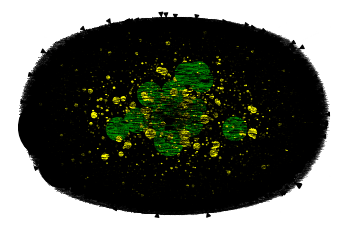

In [17]:
#Getting all the weights of each edge (to be used for width of edges)
edges = G.edges()
edges_weights = [G[u][v]['weight'] for u,v in edges]

# Loop through every betweenness centrality measure, and for each key/node,
# loop through all nodes of the sub_graph, and for each node,
# compare the centrality measure key with the node. If a match is found, then append its measure to the list.
graph_node_size = []
for key in bet_cen.keys():
    for element in G.nodes():
        if (key == element):
            graph_node_size.append(bet_cen[key]*3000000) # appending
            
# Generating a colour map for nodes according to their betweenness            
average = mean(nSize)
color_map = ['green' if(element>average) else 'yellow' for element in graph_node_size]
pos = nx.spring_layout(G) #layout of graph

#Drawing graph
nx.draw_networkx_nodes(G, pos, node_color=color_map, node_size=graph_node_size) #nodes - size # colour according to betwenness centrality
nx.draw_networkx_edges(G, pos, width=edges_weights) #edges - width according to weights
nx.draw_networkx_labels(G, pos, font_size=0.5, font_family="sans-serif") #labelling nodes

ax = plt.gca()
ax.margins(0)
plt.axis("off")
#plt.tight_layout()
plt.show() #outputting

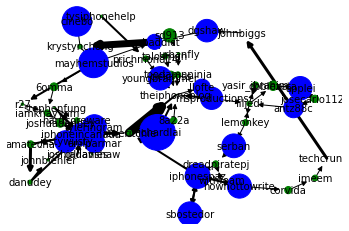

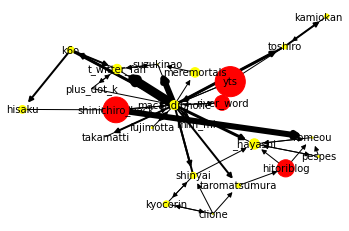

In [16]:
import math
# importing mean() 
from statistics import mean

# Sorting the connected components in descending order
scc = sorted(nx.strongly_connected_components(G), key=len, reverse=True)
        
sub_graph = G.subgraph(scc[0]) #getting the largest component and extracting its subgraph


#Getting all the weights of each edge (to be used for width of edges)
edges = sub_graph.edges()
edges_weights=[sub_graph[u][v]['weight'] for u,v in edges]

# Calculating the node size of each node (used for plotting) according to their betweenness centrality measure 
nSize = []
for key in bet_cen.keys():
    for element in sub_graph.nodes():
        if (key == element):
            nSize.append(bet_cen[key]*3000000)
            
# Generating a colour map for nodes according to their betweenness         
average = mean(nSize)
color_map = ['blue' if(element>average) else 'green' for element in nSize]          
            
# Draw            
pos = nx.kamada_kawai_layout(sub_graph) # graph layout        
nx.draw_networkx_nodes(sub_graph, pos, node_color=color_map, node_size = nSize) #nodes - size according to betwenness centrality
nx.draw_networkx_edges(sub_graph, pos, width=edges_weights) #edges - width according to weights
nx.draw_networkx_labels(sub_graph, pos, font_size=10, font_family="sans-serif") #labelling nodes

ax = plt.gca()
ax.margins(0)
plt.axis("off")
plt.show() #printing graph


# Plotting the second largest component graph

sub_graph2 = G.subgraph(scc[1])

#Getting all the weights of each edge (to be used for width of edges)
edges = sub_graph2.edges()
edges_weights=[sub_graph2[u][v]['weight'] for u,v in edges]

nSize = []
for key in bet_cen.keys():
    for element in sub_graph2.nodes():
        if (key == element):
            nSize.append(bet_cen[key]*100000000)
            
# Generating a colour map for nodes according to their betweenness            
average = mean(nSize)
color_map = ['red' if(element>average) else 'yellow' for element in nSize]            

pos = nx.kamada_kawai_layout(sub_graph2) # graph layout
nx.draw_networkx_nodes(sub_graph2, pos, node_color=color_map, node_size = nSize) #nodes
nx.draw_networkx_edges(sub_graph2, pos, width=edges_weights) #edges
nx.draw_networkx_labels(sub_graph2, pos, font_size=10, font_family="sans-serif") #labelling nodes

ax = plt.gca()
ax.margins(0)
plt.axis("off")
plt.show() #outputting


## ----------------------------------------- END -----------------------------------------